

# Fast Segment Anything Model (FastSAM) to genarate masks for NIO

based on: https://github.com/roboflow/notebooks
---


The Fast Segment Anything Model (FastSAM) is a CNN Segment Anything Model trained by only 2% of the SA-1B dataset published by SAM authors.

![fast-segment-anything-model-figure-1](https://media.roboflow.com/notebooks/examples/fast-sam-figure-1.png)

The FastSAM authors claim it achieves comparable performance to the SAM method at 50 times the speed.





## 1. check if we have access to GPU

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Thu Sep  5 10:30:42 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

 ### add google disc

In [ ]:
## add google disc
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
HOME = '/content/drive/MyDrive/NIO/NIO_PROJEKT/' #os.getcwd()
print("HOME:", HOME)

HOME: /content/drive/MyDrive/NIO/NIO_PROJEKT/


### Install FastSAM, SAM, and other dependencies on google drive

In [ ]:
%cd {HOME}

# install FastSAM
!git clone https://github.com/CASIA-IVA-Lab/FastSAM.git
!pip -q install -r FastSAM/requirements.txt
# install CLIP
!pip -q install git+https://github.com/openai/CLIP.git
# install SAM
!pip -q install git+https://github.com/facebookresearch/segment-anything.git
# install other dependencies
!pip -q install roboflow supervision jupyter_bbox_widget

/content/drive/MyDrive/NIO/NIO_PROJEKT
fatal: destination path 'FastSAM' already exists and is not an empty directory.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 71.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.7/611.7 kB 31.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.7/318.7 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.4/93.4 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━

## Download FastSAM and SAM weights

In [ ]:
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://huggingface.co/spaces/An-619/FastSAM/resolve/main/weights/FastSAM.pt
!wget -P {HOME}/weights -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!ls -lh {HOME}/weights

total 4.3G
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.1
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.10
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.11
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.12
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.13
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.2
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.3
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.4
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.5
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.6
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.7
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.8
-rw------- 1 root root 139M Jun 20  2023 FastSAM.pt.9
-rw------- 1 root root 2.4G Apr  4  2023 sam_vit_h_4b8939.pth


In [ ]:
FAST_SAM_CHECKPOINT_PATH = f"{HOME}/weights/FastSAM.pt"
SAM_SAM_CHECKPOINT_PATH = f"{HOME}/weights/sam_vit_h_4b8939.pth"

In [ ]:
!mkdir -p {HOME}/data


## Imports

**NOTE:** `FastSAM` code is not distributed via `pip` not it is packaged. Make sure to run code balow from `{HOME}/FastSAM` directory. ⚠️

In [ ]:
%cd {HOME}/FastSAM

import os
import cv2
import torch
#import roboflow
import base64

import supervision as sv
import numpy as np

#from roboflow import Roboflow
from fastsam import FastSAM, FastSAMPrompt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

/content/drive/MyDrive/NIO/NIO_PROJEKT/FastSAM


## Load FastSAM

In [ ]:
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

fast_sam = FastSAM(FAST_SAM_CHECKPOINT_PATH)

## FastSAM inference

* `retina_masks=True` determines whether the model uses retina masks for generating segmentation masks.
* `imgsz=1024` sets the input image size to 1024x1024 pixels for processing by the model.
* `conf=0.4` sets the minimum confidence threshold for object detection.
* `iou=0.9` sets the minimum intersection over union threshold for non-maximum suppression to filter out duplicate detections.

**NOTE:** `prompt_process.everything_prompt` returns `torch.Tensor`

### install packages

In [ ]:
!pip install  matplotlib


In [ ]:
!pip install -U scikit-image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.9/14.9 MB 91.8 MB/s eta 0:00:00
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.23.2
    Uninstalling scikit-image-0.23.2:
      Successfully uninstalled scikit-image-0.23.2


In [ ]:
import skimage
from skimage.draw import disk
from skimage import measure                                # (pip install scikit-image)
import matplotlib.pyplot as plt
import json
from shapely.geometry import Polygon, MultiPolygon
import pandas as pd
import pandas as pd
from skimage import measure
import csv


# EXPERYMENT
---



In [ ]:
def annotate_image(image_path: str, masks: np.ndarray) -> np.ndarray:
    image = cv2.imread(image_path)

    xyxy = sv.mask_to_xyxy(masks=masks)
    detections = sv.Detections(xyxy=xyxy, mask=masks)
    mask_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)
    #mask_annotator = sv.MaskAnnotator()
    return mask_annotator.annotate(scene=image.copy(), detections=detections)

In [ ]:
IMAGE_PATH = f"/content/drive/MyDrive/fl/im20_small.png"# f"/content/drive/MyDrive/NIO/extra_patches/23-1-1_ROI_101_59.png"
#f"{HOME}/data/23-1-1_ROI_1_0.png"

In [ ]:
results = fast_sam(
    source=IMAGE_PATH,
    device=DEVICE,
    retina_masks=True,
    imgsz=1024,
    conf=0.1,
    iou=0.1)
prompt_process = FastSAMPrompt(IMAGE_PATH, results, device=DEVICE)
masks = prompt_process.everything_prompt()
#prompt_process.plot(annotations=masks, output_path=f"{HOME}")



image 1/1 /content/drive/MyDrive/fl/im20_small.png: 1024x1024 29 objects, 174.2ms
Speed: 24.7ms preprocess, 174.2ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)


array([[[220,  96, 148],
        [220,  96, 152],
        [220,  96, 156],
        ...,
        [205, 195, 238],
        [183, 164, 219],
        [175, 141, 205]],

       [[222,  94, 144],
        [222,  96, 149],
        [220,  97, 155],
        ...,
        [220, 217, 249],
        [193, 184, 235],
        [181, 157, 221]],

       [[224,  94, 144],
        [224,  96, 150],
        [223,  98, 154],
        ...,
        [227, 229, 247],
        [209, 205, 246],
        [197, 181, 235]],

       ...,

       [[213, 151, 181],
        [214, 156, 184],
        [207, 159, 185],
        ...,
        [216, 157, 177],
        [218, 162, 181],
        [222, 164, 189]],

       [[211, 154, 179],
        [215, 163, 186],
        [213, 169, 192],
        ...,
        [218, 177, 192],
        [226, 180, 202],
        [227, 179, 207]],

       [[213, 158, 183],
        [217, 170, 192],
        [214, 173, 194],
        ...,
        [226, 193, 207],
        [233, 199, 216],
        [233, 192, 219]]], dtype=uint8)
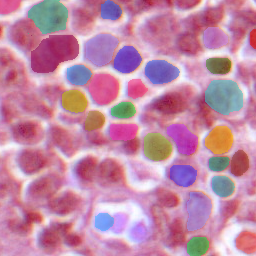

In [ ]:
masks = masks.cpu().numpy().astype(bool)
annotated_image=annotate_image(image_path=IMAGE_PATH, masks=masks)
annotated_image

array([[[190, 110, 133],
        [189, 112, 140],
        [189, 112, 150],
        ...,
        [205, 195, 238],
        [183, 164, 219],
        [175, 141, 205]],

       [[193, 106, 126],
        [193, 110, 135],
        [190, 113, 147],
        ...,
        [220, 217, 249],
        [193, 184, 235],
        [181, 157, 221]],

       [[196, 106, 125],
        [198, 112, 136],
        [195, 115, 146],
        ...,
        [227, 229, 247],
        [209, 205, 246],
        [197, 181, 235]],

       ...,

       [[213, 151, 181],
        [214, 156, 184],
        [207, 159, 185],
        ...,
        [216, 157, 177],
        [218, 162, 181],
        [222, 164, 189]],

       [[211, 154, 179],
        [215, 163, 186],
        [213, 169, 192],
        ...,
        [218, 177, 192],
        [226, 180, 202],
        [227, 179, 207]],

       [[213, 158, 183],
        [217, 170, 192],
        [214, 173, 194],
        ...,
        [226, 193, 207],
        [233, 199, 216],
        [233, 192, 219]]], dtype=uint8)
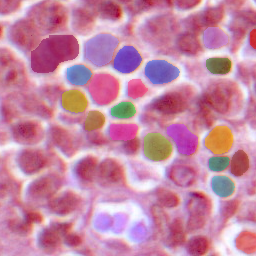

In [ ]:
annotated_image


image 1/1 /content/drive/MyDrive/fl/im20_small.png: 1024x1024 18 objects, 182.1ms
Speed: 5.1ms preprocess, 182.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)


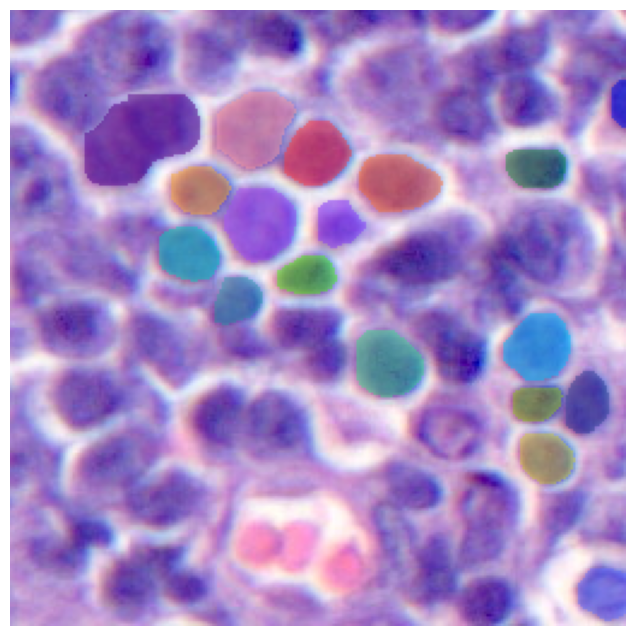

In [ ]:
masks= run_FSAM(IMAGE_PATH)
show_res(IMAGE_PATH,masks )




## DETECT CELLS- EMPTY IMAGES (WITHOUT ANNOTATIONS)

### SUPPORT FUNCTIONS

In [ ]:
# suppoert functions
def run_FSAM(IMAGE_PATH):
  results = fast_sam(
      source=IMAGE_PATH,
      device=DEVICE,
      retina_masks=True,
      imgsz=1024,
      conf=0.3,
      iou=0.5)
  prompt_process = FastSAMPrompt(IMAGE_PATH, results, device=DEVICE)
  masks = prompt_process.everything_prompt()
  return masks

def annotate_image(image_path: str, masks: np.ndarray) -> np.ndarray:
    image = cv2.imread(image_path)

    xyxy = sv.mask_to_xyxy(masks=masks)
    detections = sv.Detections(xyxy=xyxy, mask=masks)
    mask_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)
    #mask_annotator = sv.MaskAnnotator()
    return mask_annotator.annotate(scene=image.copy(), detections=detections)


def show_res(IMAGE_PATH,masks ):
  masks = masks.cpu().numpy().astype(bool)
  annotated_image=annotate_image(image_path=IMAGE_PATH, masks=masks)
  # sv.plot_image(image=annotated_image, size=(8, 8))

  sv.plot_image(image=annotated_image, size=(8,8))

def create_image_annotation(file_name, width, height, image_id):
    images = {
        "file_name": file_name,
        "height": height,
        "width": width,
        "id": image_id
    }
    return images

def create_annotation_format(polygon, segmentation, image_id, category_id, annotation_id):
    min_x, min_y, max_x, max_y = polygon.bounds
    width = max_x - min_x
    height = max_y - min_y
    bbox = (min_x, min_y, width, height)
    area = polygon.area

    annotation = {
        "segmentation": segmentation,
        "area": area,
        "iscrowd": 0,
        "image_id": image_id,
        "bbox": bbox,
        "category_id": category_id,
        "id": annotation_id
    }

    return annotation

def mask_to_bbox(mask):

  bbox = measure.regionprops((my_mask*1).astype('int'))
  #print(bbox[0].bbox)
  return bbox[0].bbox


def show_bbox(image,my_bbox ):
    fig, ax = plt.subplots()
    ax.imshow(image, cmap=plt.cm.gray)

    minr, minc, maxr, maxc = my_bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)
    ax.plot(bx, by, '-r', linewidth=2.5)
    plt.show()

def create_annotation_format(polygon, segmentation, image_id, category_id, annotation_id):
    min_x, min_y, max_x, max_y = polygon.bounds
    width = max_x - min_x
    height = max_y - min_y
    bbox = (min_x, min_y, width, height)
    area = polygon.area

    annotation = {
        "segmentation": segmentation,
        "area": area,
        "iscrowd": 0,
        "image_id": image_id,
        "bbox": bbox,
        "category_id": category_id,
        "id": annotation_id
    }

    return annotation

def create_image_annotation(file_name, width, height, image_id):
    images = {
        "file_name": file_name,
        "height": height,
        "width": width,
        "id": image_id
    }
    return images

def create_category_annotation(category_dict):
    category_list = []

    for key, value in category_dict.items():
        category = {
            "supercategory": key,
            "id": value,
            "name": key
        }
        category_list.append(category)

    return category_list

def create_sub_mask_annotation(sub_mask):
    # Find contours (boundary lines) around each sub-mask
    # Note: there could be multiple contours if the object
    # is partially occluded. (E.g. an elephant behind a tree)

    contours = measure.find_contours(np.array(sub_mask), 0.5, positive_orientation="low")

    polygons = []
    segmentations = []
    for contour in contours:
        # Flip from (row, col) representation to (x, y)
        # and subtract the padding pixel
        for i in range(len(contour)):
            row, col = contour[i]
            contour[i] = (col - 1, row - 1)

        # Make a polygon and simplify it
        if len(contour)<3:
            continue
        poly = Polygon(contour)
        poly = poly.simplify(1.0, preserve_topology=False)

        if(poly.is_empty):
            # Go to next iteration, dont save empty values in list
            continue
        if poly.geom_type == 'MultiPolygon':
            print('MultiPolygon!!!!!')
            # do multipolygon things.
        elif poly.geom_type == 'Polygon':

            polygons.append(poly)

            segmentation = np.array(poly.exterior.coords).ravel().tolist()
            segmentations.append(segmentation)

    return polygons, segmentations

def get_coco_json_format():
    # Standard COCO format
    coco_format = {
        "info": {},
        "licenses": [],
        "images": [{}],
        "categories": [{}],
        "annotations": [{}]
    }

    return coco_format

### main code - patches without annotations

 update paths!

In [ ]:
#paths
image_path= f'/content/drive/MyDrive/NIO/extra_patches'
result_image_path = "/content/drive/MyDrive/NIO/results_SAM_extra/"
path_to_save_res= "/content/drive/MyDrive/NIO/"
bbox_file_name ="bbox_annotations_extra_patches_23-1-4"


annotations = []
all_bboxes = []

coco_images = []
annotation_id=0

roi_list = os.listdir(image_path)
#dla kazdego ROI/obrazka
for roi_idd in range (0, len(roi_list)):

  total_id=0

  roi_basic_name = roi_list[roi_idd]
  IMAGE_PATH =  f"/content/drive/MyDrive/NIO/extra_patches/{roi_basic_name}"
  result_path_mask = result_image_path + roi_basic_name[:-4]+ '_mask.png'

 # read image
  print(roi_basic_name)
  image = cv2.imread(IMAGE_PATH)
  image=image[:,:,::-1]# bgr--> rgb
  patch_size=np.shape(image)

  final_mask=np.zeros([patch_size[0],patch_size[1]])


  # generate cell masks
  masks= run_FSAM(IMAGE_PATH)
  if np.shape(masks)[0]<1:
    continue

  masks = masks.cpu().numpy().astype(bool)

  #show_res(IMAGE_PATH,masks )

  # dla kazdej wykrytej maski
  nb_of_mask=np.shape(masks)[0]
  if nb_of_mask>0:

    for mask_id in range (0,nb_of_mask):
      total_id+=1
      my_mask=masks[mask_id,:,:]

      # check if size is not too big to be a cell
      radius_value=12
      bbox_size=(radius_value*2)*(radius_value*2)
      if np.sum(my_mask[:,:])>(bbox_size*3):
        print('obszar na wyznaczonej masce jest zbyt duzy by byc komorka : ',np.sum(my_mask[:,:]), 'bbox',  bbox_size)
        my_mask[:,:]=0
      elif np.sum(my_mask[:,:])<(bbox_size/10):
        print('obszar na wyznaczonej masce jest zbyt maly by byc komorka : ',np.sum(my_mask[:,:]), 'bbox',  bbox_size)
        my_mask[:,:]=0
      else:
        # add to bbox
        my_bbox = mask_to_bbox(my_mask)

        minr, minc, maxr, maxc = my_bbox
        all_bboxes.append([roi_basic_name,total_id,minr, minc, maxr, maxc,'', '']) # roi_basic_name, total_id, bbox coords (min_row, min_col, max_row, max_col), class, mask_type(1- sam, 2-fixed)

        # TO SHOW BBOX
        #show_bbox(image,my_bbox )

        # add to coco
#        polygons, segmentations = create_sub_mask_annotation(my_mask)
#        segmentation = [np.array(polygons[0].exterior.coords).ravel().tolist()]
#        annotation = create_annotation_format(polygons[0], segmentation, total_id, '', annotation_id)
#        annotations.append(annotation)
#        annotation_id += 1

        # add to final mask
        final_mask[my_mask > 0] = 1


  # show final mask
 # print('FINAL MASK!!!')
 # plt.imshow(final_mask)
 # plt.show()
 # plt.imsave(result_path_mask, final_mask)

# save bboxes as csv
header = ['roi_basic_name', 'total_id','min_row', 'min_col', 'max_row', 'max_col', 'type', 'mask_type']
csv_file= path_to_save_res+bbox_file_name+'.csv'

with open(csv_file, 'w', encoding='UTF8', newline='') as f:
  writer = csv.writer(f)

  # write the header
  writer.writerow(header)

  # write multiple rows
  writer.writerows(all_bboxes)

print('!!!!!!!!!!! DONE !!!!!!!!!!!!!!')


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/NIO/extra_patches'

## GENERATE MASKS FOR ANNOTATIONS

### functions

In [ ]:
def create_sub_mask_annotation(sub_mask):
    # Find contours (boundary lines) around each sub-mask
    # Note: there could be multiple contours if the object
    # is partially occluded. (E.g. an elephant behind a tree)

    contours = measure.find_contours(np.array(sub_mask), 0.5, positive_orientation="low")

    polygons = []
    segmentations = []
    for contour in contours:
        # Flip from (row, col) representation to (x, y)
        # and subtract the padding pixel
        for i in range(len(contour)):
            row, col = contour[i]
            contour[i] = (col - 1, row - 1)

        # Make a polygon and simplify it
        if len(contour)<3:
            continue
        poly = Polygon(contour)
        poly = poly.simplify(1.0, preserve_topology=False)

        if(poly.is_empty):
            # Go to next iteration, dont save empty values in list
            continue
        if poly.geom_type == 'MultiPolygon':
            print('MultiPolygon!!!!!')
            # do multipolygon things.
        elif poly.geom_type == 'Polygon':

            polygons.append(poly)

            segmentation = np.array(poly.exterior.coords).ravel().tolist()
            segmentations.append(segmentation)

    return polygons, segmentations

def get_coco_json_format():
    # Standard COCO format
    coco_format = {
        "info": {},
        "licenses": [],
        "images": [{}],
        "categories": [{}],
        "annotations": [{}]
    }

    return coco_format

def create_category_annotation(category_dict):
    category_list = []

    for key, value in category_dict.items():
        category = {
            "supercategory": key,
            "id": value,
            "name": key
        }
        category_list.append(category)

    return category_list

def create_image_annotation(file_name, width, height, image_id):
    images = {
        "file_name": file_name,
        "height": height,
        "width": width,
        "id": image_id
    }
    return images

def create_annotation_format(polygon, segmentation, image_id, category_id, annotation_id):
    min_x, min_y, max_x, max_y = polygon.bounds
    width = max_x - min_x
    height = max_y - min_y
    bbox = (min_x, min_y, width, height)
    area = polygon.area

    annotation = {
        "segmentation": segmentation,
        "area": area,
        "iscrowd": 0,
        "image_id": image_id,
        "bbox": bbox,
        "category_id": category_id,
        "id": annotation_id
    }

    return annotation

def mask_to_bbox(mask):

  bbox = measure.regionprops((my_mask*1).astype('int'))
  print(bbox[0].bbox)
  return bbox[0].bbox

def show_bbox(image,my_bbox ):
    fig, ax = plt.subplots()
    ax.imshow(image, cmap=plt.cm.gray)

    minr, minc, maxr, maxc = my_bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)
    ax.plot(bx, by, '-r', linewidth=2.5)
    plt.show()

In [ ]:
  points = df[df["roi"]==roi_list[roi_idd]][["px","py","type"]] # read point annotations
  #points.sort_values( by="type", ascending=False,inplace=True ) # sort by cell type (3-other,2,1)
  points['type'] = pd.Categorical(points['type'], [3, 1, 2])# sort by cell type (3-other,1,2)
  points.sort_values("type",inplace=True )

In [ ]:
points = df[df["roi"]==roi_list[roi_idd]][["px","py","type"]]

In [ ]:
points['type'] = pd.Categorical(points['type'], [3, 1, 2])

In [ ]:
points.sort_values("type",inplace=True )

In [ ]:
points[['px', 'py', 'type']] = points[['px', 'py', 'type']].apply(pd.to_numeric)

In [ ]:
import skimage
from skimage.draw import disk
from skimage import measure                                # (pip install scikit-image)
import matplotlib.pyplot as plt
import json
from shapely.geometry import Polygon, MultiPolygon
import pandas as pd
import pandas as pd
from skimage import measure
import csv


def annotate_image(image_path: str, masks: np.ndarray) -> np.ndarray:
    image = cv2.imread(image_path)

    xyxy = sv.mask_to_xyxy(masks=masks)
    detections = sv.Detections(xyxy=xyxy, mask=masks)

    mask_annotator = sv.MaskAnnotator()
    return mask_annotator.annotate(scene=image.copy(), detections=detections)

def detect_by_point(IMAGE_PATH, point):
  results = fast_sam(
    source=IMAGE_PATH,
    device=DEVICE,
    retina_masks=True,
    imgsz=1024,
    conf=0.2,
    iou=0.3)
  prompt_process = FastSAMPrompt(IMAGE_PATH, results, device=DEVICE)
  mask = prompt_process.point_prompt(points=[point[0:2]], pointlabel=[point[2]])

  return mask

def show_res(IMAGE_PATH,mask,point ):
  annotated_image=annotate_image(image_path=IMAGE_PATH, masks=mask)
  # sv.plot_image(image=annotated_image, size=(8, 8))

  collors=["yellow","green", "c"]
  plt.plot(point[0], point[1], marker='v', color=collors[point[2]-1])

  plt.imshow(annotated_image[:,:,::-1])
  plt.show()

def detect_by_bbox(IMAGE_PATH, point):

  radius=[8,12,10]# kom sa roznych rozmiarow
  radius_value = radius[int(point[2])-1] # wybierz rozmiar promienia dla typu komorki
  default_box = {'x': point[0]-radius_value, 'y': point[1]-radius_value, 'width': radius_value*2, 'height': radius_value*2, 'label': ''}
  box = default_box# widget.bboxes[0] if widget.bboxes else default_box
  box = [
      box['x'],
      box['y'],
      box['x'] + box['width'],
      box['y'] + box['height']
  ]

  results = fast_sam(
      source=IMAGE_PATH,
      device=DEVICE,
      retina_masks=True,
      imgsz=1024,
      conf=0.3,
      iou=0.5)
  prompt_process = FastSAMPrompt(IMAGE_PATH, results, device=DEVICE)
  mask2 = prompt_process.box_prompt(bbox=box)

  # check if size is not too big to be a cell
  bbox_size=(radius_value*2)*(radius_value*2)
  if len(mask2)==0:
    print("nic nie wykryto!")
    mask2 = np.zeros([1,256,256])

  elif np.sum(mask2[0,:,:])>(bbox_size*3):
    print('obszar na wyznaczonej masce jest zbyt duzy by byc komorka : ',np.sum(mask2[0,:,:]), 'bbox',  bbox_size)
    mask2[0,:,:]=0

  return mask2

def detect_by_fixed_circle(image, point,patch_size):

    radius_values=[12,16,14, 14]# kom sa roznych rozmiarow

    rr, cc = disk((point[1],point[0]), radius=radius_values[point[2]-1], shape=[patch_size[0],patch_size[1]])
    image[rr, cc] = 255
    mask = np.zeros([1,256,256])
    mask[0,rr, cc] = 1

    #plt.plot(point[0], point[1], marker='v', color='red')
    #plt.imshow(image)
    #plt.show()

    return mask

def save_coco_annotations(coco_images,annotations,dataset,coco_file_name):

    coco_format = get_coco_json_format( )

    # Create category section
    category_ids={"Centrocyt":1,"Centroblast":2, "Inne":3  }
    coco_format["categories"] = create_category_annotation(category_ids)

    # Create images and annotations sections for test
    coco_format["images"]=coco_images
    coco_format["annotations"]=annotations

    json_file=coco_file_name+'_'+dataset+'.json'
    with open(json_file,"w") as outfile:
        json.dump(coco_format, outfile)

    print('Coco annotations are saved')

def read_points_form_csv(csv_file):

  df = pd.read_csv(csv_file) # read df
  df.drop('name', axis=1, inplace=True) # remove useless column
  df.drop('idd_sub_reg', axis=1, inplace=True) # remove useless column
  roi_list=df['roi'].unique() # read unique nameas of roi

  return df, roi_list

def read_points_form_csv_Adam(csv_file):

  df = pd.read_csv(csv_file) # read df
  roi_list=df['roi'].unique() # read unique nameas of roi

  return df, roi_list

points

## Main script to generate masks using SAM

- update all paths
- results will be saved on a google drive

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 180.8ms
Speed: 15.9ms preprocess, 180.8ms inference, 47.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 119, 96, 133)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 205.4ms
Speed: 31.5ms preprocess, 205.4ms inference, 26.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(132, 155, 155, 178)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 194.9ms
Speed: 6.4ms preprocess, 194.9ms inference, 21.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(141, 126, 163, 150)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 191.2ms
Speed: 35.8ms preprocess, 191.2ms inference, 16.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(175, 183, 193, 201)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 203.1ms
Speed: 35.9ms preprocess, 203.1ms inference, 16.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 119, 96, 143)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 187.1ms
Speed: 9.4ms preprocess, 187.1ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(166, 203, 189, 226)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 193.6ms
Speed: 6.1ms preprocess, 193.6ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 70, 133, 84)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 188.7ms
Speed: 21.3ms preprocess, 188.7ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 44, 147, 69)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 190.1ms
Speed: 6.5ms preprocess, 190.1ms inference, 12.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 41, 113, 68)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 189.2ms
Speed: 15.9ms preprocess, 189.2ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 26, 95, 49)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 193.2ms
Speed: 6.1ms preprocess, 193.2ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(68, 1, 91, 27)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 194.4ms
Speed: 4.8ms preprocess, 194.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 4, 117, 31)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 195.7ms
Speed: 5.7ms preprocess, 195.7ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 75, 181, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 194.5ms
Speed: 6.0ms preprocess, 194.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 97, 188, 120)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 196.1ms
Speed: 5.1ms preprocess, 196.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(187, 75, 203, 96)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 197.2ms
Speed: 4.8ms preprocess, 197.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 75, 181, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 194.8ms
Speed: 5.8ms preprocess, 194.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(233, 34, 256, 57)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 201.5ms
Speed: 5.1ms preprocess, 201.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 15, 256, 38)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 204.4ms
Speed: 5.0ms preprocess, 204.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(233, 133, 256, 156)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 202.0ms
Speed: 4.8ms preprocess, 202.0ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(237, 98, 256, 121)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 202.0ms
Speed: 5.0ms preprocess, 202.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 222, 91, 248)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 204.8ms
Speed: 4.9ms preprocess, 204.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 76, 32, 99)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 203.0ms
Speed: 4.8ms preprocess, 203.0ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 31, 125, 46)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 205.0ms
Speed: 5.2ms preprocess, 205.0ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 135, 129, 153)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 205.8ms
Speed: 4.8ms preprocess, 205.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(102, 162, 125, 185)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 202.5ms
Speed: 4.8ms preprocess, 202.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  840.0 bbox 256
fixed shape for a cell
(0, 232, 20, 255)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 204.5ms
Speed: 4.8ms preprocess, 204.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 0, 193, 17)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 204.2ms
Speed: 4.9ms preprocess, 204.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 0, 65, 15)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 204.5ms
Speed: 6.8ms preprocess, 204.5ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 14, 65, 37)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 202.2ms
Speed: 6.2ms preprocess, 202.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  804.0 bbox 256
fixed shape for a cell
(192, 35, 215, 58)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 204.2ms
Speed: 6.0ms preprocess, 204.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  804.0 bbox 256
fixed shape for a cell
(197, 18, 220, 41)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 201.8ms
Speed: 6.4ms preprocess, 201.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 7, 246, 30)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 201.1ms
Speed: 6.0ms preprocess, 201.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(177, 22, 191, 40)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 206.3ms
Speed: 6.2ms preprocess, 206.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 171, 109, 194)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 203.5ms
Speed: 6.2ms preprocess, 203.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 35, 164, 58)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 203.3ms
Speed: 4.9ms preprocess, 203.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 158, 61, 182)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 208.4ms
Speed: 4.8ms preprocess, 208.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 120, 231, 140)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 203.6ms
Speed: 4.8ms preprocess, 203.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(187, 122, 207, 145)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 206.7ms
Speed: 4.9ms preprocess, 206.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 146, 181, 169)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 201.5ms
Speed: 4.9ms preprocess, 201.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(222, 158, 244, 181)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 205.4ms
Speed: 5.0ms preprocess, 205.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 197, 239, 225)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 210.1ms
Speed: 4.9ms preprocess, 210.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 231, 237, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 204.8ms
Speed: 4.8ms preprocess, 204.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 226, 195, 249)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 205.6ms
Speed: 4.8ms preprocess, 205.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 232, 165, 254)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 200.7ms
Speed: 6.0ms preprocess, 200.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 170, 83, 188)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 202.8ms
Speed: 4.9ms preprocess, 202.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 239, 53, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 205.0ms
Speed: 5.1ms preprocess, 205.0ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 215, 32, 242)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 203.4ms
Speed: 4.9ms preprocess, 203.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 213, 63, 233)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 200.1ms
Speed: 5.3ms preprocess, 200.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  779.0 bbox 256
fixed shape for a cell
(30, 189, 53, 212)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 203.3ms
Speed: 5.1ms preprocess, 203.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(105, 207, 130, 231)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 195.8ms
Speed: 5.1ms preprocess, 195.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 191, 116, 214)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 194.1ms
Speed: 6.1ms preprocess, 194.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(228, 175, 251, 198)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 199.1ms
Speed: 5.7ms preprocess, 199.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 104, 144, 125)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 199.2ms
Speed: 5.1ms preprocess, 199.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 69, 104, 94)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 195.5ms
Speed: 6.6ms preprocess, 195.5ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 78, 75, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 195.0ms
Speed: 5.6ms preprocess, 195.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(21, 68, 42, 88)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 192.3ms
Speed: 5.2ms preprocess, 192.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 102, 28, 125)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 195.7ms
Speed: 4.9ms preprocess, 195.7ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  779.0 bbox 256
fixed shape for a cell
(50, 190, 73, 213)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 191.8ms
Speed: 6.3ms preprocess, 191.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 78, 75, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 189.9ms
Speed: 6.0ms preprocess, 189.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 120, 67, 147)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 191.1ms
Speed: 6.1ms preprocess, 191.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 112, 45, 135)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 195.0ms
Speed: 6.2ms preprocess, 195.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 104, 61, 124)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 190.3ms
Speed: 6.6ms preprocess, 190.3ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(192, 203, 212, 225)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 192.0ms
Speed: 6.3ms preprocess, 192.0ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 93, 100, 116)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 193.7ms
Speed: 5.7ms preprocess, 193.7ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 150, 141, 173)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 190.4ms
Speed: 4.9ms preprocess, 190.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(128, 182, 154, 217)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 190.6ms
Speed: 4.8ms preprocess, 190.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 173, 178, 183)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 191.2ms
Speed: 6.0ms preprocess, 191.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 142, 112, 167)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 188.4ms
Speed: 7.7ms preprocess, 188.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(187, 158, 213, 181)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 187.9ms
Speed: 6.8ms preprocess, 187.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 158, 61, 182)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 191.9ms
Speed: 6.6ms preprocess, 191.9ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 184, 178, 211)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 188.2ms
Speed: 5.8ms preprocess, 188.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 11, 137, 22)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 187.0ms
Speed: 6.7ms preprocess, 187.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(2, 144, 29, 171)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 189.2ms
Speed: 6.5ms preprocess, 189.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(7, 43, 32, 64)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(235, 120, 256, 147)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 188.9ms
Speed: 6.0ms preprocess, 188.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 60, 56, 79)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 186.5ms
Speed: 5.9ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 32, 43, 42)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 186.7ms
Speed: 6.9ms preprocess, 186.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 222, 91, 248)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 188.8ms
Speed: 5.3ms preprocess, 188.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 52, 72, 68)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 188.6ms
Speed: 5.2ms preprocess, 188.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(159, 16, 175, 28)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 181.1ms
Speed: 6.6ms preprocess, 181.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 205, 256, 232)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 189.5ms
Speed: 6.1ms preprocess, 189.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 83, 239, 111)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-2000.png: 1024x1024 64 objects, 187.5ms
Speed: 5.1ms preprocess, 187.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(212, 51, 239, 78)
FINAL MASK!!!


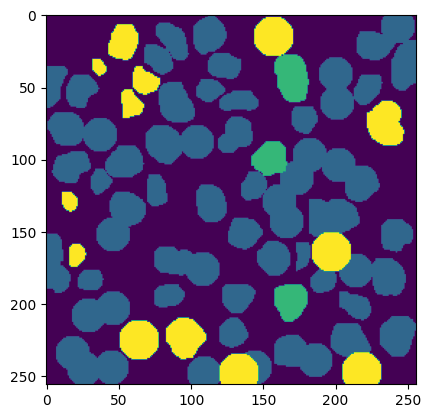

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 186.1ms
Speed: 6.9ms preprocess, 186.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 188, 62, 206)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 185.6ms
Speed: 4.9ms preprocess, 185.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(213, 131, 236, 154)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 181.9ms
Speed: 4.8ms preprocess, 181.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  795.0 bbox 256
fixed shape for a cell
(0, 149, 20, 172)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.2ms
Speed: 6.4ms preprocess, 182.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(228, 184, 251, 207)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 190.1ms
Speed: 4.8ms preprocess, 190.1ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(98, 212, 124, 231)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 197, 99, 224)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.9ms
Speed: 6.1ms preprocess, 178.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 233, 107, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.7ms
Speed: 8.1ms preprocess, 182.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 224, 82, 251)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 181.9ms
Speed: 6.3ms preprocess, 181.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(227, 155, 244, 174)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.9ms
Speed: 7.8ms preprocess, 178.9ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 68, 167, 82)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.9ms
Speed: 6.0ms preprocess, 182.9ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  779.0 bbox 256
fixed shape for a cell
(63, 147, 86, 170)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 185.6ms
Speed: 6.5ms preprocess, 185.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(234, 24, 256, 44)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.7ms
Speed: 5.1ms preprocess, 182.7ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 12, 229, 36)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 179.3ms
Speed: 6.4ms preprocess, 179.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(178, 13, 204, 33)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.3ms
Speed: 5.5ms preprocess, 180.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 32, 189, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 184.2ms
Speed: 5.5ms preprocess, 184.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 16, 163, 34)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.1ms
Speed: 5.8ms preprocess, 180.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(150, 0, 175, 17)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 181.3ms
Speed: 4.8ms preprocess, 181.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 39, 159, 62)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 6, 134, 30)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.7ms
Speed: 5.5ms preprocess, 182.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 3, 97, 29)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.9ms
Speed: 4.9ms preprocess, 183.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 0, 58, 22)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 184.0ms
Speed: 5.5ms preprocess, 184.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 50, 78, 70)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.7ms
Speed: 5.2ms preprocess, 180.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 166, 133, 189)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 185.2ms
Speed: 4.8ms preprocess, 185.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 23, 118, 44)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 181.6ms
Speed: 4.9ms preprocess, 181.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 231, 212, 254)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.8ms
Speed: 8.1ms preprocess, 183.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(198, 57, 216, 76)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.0ms
Speed: 4.9ms preprocess, 180.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 37, 216, 53)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.4ms
Speed: 6.1ms preprocess, 180.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 224, 82, 251)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 179.7ms
Speed: 5.8ms preprocess, 179.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 233, 107, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.1ms
Speed: 5.2ms preprocess, 178.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 237, 32, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.6ms
Speed: 4.8ms preprocess, 180.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 74, 139, 99)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 186.2ms
Speed: 4.7ms preprocess, 186.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  786.0 bbox 256
fixed shape for a cell
(114, 111, 137, 134)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 181.9ms
Speed: 4.8ms preprocess, 181.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(210, 162, 233, 185)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.5ms
Speed: 5.5ms preprocess, 177.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 150, 158, 173)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.7ms
Speed: 5.4ms preprocess, 178.7ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  786.0 bbox 256
fixed shape for a cell
(114, 128, 137, 151)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 184.4ms
Speed: 5.8ms preprocess, 184.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(23, 132, 49, 163)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 179.1ms
Speed: 7.4ms preprocess, 179.1ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 97, 24, 122)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.6ms
Speed: 6.2ms preprocess, 177.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 71, 42, 94)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.6ms
Speed: 6.5ms preprocess, 177.6ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 108, 58, 131)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.2ms
Speed: 6.2ms preprocess, 180.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 98, 83, 123)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.9ms
Speed: 6.2ms preprocess, 180.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(221, 232, 248, 255)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.0ms
Speed: 6.0ms preprocess, 177.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 73, 77, 95)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.7ms
Speed: 7.6ms preprocess, 178.7ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 93, 113, 115)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.2ms
Speed: 7.0ms preprocess, 177.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  779.0 bbox 256
fixed shape for a cell
(57, 124, 80, 147)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.2ms
Speed: 6.0ms preprocess, 180.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(81, 121, 104, 141)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.4ms
Speed: 5.9ms preprocess, 177.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 143, 116, 163)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 179.6ms
Speed: 5.8ms preprocess, 179.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 162, 61, 184)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.7ms
Speed: 4.7ms preprocess, 183.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 176, 88, 192)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.8ms
Speed: 5.0ms preprocess, 182.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 69, 105, 89)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.8ms
Speed: 4.9ms preprocess, 178.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 189, 221, 208)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.4ms
Speed: 5.6ms preprocess, 178.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(114, 233, 141, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 181.2ms
Speed: 4.7ms preprocess, 181.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(191, 112, 216, 135)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.8ms
Speed: 4.8ms preprocess, 183.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 189, 172, 212)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.7ms
Speed: 4.9ms preprocess, 177.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(159, 209, 184, 228)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.5ms
Speed: 5.6ms preprocess, 178.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 232, 182, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.5ms
Speed: 4.8ms preprocess, 183.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 218, 48, 238)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 185.0ms
Speed: 5.1ms preprocess, 185.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(219, 46, 246, 71)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.5ms
Speed: 4.8ms preprocess, 182.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(241, 76, 256, 94)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.3ms
Speed: 5.1ms preprocess, 183.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(175, 136, 202, 159)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 177.2ms
Speed: 5.0ms preprocess, 177.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(225, 78, 245, 104)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.5ms
Speed: 7.6ms preprocess, 178.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(220, 111, 250, 137)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 184.4ms
Speed: 4.7ms preprocess, 184.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(141, 99, 169, 121)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 185.0ms
Speed: 4.9ms preprocess, 185.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(162, 79, 186, 107)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.4ms
Speed: 6.1ms preprocess, 178.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(197, 88, 227, 114)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 176.8ms
Speed: 6.2ms preprocess, 176.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 218, 48, 238)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.3ms
Speed: 6.2ms preprocess, 178.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 5, 31, 32)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 179.4ms
Speed: 5.6ms preprocess, 179.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(209, 208, 236, 235)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.1ms
Speed: 4.9ms preprocess, 183.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(174, 157, 201, 184)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 180.6ms
Speed: 9.6ms preprocess, 180.6ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 147, 181, 174)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 182.4ms
Speed: 6.5ms preprocess, 182.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 197, 155, 224)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 178.4ms
Speed: 6.5ms preprocess, 178.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(8, 189, 35, 216)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0001.png: 1024x1024 56 objects, 183.1ms
Speed: 7.1ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(89, 43, 116, 70)
FINAL MASK!!!


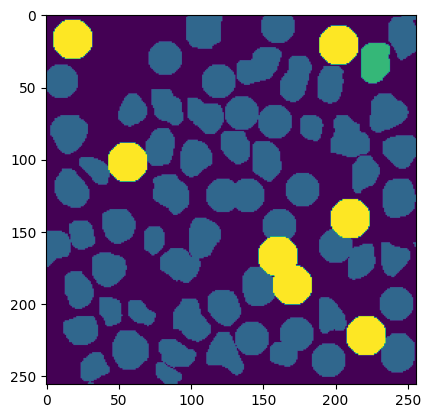

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 177.4ms
Speed: 6.0ms preprocess, 177.4ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 5, 177, 28)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 179.1ms
Speed: 12.6ms preprocess, 179.1ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 222, 82, 245)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 181.8ms
Speed: 6.6ms preprocess, 181.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 229, 69, 252)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 179.8ms
Speed: 4.9ms preprocess, 179.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 217, 23, 242)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 40, 51, 59)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.6ms
Speed: 5.5ms preprocess, 183.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 46, 116, 69)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 181.4ms
Speed: 7.4ms preprocess, 181.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 43, 92, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 179.4ms
Speed: 6.1ms preprocess, 179.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(206, 150, 230, 181)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 179.6ms
Speed: 6.6ms preprocess, 179.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(178, 156, 201, 179)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 179.5ms
Speed: 6.7ms preprocess, 179.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(181, 188, 210, 210)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 180.4ms
Speed: 5.5ms preprocess, 180.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 192, 128, 214)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.4ms
Speed: 6.1ms preprocess, 188.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 48, 189, 78)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 179.8ms
Speed: 7.8ms preprocess, 179.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(136, 27, 162, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 179.9ms
Speed: 5.6ms preprocess, 179.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 48, 189, 78)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1281.0 bbox 256
fixed shape for a cell
(49, 52, 72, 75)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.6ms
Speed: 4.8ms preprocess, 184.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 237, 113, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.7ms
Speed: 5.1ms preprocess, 185.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 85, 73, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 181.3ms
Speed: 6.4ms preprocess, 181.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  843.0 bbox 256
fixed shape for a cell
(16, 85, 39, 108)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 182.5ms
Speed: 6.9ms preprocess, 182.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 44, 236, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.7ms
Speed: 5.0ms preprocess, 188.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  819.0 bbox 256
fixed shape for a cell
(194, 124, 217, 147)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.1ms
Speed: 6.0ms preprocess, 183.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 12, 17, 42)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 186.6ms
Speed: 6.1ms preprocess, 186.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 199, 70, 222)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.3ms
Speed: 6.7ms preprocess, 184.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(84, 214, 107, 237)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.7ms
Speed: 4.8ms preprocess, 183.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 229, 245, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 182.2ms
Speed: 4.7ms preprocess, 182.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 130, 160, 153)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.6ms
Speed: 6.5ms preprocess, 183.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(162, 153, 181, 168)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.4ms
Speed: 6.9ms preprocess, 184.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  812.0 bbox 256
fixed shape for a cell
(138, 97, 161, 120)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 2, 132, 25)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 181.3ms
Speed: 6.2ms preprocess, 181.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 135, 29, 158)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 182.7ms
Speed: 8.4ms preprocess, 182.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 126, 49, 149)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.6ms
Speed: 10.3ms preprocess, 185.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 56, 146, 79)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 186.9ms
Speed: 8.0ms preprocess, 186.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(235, 79, 256, 99)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.1ms
Speed: 8.7ms preprocess, 184.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 209, 176, 228)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(23, 210, 47, 234)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 193, 135, 234)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 187.6ms
Speed: 5.1ms preprocess, 187.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 174, 184, 198)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.7ms
Speed: 6.0ms preprocess, 185.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 97, 204, 123)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.4ms
Speed: 4.9ms preprocess, 184.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 189, 163, 209)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 191.3ms
Speed: 5.6ms preprocess, 191.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 105, 136, 137)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.9ms
Speed: 7.6ms preprocess, 183.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 78, 161, 102)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.4ms
Speed: 6.3ms preprocess, 188.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(191, 51, 206, 74)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 186.4ms
Speed: 6.9ms preprocess, 186.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(135, 162, 158, 185)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 79, 202, 94)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 16, 232, 43)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 191.6ms
Speed: 6.4ms preprocess, 191.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(241, 43, 256, 65)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.2ms
Speed: 7.5ms preprocess, 185.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 44, 236, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 189.3ms
Speed: 4.9ms preprocess, 189.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 30, 192, 50)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.6ms
Speed: 6.7ms preprocess, 184.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 25, 212, 49)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 187.2ms
Speed: 6.7ms preprocess, 187.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(136, 27, 162, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 186.9ms
Speed: 7.7ms preprocess, 186.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 124, 240, 145)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.4ms
Speed: 6.9ms preprocess, 184.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 163, 136, 186)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 189.4ms
Speed: 7.2ms preprocess, 189.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 125, 178, 148)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 187.6ms
Speed: 6.4ms preprocess, 187.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 180, 95, 204)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 241, 213, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 189.6ms
Speed: 6.4ms preprocess, 189.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 229, 245, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.3ms
Speed: 7.2ms preprocess, 185.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(228, 208, 256, 232)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 190.2ms
Speed: 7.2ms preprocess, 190.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 231, 190, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 186.1ms
Speed: 6.0ms preprocess, 186.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 203, 218, 229)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 187.4ms
Speed: 10.1ms preprocess, 187.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(222, 183, 242, 203)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 186.1ms
Speed: 6.6ms preprocess, 186.1ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 127, 103, 150)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.4ms
Speed: 6.8ms preprocess, 188.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 0, 54, 15)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.9ms
Speed: 7.9ms preprocess, 188.9ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 99, 101, 124)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 70, 125, 91)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.3ms
Speed: 6.9ms preprocess, 185.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 146, 91, 168)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.8ms
Speed: 7.1ms preprocess, 188.8ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 162, 70, 184)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.7ms
Speed: 6.0ms preprocess, 188.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 18, 73, 39)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 191.2ms
Speed: 6.1ms preprocess, 191.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(233, 160, 256, 183)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 191.0ms
Speed: 5.8ms preprocess, 191.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 168, 15, 199)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.7ms
Speed: 11.8ms preprocess, 185.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 64, 29, 85)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 187.9ms
Speed: 5.4ms preprocess, 187.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 126, 69, 157)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 185.9ms
Speed: 14.1ms preprocess, 185.9ms inference, 14.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 5, 112, 32)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 189.9ms
Speed: 5.0ms preprocess, 189.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 80, 182, 107)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 192.5ms
Speed: 6.1ms preprocess, 192.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(15, 26, 30, 43)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 182.7ms
Speed: 10.2ms preprocess, 182.7ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 98, 227, 120)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 188.3ms
Speed: 7.1ms preprocess, 188.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 0, 250, 18)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 190.3ms
Speed: 4.9ms preprocess, 190.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 86, 37, 128)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0002.png: 1024x1024 62 objects, 189.2ms
Speed: 6.0ms preprocess, 189.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(28, 177, 55, 204)
FINAL MASK!!!


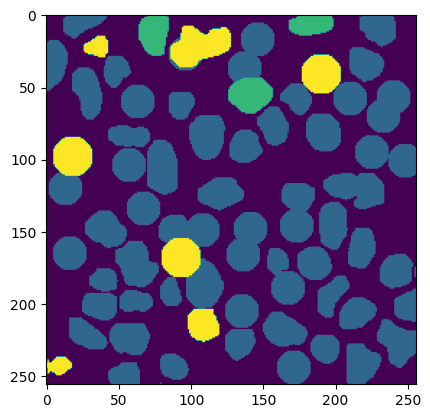

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(200, 61, 234, 89)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1181.0 bbox 256
fixed shape for a cell
(177, 60, 200, 83)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(236, 106, 256, 129)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 188.9ms
Speed: 6.7ms preprocess, 188.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 213, 256, 236)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.3ms
Speed: 6.9ms preprocess, 189.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(237, 237, 256, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.1ms
Speed: 5.5ms preprocess, 186.1ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 222, 187, 245)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 194.4ms
Speed: 6.1ms preprocess, 194.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(141, 89, 170, 113)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 188.2ms
Speed: 6.2ms preprocess, 188.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 90, 139, 111)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.8ms
Speed: 6.8ms preprocess, 189.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(232, 76, 256, 105)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 193.6ms
Speed: 6.4ms preprocess, 193.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(186, 142, 209, 165)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 184.4ms
Speed: 5.8ms preprocess, 184.4ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(184, 237, 207, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 190.7ms
Speed: 6.2ms preprocess, 190.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 135, 151, 158)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.3ms
Speed: 6.3ms preprocess, 189.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 213, 134, 239)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 190.4ms
Speed: 6.7ms preprocess, 190.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 13, 27, 36)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.0ms
Speed: 11.2ms preprocess, 185.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 0, 57, 26)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 188.5ms
Speed: 6.2ms preprocess, 188.5ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 166, 253, 189)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.9ms
Speed: 6.9ms preprocess, 189.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(220, 190, 243, 213)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.2ms
Speed: 6.8ms preprocess, 187.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 168, 230, 191)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.3ms
Speed: 9.2ms preprocess, 186.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 189, 87, 203)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.7ms
Speed: 6.0ms preprocess, 186.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 172, 111, 195)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 191.5ms
Speed: 7.2ms preprocess, 191.5ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(81, 103, 98, 120)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 190.5ms
Speed: 7.4ms preprocess, 190.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 109, 73, 132)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.5ms
Speed: 7.3ms preprocess, 185.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 106, 22, 129)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 190.1ms
Speed: 6.9ms preprocess, 190.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(226, 14, 250, 38)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.1ms
Speed: 5.7ms preprocess, 189.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 106, 232, 134)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 109, 186, 132)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 16, 72, 36)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.8ms
Speed: 6.4ms preprocess, 189.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(108, 66, 131, 89)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.0ms
Speed: 5.1ms preprocess, 185.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 79, 104, 102)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.4ms
Speed: 6.6ms preprocess, 185.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(68, 220, 91, 243)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.1ms
Speed: 7.4ms preprocess, 189.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 179, 62, 202)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.2ms
Speed: 5.9ms preprocess, 186.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 155, 47, 178)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.2ms
Speed: 6.4ms preprocess, 187.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 36, 52, 62)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.6ms
Speed: 6.9ms preprocess, 187.6ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 91, 207, 116)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 182.3ms
Speed: 9.3ms preprocess, 182.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 237, 247, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.3ms
Speed: 7.2ms preprocess, 186.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(184, 121, 208, 145)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.2ms
Speed: 6.8ms preprocess, 187.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 141, 102, 166)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 189.1ms
Speed: 6.2ms preprocess, 189.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 153, 131, 174)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 156, 161, 179)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.9ms
Speed: 5.4ms preprocess, 187.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 34, 230, 57)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.2ms
Speed: 6.8ms preprocess, 185.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 43, 255, 69)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(200, 9, 222, 27)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.7ms
Speed: 7.1ms preprocess, 185.7ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 135, 182, 155)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 182.8ms
Speed: 6.0ms preprocess, 182.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 30, 199, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 184.8ms
Speed: 6.6ms preprocess, 184.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 14, 165, 34)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.8ms
Speed: 8.4ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 33, 149, 57)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 183.8ms
Speed: 8.2ms preprocess, 183.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(98, 14, 120, 37)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.8ms
Speed: 6.9ms preprocess, 185.8ms inference, 7.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(62, 38, 80, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 182.8ms
Speed: 9.1ms preprocess, 182.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 56, 111, 78)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.5ms
Speed: 7.7ms preprocess, 187.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 63, 84, 83)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 55, 164, 81)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 188.2ms
Speed: 5.0ms preprocess, 188.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 130, 82, 153)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 183.6ms
Speed: 6.5ms preprocess, 183.6ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 162, 84, 184)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.8ms
Speed: 6.1ms preprocess, 187.8ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 73, 55, 96)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 183.9ms
Speed: 7.3ms preprocess, 183.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(182, 165, 205, 188)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.9ms
Speed: 5.7ms preprocess, 186.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 185, 137, 209)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 182.6ms
Speed: 6.7ms preprocess, 182.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 207, 167, 232)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.6ms
Speed: 6.1ms preprocess, 187.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 204, 74, 227)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 184.9ms
Speed: 5.6ms preprocess, 184.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 86, 76, 109)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 183, 24, 206)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 188, 36, 211)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.9ms
Speed: 6.5ms preprocess, 185.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(36, 223, 59, 246)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(86, 199, 111, 232)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.0ms
Speed: 4.9ms preprocess, 187.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 44, 22, 65)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 184.4ms
Speed: 6.1ms preprocess, 184.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 61, 29, 84)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.9ms
Speed: 6.1ms preprocess, 185.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 95, 30, 115)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 183.3ms
Speed: 5.8ms preprocess, 183.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 136, 59, 159)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 188.1ms
Speed: 6.0ms preprocess, 188.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(24, 115, 43, 133)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 184.2ms
Speed: 5.3ms preprocess, 184.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(14, 206, 41, 230)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 183.0ms
Speed: 5.7ms preprocess, 183.0ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 136, 19, 187)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 183.3ms
Speed: 4.7ms preprocess, 183.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 184, 180, 204)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 186.0ms
Speed: 7.3ms preprocess, 186.0ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 14, 120, 37)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 179.5ms
Speed: 6.1ms preprocess, 179.5ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 31, 117, 58)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 187.6ms
Speed: 6.8ms preprocess, 187.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(96, 105, 123, 132)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0003.png: 1024x1024 57 objects, 185.7ms
Speed: 6.5ms preprocess, 185.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(129, 108, 156, 135)
FINAL MASK!!!


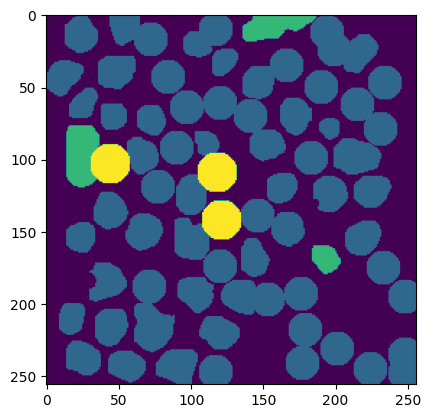

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.5ms
Speed: 11.2ms preprocess, 183.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 0, 245, 15)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.1ms
Speed: 10.2ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 45, 77, 68)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 184.3ms
Speed: 6.0ms preprocess, 184.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 57, 45, 80)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 184.5ms
Speed: 6.5ms preprocess, 184.5ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 142, 122, 165)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 179.6ms
Speed: 8.5ms preprocess, 179.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 82, 143, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.5ms
Speed: 6.8ms preprocess, 183.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 41, 227, 63)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.8ms
Speed: 7.1ms preprocess, 180.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 131, 68, 146)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.7ms
Speed: 5.2ms preprocess, 180.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 226, 80, 249)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 187.9ms
Speed: 6.8ms preprocess, 187.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 230, 52, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 200, 48, 223)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 186.4ms
Speed: 4.8ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(219, 219, 241, 241)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.8ms
Speed: 6.3ms preprocess, 180.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 184, 234, 205)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.7ms
Speed: 5.0ms preprocess, 183.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 144, 163, 167)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.7ms
Speed: 5.4ms preprocess, 182.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(3, 117, 26, 140)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.7ms
Speed: 6.1ms preprocess, 185.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 155, 24, 170)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.9ms
Speed: 4.8ms preprocess, 185.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 240, 176, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.3ms
Speed: 7.6ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 191, 98, 214)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.7ms
Speed: 7.1ms preprocess, 183.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(226, 47, 249, 70)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.8ms
Speed: 4.7ms preprocess, 180.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(201, 19, 225, 40)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.8ms
Speed: 7.5ms preprocess, 182.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 20, 92, 43)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.1ms
Speed: 7.1ms preprocess, 181.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 0, 139, 19)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.3ms
Speed: 6.1ms preprocess, 185.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 65, 195, 88)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 179.8ms
Speed: 6.3ms preprocess, 179.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 240, 176, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.4ms
Speed: 11.7ms preprocess, 181.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 70, 79, 86)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 179.0ms
Speed: 10.9ms preprocess, 179.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 171, 82, 194)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.1ms
Speed: 7.2ms preprocess, 185.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 217, 100, 240)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 189.3ms
Speed: 4.7ms preprocess, 189.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 24, 70, 47)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.7ms
Speed: 7.2ms preprocess, 182.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 89, 170, 117)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 188.4ms
Speed: 6.2ms preprocess, 188.4ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 50, 141, 77)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.0ms
Speed: 11.6ms preprocess, 183.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(96, 109, 126, 137)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.2ms
Speed: 8.4ms preprocess, 183.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 0, 213, 17)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.7ms
Speed: 6.7ms preprocess, 181.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(167, 12, 191, 36)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.3ms
Speed: 11.7ms preprocess, 180.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 31, 176, 55)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.7ms
Speed: 6.3ms preprocess, 181.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 1, 160, 22)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.1ms
Speed: 6.2ms preprocess, 181.1ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 28, 114, 64)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 179.9ms
Speed: 6.5ms preprocess, 179.9ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 0, 113, 23)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.1ms
Speed: 4.9ms preprocess, 181.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 9, 100, 32)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.2ms
Speed: 6.1ms preprocess, 185.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(60, 4, 83, 27)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.5ms
Speed: 6.2ms preprocess, 180.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 0, 50, 35)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.7ms
Speed: 5.1ms preprocess, 182.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 70, 227, 92)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 187.1ms
Speed: 5.0ms preprocess, 187.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 117, 160, 140)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.7ms
Speed: 7.0ms preprocess, 180.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 106, 194, 132)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 184.6ms
Speed: 7.2ms preprocess, 184.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(224, 134, 256, 155)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.9ms
Speed: 5.3ms preprocess, 185.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 88, 213, 111)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.3ms
Speed: 6.4ms preprocess, 180.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  845.0 bbox 256
fixed shape for a cell
(40, 74, 63, 97)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 186.3ms
Speed: 8.4ms preprocess, 186.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 137, 142, 160)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.7ms
Speed: 6.5ms preprocess, 181.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 134, 106, 157)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 184.9ms
Speed: 7.1ms preprocess, 184.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 146, 89, 169)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.7ms
Speed: 7.3ms preprocess, 182.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 195, 75, 218)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.4ms
Speed: 6.1ms preprocess, 180.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 173, 64, 196)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.3ms
Speed: 6.0ms preprocess, 182.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 115, 60, 137)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 188.5ms
Speed: 6.1ms preprocess, 188.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(203, 109, 233, 133)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.1ms
Speed: 7.1ms preprocess, 182.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(62, 108, 88, 131)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 48, 114, 63)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 186.0ms
Speed: 7.1ms preprocess, 186.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 24, 146, 47)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.1ms
Speed: 7.0ms preprocess, 181.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 80, 121, 97)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.4ms
Speed: 8.4ms preprocess, 185.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 62, 162, 87)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.0ms
Speed: 6.0ms preprocess, 183.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 88, 105, 108)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.6ms
Speed: 6.4ms preprocess, 185.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 88, 25, 111)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.3ms
Speed: 6.2ms preprocess, 181.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 231, 124, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 188.0ms
Speed: 6.1ms preprocess, 188.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 171, 110, 198)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(96, 218, 123, 245)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 26, 38, 53)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.9ms
Speed: 6.1ms preprocess, 181.9ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 218, 25, 245)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.5ms
Speed: 6.1ms preprocess, 181.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(209, 151, 236, 178)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 183.1ms
Speed: 6.1ms preprocess, 183.1ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 186, 204, 213)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.6ms
Speed: 6.3ms preprocess, 181.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 44, 187, 71)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 180.3ms
Speed: 9.4ms preprocess, 180.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(108, 14, 135, 41)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 185.4ms
Speed: 6.8ms preprocess, 185.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 37, 56, 64)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 181, 39, 208)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(144, 216, 171, 243)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 182.5ms
Speed: 11.1ms preprocess, 182.5ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(161, 171, 188, 198)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0004.png: 1024x1024 40 objects, 184.6ms
Speed: 6.7ms preprocess, 184.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(217, 81, 244, 108)
FINAL MASK!!!


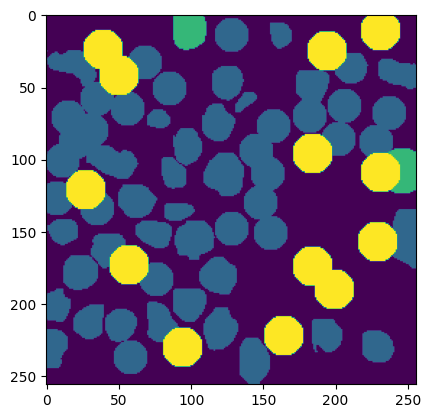

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 180.9ms
Speed: 9.7ms preprocess, 180.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 27, 21, 51)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 181.5ms
Speed: 6.7ms preprocess, 181.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 32, 54, 60)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 180.7ms
Speed: 6.7ms preprocess, 180.7ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(241, 79, 256, 100)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 186.2ms
Speed: 6.5ms preprocess, 186.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(228, 103, 248, 125)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 188.2ms
Speed: 6.5ms preprocess, 188.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 21, 179, 44)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 186.2ms
Speed: 6.5ms preprocess, 186.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 235, 241, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 182.7ms
Speed: 6.9ms preprocess, 182.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 208, 62, 231)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 209, 41, 243)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.1ms
Speed: 6.6ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 209, 41, 243)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.4ms
Speed: 7.2ms preprocess, 183.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 242, 22, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 237, 93, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.1ms
Speed: 5.7ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 223, 111, 246)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 186.5ms
Speed: 6.0ms preprocess, 186.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 201, 113, 224)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.5ms
Speed: 6.8ms preprocess, 183.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 0, 205, 14)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.2ms
Speed: 6.7ms preprocess, 183.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(13, 169, 38, 194)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.0ms
Speed: 7.4ms preprocess, 184.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 24, 256, 47)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.1ms
Speed: 5.7ms preprocess, 185.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 49, 223, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(175, 97, 187, 115)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.7ms
Speed: 7.1ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 222, 165, 245)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 182.7ms
Speed: 10.2ms preprocess, 182.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(74, 142, 103, 167)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(68, 116, 91, 138)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.0ms
Speed: 8.0ms preprocess, 187.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 77, 65, 100)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 188.5ms
Speed: 6.6ms preprocess, 188.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  876.0 bbox 256
fixed shape for a cell
(102, 164, 125, 187)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(9, 0, 32, 22)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.0ms
Speed: 6.7ms preprocess, 187.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 17, 158, 40)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 186.3ms
Speed: 6.9ms preprocess, 186.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 68, 169, 92)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.4ms
Speed: 4.8ms preprocess, 187.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 0, 178, 22)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 73, 130, 88)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.1ms
Speed: 6.4ms preprocess, 184.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 92, 133, 102)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 193.2ms
Speed: 4.8ms preprocess, 193.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(174, 33, 201, 60)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.4ms
Speed: 5.6ms preprocess, 185.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(41, 163, 57, 186)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.6ms
Speed: 6.4ms preprocess, 184.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 21, 79, 44)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.5ms
Speed: 6.6ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 186, 85, 202)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 181.8ms
Speed: 5.7ms preprocess, 181.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 130, 38, 163)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 189.5ms
Speed: 6.3ms preprocess, 189.5ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 90, 29, 118)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 186.9ms
Speed: 6.1ms preprocess, 186.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  862.0 bbox 256
fixed shape for a cell
(10, 61, 33, 84)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 188.1ms
Speed: 7.1ms preprocess, 188.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 107, 67, 132)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.8ms
Speed: 6.1ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 88, 107, 105)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 186.7ms
Speed: 6.3ms preprocess, 186.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 57, 93, 85)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 188.9ms
Speed: 6.3ms preprocess, 188.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 34, 128, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 0, 63, 20)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 181.6ms
Speed: 6.3ms preprocess, 181.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 68, 169, 92)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.6ms
Speed: 7.6ms preprocess, 187.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 106, 138, 129)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(96, 117, 112, 136)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 189.1ms
Speed: 5.7ms preprocess, 189.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 105, 172, 128)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 189.4ms
Speed: 5.9ms preprocess, 189.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 162, 77, 180)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.7ms
Speed: 6.8ms preprocess, 187.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 130, 139, 153)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.2ms
Speed: 6.8ms preprocess, 183.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  876.0 bbox 256
fixed shape for a cell
(127, 158, 150, 181)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 189.4ms
Speed: 6.2ms preprocess, 189.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 127, 161, 150)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 189.0ms
Speed: 7.1ms preprocess, 189.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(181, 162, 205, 185)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 182.8ms
Speed: 6.6ms preprocess, 182.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 206, 89, 229)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.8ms
Speed: 6.0ms preprocess, 187.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 186, 158, 209)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 211, 181, 234)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.7ms
Speed: 6.6ms preprocess, 183.7ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 233, 193, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.4ms
Speed: 6.0ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(239, 217, 256, 240)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 189.5ms
Speed: 6.6ms preprocess, 189.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 147, 176, 170)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.4ms
Speed: 11.4ms preprocess, 183.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(208, 208, 230, 235)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 188.6ms
Speed: 4.9ms preprocess, 188.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(225, 179, 256, 212)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.9ms
Speed: 4.8ms preprocess, 187.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(203, 180, 226, 203)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.2ms
Speed: 6.4ms preprocess, 187.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(173, 120, 196, 143)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 104, 225, 130)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.1ms
Speed: 5.7ms preprocess, 185.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 136, 231, 155)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.3ms
Speed: 7.3ms preprocess, 187.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(174, 200, 197, 223)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.0ms
Speed: 6.6ms preprocess, 183.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(214, 74, 237, 97)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 185.0ms
Speed: 6.9ms preprocess, 185.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(194, 76, 217, 100)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.8ms
Speed: 7.2ms preprocess, 184.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(146, 47, 169, 66)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 189.2ms
Speed: 6.4ms preprocess, 189.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(241, 51, 256, 73)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 187.3ms
Speed: 6.8ms preprocess, 187.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 1, 113, 28)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(215, 4, 242, 31)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0005.png: 1024x1024 50 objects, 183.4ms
Speed: 7.3ms preprocess, 183.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(104, 141, 118, 154)
FINAL MASK!!!


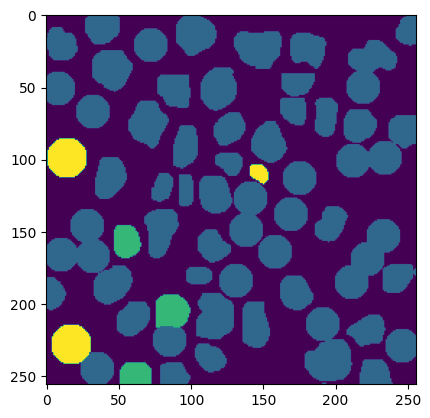

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(231, 181, 253, 207)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 188.1ms
Speed: 6.4ms preprocess, 188.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 108, 56, 131)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.7ms
Speed: 6.4ms preprocess, 187.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 160, 40, 183)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 181.9ms
Speed: 7.3ms preprocess, 181.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 151, 23, 174)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 189.0ms
Speed: 7.1ms preprocess, 189.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 101, 16, 131)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 181.8ms
Speed: 6.6ms preprocess, 181.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 68, 85, 86)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.8ms
Speed: 6.5ms preprocess, 186.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(235, 106, 252, 126)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.1ms
Speed: 5.3ms preprocess, 183.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 34, 18, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 198, 41, 221)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.6ms
Speed: 6.4ms preprocess, 186.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(25, 221, 48, 244)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.3ms
Speed: 9.1ms preprocess, 187.3ms inference, 9.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 224, 21, 247)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 176, 23, 199)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.7ms
Speed: 6.6ms preprocess, 187.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 121, 32, 144)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.6ms
Speed: 12.3ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  949.0 bbox 256
fixed shape for a cell
(80, 76, 103, 99)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.8ms
Speed: 6.3ms preprocess, 186.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 16, 133, 39)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.7ms
Speed: 11.5ms preprocess, 182.7ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 113, 86, 137)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.7ms
Speed: 11.4ms preprocess, 182.7ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 220, 118, 239)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.6ms
Speed: 6.5ms preprocess, 182.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 232, 93, 250)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.8ms
Speed: 7.5ms preprocess, 185.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  797.0 bbox 256
fixed shape for a cell
(111, 116, 134, 139)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.0ms
Speed: 6.1ms preprocess, 185.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(203, 43, 223, 64)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.7ms
Speed: 6.9ms preprocess, 186.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 22, 106, 40)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 12, 84, 40)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.4ms
Speed: 6.1ms preprocess, 186.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(3, 9, 38, 36)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 0, 155, 20)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.6ms
Speed: 6.6ms preprocess, 187.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 8, 173, 31)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.5ms
Speed: 6.5ms preprocess, 182.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(191, 12, 209, 29)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.0ms
Speed: 5.9ms preprocess, 187.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 0, 52, 20)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.7ms
Speed: 6.5ms preprocess, 185.7ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 32, 137, 55)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.0ms
Speed: 6.3ms preprocess, 182.0ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(175, 146, 198, 169)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.8ms
Speed: 7.3ms preprocess, 184.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 121, 186, 144)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 149, 246, 172)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.5ms
Speed: 6.3ms preprocess, 187.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 232, 93, 250)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.9ms
Speed: 6.7ms preprocess, 187.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 110, 107, 135)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.7ms
Speed: 6.6ms preprocess, 185.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 138, 96, 161)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.8ms
Speed: 7.0ms preprocess, 182.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 47, 164, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.0ms
Speed: 7.0ms preprocess, 187.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(159, 227, 184, 250)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.0ms
Speed: 7.2ms preprocess, 187.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 174, 195, 197)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 188.3ms
Speed: 6.4ms preprocess, 188.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 166, 167, 189)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 181.0ms
Speed: 7.0ms preprocess, 181.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 176, 146, 195)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.7ms
Speed: 6.8ms preprocess, 187.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  797.0 bbox 256
fixed shape for a cell
(111, 136, 134, 159)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.5ms
Speed: 6.6ms preprocess, 186.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  865.0 bbox 256
fixed shape for a cell
(140, 128, 163, 151)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.1ms
Speed: 6.1ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(185, 225, 209, 243)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 181.6ms
Speed: 6.2ms preprocess, 181.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 97, 180, 124)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.8ms
Speed: 6.7ms preprocess, 183.8ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(208, 97, 230, 117)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.1ms
Speed: 6.9ms preprocess, 184.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 120, 206, 140)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 190.6ms
Speed: 6.3ms preprocess, 190.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(203, 129, 226, 152)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 171, 218, 194)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.3ms
Speed: 10.5ms preprocess, 183.3ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(197, 189, 216, 208)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.1ms
Speed: 6.7ms preprocess, 186.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(219, 197, 241, 222)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.4ms
Speed: 6.8ms preprocess, 187.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 88, 204, 113)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.8ms
Speed: 7.0ms preprocess, 186.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 47, 164, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.2ms
Speed: 6.7ms preprocess, 185.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(96, 193, 119, 214)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.0ms
Speed: 7.5ms preprocess, 184.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  799.0 bbox 256
fixed shape for a cell
(47, 207, 70, 230)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.4ms
Speed: 5.4ms preprocess, 184.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(178, 44, 200, 70)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.6ms
Speed: 6.6ms preprocess, 183.6ms inference, 9.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 73, 231, 93)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 183.0ms
Speed: 6.6ms preprocess, 183.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 65, 184, 92)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(132, 83, 157, 105)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(106, 91, 126, 112)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.7ms
Speed: 6.9ms preprocess, 184.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(106, 58, 130, 84)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 43, 108, 67)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.7ms
Speed: 7.6ms preprocess, 186.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(40, 45, 66, 67)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.0ms
Speed: 7.0ms preprocess, 184.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 61, 32, 85)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.5ms
Speed: 6.7ms preprocess, 184.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 162, 66, 181)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.2ms
Speed: 6.7ms preprocess, 185.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 180, 86, 200)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 180.4ms
Speed: 11.8ms preprocess, 180.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(233, 42, 256, 65)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.5ms
Speed: 7.1ms preprocess, 186.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(97, 0, 128, 26)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 186.7ms
Speed: 6.6ms preprocess, 186.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 130, 57, 161)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 86, 68, 113)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 187.1ms
Speed: 5.9ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(229, 230, 249, 250)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 185.7ms
Speed: 7.3ms preprocess, 185.7ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(225, 65, 252, 92)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 184.5ms
Speed: 7.0ms preprocess, 184.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 200, 157, 236)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0006.png: 1024x1024 52 objects, 182.7ms
Speed: 6.5ms preprocess, 182.7ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(77, 158, 104, 185)
FINAL MASK!!!


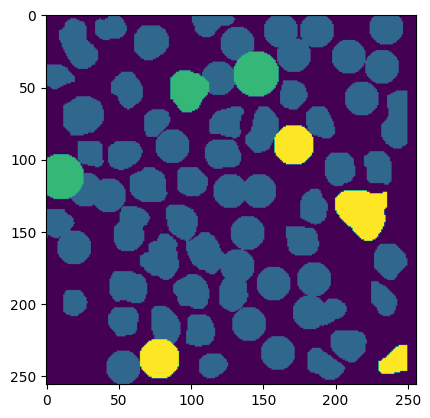

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.7ms
Speed: 7.3ms preprocess, 186.7ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(238, 6, 256, 29)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.7ms
Speed: 6.8ms preprocess, 186.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 226, 146, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(83, 23, 107, 48)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 89, 149, 109)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 181.6ms
Speed: 6.4ms preprocess, 181.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(181, 158, 213, 178)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(205, 80, 229, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 19, 235, 47)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 231, 174, 254)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 160, 28, 183)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 133, 19, 156)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 187.1ms
Speed: 6.9ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 128, 69, 151)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 182.1ms
Speed: 6.5ms preprocess, 182.1ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 157, 80, 180)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.5ms
Speed: 6.8ms preprocess, 185.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(223, 228, 249, 247)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 182, 217, 205)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 181.4ms
Speed: 7.0ms preprocess, 181.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(154, 112, 174, 134)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.6ms
Speed: 7.2ms preprocess, 184.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 139, 29, 162)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.9ms
Speed: 6.9ms preprocess, 184.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(100, 110, 126, 137)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(7, 231, 31, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 71, 29, 94)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 181.1ms
Speed: 7.0ms preprocess, 181.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 173, 60, 196)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.9ms
Speed: 6.5ms preprocess, 184.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 235, 221, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.9ms
Speed: 6.6ms preprocess, 183.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 170, 188, 193)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.7ms
Speed: 7.1ms preprocess, 184.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 64, 241, 87)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 189.3ms
Speed: 6.2ms preprocess, 189.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 64, 200, 93)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.6ms
Speed: 8.2ms preprocess, 183.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 47, 198, 64)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.8ms
Speed: 4.8ms preprocess, 183.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 93, 32, 116)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 187.0ms
Speed: 5.7ms preprocess, 187.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 23, 188, 46)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 187.0ms
Speed: 5.7ms preprocess, 187.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 13, 21, 36)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 181.8ms
Speed: 6.7ms preprocess, 181.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 4, 134, 27)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(146, 8, 172, 31)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 188.8ms
Speed: 6.6ms preprocess, 188.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 0, 45, 20)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 0, 73, 29)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.6ms
Speed: 11.3ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 32, 56, 55)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.7ms
Speed: 8.2ms preprocess, 184.7ms inference, 8.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 32, 150, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 180.9ms
Speed: 13.9ms preprocess, 180.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 143, 108, 170)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.7ms
Speed: 6.4ms preprocess, 184.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(127, 111, 150, 136)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 165, 132, 202)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 181.0ms
Speed: 10.9ms preprocess, 181.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 107, 96, 130)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 180.9ms
Speed: 10.1ms preprocess, 180.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 91, 79, 115)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.7ms
Speed: 6.1ms preprocess, 186.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 59, 79, 85)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 189.1ms
Speed: 6.2ms preprocess, 189.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 0, 94, 18)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.8ms
Speed: 6.1ms preprocess, 183.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 0, 73, 29)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.6ms
Speed: 6.4ms preprocess, 185.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 0, 22, 20)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 187.4ms
Speed: 6.7ms preprocess, 187.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 58, 111, 83)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.5ms
Speed: 9.6ms preprocess, 184.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(119, 139, 142, 160)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 62, 139, 85)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 189.6ms
Speed: 5.0ms preprocess, 189.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 32, 150, 56)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 182.7ms
Speed: 6.0ms preprocess, 182.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 52, 173, 77)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 188.5ms
Speed: 6.7ms preprocess, 188.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 64, 200, 93)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.5ms
Speed: 6.5ms preprocess, 183.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 34, 248, 62)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 34, 248, 62)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.2ms
Speed: 6.8ms preprocess, 186.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 19, 235, 47)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.4ms
Speed: 8.1ms preprocess, 184.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(193, 0, 216, 23)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.6ms
Speed: 6.4ms preprocess, 185.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 62, 157, 85)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 85, 131, 109)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.2ms
Speed: 12.8ms preprocess, 184.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 88, 110, 111)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.3ms
Speed: 6.7ms preprocess, 186.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(223, 181, 256, 206)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 165, 132, 202)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 182.3ms
Speed: 4.8ms preprocess, 182.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 184, 99, 212)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 187.8ms
Speed: 6.2ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 209, 123, 236)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  843.0 bbox 256
fixed shape for a cell
(136, 195, 159, 218)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(136, 164, 163, 185)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 197, 202, 222)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 180.3ms
Speed: 11.6ms preprocess, 180.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 83, 178, 109)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 182.0ms
Speed: 6.1ms preprocess, 182.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 126, 235, 150)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(173, 128, 196, 151)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 181.4ms
Speed: 9.3ms preprocess, 181.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(238, 132, 256, 157)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(242, 67, 256, 79)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.2ms
Speed: 6.1ms preprocess, 183.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(242, 88, 256, 107)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(228, 103, 256, 126)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.7ms
Speed: 6.7ms preprocess, 183.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(198, 106, 224, 133)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.1ms
Speed: 7.1ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(179, 96, 202, 119)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 186.4ms
Speed: 6.5ms preprocess, 186.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 227, 202, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 185.8ms
Speed: 7.1ms preprocess, 185.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(45, 226, 72, 253)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 137, 174, 164)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 101, 56, 128)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0007.png: 1024x1024 50 objects, 187.1ms
Speed: 7.4ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(52, 203, 79, 230)
FINAL MASK!!!


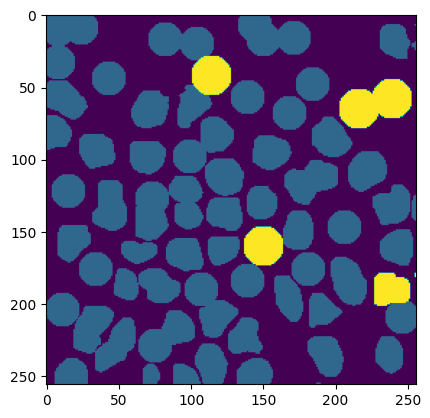

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 179.9ms
Speed: 8.8ms preprocess, 179.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 239, 46, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 181.1ms
Speed: 6.4ms preprocess, 181.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 69, 16, 91)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.0ms
Speed: 6.6ms preprocess, 183.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 85, 51, 106)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.0ms
Speed: 7.5ms preprocess, 186.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 25, 111, 48)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.2ms
Speed: 6.5ms preprocess, 185.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 12, 143, 39)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.5ms
Speed: 6.8ms preprocess, 187.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(89, 0, 112, 20)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 46, 154, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.9ms
Speed: 7.2ms preprocess, 186.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 35, 172, 54)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(159, 54, 183, 90)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.6ms
Speed: 6.1ms preprocess, 183.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 0, 182, 35)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 182.6ms
Speed: 6.1ms preprocess, 182.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 0, 200, 23)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.6ms
Speed: 6.2ms preprocess, 185.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1098.0 bbox 256
fixed shape for a cell
(9, 45, 32, 68)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 181.4ms
Speed: 7.5ms preprocess, 181.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(241, 127, 256, 156)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.8ms
Speed: 5.9ms preprocess, 185.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 136, 32, 159)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 184.1ms
Speed: 6.6ms preprocess, 184.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 214, 30, 237)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 184.5ms
Speed: 7.0ms preprocess, 184.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 204, 16, 230)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 237, 96, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 184.7ms
Speed: 6.7ms preprocess, 184.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 212, 75, 235)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.2ms
Speed: 7.5ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 236, 198, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 182.1ms
Speed: 9.6ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 206, 161, 220)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 181, 176, 205)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 80, 153, 98)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.1ms
Speed: 9.6ms preprocess, 183.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(97, 36, 120, 59)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 181.4ms
Speed: 6.9ms preprocess, 181.4ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 106, 38, 129)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 450.4ms
Speed: 6.3ms preprocess, 450.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 31, 25, 50)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 157, 94, 188)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.7ms
Speed: 5.5ms preprocess, 183.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 20, 74, 48)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.1ms
Speed: 5.8ms preprocess, 183.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 237, 69, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.2ms
Speed: 8.2ms preprocess, 186.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(141, 235, 167, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 190.1ms
Speed: 6.7ms preprocess, 190.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 232, 138, 255)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.7ms
Speed: 6.2ms preprocess, 187.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 212, 187, 234)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.9ms
Speed: 7.7ms preprocess, 185.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 210, 101, 235)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 189, 70, 208)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.0ms
Speed: 6.2ms preprocess, 187.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 210, 52, 235)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.3ms
Speed: 6.8ms preprocess, 186.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(17, 195, 38, 213)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 182.7ms
Speed: 6.7ms preprocess, 182.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 171, 59, 191)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 182.4ms
Speed: 7.6ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 164, 19, 189)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 184.1ms
Speed: 6.6ms preprocess, 184.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(136, 152, 162, 179)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 12, 52, 32)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 188.3ms
Speed: 6.3ms preprocess, 188.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 122, 165, 147)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 41, 53, 62)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.6ms
Speed: 10.4ms preprocess, 183.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(102, 58, 125, 85)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 188.7ms
Speed: 5.8ms preprocess, 188.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 140, 133, 158)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 173, 128, 210)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.2ms
Speed: 6.8ms preprocess, 183.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 52, 103, 74)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 182.6ms
Speed: 7.0ms preprocess, 182.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 202, 144, 225)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.3ms
Speed: 6.7ms preprocess, 186.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 192, 207, 214)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.7ms
Speed: 10.8ms preprocess, 185.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 94, 82, 115)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.1ms
Speed: 6.3ms preprocess, 185.1ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(207, 240, 232, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.9ms
Speed: 6.2ms preprocess, 187.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 216, 219, 238)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.8ms
Speed: 8.1ms preprocess, 185.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 107, 105, 138)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.6ms
Speed: 6.4ms preprocess, 185.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 55, 70, 74)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 55, 256, 82)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 188.4ms
Speed: 6.9ms preprocess, 188.4ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(214, 39, 241, 66)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 116, 76, 143)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.1ms
Speed: 7.2ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 130, 58, 157)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 183.1ms
Speed: 4.8ms preprocess, 183.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 104, 198, 131)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(236, 78, 256, 102)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 187.1ms
Speed: 7.1ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 231, 118, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0008.png: 1024x1024 48 objects, 185.4ms
Speed: 6.9ms preprocess, 185.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(87, 80, 103, 95)
FINAL MASK!!!


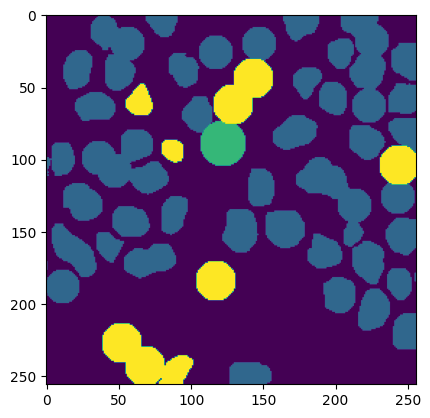

/content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 181.8ms
Speed: 6.2ms preprocess, 181.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(198, 112, 224, 138)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 189.6ms
Speed: 6.2ms preprocess, 189.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(171, 180, 192, 201)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.8ms
Speed: 4.9ms preprocess, 182.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(188, 159, 207, 183)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 185.6ms
Speed: 6.9ms preprocess, 185.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 131, 201, 157)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.0ms
Speed: 6.3ms preprocess, 182.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 155, 150, 186)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 182, 162, 211)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 184.9ms
Speed: 6.9ms preprocess, 184.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 197, 146, 227)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.9ms
Speed: 5.3ms preprocess, 183.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(222, 130, 250, 157)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(187, 28, 210, 54)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.3ms
Speed: 6.8ms preprocess, 182.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(217, 163, 242, 184)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 189.2ms
Speed: 6.3ms preprocess, 189.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 176, 234, 198)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(191, 189, 214, 212)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 188.1ms
Speed: 6.3ms preprocess, 188.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 139, 224, 162)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1051.0 bbox 256
fixed shape for a cell
(99, 147, 122, 170)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1051.0 bbox 256
fixed shape for a cell
(89, 165, 112, 188)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.7ms
Speed: 6.5ms preprocess, 187.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(65, 155, 88, 173)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 182, 83, 204)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 149, 58, 176)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.3ms
Speed: 6.8ms preprocess, 187.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 196, 119, 219)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 188.9ms
Speed: 6.6ms preprocess, 188.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(13, 155, 31, 178)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.0ms
Speed: 6.6ms preprocess, 187.0ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(185, 230, 213, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.8ms
Speed: 11.4ms preprocess, 182.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(198, 6, 209, 19)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 69, 187, 95)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 185.7ms
Speed: 6.5ms preprocess, 185.7ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  889.0 bbox 256
fixed shape for a cell
(131, 129, 154, 152)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 181.1ms
Speed: 14.5ms preprocess, 181.1ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(167, 213, 192, 234)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 185.7ms
Speed: 9.2ms preprocess, 185.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 148, 184, 176)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(59, 56, 85, 79)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 18, 93, 44)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(76, 49, 98, 64)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 184.3ms
Speed: 6.3ms preprocess, 184.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 204, 231, 229)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.7ms
Speed: 6.3ms preprocess, 186.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 49, 55, 72)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 72, 32, 95)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 90, 39, 113)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.8ms
Speed: 6.2ms preprocess, 187.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 88, 117, 114)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.4ms
Speed: 6.1ms preprocess, 183.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 110, 139, 136)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  889.0 bbox 256
fixed shape for a cell
(147, 112, 170, 135)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 190.3ms
Speed: 6.5ms preprocess, 190.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 46, 123, 69)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 188.0ms
Speed: 6.5ms preprocess, 188.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 88, 167, 110)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 188.4ms
Speed: 6.3ms preprocess, 188.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(23, 114, 50, 146)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 189.3ms
Speed: 6.2ms preprocess, 189.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 113, 76, 129)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.4ms
Speed: 7.5ms preprocess, 186.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(59, 127, 79, 146)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.5ms
Speed: 6.2ms preprocess, 187.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(213, 14, 239, 40)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 188.3ms
Speed: 5.6ms preprocess, 188.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(189, 76, 210, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 184.3ms
Speed: 7.2ms preprocess, 184.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 98, 197, 117)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.5ms
Speed: 6.3ms preprocess, 183.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 21, 66, 44)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 185.9ms
Speed: 7.9ms preprocess, 185.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 86, 76, 108)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.9ms
Speed: 7.7ms preprocess, 186.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 86, 76, 108)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.7ms
Speed: 7.2ms preprocess, 182.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 106, 20, 125)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.8ms
Speed: 7.1ms preprocess, 186.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 77, 139, 103)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 188.1ms
Speed: 9.3ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 222, 42, 250)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(226, 68, 253, 92)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(132, 66, 159, 93)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 184.3ms
Speed: 6.1ms preprocess, 184.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(235, 230, 256, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 229, 175, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.5ms
Speed: 6.8ms preprocess, 182.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 183, 52, 197)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 189, 253, 207)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 184.8ms
Speed: 7.9ms preprocess, 184.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 7, 191, 26)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.7ms
Speed: 6.4ms preprocess, 183.7ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(210, 229, 237, 256)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 2, 110, 29)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 187.9ms
Speed: 6.5ms preprocess, 187.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(150, 27, 177, 54)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 183.5ms
Speed: 6.3ms preprocess, 183.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 1, 146, 28)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 185.3ms
Speed: 6.9ms preprocess, 185.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 43, 143, 59)


image 1/1 /content/drive/MyDrive/NIO/images/1FL-G1__ROI-0001__idx-0009.png: 1024x1024 54 objects, 182.6ms
Speed: 6.5ms preprocess, 182.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(170, 48, 197, 75)
FINAL MASK!!!


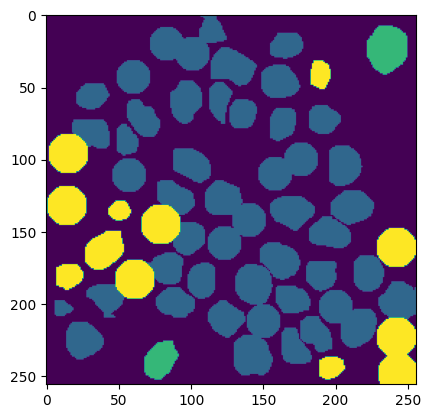

/content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.2ms
Speed: 6.9ms preprocess, 184.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 106, 21, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 0, 176, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 127, 139, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 209, 25, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.2ms
Speed: 6.6ms preprocess, 184.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(198, 219, 235, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 185.5ms
Speed: 7.0ms preprocess, 185.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(187, 202, 212, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 183.6ms
Speed: 6.7ms preprocess, 183.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 78, 28, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 187.5ms
Speed: 6.5ms preprocess, 187.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 0, 65, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 188.1ms
Speed: 6.3ms preprocess, 188.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(62, 34, 88, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(14, 37, 47, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 183.9ms
Speed: 6.5ms preprocess, 183.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 59, 201, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 97, 172, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 137, 237, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 181.1ms
Speed: 6.9ms preprocess, 181.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(224, 114, 245, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 186.8ms
Speed: 7.0ms preprocess, 186.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  851.0 bbox 256
fixed shape for a cell
(220, 170, 243, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 227, 56, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 180.5ms
Speed: 6.5ms preprocess, 180.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(7, 241, 24, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 134, 176, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(68, 177, 91, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 154, 116, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 187.2ms
Speed: 8.9ms preprocess, 187.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(116, 23, 157, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 180.3ms
Speed: 10.4ms preprocess, 180.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 90, 97, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 22, 192, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.7ms
Speed: 6.9ms preprocess, 184.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 163, 148, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.0ms
Speed: 6.6ms preprocess, 184.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 198, 74, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 185.5ms
Speed: 8.3ms preprocess, 185.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 54, 93, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 25, 256, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 182.2ms
Speed: 7.9ms preprocess, 182.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 56, 245, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 107, 208, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 187.9ms
Speed: 6.2ms preprocess, 187.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 145, 203, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 189.3ms
Speed: 6.3ms preprocess, 189.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 70, 73, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 182.1ms
Speed: 6.0ms preprocess, 182.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 119, 59, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.6ms
Speed: 9.2ms preprocess, 184.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 53, 121, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 188.0ms
Speed: 6.3ms preprocess, 188.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1356.0 bbox 400
fixed shape for a cell
(130, 198, 157, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2000.png: 1024x1024 25 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(191, 10, 218, 37)
FINAL MASK!!!


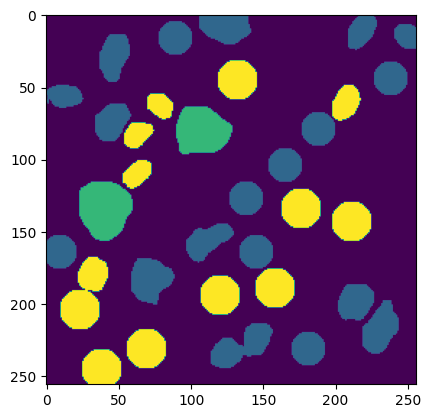

/content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 168, 192, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 187.8ms
Speed: 5.5ms preprocess, 187.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(238, 233, 256, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 183.7ms
Speed: 6.4ms preprocess, 183.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(214, 172, 237, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 187.0ms
Speed: 6.6ms preprocess, 187.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(213, 197, 254, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 181.1ms
Speed: 6.2ms preprocess, 181.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1424.0 bbox 256
fixed shape for a cell
(146, 235, 169, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 207, 176, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1424.0 bbox 256
fixed shape for a cell
(115, 221, 138, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 189, 158, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 185.1ms
Speed: 7.1ms preprocess, 185.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 147, 30, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 187.1ms
Speed: 6.7ms preprocess, 187.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 166, 56, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 183.5ms
Speed: 6.4ms preprocess, 183.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 161, 89, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 181.1ms
Speed: 6.4ms preprocess, 181.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 210, 57, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.1ms
Speed: 6.1ms preprocess, 186.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 201, 80, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.8ms
Speed: 6.1ms preprocess, 186.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 194, 122, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.3ms
Speed: 9.8ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 232, 87, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 184.9ms
Speed: 6.8ms preprocess, 184.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 112, 30, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 185.4ms
Speed: 9.7ms preprocess, 185.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(2, 79, 30, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.5ms
Speed: 10.2ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1078.0 bbox 256
fixed shape for a cell
(34, 64, 57, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 182.8ms
Speed: 8.2ms preprocess, 182.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 109, 101, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 181.4ms
Speed: 6.5ms preprocess, 181.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(239, 49, 256, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(206, 8, 230, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 15, 172, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(207, 33, 225, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 220, 223, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 85, 209, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(228, 117, 256, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 42, 113, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.5ms
Speed: 6.8ms preprocess, 186.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 60, 228, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 182.2ms
Speed: 6.2ms preprocess, 182.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 147, 131, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 38, 51, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 185.3ms
Speed: 6.8ms preprocess, 185.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 6, 110, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 181.2ms
Speed: 7.4ms preprocess, 181.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 75, 157, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 187.3ms
Speed: 6.9ms preprocess, 187.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 102, 58, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 121, 186, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 181.6ms
Speed: 6.3ms preprocess, 181.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 102, 133, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 28, 139, 55)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 186.1ms
Speed: 6.6ms preprocess, 186.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 5, 53, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-1__ROI-0001__idx-2001.png: 1024x1024 30 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(9, 230, 39, 251)
FINAL MASK!!!


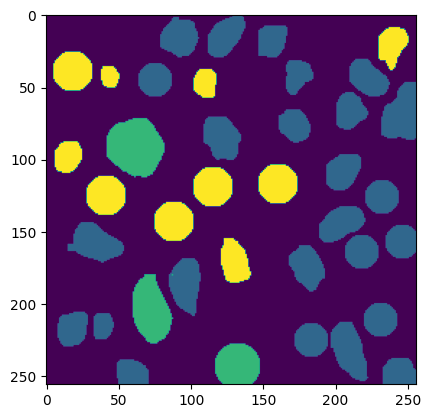

/content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 137, 111, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 180.4ms
Speed: 7.1ms preprocess, 180.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 39, 70, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 181.3ms
Speed: 6.4ms preprocess, 181.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(25, 158, 48, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 185.9ms
Speed: 7.5ms preprocess, 185.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(159, 220, 182, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 186.1ms
Speed: 7.2ms preprocess, 186.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 100, 71, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 184.5ms
Speed: 6.7ms preprocess, 184.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 67, 28, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 180.6ms
Speed: 6.4ms preprocess, 180.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(36, 52, 59, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 185.3ms
Speed: 12.4ms preprocess, 185.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 54, 111, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 181.5ms
Speed: 6.0ms preprocess, 181.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 104, 25, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 182.3ms
Speed: 6.5ms preprocess, 182.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(100, 100, 130, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 80, 179, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 185.2ms
Speed: 9.6ms preprocess, 185.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(214, 136, 237, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 183.9ms
Speed: 8.9ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 87, 230, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 183.3ms
Speed: 13.0ms preprocess, 183.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 165, 231, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 186.5ms
Speed: 9.7ms preprocess, 186.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 22, 221, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 0, 256, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 181.7ms
Speed: 6.6ms preprocess, 181.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 94, 88, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 34, 171, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 108, 50, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 181.3ms
Speed: 7.2ms preprocess, 181.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(167, 187, 203, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 207, 126, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 182.5ms
Speed: 7.2ms preprocess, 182.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 193, 66, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 184.0ms
Speed: 6.7ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 234, 40, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 187.2ms
Speed: 6.6ms preprocess, 187.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 197, 86, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 187, 102, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 178, 162, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 184.3ms
Speed: 7.8ms preprocess, 184.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 221, 228, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 182.0ms
Speed: 6.8ms preprocess, 182.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 38, 34, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 20, 142, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 5, 152, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 186.6ms
Speed: 5.1ms preprocess, 186.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 109, 194, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 155, 177, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 147, 157, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-2__ROI-0001__idx-2000.png: 1024x1024 11 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(244, 80, 256, 96)
FINAL MASK!!!


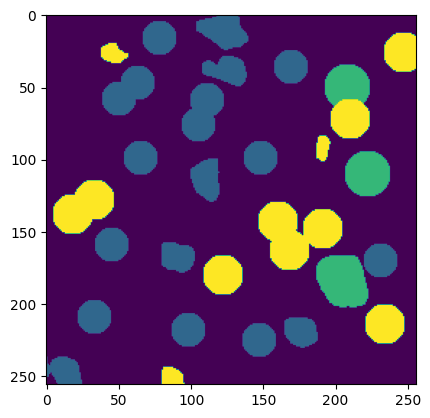

/content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 185.9ms
Speed: 6.8ms preprocess, 185.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1377.0 bbox 256
fixed shape for a cell
(78, 205, 101, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 182.6ms
Speed: 7.2ms preprocess, 182.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 256
fixed shape for a cell
(203, 237, 226, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 256
fixed shape for a cell
(1, 25, 24, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 180.4ms
Speed: 6.3ms preprocess, 180.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 46, 15, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 181.4ms
Speed: 6.8ms preprocess, 181.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 256
fixed shape for a cell
(18, 16, 41, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 180.6ms
Speed: 6.4ms preprocess, 180.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 241, 67, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(167, 66, 199, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 184.4ms
Speed: 8.2ms preprocess, 184.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  892.0 bbox 256
fixed shape for a cell
(221, 48, 244, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 256
fixed shape for a cell
(237, 25, 256, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(59, 80, 93, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 183.7ms
Speed: 10.6ms preprocess, 183.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 0, 116, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(193, 3, 224, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 211, 185, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 181.3ms
Speed: 6.5ms preprocess, 181.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 400
fixed shape for a cell
(32, 0, 59, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 49, 107, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 183.6ms
Speed: 6.5ms preprocess, 183.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 69, 121, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 181.0ms
Speed: 7.1ms preprocess, 181.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 400
fixed shape for a cell
(171, 163, 198, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 186.4ms
Speed: 6.4ms preprocess, 186.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 400
fixed shape for a cell
(14, 55, 41, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 170, 110, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0000.png: 1024x1024 11 objects, 184.6ms
Speed: 6.4ms preprocess, 184.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1275.0 bbox 400
fixed shape for a cell
(233, 165, 256, 192)
FINAL MASK!!!


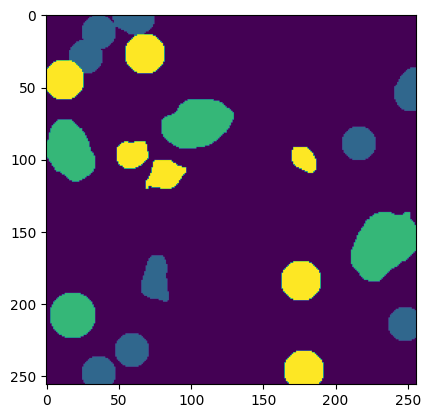

/content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 180.8ms
Speed: 6.6ms preprocess, 180.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 27, 17, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 183.3ms
Speed: 6.0ms preprocess, 183.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 133, 27, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 106, 60, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 182.5ms
Speed: 6.9ms preprocess, 182.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(67, 167, 97, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 186.4ms
Speed: 7.0ms preprocess, 186.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 13, 109, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 180, 256, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 180.6ms
Speed: 7.0ms preprocess, 180.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 153, 233, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 185.1ms
Speed: 7.2ms preprocess, 185.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 167, 19, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 186.2ms
Speed: 6.5ms preprocess, 186.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(236, 236, 256, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 93, 139, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 183.6ms
Speed: 6.4ms preprocess, 183.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 93, 181, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 181.7ms
Speed: 9.7ms preprocess, 181.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(212, 88, 243, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 182.8ms
Speed: 7.2ms preprocess, 182.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 225, 179, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 186.2ms
Speed: 7.1ms preprocess, 186.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 211, 212, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 41, 107, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 182.9ms
Speed: 6.7ms preprocess, 182.9ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 200, 122, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 67, 94, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 187.5ms
Speed: 6.2ms preprocess, 187.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 216, 27, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 180.3ms
Speed: 11.6ms preprocess, 180.3ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(134, 181, 157, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 188.9ms
Speed: 7.1ms preprocess, 188.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 189, 79, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 183.5ms
Speed: 6.5ms preprocess, 183.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 187, 212, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 186.9ms
Speed: 9.5ms preprocess, 186.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 36, 214, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 183.3ms
Speed: 6.9ms preprocess, 183.3ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 36, 214, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 185.7ms
Speed: 6.6ms preprocess, 185.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(34, 14, 61, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0001.png: 1024x1024 12 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(134, 131, 161, 158)
FINAL MASK!!!


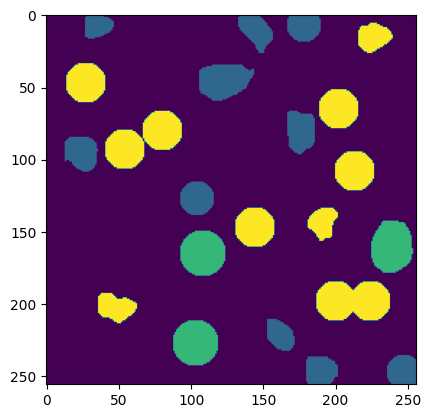

/content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 36, 195, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 185.4ms
Speed: 6.1ms preprocess, 185.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 200, 151, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 184.8ms
Speed: 8.2ms preprocess, 184.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 45, 150, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 181.3ms
Speed: 6.3ms preprocess, 181.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  824.0 bbox 256
fixed shape for a cell
(225, 65, 248, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 189.7ms
Speed: 6.5ms preprocess, 189.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 0, 67, 27)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 185.5ms
Speed: 8.6ms preprocess, 185.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 197, 86, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1293.0 bbox 256
fixed shape for a cell
(89, 31, 112, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 168, 124, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 141, 136, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 185.5ms
Speed: 6.1ms preprocess, 185.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 196, 112, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 0, 236, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 188, 256, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 102, 211, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 183.3ms
Speed: 6.6ms preprocess, 183.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 18, 136, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 187.3ms
Speed: 7.0ms preprocess, 187.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 125, 82, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 186.9ms
Speed: 6.3ms preprocess, 186.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(144, 153, 171, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(234, 240, 248, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 180.2ms
Speed: 7.6ms preprocess, 180.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(194, 137, 221, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 62, 84, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(17, 18, 74, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0002.png: 1024x1024 12 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(17, 18, 74, 77)
FINAL MASK!!!


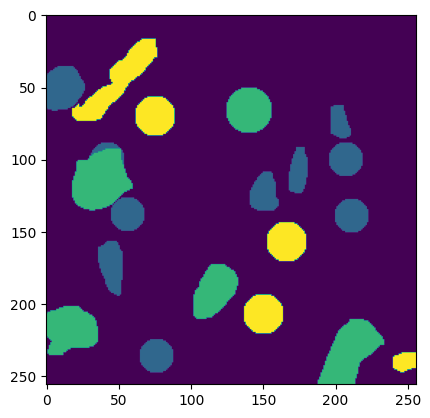

/content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 181.5ms
Speed: 7.4ms preprocess, 181.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 119, 35, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 180.3ms
Speed: 6.5ms preprocess, 180.3ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(243, 59, 256, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 186.4ms
Speed: 6.0ms preprocess, 186.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 188, 18, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(8, 145, 31, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(83, 241, 111, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(212, 10, 235, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 65, 63, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(236, 0, 256, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 181.2ms
Speed: 6.4ms preprocess, 181.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(98, 167, 132, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 187.5ms
Speed: 7.4ms preprocess, 187.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(163, 205, 186, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 185.6ms
Speed: 6.2ms preprocess, 185.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 243, 177, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 184.9ms
Speed: 6.5ms preprocess, 184.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 194, 232, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 186.7ms
Speed: 7.2ms preprocess, 186.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 22, 107, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 189.0ms
Speed: 5.0ms preprocess, 189.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2391.0 bbox 400
fixed shape for a cell
(94, 104, 121, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 0, 85, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 181.8ms
Speed: 6.6ms preprocess, 181.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 152, 81, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(186, 138, 213, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(228, 166, 255, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 182.0ms
Speed: 6.4ms preprocess, 182.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(212, 114, 245, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 182.2ms
Speed: 6.7ms preprocess, 182.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 15, 216, 42)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 187.0ms
Speed: 6.2ms preprocess, 187.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 155, 160, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-3__ROI-0001__idx-0003.png: 1024x1024 15 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(11, 17, 30, 38)
FINAL MASK!!!


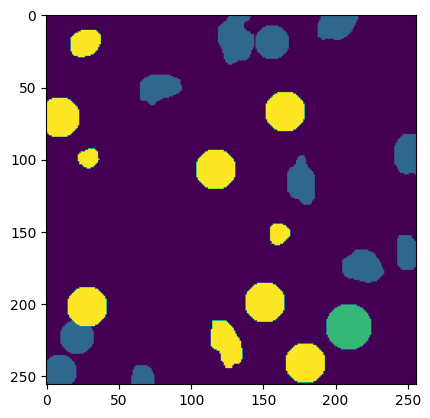

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 182.0ms
Speed: 6.5ms preprocess, 182.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 215, 162, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 85, 223, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(192, 44, 215, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(189, 7, 217, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 189.6ms
Speed: 6.8ms preprocess, 189.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 52, 138, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(183, 172, 206, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 186.6ms
Speed: 6.4ms preprocess, 186.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 115, 177, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 115, 137, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 187.1ms
Speed: 6.8ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 182, 72, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 187.6ms
Speed: 6.4ms preprocess, 187.6ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(181, 109, 202, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 173, 120, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.3ms
Speed: 6.2ms preprocess, 184.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 160, 103, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 182.3ms
Speed: 7.2ms preprocess, 182.3ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 191, 94, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 181.6ms
Speed: 11.3ms preprocess, 181.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 133, 31, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 186.5ms
Speed: 6.8ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 148, 59, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 183.5ms
Speed: 6.5ms preprocess, 183.5ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 113, 80, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 186.3ms
Speed: 8.5ms preprocess, 186.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 24, 128, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 187.4ms
Speed: 6.7ms preprocess, 187.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(129, 2, 152, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.6ms
Speed: 7.1ms preprocess, 184.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(96, 219, 119, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.7ms
Speed: 6.7ms preprocess, 184.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(117, 216, 140, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 235, 179, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 188.4ms
Speed: 4.9ms preprocess, 188.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 179, 181, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 130, 193, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 186.7ms
Speed: 7.3ms preprocess, 186.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 0, 250, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 185.1ms
Speed: 7.2ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(213, 115, 244, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 180.4ms
Speed: 9.5ms preprocess, 180.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(233, 200, 256, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 185.3ms
Speed: 6.7ms preprocess, 185.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(242, 78, 256, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 189.4ms
Speed: 6.6ms preprocess, 189.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 198, 202, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 187.8ms
Speed: 6.8ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(231, 52, 256, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 95, 36, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 185.9ms
Speed: 6.7ms preprocess, 185.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 5, 24, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 186.6ms
Speed: 7.1ms preprocess, 186.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 199, 241, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 182.9ms
Speed: 6.6ms preprocess, 182.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(128, 181, 157, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.5ms
Speed: 6.6ms preprocess, 184.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 148, 167, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 185.3ms
Speed: 7.0ms preprocess, 185.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 183, 25, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(215, 150, 256, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 189.4ms
Speed: 6.2ms preprocess, 189.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 46, 174, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(26, 203, 52, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 13, 80, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 50, 53, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 188.0ms
Speed: 6.5ms preprocess, 188.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 37, 112, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 188.3ms
Speed: 6.2ms preprocess, 188.3ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 0, 178, 15)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.6ms
Speed: 6.9ms preprocess, 184.6ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 78, 103, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2000.png: 1024x1024 35 objects, 184.3ms
Speed: 9.5ms preprocess, 184.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(52, 102, 67, 117)
FINAL MASK!!!


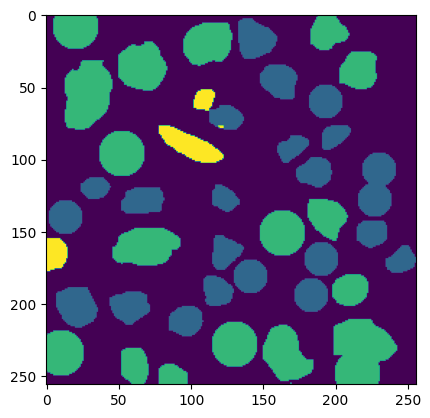

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 187.1ms
Speed: 6.5ms preprocess, 187.1ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 222, 67, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 140, 247, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 187.0ms
Speed: 6.7ms preprocess, 187.0ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(215, 73, 234, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 181.9ms
Speed: 8.3ms preprocess, 181.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 30, 128, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 186.4ms
Speed: 6.4ms preprocess, 186.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 109, 109, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 59, 168, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 165, 143, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(182, 232, 205, 255)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 191.2ms
Speed: 6.2ms preprocess, 191.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 203, 82, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 186.2ms
Speed: 6.6ms preprocess, 186.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(10, 187, 31, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 219, 35, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 183.5ms
Speed: 6.4ms preprocess, 183.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 64, 88, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 183.8ms
Speed: 7.0ms preprocess, 183.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 174, 170, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 187.0ms
Speed: 6.9ms preprocess, 187.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(17, 28, 40, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 188.8ms
Speed: 6.3ms preprocess, 188.8ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 0, 101, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.0ms
Speed: 9.9ms preprocess, 185.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 68, 211, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 75, 66, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 184.4ms
Speed: 6.5ms preprocess, 184.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 130, 96, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.5ms
Speed: 6.8ms preprocess, 185.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 170, 53, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(78, 44, 109, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 131, 180, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 186.0ms
Speed: 6.5ms preprocess, 186.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 137, 66, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 181.0ms
Speed: 6.3ms preprocess, 181.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 225, 137, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 196, 217, 233)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 187.4ms
Speed: 6.4ms preprocess, 187.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 102, 196, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(217, 227, 248, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 186.1ms
Speed: 6.8ms preprocess, 186.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(40, 50, 69, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 158, 26, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 186.5ms
Speed: 6.9ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 227, 180, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(71, 177, 102, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.7ms
Speed: 12.1ms preprocess, 182.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(208, 189, 238, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.3ms
Speed: 10.8ms preprocess, 185.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 187, 133, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.9ms
Speed: 7.4ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 25, 172, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.6ms
Speed: 10.8ms preprocess, 182.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(207, 41, 233, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.8ms
Speed: 6.7ms preprocess, 182.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 189, 256, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.1ms
Speed: 7.2ms preprocess, 182.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 0, 101, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 152, 197, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 123, 116, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(178, 0, 205, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.5ms
Speed: 6.7ms preprocess, 182.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(244, 42, 256, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 183.9ms
Speed: 7.3ms preprocess, 183.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 87, 160, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 183.1ms
Speed: 7.0ms preprocess, 183.1ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 121, 145, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.9ms
Speed: 7.1ms preprocess, 182.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 241, 24, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 186.8ms
Speed: 7.1ms preprocess, 186.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 83, 91, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 108, 50, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 0, 54, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-2001.png: 1024x1024 26 objects, 185.6ms
Speed: 6.1ms preprocess, 185.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(6, 60, 33, 87)
FINAL MASK!!!


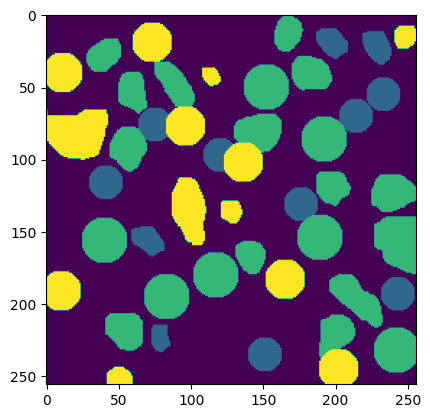

/content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.6ms
Speed: 6.8ms preprocess, 185.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1373.0 bbox 256
fixed shape for a cell
(36, 39, 59, 62)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.1ms
Speed: 6.5ms preprocess, 182.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 146, 47, 169)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.0ms
Speed: 7.0ms preprocess, 182.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 194, 178, 217)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.7ms
Speed: 7.8ms preprocess, 185.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 56, 165, 79)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 187.6ms
Speed: 5.7ms preprocess, 187.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 3, 177, 26)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(117, 56, 140, 79)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 206, 49, 229)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 165, 153, 188)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 181.1ms
Speed: 7.2ms preprocess, 181.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1373.0 bbox 256
fixed shape for a cell
(13, 39, 36, 62)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(3, 232, 26, 255)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(211, 200, 234, 223)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 186.0ms
Speed: 6.7ms preprocess, 186.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 72, 23, 95)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.5ms
Speed: 7.5ms preprocess, 182.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 235, 221, 256)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 184.2ms
Speed: 6.9ms preprocess, 184.2ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(213, 44, 236, 67)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 123, 34, 146)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 195, 28, 218)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.7ms
Speed: 6.9ms preprocess, 185.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 1, 55, 24)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.4ms
Speed: 6.7ms preprocess, 185.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 77, 84, 101)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.8ms
Speed: 6.1ms preprocess, 183.8ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 110, 82, 133)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 120, 117, 143)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 180.9ms
Speed: 6.4ms preprocess, 180.9ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 136, 93, 159)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 153, 67, 176)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 184.8ms
Speed: 6.9ms preprocess, 184.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(8, 153, 31, 176)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 181.0ms
Speed: 6.4ms preprocess, 181.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(2, 5, 25, 28)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.0ms
Speed: 8.6ms preprocess, 183.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 91, 58, 114)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 179, 141, 202)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 124, 190, 147)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 112, 215, 135)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(170, 27, 211, 50)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.7ms
Speed: 6.9ms preprocess, 182.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 13, 87, 36)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 184.8ms
Speed: 6.1ms preprocess, 184.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 89, 37, 112)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 211, 109, 242)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 83, 118, 114)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 184.4ms
Speed: 7.0ms preprocess, 184.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 230, 66, 256)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.8ms
Speed: 7.1ms preprocess, 182.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(122, 129, 153, 160)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 186.3ms
Speed: 6.5ms preprocess, 186.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(178, 202, 209, 233)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 82, 137, 113)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.1ms
Speed: 7.1ms preprocess, 185.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(210, 73, 241, 104)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 192, 77, 223)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 211, 167, 242)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 228, 250, 256)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 117, 137, 144)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(179, 152, 206, 179)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.1ms
Speed: 7.1ms preprocess, 183.1ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 19, 117, 46)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 183.4ms
Speed: 6.5ms preprocess, 183.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 1, 152, 21)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 40, 106, 67)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 64, 187, 84)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.0ms
Speed: 7.1ms preprocess, 182.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 139, 246, 166)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(217, 20, 244, 47)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 182.6ms
Speed: 6.6ms preprocess, 182.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 85, 178, 112)


image 1/1 /content/drive/MyDrive/NIO/images/2FL-G2__ROI-0001__idx-2000.png: 1024x1024 5 objects, 188.7ms
Speed: 6.3ms preprocess, 188.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(110, 151, 137, 178)
FINAL MASK!!!


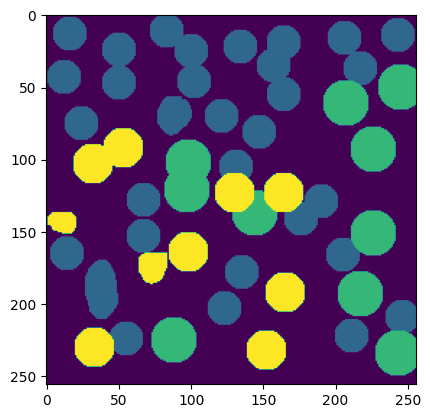

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.0ms
Speed: 7.6ms preprocess, 182.0ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(239, 208, 256, 233)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.5ms
Speed: 7.0ms preprocess, 182.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 90, 80, 113)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.5ms
Speed: 10.2ms preprocess, 181.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(227, 0, 250, 21)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.0ms
Speed: 7.5ms preprocess, 185.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 67, 68, 83)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 180.9ms
Speed: 6.3ms preprocess, 180.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 45, 58, 64)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.3ms
Speed: 6.6ms preprocess, 185.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 29, 182, 55)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.3ms
Speed: 6.7ms preprocess, 181.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(205, 31, 228, 58)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(235, 35, 256, 58)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 183.9ms
Speed: 6.6ms preprocess, 183.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  840.0 bbox 256
fixed shape for a cell
(226, 63, 249, 86)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1574.0 bbox 256
fixed shape for a cell
(191, 77, 214, 100)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 180.6ms
Speed: 7.8ms preprocess, 180.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 128, 29, 153)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  954.0 bbox 256
fixed shape for a cell
(20, 112, 43, 135)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(61, 147, 85, 184)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.6ms
Speed: 8.3ms preprocess, 181.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 207, 75, 230)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 235, 76, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.3ms
Speed: 6.5ms preprocess, 181.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1043.0 bbox 256
fixed shape for a cell
(87, 102, 110, 125)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 218, 109, 234)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 8, 55, 31)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 25, 36, 48)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.7ms
Speed: 6.1ms preprocess, 181.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(119, 0, 146, 24)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.2ms
Speed: 6.5ms preprocess, 182.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  954.0 bbox 256
fixed shape for a cell
(34, 134, 57, 157)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.4ms
Speed: 6.4ms preprocess, 181.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 224, 49, 247)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.1ms
Speed: 6.6ms preprocess, 184.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 113, 84, 136)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 188.6ms
Speed: 6.6ms preprocess, 188.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(205, 134, 231, 158)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 187.4ms
Speed: 6.4ms preprocess, 187.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 96, 246, 124)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 180.8ms
Speed: 6.4ms preprocess, 180.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1035.0 bbox 256
fixed shape for a cell
(151, 90, 174, 113)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.8ms
Speed: 7.1ms preprocess, 181.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 118, 213, 144)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.3ms
Speed: 7.5ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(223, 191, 252, 212)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.3ms
Speed: 6.4ms preprocess, 182.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 223, 210, 252)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 187.7ms
Speed: 6.3ms preprocess, 187.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(215, 225, 242, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.7ms
Speed: 6.4ms preprocess, 181.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 116, 169, 136)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.4ms
Speed: 6.7ms preprocess, 181.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 136, 165, 163)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.1ms
Speed: 8.8ms preprocess, 181.1ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1043.0 bbox 256
fixed shape for a cell
(113, 103, 136, 126)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(89, 75, 109, 95)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.6ms
Speed: 6.6ms preprocess, 181.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 129, 111, 153)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 180.6ms
Speed: 6.4ms preprocess, 180.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  938.0 bbox 256
fixed shape for a cell
(95, 168, 118, 191)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 198, 133, 224)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.5ms
Speed: 6.5ms preprocess, 181.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 223, 142, 246)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  783.0 bbox 256
fixed shape for a cell
(159, 177, 182, 200)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 188.6ms
Speed: 4.8ms preprocess, 188.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(185, 170, 212, 197)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1081.0 bbox 256
fixed shape for a cell
(106, 57, 129, 80)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(141, 203, 176, 233)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 53, 219, 102)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(82, 0, 111, 29)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.3ms
Speed: 6.4ms preprocess, 182.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 56, 165, 81)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 0, 204, 21)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.6ms
Speed: 6.5ms preprocess, 184.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 140, 198, 170)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.2ms
Speed: 7.6ms preprocess, 184.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 165, 34, 192)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.4ms
Speed: 9.5ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 18, 79, 38)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 182.2ms
Speed: 6.6ms preprocess, 182.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 24, 129, 45)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 186.0ms
Speed: 6.6ms preprocess, 186.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 37, 105, 56)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 197, 208, 224)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 184.7ms
Speed: 6.1ms preprocess, 184.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(229, 158, 256, 185)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-2000.png: 1024x1024 43 objects, 181.5ms
Speed: 7.1ms preprocess, 181.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(204, 0, 231, 25)
FINAL MASK!!!


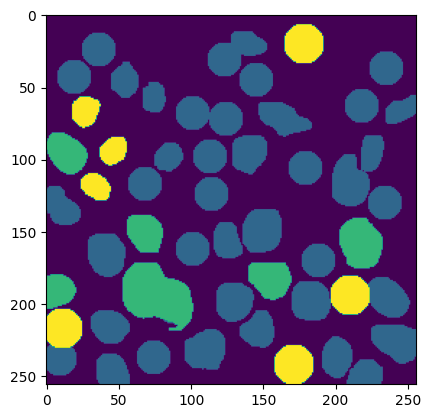

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.8ms
Speed: 7.2ms preprocess, 184.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1303.0 bbox 256
fixed shape for a cell
(234, 203, 256, 226)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.1ms
Speed: 6.7ms preprocess, 183.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  902.0 bbox 256
fixed shape for a cell
(20, 20, 43, 43)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 181.8ms
Speed: 6.5ms preprocess, 181.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 217, 57, 243)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 186.4ms
Speed: 8.5ms preprocess, 186.4ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 65, 28, 103)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 188.2ms
Speed: 7.3ms preprocess, 188.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  863.0 bbox 256
fixed shape for a cell
(21, 57, 44, 80)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 185.5ms
Speed: 6.1ms preprocess, 185.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 123, 30, 146)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 186.2ms
Speed: 6.6ms preprocess, 186.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 151, 50, 174)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 181.0ms
Speed: 10.5ms preprocess, 181.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 232, 35, 255)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.3ms
Speed: 8.3ms preprocess, 183.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 228, 77, 251)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 190.5ms
Speed: 6.1ms preprocess, 190.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 236, 105, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 240, 169, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 180.0ms
Speed: 6.4ms preprocess, 180.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(178, 195, 201, 218)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  863.0 bbox 256
fixed shape for a cell
(44, 52, 67, 75)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 186.6ms
Speed: 6.3ms preprocess, 186.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 91, 237, 115)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 180.6ms
Speed: 6.3ms preprocess, 180.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 12, 146, 35)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.8ms
Speed: 6.0ms preprocess, 184.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 0, 100, 18)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 186.9ms
Speed: 6.2ms preprocess, 186.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 87, 212, 111)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.8ms
Speed: 7.7ms preprocess, 182.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 140, 151, 163)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.5ms
Speed: 6.7ms preprocess, 184.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 38, 97, 73)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.5ms
Speed: 7.0ms preprocess, 184.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 98, 56, 119)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 188.3ms
Speed: 6.3ms preprocess, 188.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 170, 37, 193)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 0, 162, 16)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 78, 66, 100)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 180.8ms
Speed: 6.3ms preprocess, 180.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 104, 131, 125)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.9ms
Speed: 6.7ms preprocess, 184.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(2, 210, 25, 233)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.0ms
Speed: 7.0ms preprocess, 183.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 118, 66, 139)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(236, 143, 256, 186)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 187.6ms
Speed: 7.4ms preprocess, 187.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 48, 256, 72)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 180.5ms
Speed: 6.3ms preprocess, 180.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 37, 193, 56)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 38, 146, 62)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 213, 164, 240)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.4ms
Speed: 6.7ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(65, 84, 99, 106)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 187.4ms
Speed: 6.9ms preprocess, 187.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 180, 229, 203)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.9ms
Speed: 9.6ms preprocess, 182.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 61, 142, 87)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.1ms
Speed: 6.7ms preprocess, 184.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 97, 180, 119)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 187.7ms
Speed: 6.1ms preprocess, 187.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1303.0 bbox 256
fixed shape for a cell
(216, 219, 239, 242)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(156, 10, 193, 32)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 185, 152, 211)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 184.7ms
Speed: 11.0ms preprocess, 184.7ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(100, 215, 123, 239)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 186.4ms
Speed: 10.0ms preprocess, 186.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 196, 100, 225)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.8ms
Speed: 6.5ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 154, 136, 177)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 185.4ms
Speed: 10.3ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 151, 195, 174)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 180.2ms
Speed: 11.3ms preprocess, 180.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1191.0 bbox 256
fixed shape for a cell
(58, 171, 81, 194)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.6ms
Speed: 7.0ms preprocess, 182.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(71, 136, 94, 159)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 183.6ms
Speed: 6.6ms preprocess, 183.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 111, 102, 137)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.9ms
Speed: 6.2ms preprocess, 182.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(236, 143, 256, 186)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(220, 117, 249, 143)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 0, 44, 26)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 187.0ms
Speed: 6.5ms preprocess, 187.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 6, 121, 38)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 15, 79, 38)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 187.3ms
Speed: 6.1ms preprocess, 187.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(205, 59, 233, 86)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 185.8ms
Speed: 6.8ms preprocess, 185.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 34, 17, 59)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 182.4ms
Speed: 6.9ms preprocess, 182.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(175, 0, 192, 16)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0001.png: 1024x1024 43 objects, 186.1ms
Speed: 6.7ms preprocess, 186.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(156, 10, 193, 32)
FINAL MASK!!!


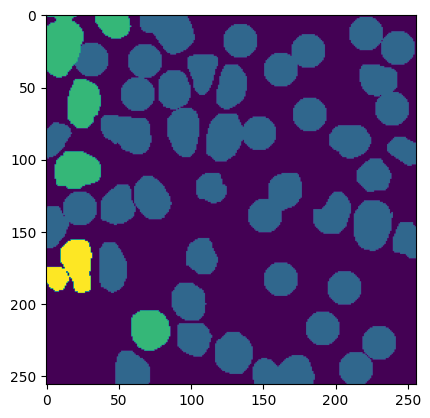

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 181.6ms
Speed: 6.2ms preprocess, 181.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(221, 78, 245, 106)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(9, 142, 34, 165)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 180.3ms
Speed: 6.5ms preprocess, 180.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 0, 177, 26)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.2ms
Speed: 6.6ms preprocess, 184.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 185, 152, 201)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 187.6ms
Speed: 6.8ms preprocess, 187.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(217, 177, 239, 201)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 189, 74, 208)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.7ms
Speed: 6.4ms preprocess, 184.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 207, 65, 230)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(24, 26, 48, 47)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 39, 75, 59)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  941.0 bbox 256
fixed shape for a cell
(9, 117, 32, 140)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 181.9ms
Speed: 6.9ms preprocess, 181.9ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 60, 83, 75)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 186.3ms
Speed: 6.5ms preprocess, 186.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(10, 55, 32, 75)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 181.7ms
Speed: 7.2ms preprocess, 181.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 229, 230, 252)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 181.2ms
Speed: 11.1ms preprocess, 181.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  901.0 bbox 256
fixed shape for a cell
(144, 81, 167, 104)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 3, 65, 26)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 188.9ms
Speed: 6.1ms preprocess, 188.9ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 222, 199, 245)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 185.3ms
Speed: 6.7ms preprocess, 185.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 232, 161, 255)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  970.0 bbox 256
fixed shape for a cell
(84, 82, 107, 105)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 186.1ms
Speed: 11.7ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 111, 118, 134)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 187.8ms
Speed: 6.2ms preprocess, 187.8ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(89, 62, 113, 79)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 188.1ms
Speed: 6.3ms preprocess, 188.1ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 212, 35, 237)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 180.9ms
Speed: 11.4ms preprocess, 180.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(170, 68, 200, 94)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 187.8ms
Speed: 6.2ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1211.0 bbox 256
fixed shape for a cell
(95, 224, 118, 247)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 186.8ms
Speed: 6.8ms preprocess, 186.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(220, 115, 243, 138)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 182.9ms
Speed: 7.3ms preprocess, 182.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 105, 194, 130)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.5ms
Speed: 7.1ms preprocess, 184.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  901.0 bbox 256
fixed shape for a cell
(134, 92, 157, 115)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(128, 119, 152, 142)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 188.0ms
Speed: 7.6ms preprocess, 188.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 144, 176, 167)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(127, 66, 152, 85)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 237, 67, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 182.6ms
Speed: 6.5ms preprocess, 182.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(194, 57, 217, 80)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(215, 45, 235, 67)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 188.1ms
Speed: 6.2ms preprocess, 188.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 21, 209, 42)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 189.1ms
Speed: 6.1ms preprocess, 189.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 32, 191, 55)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 187.2ms
Speed: 7.5ms preprocess, 187.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 100, 97, 122)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 133, 116, 150)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 141, 256, 171)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 233, 96, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 187.6ms
Speed: 6.4ms preprocess, 187.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(94, 172, 125, 201)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(61, 163, 89, 184)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 182.5ms
Speed: 9.4ms preprocess, 182.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 81, 65, 104)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 102, 38, 140)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 186.0ms
Speed: 7.2ms preprocess, 186.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 7, 27, 34)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 189.1ms
Speed: 6.5ms preprocess, 189.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 24, 122, 57)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 188.0ms
Speed: 7.4ms preprocess, 188.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 205, 254, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 153, 149, 172)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 185.3ms
Speed: 9.0ms preprocess, 185.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 204, 136, 251)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 181.6ms
Speed: 6.6ms preprocess, 181.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 0, 248, 19)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 181.5ms
Speed: 6.1ms preprocess, 181.5ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(96, 0, 123, 27)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 183.1ms
Speed: 6.7ms preprocess, 183.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 17, 146, 44)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 185, 44, 212)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 183.2ms
Speed: 6.7ms preprocess, 183.2ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 109, 68, 126)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 182.2ms
Speed: 7.2ms preprocess, 182.2ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(191, 185, 218, 212)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 182.2ms
Speed: 12.4ms preprocess, 182.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 130, 72, 146)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 158, 62, 171)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 189.0ms
Speed: 6.3ms preprocess, 189.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 32, 163, 59)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0010.png: 1024x1024 41 objects, 188.6ms
Speed: 6.6ms preprocess, 188.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(178, 142, 205, 169)
FINAL MASK!!!


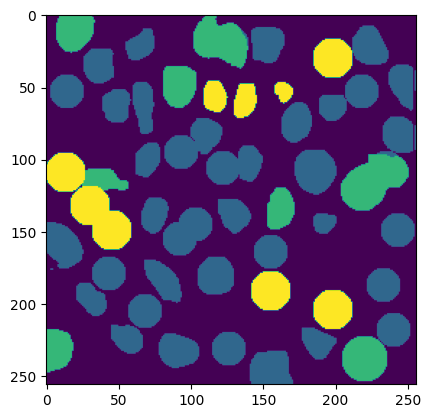

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 18, 209, 41)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 186.7ms
Speed: 6.2ms preprocess, 186.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1343.0 bbox 256
fixed shape for a cell
(180, 196, 203, 219)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.7ms
Speed: 6.7ms preprocess, 183.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 229, 187, 252)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.1ms
Speed: 7.2ms preprocess, 187.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(108, 158, 134, 180)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.8ms
Speed: 10.3ms preprocess, 185.8ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 208, 88, 231)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.6ms
Speed: 6.3ms preprocess, 187.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 179, 60, 206)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.9ms
Speed: 7.2ms preprocess, 183.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(14, 168, 34, 188)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 128, 54, 150)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.6ms
Speed: 6.5ms preprocess, 185.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(10, 15, 34, 44)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.4ms
Speed: 6.6ms preprocess, 183.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 113, 151, 136)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.3ms
Speed: 6.7ms preprocess, 183.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1343.0 bbox 256
fixed shape for a cell
(157, 189, 180, 212)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 186.5ms
Speed: 6.7ms preprocess, 186.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 185, 102, 205)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.5ms
Speed: 7.3ms preprocess, 185.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 158, 78, 176)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 0, 152, 17)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(104, 137, 128, 159)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 181.7ms
Speed: 6.6ms preprocess, 181.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(239, 0, 256, 23)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.1ms
Speed: 6.6ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1343.0 bbox 256
fixed shape for a cell
(192, 187, 215, 210)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(236, 219, 256, 242)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 184.3ms
Speed: 6.6ms preprocess, 184.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 235, 246, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.6ms
Speed: 6.9ms preprocess, 188.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 164, 187, 185)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.1ms
Speed: 6.3ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 189, 256, 211)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 181.6ms
Speed: 10.2ms preprocess, 181.6ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 36, 121, 64)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.6ms
Speed: 8.8ms preprocess, 185.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(43, 14, 71, 38)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 46, 83, 74)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 48, 44, 73)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.5ms
Speed: 6.1ms preprocess, 188.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 22, 142, 43)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 189.1ms
Speed: 7.0ms preprocess, 189.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(240, 75, 256, 99)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 71, 71, 94)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 181.7ms
Speed: 11.8ms preprocess, 181.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 82, 239, 110)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.0ms
Speed: 7.2ms preprocess, 188.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 46, 211, 64)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.4ms
Speed: 7.0ms preprocess, 185.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 47, 185, 70)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 31, 170, 53)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 181.5ms
Speed: 6.3ms preprocess, 181.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(224, 108, 249, 132)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(206, 122, 225, 141)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.3ms
Speed: 6.0ms preprocess, 188.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 128, 177, 151)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(128, 48, 149, 72)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.5ms
Speed: 6.5ms preprocess, 188.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(98, 189, 127, 218)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(82, 225, 119, 254)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 210, 158, 241)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 217, 58, 241)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 85, 33, 135)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 184.1ms
Speed: 9.2ms preprocess, 184.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 127, 209, 167)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 85, 197, 113)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.4ms
Speed: 7.6ms preprocess, 183.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 151, 169, 176)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 135, 141, 153)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.8ms
Speed: 6.4ms preprocess, 188.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 144, 256, 171)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 185.6ms
Speed: 6.7ms preprocess, 185.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 29, 251, 56)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 61, 20, 74)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 118, 112, 145)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 82, 141, 109)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.1ms
Speed: 6.8ms preprocess, 187.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 56, 234, 83)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.7ms
Speed: 6.3ms preprocess, 188.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 0, 225, 23)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 188.4ms
Speed: 7.9ms preprocess, 188.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 185, 23, 212)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 187.1ms
Speed: 6.6ms preprocess, 187.1ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(208, 164, 235, 191)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0011.png: 1024x1024 41 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(36, 93, 57, 113)
FINAL MASK!!!


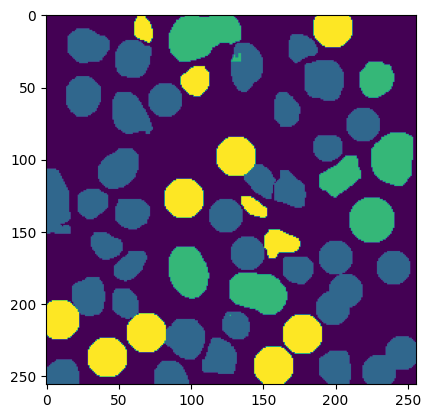

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 0, 93, 24)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.1ms
Speed: 6.5ms preprocess, 183.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(173, 6, 196, 29)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.3ms
Speed: 6.8ms preprocess, 183.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 0, 159, 20)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 185.1ms
Speed: 10.2ms preprocess, 185.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 0, 127, 31)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(86, 20, 113, 55)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.8ms
Speed: 6.6ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 51, 72, 70)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.9ms
Speed: 6.7ms preprocess, 186.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 48, 22, 72)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 136, 64, 157)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 185.1ms
Speed: 6.5ms preprocess, 185.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(235, 18, 256, 41)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(50, 158, 73, 172)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.6ms
Speed: 6.3ms preprocess, 187.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 166, 162, 189)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 188.7ms
Speed: 6.3ms preprocess, 188.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 127, 146, 151)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 99, 161, 120)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 100, 137, 122)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.4ms
Speed: 6.6ms preprocess, 187.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(106, 44, 125, 61)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.1ms
Speed: 7.1ms preprocess, 187.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 16, 15, 35)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.5ms
Speed: 6.5ms preprocess, 183.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 80, 33, 103)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 194, 158, 215)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 18, 229, 41)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 188.1ms
Speed: 6.5ms preprocess, 188.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 0, 237, 16)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  877.0 bbox 256
fixed shape for a cell
(221, 96, 244, 119)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 242, 123, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 218, 64, 242)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  798.0 bbox 256
fixed shape for a cell
(215, 57, 238, 80)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(82, 147, 114, 176)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 184.3ms
Speed: 7.5ms preprocess, 184.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 176, 71, 198)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 200, 20, 239)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 188.3ms
Speed: 6.5ms preprocess, 188.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  883.0 bbox 256
fixed shape for a cell
(0, 163, 22, 186)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 189.8ms
Speed: 6.4ms preprocess, 189.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  883.0 bbox 256
fixed shape for a cell
(1, 142, 24, 165)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.0ms
Speed: 8.2ms preprocess, 187.0ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 106, 47, 127)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.5ms
Speed: 9.1ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(67, 201, 88, 223)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 184.9ms
Speed: 8.0ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(83, 119, 115, 142)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 185.8ms
Speed: 8.6ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 109, 81, 129)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.0ms
Speed: 8.9ms preprocess, 187.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  931.0 bbox 256
fixed shape for a cell
(174, 88, 197, 111)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 180.9ms
Speed: 6.4ms preprocess, 180.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  915.0 bbox 256
fixed shape for a cell
(171, 48, 194, 71)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(189, 119, 220, 145)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 76, 128, 98)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.5ms
Speed: 7.3ms preprocess, 187.5ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 85, 77, 106)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(213, 224, 244, 255)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 212, 111, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 180.5ms
Speed: 6.9ms preprocess, 180.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(238, 146, 256, 173)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 188.3ms
Speed: 6.4ms preprocess, 188.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(100, 170, 131, 192)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(132, 36, 155, 66)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 191, 210, 219)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 188.2ms
Speed: 6.0ms preprocess, 188.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(17, 21, 56, 52)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(228, 194, 256, 221)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 61, 156, 92)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.5ms
Speed: 7.0ms preprocess, 187.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(206, 166, 232, 188)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 195, 104, 208)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 220, 197, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 187.2ms
Speed: 6.9ms preprocess, 187.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 61, 57, 81)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 26, 81, 53)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 184.1ms
Speed: 6.5ms preprocess, 184.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 235, 53, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0002.png: 1024x1024 51 objects, 188.2ms
Speed: 6.4ms preprocess, 188.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(179, 152, 200, 174)
FINAL MASK!!!


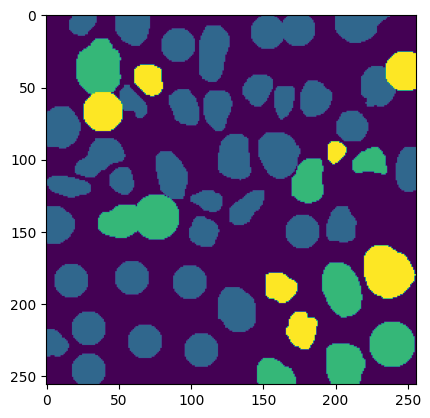

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 24, 47, 47)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1000.0 bbox 256
fixed shape for a cell
(202, 44, 225, 67)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(163, 37, 181, 60)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.5ms
Speed: 6.6ms preprocess, 183.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 53, 28, 86)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 185.2ms
Speed: 6.7ms preprocess, 185.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(241, 28, 256, 57)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 67, 58, 90)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 54, 79, 78)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.6ms
Speed: 6.8ms preprocess, 182.6ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  816.0 bbox 256
fixed shape for a cell
(73, 3, 96, 26)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 0, 13, 42)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.7ms
Speed: 6.1ms preprocess, 182.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(22, 218, 39, 239)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(179, 52, 202, 75)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.6ms
Speed: 8.2ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(205, 208, 228, 231)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 181.7ms
Speed: 6.1ms preprocess, 181.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(187, 175, 210, 198)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 186.7ms
Speed: 6.1ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(212, 113, 235, 136)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.6ms
Speed: 11.6ms preprocess, 183.6ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 4, 164, 27)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 185.4ms
Speed: 10.7ms preprocess, 185.4ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 0, 139, 23)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 40, 108, 63)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(217, 161, 242, 183)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.5ms
Speed: 6.6ms preprocess, 182.5ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1000.0 bbox 256
fixed shape for a cell
(210, 22, 233, 45)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.0ms
Speed: 6.6ms preprocess, 187.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(162, 79, 184, 107)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 186.7ms
Speed: 6.3ms preprocess, 186.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 83, 140, 111)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 180.9ms
Speed: 6.3ms preprocess, 180.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 98, 103, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 181.5ms
Speed: 6.4ms preprocess, 181.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(156, 216, 191, 240)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 238, 170, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 185.1ms
Speed: 6.8ms preprocess, 185.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 208, 139, 233)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.0ms
Speed: 7.6ms preprocess, 187.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 229, 127, 252)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 183, 105, 208)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 208, 65, 231)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(235, 193, 256, 216)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 184.7ms
Speed: 7.2ms preprocess, 184.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(181, 104, 214, 132)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 161, 172, 180)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 185.1ms
Speed: 6.6ms preprocess, 185.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(198, 131, 224, 161)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 188.1ms
Speed: 6.2ms preprocess, 188.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1856.0 bbox 256
fixed shape for a cell
(126, 140, 149, 163)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.7ms
Speed: 7.2ms preprocess, 183.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 112, 121, 140)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  819.0 bbox 256
fixed shape for a cell
(15, 104, 38, 127)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 135, 48, 168)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  988.0 bbox 256
fixed shape for a cell
(53, 151, 76, 174)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 146, 26, 173)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.7ms
Speed: 6.2ms preprocess, 182.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(226, 229, 249, 252)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.5ms
Speed: 6.7ms preprocess, 187.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(98, 147, 123, 181)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 187.0ms
Speed: 6.2ms preprocess, 187.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 143, 191, 162)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 186.8ms
Speed: 6.6ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 239, 62, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 187, 177, 216)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.4ms
Speed: 11.0ms preprocess, 182.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1856.0 bbox 576
fixed shape for a cell
(133, 112, 164, 143)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 191, 23, 222)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 180.0ms
Speed: 10.6ms preprocess, 180.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(231, 140, 256, 167)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 79, 222, 106)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 43, 154, 73)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 181.3ms
Speed: 6.8ms preprocess, 181.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 14, 132, 41)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(225, 72, 252, 99)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 181.7ms
Speed: 6.5ms preprocess, 181.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 89, 79, 116)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 110, 256, 137)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0003.png: 1024x1024 32 objects, 188.1ms
Speed: 6.1ms preprocess, 188.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(38, 0, 65, 21)
FINAL MASK!!!


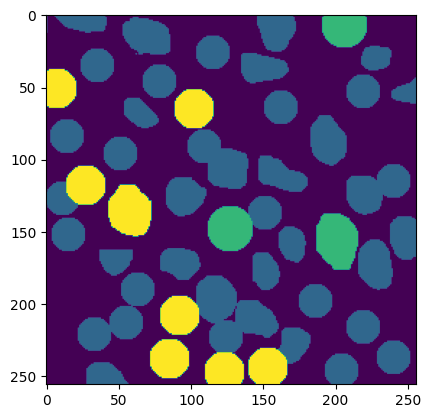

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 182.2ms
Speed: 6.2ms preprocess, 182.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 147, 256, 183)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 181.1ms
Speed: 6.7ms preprocess, 181.1ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 233, 115, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 185.9ms
Speed: 6.5ms preprocess, 185.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(102, 188, 129, 211)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 183.9ms
Speed: 6.8ms preprocess, 183.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(78, 191, 101, 221)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 205, 74, 231)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.0ms
Speed: 6.6ms preprocess, 184.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 181, 65, 202)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.3ms
Speed: 7.4ms preprocess, 184.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 155, 71, 177)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 185.7ms
Speed: 6.9ms preprocess, 185.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(41, 126, 64, 145)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 3, 132, 26)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.1ms
Speed: 6.1ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 16, 91, 37)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 104, 194, 119)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 9, 51, 26)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.2ms
Speed: 6.4ms preprocess, 187.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 66, 48, 96)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 185.2ms
Speed: 6.5ms preprocess, 185.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 0, 74, 16)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 33, 136, 57)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.4ms
Speed: 7.0ms preprocess, 184.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 122, 158, 150)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 185.4ms
Speed: 7.0ms preprocess, 185.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 152, 182, 173)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 161, 137, 184)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(7, 121, 31, 141)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.7ms
Speed: 6.8ms preprocess, 184.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 213, 20, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 188.9ms
Speed: 6.4ms preprocess, 188.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(243, 49, 256, 73)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(22, 46, 43, 63)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 181.0ms
Speed: 7.3ms preprocess, 181.0ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 148, 106, 171)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.7ms
Speed: 6.2ms preprocess, 187.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 221, 150, 244)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.7ms
Speed: 6.3ms preprocess, 186.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 61, 116, 87)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 185.8ms
Speed: 6.6ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1217.0 bbox 256
fixed shape for a cell
(225, 98, 248, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 181.1ms
Speed: 8.3ms preprocess, 181.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(208, 127, 240, 153)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 182.1ms
Speed: 8.8ms preprocess, 182.1ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 182, 243, 203)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 185.5ms
Speed: 7.0ms preprocess, 185.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(229, 214, 252, 242)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 171, 206, 198)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 183.8ms
Speed: 8.3ms preprocess, 183.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(188, 146, 214, 168)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 62, 238, 90)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.3ms
Speed: 7.2ms preprocess, 187.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 22, 244, 48)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 112, 95, 138)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  898.0 bbox 256
fixed shape for a cell
(156, 39, 179, 62)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 181.9ms
Speed: 6.5ms preprocess, 181.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(163, 0, 192, 22)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.4ms
Speed: 7.5ms preprocess, 187.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(184, 27, 210, 59)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.1ms
Speed: 6.5ms preprocess, 184.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1217.0 bbox 256
fixed shape for a cell
(200, 98, 223, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(78, 73, 102, 98)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 96, 124, 119)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.9ms
Speed: 5.3ms preprocess, 184.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(132, 101, 158, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 182.9ms
Speed: 6.6ms preprocess, 182.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(154, 70, 179, 98)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.5ms
Speed: 6.6ms preprocess, 186.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 62, 204, 99)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.9ms
Speed: 6.9ms preprocess, 187.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(134, 177, 168, 208)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.8ms
Speed: 6.4ms preprocess, 187.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 101, 48, 132)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 181.9ms
Speed: 6.3ms preprocess, 181.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(21, 221, 55, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 162, 23, 193)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 189.5ms
Speed: 5.2ms preprocess, 189.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 121, 37, 161)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 81, 78, 116)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 181.4ms
Speed: 11.5ms preprocess, 181.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(104, 128, 136, 150)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 187.6ms
Speed: 6.2ms preprocess, 187.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 70, 146, 96)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 183.5ms
Speed: 6.8ms preprocess, 183.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(163, 123, 196, 144)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 186.3ms
Speed: 8.7ms preprocess, 186.3ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(193, 201, 220, 228)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0004.png: 1024x1024 51 objects, 184.9ms
Speed: 5.9ms preprocess, 184.9ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(52, 54, 72, 72)
FINAL MASK!!!


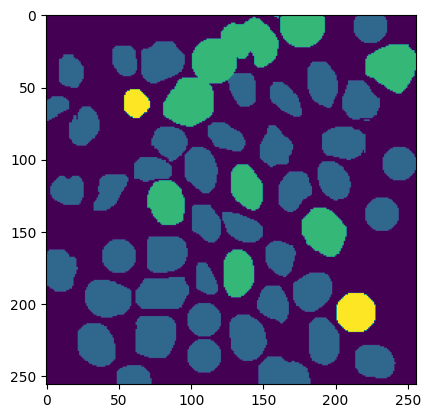

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.2ms
Speed: 6.5ms preprocess, 183.2ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 209, 170, 241)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.3ms
Speed: 7.2ms preprocess, 184.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 136, 214, 158)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 187.9ms
Speed: 6.5ms preprocess, 187.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 177, 201, 207)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 186.4ms
Speed: 6.1ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(14, 15, 44, 43)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.7ms
Speed: 10.6ms preprocess, 184.7ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 182, 71, 202)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.7ms
Speed: 9.1ms preprocess, 183.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 204, 133, 227)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 219, 122, 242)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.4ms
Speed: 6.7ms preprocess, 184.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(221, 131, 244, 154)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(205, 109, 228, 132)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.6ms
Speed: 6.4ms preprocess, 183.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 136, 214, 158)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(237, 39, 256, 62)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 187.1ms
Speed: 6.0ms preprocess, 187.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 109, 136, 132)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 188.4ms
Speed: 6.9ms preprocess, 188.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 23, 74, 46)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 186.6ms
Speed: 8.8ms preprocess, 186.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(94, 74, 114, 91)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 45, 104, 65)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 22, 99, 42)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.2ms
Speed: 7.9ms preprocess, 183.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(233, 62, 256, 85)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  957.0 bbox 256
fixed shape for a cell
(206, 61, 229, 84)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 107, 34, 130)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(238, 159, 256, 189)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1014.0 bbox 256
fixed shape for a cell
(175, 213, 198, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(50, 83, 71, 103)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 168, 159, 190)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.7ms
Speed: 6.5ms preprocess, 184.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 156, 183, 177)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.8ms
Speed: 7.3ms preprocess, 185.8ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 184, 119, 204)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.7ms
Speed: 6.0ms preprocess, 184.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 52, 142, 76)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 90, 150, 117)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1016.0 bbox 256
fixed shape for a cell
(90, 90, 113, 113)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  829.0 bbox 256
fixed shape for a cell
(45, 146, 68, 169)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1149.0 bbox 256
fixed shape for a cell
(108, 136, 131, 159)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 238, 110, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 182.1ms
Speed: 7.9ms preprocess, 182.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 225, 85, 248)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 188.1ms
Speed: 6.6ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(15, 219, 50, 246)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.4ms
Speed: 6.7ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(96, 29, 131, 56)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 181.0ms
Speed: 8.9ms preprocess, 181.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 201, 81, 220)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.1ms
Speed: 7.2ms preprocess, 183.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 147, 23, 183)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 186.7ms
Speed: 7.8ms preprocess, 186.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  842.0 bbox 256
fixed shape for a cell
(42, 57, 65, 80)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 180, 243, 207)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 184.6ms
Speed: 6.6ms preprocess, 184.6ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(104, 8, 131, 24)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 180.9ms
Speed: 6.4ms preprocess, 180.9ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1014.0 bbox 256
fixed shape for a cell
(196, 213, 219, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 188.4ms
Speed: 6.3ms preprocess, 188.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(178, 43, 206, 66)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(215, 24, 239, 48)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.4ms
Speed: 7.8ms preprocess, 185.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1149.0 bbox 256
fixed shape for a cell
(130, 133, 153, 156)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.4ms
Speed: 6.5ms preprocess, 183.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 189, 38, 214)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 55, 182, 98)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 188.2ms
Speed: 6.2ms preprocess, 188.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 148, 107, 179)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.4ms
Speed: 9.4ms preprocess, 185.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 50, 27, 73)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(189, 63, 231, 96)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 185.5ms
Speed: 7.9ms preprocess, 185.5ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 113, 191, 141)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 182.6ms
Speed: 6.0ms preprocess, 182.6ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(50, 107, 94, 143)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 188.4ms
Speed: 6.5ms preprocess, 188.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(229, 233, 247, 250)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 187.3ms
Speed: 6.1ms preprocess, 187.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(89, 203, 104, 217)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0005.png: 1024x1024 52 objects, 183.3ms
Speed: 6.9ms preprocess, 183.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(144, 0, 170, 20)
FINAL MASK!!!


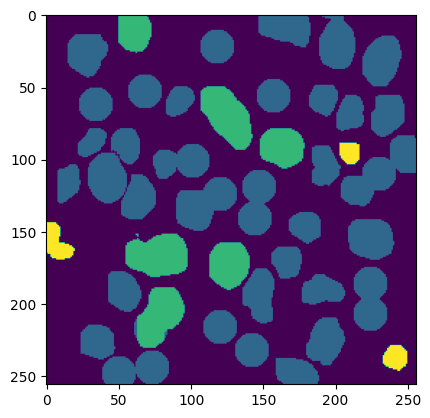

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.6ms
Speed: 6.3ms preprocess, 186.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 162, 256, 182)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.5ms
Speed: 5.0ms preprocess, 183.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1319.0 bbox 256
fixed shape for a cell
(1, 82, 24, 105)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.8ms
Speed: 6.6ms preprocess, 183.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 61, 37, 84)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 181.3ms
Speed: 6.3ms preprocess, 181.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 74, 72, 97)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.3ms
Speed: 7.4ms preprocess, 186.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 0, 123, 23)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.6ms
Speed: 6.2ms preprocess, 187.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(34, 37, 56, 65)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.2ms
Speed: 6.7ms preprocess, 187.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 0, 163, 21)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.1ms
Speed: 6.6ms preprocess, 183.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(174, 67, 197, 90)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 185.2ms
Speed: 7.9ms preprocess, 185.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 86, 195, 109)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 98, 54, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 185.0ms
Speed: 6.0ms preprocess, 185.0ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 70, 167, 94)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 175, 154, 206)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.2ms
Speed: 11.1ms preprocess, 183.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(154, 149, 176, 172)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 239, 170, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(2, 38, 25, 61)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(227, 15, 249, 35)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 184.3ms
Speed: 6.6ms preprocess, 184.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 162, 20, 185)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.3ms
Speed: 6.1ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(216, 181, 233, 198)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.7ms
Speed: 6.2ms preprocess, 187.7ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(94, 81, 114, 98)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.5ms
Speed: 11.3ms preprocess, 186.5ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(119, 70, 138, 87)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 181.5ms
Speed: 6.5ms preprocess, 181.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 94, 144, 119)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.6ms
Speed: 6.4ms preprocess, 187.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(67, 16, 91, 35)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.2ms
Speed: 6.5ms preprocess, 183.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 119, 93, 144)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 117, 228, 134)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 189.0ms
Speed: 7.0ms preprocess, 189.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(234, 47, 256, 89)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(234, 97, 256, 133)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 99, 98, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 181.0ms
Speed: 11.7ms preprocess, 181.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(209, 137, 232, 160)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 181.8ms
Speed: 10.2ms preprocess, 181.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 110, 198, 143)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 83, 224, 113)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 182.5ms
Speed: 6.9ms preprocess, 182.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(197, 50, 218, 75)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(234, 47, 256, 89)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(177, 149, 207, 166)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 185.3ms
Speed: 7.1ms preprocess, 185.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(175, 171, 206, 197)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(2, 129, 32, 159)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.8ms
Speed: 6.7ms preprocess, 186.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 144, 69, 170)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 182.0ms
Speed: 6.5ms preprocess, 182.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1277.0 bbox 256
fixed shape for a cell
(40, 176, 63, 199)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 182.7ms
Speed: 6.5ms preprocess, 182.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1277.0 bbox 256
fixed shape for a cell
(33, 197, 56, 220)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  789.0 bbox 256
fixed shape for a cell
(8, 216, 31, 239)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.6ms
Speed: 6.5ms preprocess, 183.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 177, 95, 200)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(89, 155, 121, 181)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 181.6ms
Speed: 6.1ms preprocess, 181.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(181, 229, 209, 254)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.2ms
Speed: 6.5ms preprocess, 183.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 233, 248, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 84, 54, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 24, 136, 49)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.1ms
Speed: 6.8ms preprocess, 186.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 120, 167, 140)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(65, 16, 95, 74)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 185.2ms
Speed: 7.2ms preprocess, 185.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(65, 16, 95, 74)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 185.7ms
Speed: 7.8ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 0, 56, 26)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 184.9ms
Speed: 8.4ms preprocess, 184.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 185, 112, 212)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 19, 190, 54)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.5ms
Speed: 6.6ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 209, 165, 234)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(205, 215, 224, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 184.9ms
Speed: 8.4ms preprocess, 184.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(116, 208, 135, 228)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 188.3ms
Speed: 6.3ms preprocess, 188.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 136, 141, 157)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 132, 108, 151)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 62, 104, 78)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(197, 6, 225, 28)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 183.7ms
Speed: 6.5ms preprocess, 183.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 176, 168, 195)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0006.png: 1024x1024 51 objects, 186.8ms
Speed: 7.1ms preprocess, 186.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(188, 196, 215, 223)
FINAL MASK!!!


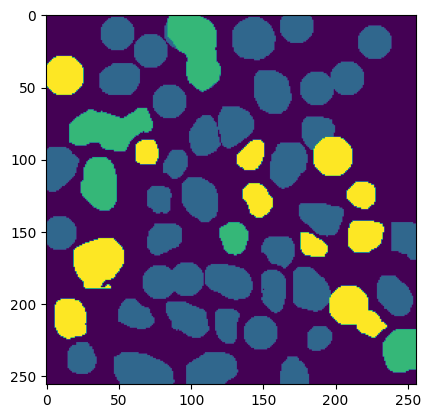

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 182.4ms
Speed: 6.5ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 66, 47, 86)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.0ms
Speed: 10.5ms preprocess, 184.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 208, 45, 231)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 0, 170, 15)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 183.6ms
Speed: 7.7ms preprocess, 183.6ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(104, 0, 130, 15)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(231, 12, 254, 35)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 187.6ms
Speed: 6.2ms preprocess, 187.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 70, 99, 96)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 186.1ms
Speed: 6.7ms preprocess, 186.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 47, 82, 72)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 181.7ms
Speed: 6.4ms preprocess, 181.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 99, 130, 122)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 186.4ms
Speed: 7.0ms preprocess, 186.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 48, 150, 68)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 62, 177, 81)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 48, 185, 66)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.5ms
Speed: 8.5ms preprocess, 185.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 213, 136, 231)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.1ms
Speed: 7.9ms preprocess, 184.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 101, 211, 118)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 182.5ms
Speed: 5.2ms preprocess, 182.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 236, 150, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.6ms
Speed: 6.8ms preprocess, 185.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(199, 2, 222, 25)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(43, 0, 62, 19)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(239, 241, 256, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.1ms
Speed: 7.3ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(221, 88, 250, 103)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 188.2ms
Speed: 6.2ms preprocess, 188.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 116, 104, 134)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 180.6ms
Speed: 6.5ms preprocess, 180.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  835.0 bbox 256
fixed shape for a cell
(97, 224, 120, 247)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(16, 23, 52, 50)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 187.4ms
Speed: 6.7ms preprocess, 187.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 47, 17, 88)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.4ms
Speed: 7.0ms preprocess, 184.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 47, 17, 88)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 186.6ms
Speed: 6.7ms preprocess, 186.6ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 99, 21, 122)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.3ms
Speed: 6.5ms preprocess, 184.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 163, 71, 186)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 201, 86, 226)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 182.7ms
Speed: 9.1ms preprocess, 182.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 167, 116, 192)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.1ms
Speed: 6.4ms preprocess, 184.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 172, 148, 201)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(141, 151, 173, 175)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 126, 153, 149)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 188.1ms
Speed: 6.3ms preprocess, 188.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 98, 168, 121)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.1ms
Speed: 6.5ms preprocess, 185.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(104, 69, 125, 89)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 183.1ms
Speed: 6.9ms preprocess, 183.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 85, 142, 108)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 189.6ms
Speed: 6.6ms preprocess, 189.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 218, 161, 241)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 186.1ms
Speed: 6.8ms preprocess, 186.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 28, 200, 50)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.7ms
Speed: 6.9ms preprocess, 185.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  819.0 bbox 256
fixed shape for a cell
(208, 62, 231, 85)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 187.6ms
Speed: 6.6ms preprocess, 187.6ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(217, 138, 242, 160)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 167, 215, 190)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 181.9ms
Speed: 6.9ms preprocess, 181.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 174, 183, 197)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.5ms
Speed: 6.8ms preprocess, 184.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(187, 215, 211, 239)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 235, 185, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 184.5ms
Speed: 7.0ms preprocess, 184.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 231, 88, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 192, 34, 210)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 187.1ms
Speed: 6.9ms preprocess, 187.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 161, 23, 182)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 28, 236, 52)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(230, 197, 250, 216)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.0ms
Speed: 8.1ms preprocess, 185.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(26, 122, 63, 159)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 183.7ms
Speed: 6.7ms preprocess, 183.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(220, 110, 256, 139)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 186.6ms
Speed: 6.6ms preprocess, 186.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 18, 149, 43)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 85, 187, 96)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 181.6ms
Speed: 6.7ms preprocess, 181.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(170, 118, 189, 130)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0007.png: 1024x1024 45 objects, 185.7ms
Speed: 6.6ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2089.0 bbox 400
fixed shape for a cell
(69, 12, 96, 39)
FINAL MASK!!!


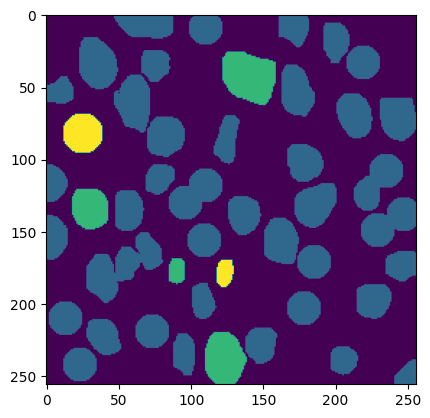

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.6ms
Speed: 6.0ms preprocess, 184.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 0, 186, 29)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 188.7ms
Speed: 6.7ms preprocess, 188.7ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(216, 137, 244, 160)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.4ms
Speed: 6.7ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(235, 93, 256, 125)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  861.0 bbox 256
fixed shape for a cell
(205, 205, 228, 228)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.4ms
Speed: 6.8ms preprocess, 182.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 171, 145, 189)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.3ms
Speed: 6.5ms preprocess, 186.3ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(227, 227, 250, 250)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 181.2ms
Speed: 6.9ms preprocess, 181.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 190, 24, 213)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 180, 45, 203)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.3ms
Speed: 5.8ms preprocess, 186.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 133, 43, 150)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(16, 212, 40, 232)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 183.5ms
Speed: 6.9ms preprocess, 183.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 137, 27, 159)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 178, 232, 199)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(177, 187, 202, 210)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 183.5ms
Speed: 6.7ms preprocess, 183.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(239, 130, 256, 147)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 181.6ms
Speed: 6.3ms preprocess, 181.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(21, 74, 46, 96)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 187.1ms
Speed: 7.2ms preprocess, 187.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  786.0 bbox 256
fixed shape for a cell
(56, 118, 79, 141)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 107, 174, 130)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 20, 96, 43)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.5ms
Speed: 6.5ms preprocess, 184.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 242, 121, 254)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 240, 201, 254)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 188, 76, 211)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.4ms
Speed: 6.5ms preprocess, 182.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1178.0 bbox 256
fixed shape for a cell
(87, 207, 110, 230)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.7ms
Speed: 7.5ms preprocess, 184.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(188, 133, 207, 150)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.4ms
Speed: 7.2ms preprocess, 185.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(51, 154, 74, 177)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1225.0 bbox 256
fixed shape for a cell
(109, 75, 132, 98)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 57, 153, 78)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 181.2ms
Speed: 6.3ms preprocess, 181.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1178.0 bbox 256
fixed shape for a cell
(59, 212, 82, 235)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.4ms
Speed: 8.2ms preprocess, 182.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 92, 194, 115)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.9ms
Speed: 7.2ms preprocess, 185.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(191, 84, 214, 107)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 189.1ms
Speed: 6.3ms preprocess, 189.1ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(232, 51, 256, 90)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.8ms
Speed: 6.9ms preprocess, 185.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 66, 185, 89)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.1ms
Speed: 6.9ms preprocess, 182.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 6, 76, 29)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.7ms
Speed: 9.2ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 15, 255, 35)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 11, 150, 48)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 141, 143, 168)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.2ms
Speed: 6.1ms preprocess, 185.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(150, 138, 181, 159)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 160, 171, 178)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 187.0ms
Speed: 7.3ms preprocess, 187.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 182, 169, 204)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 183.1ms
Speed: 6.6ms preprocess, 183.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 193, 141, 214)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.7ms
Speed: 8.4ms preprocess, 184.7ms inference, 8.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 29, 172, 53)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 187.3ms
Speed: 7.0ms preprocess, 187.3ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 168, 116, 192)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(188, 57, 214, 79)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 230, 168, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 183.6ms
Speed: 6.6ms preprocess, 183.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 48, 75, 73)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(102, 38, 130, 65)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.8ms
Speed: 7.5ms preprocess, 185.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 218, 141, 243)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 74, 132, 123)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 187.9ms
Speed: 6.9ms preprocess, 187.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 109, 93, 141)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 230, 20, 254)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 184.1ms
Speed: 7.2ms preprocess, 184.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 76, 20, 103)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.4ms
Speed: 6.4ms preprocess, 186.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 46, 30, 70)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 185.2ms
Speed: 6.1ms preprocess, 185.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(25, 225, 56, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 181.9ms
Speed: 6.6ms preprocess, 181.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 102, 51, 128)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(232, 51, 246, 66)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(220, 92, 233, 111)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 142, 78, 180)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 181.9ms
Speed: 7.3ms preprocess, 181.9ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 171, 256, 198)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 87, 88, 105)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0008.png: 1024x1024 51 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(133, 91, 160, 118)
FINAL MASK!!!


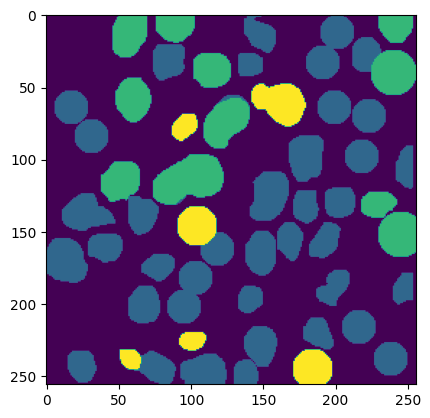

/content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(227, 200, 256, 221)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.8ms
Speed: 8.5ms preprocess, 186.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 161, 156, 184)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 178, 142, 201)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.9ms
Speed: 7.2ms preprocess, 183.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(119, 192, 153, 216)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 70, 64, 93)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.5ms
Speed: 6.5ms preprocess, 184.5ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 213, 46, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 235, 41, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 182.2ms
Speed: 6.4ms preprocess, 182.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 130, 20, 147)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 188.2ms
Speed: 6.5ms preprocess, 188.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(68, 202, 90, 225)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 181.5ms
Speed: 8.6ms preprocess, 181.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 180, 45, 203)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.5ms
Speed: 6.6ms preprocess, 183.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 194, 24, 217)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 170, 65, 190)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.0ms
Speed: 6.5ms preprocess, 186.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 147, 68, 170)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.2ms
Speed: 9.4ms preprocess, 183.2ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 86, 40, 109)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 44, 60, 67)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.3ms
Speed: 9.9ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 199, 181, 214)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(127, 218, 154, 236)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 228, 104, 254)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.6ms
Speed: 6.4ms preprocess, 186.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(82, 168, 105, 191)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(242, 7, 256, 34)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(104, 159, 127, 182)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.0ms
Speed: 6.5ms preprocess, 186.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 142, 107, 169)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.3ms
Speed: 6.5ms preprocess, 185.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 221, 73, 248)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(57, 5, 80, 28)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 181.7ms
Speed: 6.3ms preprocess, 181.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 228, 242, 256)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 181.7ms
Speed: 6.3ms preprocess, 181.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(184, 224, 213, 253)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.5ms
Speed: 6.3ms preprocess, 183.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(187, 199, 219, 220)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.9ms
Speed: 11.7ms preprocess, 183.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  911.0 bbox 256
fixed shape for a cell
(171, 169, 194, 192)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 142, 217, 168)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.3ms
Speed: 6.7ms preprocess, 186.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(221, 138, 249, 167)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 187.0ms
Speed: 6.2ms preprocess, 187.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1091.0 bbox 256
fixed shape for a cell
(162, 35, 185, 58)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 101, 22, 124)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 20, 157, 43)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(106, 50, 136, 74)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.6ms
Speed: 6.5ms preprocess, 184.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 11, 189, 32)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(229, 162, 252, 185)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.3ms
Speed: 6.7ms preprocess, 184.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(43, 14, 66, 37)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 180.8ms
Speed: 6.3ms preprocess, 180.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 29, 108, 54)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 81, 157, 102)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 187.0ms
Speed: 6.9ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 0, 109, 14)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1081.0 bbox 256
fixed shape for a cell
(152, 138, 175, 161)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 181.1ms
Speed: 6.0ms preprocess, 181.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 57, 160, 78)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.6ms
Speed: 8.2ms preprocess, 186.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(201, 9, 236, 55)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 81, 214, 107)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.5ms
Speed: 6.6ms preprocess, 183.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(219, 86, 245, 117)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 186.7ms
Speed: 6.7ms preprocess, 186.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(63, 66, 94, 97)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(201, 35, 228, 55)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 124, 136, 151)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 23, 34, 50)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 187.8ms
Speed: 6.2ms preprocess, 187.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(216, 54, 244, 76)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 182.0ms
Speed: 6.9ms preprocess, 182.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 101, 107, 128)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 180.3ms
Speed: 6.3ms preprocess, 180.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 170, 26, 197)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 183.5ms
Speed: 7.2ms preprocess, 183.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 143, 37, 170)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 187.7ms
Speed: 6.6ms preprocess, 187.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 86, 86, 113)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 181.8ms
Speed: 6.4ms preprocess, 181.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 113, 214, 133)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 187.5ms
Speed: 6.2ms preprocess, 187.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 106, 138, 120)


image 1/1 /content/drive/MyDrive/NIO/images/3FL-G3__ROI-0001__idx-0009.png: 1024x1024 43 objects, 185.4ms
Speed: 7.0ms preprocess, 185.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(80, 185, 107, 212)
FINAL MASK!!!


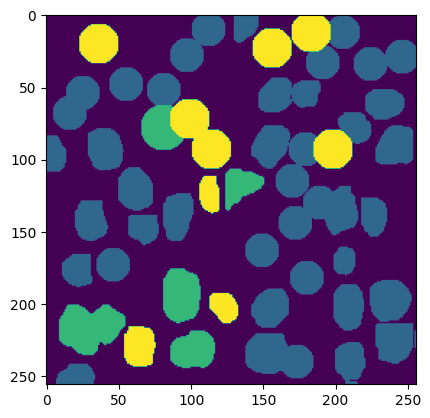

/content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 187.0ms
Speed: 6.8ms preprocess, 187.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 0, 130, 20)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1442.0 bbox 256
fixed shape for a cell
(108, 33, 131, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 186.6ms
Speed: 6.2ms preprocess, 186.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  805.0 bbox 256
fixed shape for a cell
(145, 112, 168, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 185.6ms
Speed: 6.5ms preprocess, 185.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 7, 89, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 183.0ms
Speed: 8.4ms preprocess, 183.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 24, 25, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 116, 120, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(119, 74, 146, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 53, 160, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 30, 160, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(134, 0, 158, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 188.1ms
Speed: 6.5ms preprocess, 188.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(45, 159, 68, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 183.9ms
Speed: 6.8ms preprocess, 183.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 65, 34, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 183.7ms
Speed: 7.2ms preprocess, 183.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 109, 82, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 186.8ms
Speed: 7.8ms preprocess, 186.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 126, 63, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 186.1ms
Speed: 7.0ms preprocess, 186.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 78, 72, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 182.0ms
Speed: 6.9ms preprocess, 182.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 80, 97, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1394.0 bbox 400
fixed shape for a cell
(58, 41, 85, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 186.3ms
Speed: 7.7ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 147, 100, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 181.7ms
Speed: 8.5ms preprocess, 181.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 54, 25, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 93, 137, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0001__idx-3011.png: 1024x1024 29 objects, 182.9ms
Speed: 6.2ms preprocess, 182.9ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(7, 183, 34, 210)
FINAL MASK!!!


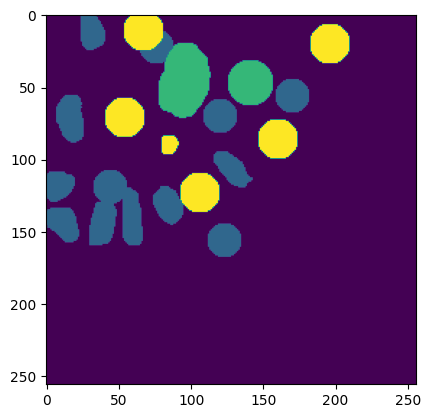

/content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 181.8ms
Speed: 12.1ms preprocess, 181.8ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 151, 149, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 180.9ms
Speed: 6.4ms preprocess, 180.9ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 186, 137, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 184.6ms
Speed: 6.6ms preprocess, 184.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 209, 135, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 180.6ms
Speed: 6.5ms preprocess, 180.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 156, 74, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(30, 162, 53, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 237, 80, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 187.6ms
Speed: 6.4ms preprocess, 187.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 186, 76, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 184.6ms
Speed: 6.5ms preprocess, 184.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 135, 156, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 205, 60, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 94, 154, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 224, 114, 255)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 68, 118, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 90, 120, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 181.2ms
Speed: 6.3ms preprocess, 181.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(161, 134, 192, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 182.7ms
Speed: 11.0ms preprocess, 182.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 126, 27, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 53, 164, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 69, 194, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 186.8ms
Speed: 6.3ms preprocess, 186.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 44, 194, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 171, 119, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 182.8ms
Speed: 7.1ms preprocess, 182.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 119, 66, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0002__idx-3103.png: 1024x1024 3 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(87, 130, 114, 157)
FINAL MASK!!!


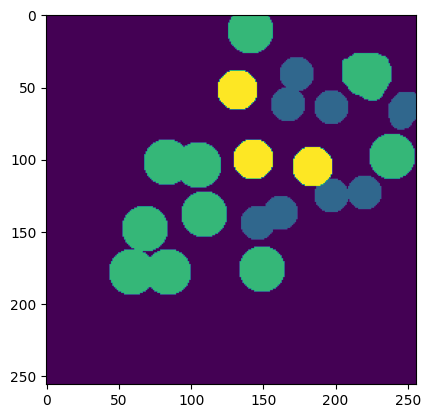

/content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 256
fixed shape for a cell
(102, 214, 125, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 256
fixed shape for a cell
(6, 97, 29, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 256
fixed shape for a cell
(151, 99, 174, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 256
fixed shape for a cell
(74, 219, 97, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 184.2ms
Speed: 7.1ms preprocess, 184.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 256
fixed shape for a cell
(68, 165, 91, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 184.2ms
Speed: 9.0ms preprocess, 184.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(62, 33, 91, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 184.7ms
Speed: 8.3ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 256
fixed shape for a cell
(33, 166, 56, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 185.1ms
Speed: 6.0ms preprocess, 185.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 576
fixed shape for a cell
(45, 100, 76, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 185.1ms
Speed: 8.9ms preprocess, 185.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 576
fixed shape for a cell
(89, 77, 120, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 183.4ms
Speed: 6.9ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 576
fixed shape for a cell
(103, 175, 134, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 181.2ms
Speed: 6.2ms preprocess, 181.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 576
fixed shape for a cell
(25, 29, 56, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 183.1ms
Speed: 6.5ms preprocess, 183.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 576
fixed shape for a cell
(101, 112, 132, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 400
fixed shape for a cell
(61, 131, 88, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 182.3ms
Speed: 7.2ms preprocess, 182.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 400
fixed shape for a cell
(67, 66, 94, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 185.0ms
Speed: 8.0ms preprocess, 185.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 400
fixed shape for a cell
(15, 75, 42, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 185.2ms
Speed: 7.3ms preprocess, 185.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 400
fixed shape for a cell
(130, 106, 157, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 188.6ms
Speed: 6.4ms preprocess, 188.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 400
fixed shape for a cell
(43, 193, 70, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0004__idx-3019.png: 1024x1024 2 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1940.0 bbox 400
fixed shape for a cell
(165, 71, 192, 98)
FINAL MASK!!!


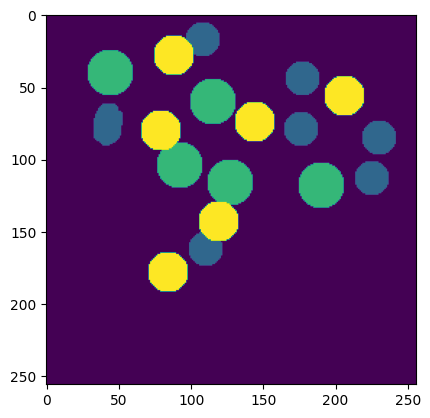

/content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 181.5ms
Speed: 7.7ms preprocess, 181.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 256
fixed shape for a cell
(89, 215, 112, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 256
fixed shape for a cell
(16, 122, 39, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 185.4ms
Speed: 6.6ms preprocess, 185.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(15, 28, 39, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 181.1ms
Speed: 6.3ms preprocess, 181.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(62, 125, 88, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 150, 67, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 182.1ms
Speed: 6.1ms preprocess, 182.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 256
fixed shape for a cell
(66, 185, 89, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 256
fixed shape for a cell
(13, 105, 36, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 186.2ms
Speed: 8.4ms preprocess, 186.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 256
fixed shape for a cell
(75, 157, 98, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(76, 7, 103, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 166, 54, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 180.7ms
Speed: 6.6ms preprocess, 180.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(68, 18, 95, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(115, 17, 142, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(91, 34, 118, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 187.5ms
Speed: 6.5ms preprocess, 187.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(39, 23, 66, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(55, 6, 82, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(16, 204, 43, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-0005__idx-3014.png: 1024x1024 10 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1228.0 bbox 400
fixed shape for a cell
(0, 144, 21, 171)
FINAL MASK!!!


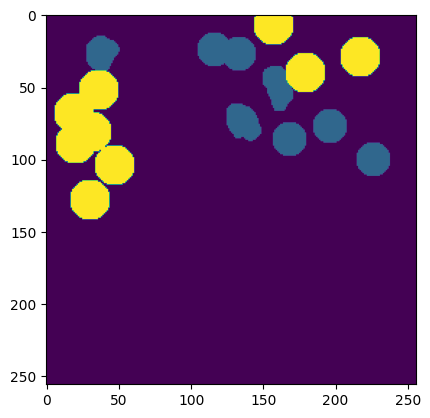

/content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 172, 246, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(211, 194, 234, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 181.5ms
Speed: 6.4ms preprocess, 181.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 160, 32, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 184.1ms
Speed: 6.8ms preprocess, 184.1ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 142, 246, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 186.3ms
Speed: 6.7ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1038.0 bbox 256
fixed shape for a cell
(215, 101, 238, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 183.5ms
Speed: 6.4ms preprocess, 183.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 146, 203, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 180.2ms
Speed: 8.2ms preprocess, 180.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 220, 149, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 184.0ms
Speed: 6.7ms preprocess, 184.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 212, 110, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 231, 90, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 84, 190, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 180.2ms
Speed: 11.0ms preprocess, 180.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1038.0 bbox 256
fixed shape for a cell
(228, 116, 251, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(67, 198, 91, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 186.8ms
Speed: 6.5ms preprocess, 186.8ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 102, 164, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 186.9ms
Speed: 10.5ms preprocess, 186.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 200, 42, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 185.3ms
Speed: 6.5ms preprocess, 185.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 173, 75, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 91, 91, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 186.0ms
Speed: 6.1ms preprocess, 186.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 187, 39, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 186.0ms
Speed: 6.8ms preprocess, 186.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 242, 193, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 183.6ms
Speed: 6.4ms preprocess, 183.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(215, 71, 251, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 182.5ms
Speed: 6.5ms preprocess, 182.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 17, 212, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 188.1ms
Speed: 6.2ms preprocess, 188.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 14, 103, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(185, 68, 206, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 187.1ms
Speed: 6.8ms preprocess, 187.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 153, 140, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 180.8ms
Speed: 6.5ms preprocess, 180.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 112, 62, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 146, 61, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 113, 193, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 156, 193, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 181.7ms
Speed: 6.4ms preprocess, 181.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 190, 156, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 186.9ms
Speed: 6.7ms preprocess, 186.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 57, 116, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 56, 157, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 183.6ms
Speed: 6.5ms preprocess, 183.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(174, 192, 201, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 187.8ms
Speed: 6.5ms preprocess, 187.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1679.0 bbox 400
fixed shape for a cell
(202, 223, 229, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 131, 157, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 183.9ms
Speed: 7.5ms preprocess, 183.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(215, 26, 242, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1244.0 bbox 400
fixed shape for a cell
(83, 137, 110, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 185.5ms
Speed: 6.7ms preprocess, 185.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(103, 86, 126, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(202, 126, 229, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3000.png: 1024x1024 20 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(38, 60, 65, 87)
FINAL MASK!!!


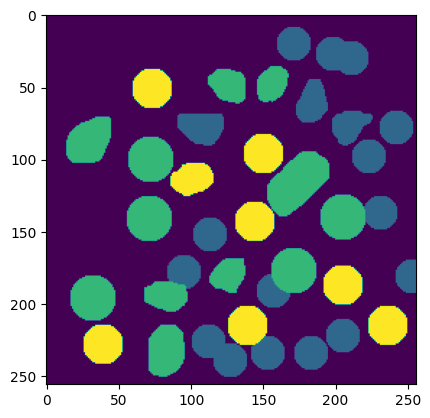

/content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 185.0ms
Speed: 7.2ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 90, 144, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 183.5ms
Speed: 7.2ms preprocess, 183.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 133, 255, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 181.2ms
Speed: 6.2ms preprocess, 181.2ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 110, 135, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(129, 110, 152, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 80, 170, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 122, 42, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 187.3ms
Speed: 6.6ms preprocess, 187.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 86, 256, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 182.5ms
Speed: 10.8ms preprocess, 182.5ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 82, 87, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 183.6ms
Speed: 11.3ms preprocess, 183.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 165, 110, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 64, 139, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(103, 147, 128, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(86, 129, 112, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 191.4ms
Speed: 5.9ms preprocess, 191.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 127, 169, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 88, 208, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 184.6ms
Speed: 6.1ms preprocess, 184.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 152, 68, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 184.0ms
Speed: 7.2ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(50, 122, 77, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 146, 35, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 186.0ms
Speed: 9.6ms preprocess, 186.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(178, 168, 218, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 183.2ms
Speed: 6.6ms preprocess, 183.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(174, 131, 201, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 186.5ms
Speed: 6.1ms preprocess, 186.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1281.0 bbox 400
fixed shape for a cell
(163, 160, 190, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 93, 118, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(159, 43, 186, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 185.2ms
Speed: 10.4ms preprocess, 185.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 181, 154, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 181.0ms
Speed: 7.3ms preprocess, 181.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(97, 197, 124, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 189.0ms
Speed: 6.4ms preprocess, 189.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(208, 48, 235, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3011.png: 1024x1024 21 objects, 187.7ms
Speed: 6.4ms preprocess, 187.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(26, 134, 53, 161)
FINAL MASK!!!


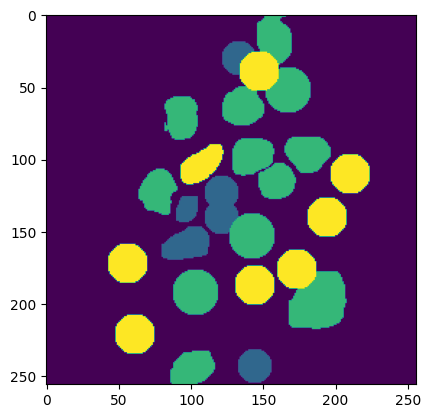

/content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 182.9ms
Speed: 6.9ms preprocess, 182.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 139, 28, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 109, 17, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 182.0ms
Speed: 6.1ms preprocess, 182.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 0, 63, 16)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 187.4ms
Speed: 6.0ms preprocess, 187.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 3, 36, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 188.0ms
Speed: 6.5ms preprocess, 188.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 7, 92, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 186.3ms
Speed: 6.9ms preprocess, 186.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 94, 140, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 180.0ms
Speed: 8.5ms preprocess, 180.0ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 127, 128, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 183.9ms
Speed: 6.5ms preprocess, 183.9ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 60, 176, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 11, 178, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 99, 58, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 186.6ms
Speed: 7.2ms preprocess, 186.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 153, 150, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(22, 172, 52, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 181.4ms
Speed: 6.3ms preprocess, 181.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 156, 100, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 132, 162, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1894.0 bbox 576
fixed shape for a cell
(25, 45, 56, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 122, 84, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 186.1ms
Speed: 9.9ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 113, 110, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 182.3ms
Speed: 6.6ms preprocess, 182.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 14, 135, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 73, 110, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 184.4ms
Speed: 6.6ms preprocess, 184.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 0, 169, 18)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 185.2ms
Speed: 6.8ms preprocess, 185.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 94, 165, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-0003__idx-3017.png: 1024x1024 19 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(99, 194, 126, 221)
FINAL MASK!!!


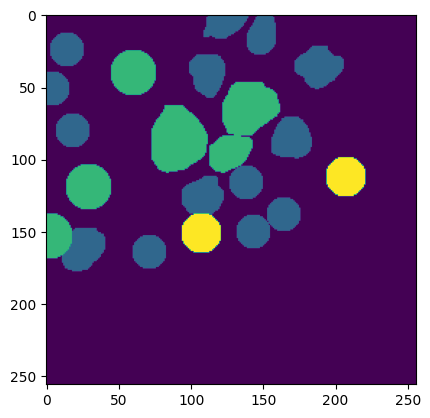

/content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 185.4ms
Speed: 6.8ms preprocess, 185.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(81, 212, 104, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 183.4ms
Speed: 6.1ms preprocess, 183.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(21, 216, 44, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(147, 171, 170, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 186.8ms
Speed: 6.7ms preprocess, 186.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(176, 47, 199, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(190, 99, 213, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(209, 188, 232, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(49, 28, 72, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 181.9ms
Speed: 6.5ms preprocess, 181.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(217, 134, 240, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 188.5ms
Speed: 6.2ms preprocess, 188.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(29, 120, 52, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 185.3ms
Speed: 6.7ms preprocess, 185.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(43, 194, 66, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  925.0 bbox 256
fixed shape for a cell
(89, 163, 112, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  853.0 bbox 256
fixed shape for a cell
(136, 105, 159, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 181.4ms
Speed: 6.3ms preprocess, 181.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 256
fixed shape for a cell
(28, 72, 51, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(122, 9, 153, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 184.6ms
Speed: 6.7ms preprocess, 184.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(143, 140, 174, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(76, 48, 124, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 188.3ms
Speed: 6.1ms preprocess, 188.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(129, 211, 160, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 188.9ms
Speed: 6.2ms preprocess, 188.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 234, 200, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 181.5ms
Speed: 6.4ms preprocess, 181.5ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 400
fixed shape for a cell
(125, 75, 152, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 182.6ms
Speed: 7.9ms preprocess, 182.6ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 400
fixed shape for a cell
(78, 110, 105, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 182.3ms
Speed: 12.9ms preprocess, 182.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 400
fixed shape for a cell
(12, 171, 39, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3112.png: 1024x1024 5 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1351.0 bbox 400
fixed shape for a cell
(126, 49, 153, 76)
FINAL MASK!!!


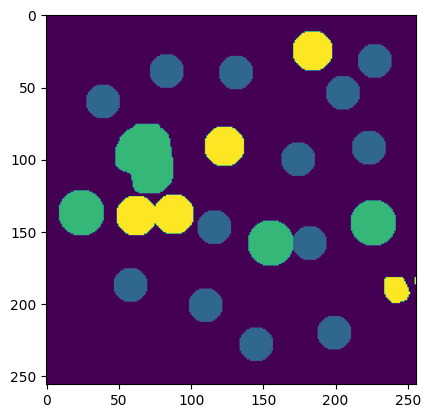

/content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(235, 171, 256, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 182.8ms
Speed: 6.1ms preprocess, 182.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(79, 79, 102, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 185.4ms
Speed: 6.1ms preprocess, 185.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(43, 146, 66, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 183.3ms
Speed: 8.6ms preprocess, 183.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(202, 28, 225, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(57, 217, 80, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(78, 33, 101, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 187.2ms
Speed: 6.9ms preprocess, 187.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(92, 224, 115, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 186.6ms
Speed: 5.5ms preprocess, 186.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(122, 22, 145, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 185.3ms
Speed: 7.0ms preprocess, 185.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(182, 60, 205, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 184.5ms
Speed: 6.1ms preprocess, 184.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(201, 153, 224, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 189.4ms
Speed: 6.1ms preprocess, 189.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(186, 191, 209, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 185.5ms
Speed: 6.1ms preprocess, 185.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 256
fixed shape for a cell
(98, 198, 121, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 182.2ms
Speed: 6.1ms preprocess, 182.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 184, 159, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 186.9ms
Speed: 7.0ms preprocess, 186.9ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(154, 115, 204, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 400
fixed shape for a cell
(119, 237, 146, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 188.0ms
Speed: 6.1ms preprocess, 188.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 128, 137, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 400
fixed shape for a cell
(211, 115, 238, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 400
fixed shape for a cell
(146, 78, 173, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3279.png: 1024x1024 5 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1276.0 bbox 400
fixed shape for a cell
(92, 55, 119, 82)
FINAL MASK!!!


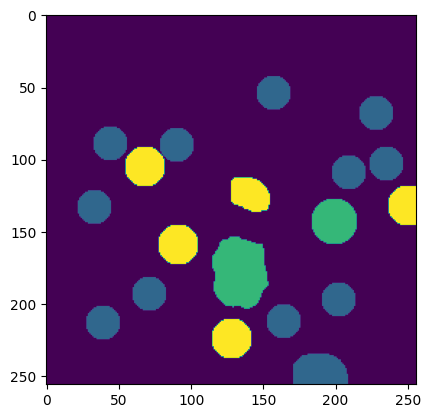

/content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  863.0 bbox 256
fixed shape for a cell
(128, 189, 151, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  863.0 bbox 256
fixed shape for a cell
(63, 217, 86, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 181.2ms
Speed: 6.4ms preprocess, 181.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1095.0 bbox 256
fixed shape for a cell
(9, 223, 32, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 79, 20, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 184.6ms
Speed: 6.0ms preprocess, 184.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 193, 59, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 187.6ms
Speed: 6.2ms preprocess, 187.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  863.0 bbox 256
fixed shape for a cell
(103, 217, 126, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  863.0 bbox 256
fixed shape for a cell
(194, 151, 217, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 188.0ms
Speed: 6.6ms preprocess, 188.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 173, 123, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 188.1ms
Speed: 6.2ms preprocess, 188.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 201, 181, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 187.3ms
Speed: 6.1ms preprocess, 187.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1050.0 bbox 256
fixed shape for a cell
(81, 42, 104, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1153.0 bbox 256
fixed shape for a cell
(85, 109, 108, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 183.1ms
Speed: 7.9ms preprocess, 183.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1146.0 bbox 256
fixed shape for a cell
(104, 137, 127, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 180.6ms
Speed: 7.6ms preprocess, 180.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1146.0 bbox 256
fixed shape for a cell
(124, 146, 147, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 181.8ms
Speed: 10.0ms preprocess, 181.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 142, 182, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 184.2ms
Speed: 8.1ms preprocess, 184.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1328.0 bbox 256
fixed shape for a cell
(172, 109, 195, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 185.1ms
Speed: 9.6ms preprocess, 185.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1336.0 bbox 256
fixed shape for a cell
(131, 66, 154, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 181.4ms
Speed: 6.6ms preprocess, 181.4ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 49, 61, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 181.4ms
Speed: 6.0ms preprocess, 181.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 101, 46, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 187.8ms
Speed: 8.6ms preprocess, 187.8ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 157, 37, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 146, 95, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3533.png: 1024x1024 25 objects, 182.1ms
Speed: 10.7ms preprocess, 182.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(69, 194, 96, 221)
FINAL MASK!!!


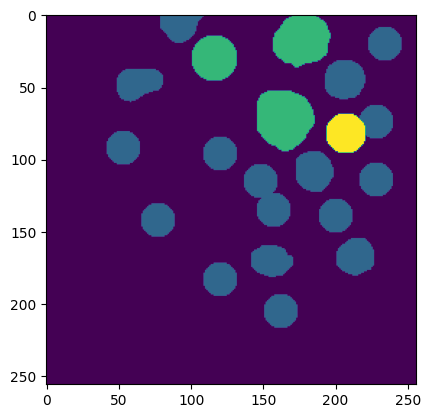

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 181.1ms
Speed: 6.2ms preprocess, 181.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 144, 226, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.7ms
Speed: 7.3ms preprocess, 186.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  952.0 bbox 256
fixed shape for a cell
(130, 198, 153, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  952.0 bbox 256
fixed shape for a cell
(99, 229, 122, 252)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 95, 228, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 191.5ms
Speed: 5.4ms preprocess, 191.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  952.0 bbox 256
fixed shape for a cell
(52, 152, 75, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 181.1ms
Speed: 6.1ms preprocess, 181.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  952.0 bbox 256
fixed shape for a cell
(80, 9, 103, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 185.7ms
Speed: 7.1ms preprocess, 185.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  952.0 bbox 256
fixed shape for a cell
(21, 134, 44, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 182.6ms
Speed: 6.1ms preprocess, 182.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 16, 72, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 184.3ms
Speed: 6.3ms preprocess, 184.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 174, 203, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 181.6ms
Speed: 6.1ms preprocess, 181.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 184, 140, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 0, 164, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.9ms
Speed: 6.5ms preprocess, 186.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 180, 50, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 206, 31, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.5ms
Speed: 6.8ms preprocess, 186.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 223, 181, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 183.5ms
Speed: 6.9ms preprocess, 183.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 30, 113, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 187.2ms
Speed: 6.6ms preprocess, 187.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 68, 117, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 182.0ms
Speed: 6.7ms preprocess, 182.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 210, 64, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 111, 97, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 187.3ms
Speed: 6.4ms preprocess, 187.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 32, 152, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 184.6ms
Speed: 6.5ms preprocess, 184.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 2, 42, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.3ms
Speed: 7.3ms preprocess, 186.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 86, 184, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 188.9ms
Speed: 6.6ms preprocess, 188.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 51, 52, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 182.6ms
Speed: 6.6ms preprocess, 182.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 222, 148, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 182.2ms
Speed: 9.3ms preprocess, 182.2ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 138, 165, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.4ms
Speed: 8.1ms preprocess, 186.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 203, 109, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 190.8ms
Speed: 6.2ms preprocess, 190.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 168, 114, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.9ms
Speed: 6.7ms preprocess, 186.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 142, 133, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 184.4ms
Speed: 7.2ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 69, 24, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 187.3ms
Speed: 8.3ms preprocess, 187.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 0, 122, 20)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 16, 127, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.2ms
Speed: 6.1ms preprocess, 186.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1308.0 bbox 400
fixed shape for a cell
(124, 26, 151, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 186.1ms
Speed: 6.5ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 67, 58, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 184.5ms
Speed: 8.4ms preprocess, 184.5ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 217, 93, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 187.7ms
Speed: 6.5ms preprocess, 187.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 99, 51, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3046.png: 1024x1024 16 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(108, 93, 135, 120)
FINAL MASK!!!


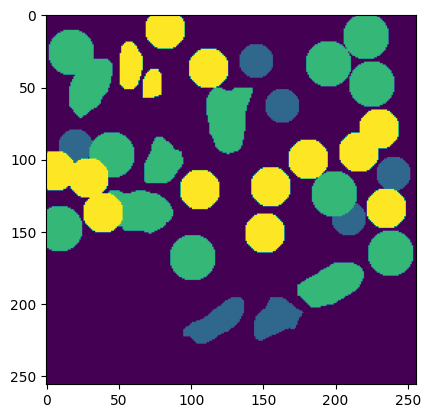

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 182, 143, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 16, 174, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 65, 154, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 188.1ms
Speed: 6.4ms preprocess, 188.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 181, 95, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 14, 62, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.2ms
Speed: 6.6ms preprocess, 185.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 52, 35, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 188.0ms
Speed: 6.3ms preprocess, 188.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(45, 175, 68, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 87, 16, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 182.6ms
Speed: 6.0ms preprocess, 182.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(108, 41, 131, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 149, 153, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 188.0ms
Speed: 6.6ms preprocess, 188.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(74, 86, 102, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 181.7ms
Speed: 7.0ms preprocess, 181.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(125, 108, 147, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 189.0ms
Speed: 6.9ms preprocess, 189.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 113, 118, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 188.2ms
Speed: 6.2ms preprocess, 188.2ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(178, 12, 201, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 93, 62, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 187.1ms
Speed: 6.9ms preprocess, 187.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 204, 79, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.6ms
Speed: 6.1ms preprocess, 185.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 207, 55, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 182.3ms
Speed: 6.9ms preprocess, 182.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 192, 11, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 17, 146, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 131, 181, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 186.8ms
Speed: 6.0ms preprocess, 186.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(63, 226, 94, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 122, 80, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 76, 256, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 56, 231, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 182.8ms
Speed: 6.1ms preprocess, 182.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 99, 44, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 182.1ms
Speed: 6.1ms preprocess, 182.1ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(25, 224, 56, 255)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.7ms
Speed: 8.6ms preprocess, 185.7ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 101, 176, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 182.8ms
Speed: 9.1ms preprocess, 182.8ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 27, 58, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(183, 71, 210, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 183.7ms
Speed: 9.4ms preprocess, 183.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 204, 118, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 187.6ms
Speed: 5.8ms preprocess, 187.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(86, 144, 124, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 187.7ms
Speed: 6.6ms preprocess, 187.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 54, 91, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 181.0ms
Speed: 10.2ms preprocess, 181.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 89, 245, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 188.0ms
Speed: 5.9ms preprocess, 188.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 58, 53, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 188.6ms
Speed: 5.6ms preprocess, 188.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 141, 41, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(28, 137, 55, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 75, 49, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 35, 24, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 188.6ms
Speed: 6.4ms preprocess, 188.6ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(127, 90, 152, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3091.png: 1024x1024 8 objects, 187.7ms
Speed: 8.6ms preprocess, 187.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(203, 18, 230, 45)
FINAL MASK!!!


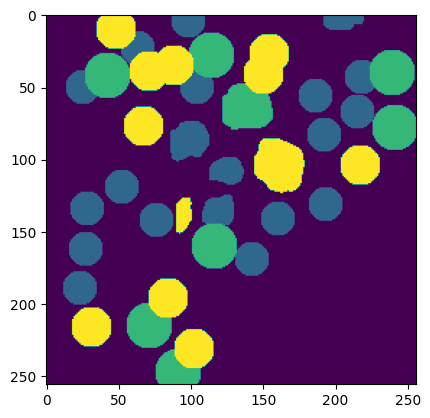

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 182.6ms
Speed: 6.7ms preprocess, 182.6ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(147, 117, 170, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.4ms
Speed: 6.1ms preprocess, 183.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(175, 143, 198, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 182.2ms
Speed: 6.1ms preprocess, 182.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(168, 200, 191, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.0ms
Speed: 7.0ms preprocess, 183.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(200, 144, 223, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(0, 38, 22, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 186.0ms
Speed: 6.1ms preprocess, 186.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 187, 26, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 184.5ms
Speed: 6.5ms preprocess, 184.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(103, 152, 126, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 182.3ms
Speed: 5.8ms preprocess, 182.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(235, 25, 256, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.0ms
Speed: 7.1ms preprocess, 183.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(131, 33, 154, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(29, 177, 52, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 188.8ms
Speed: 6.6ms preprocess, 188.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(0, 0, 17, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 185.2ms
Speed: 5.9ms preprocess, 185.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(6, 216, 29, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 186.8ms
Speed: 6.3ms preprocess, 186.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(38, 153, 61, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1064.0 bbox 256
fixed shape for a cell
(145, 163, 168, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 185.1ms
Speed: 6.3ms preprocess, 185.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 0, 123, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.5ms
Speed: 6.1ms preprocess, 183.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 76, 144, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 185.1ms
Speed: 6.5ms preprocess, 185.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 110, 143, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 14, 42, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 8, 62, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 187.0ms
Speed: 7.8ms preprocess, 187.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 64, 101, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 181.8ms
Speed: 6.7ms preprocess, 181.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 30, 100, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 185.7ms
Speed: 8.2ms preprocess, 185.7ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 140, 145, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 181.1ms
Speed: 8.0ms preprocess, 181.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 84, 44, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 56, 58, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.4ms
Speed: 6.5ms preprocess, 183.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 157, 88, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.9ms
Speed: 6.3ms preprocess, 183.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 12, 205, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 186.9ms
Speed: 6.7ms preprocess, 186.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(191, 196, 222, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(215, 128, 246, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(197, 82, 228, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(159, 84, 190, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.8ms
Speed: 6.7ms preprocess, 183.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 43, 130, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 198, 135, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 51, 180, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 188.5ms
Speed: 5.9ms preprocess, 188.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 125, 48, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 94, 256, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 186.0ms
Speed: 6.7ms preprocess, 186.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 226, 250, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 186.2ms
Speed: 6.4ms preprocess, 186.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 193, 256, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 231, 188, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 184.3ms
Speed: 6.2ms preprocess, 184.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 88, 82, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 182.2ms
Speed: 8.7ms preprocess, 182.2ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 135, 92, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 185.1ms
Speed: 6.8ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 101, 85, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3093.png: 1024x1024 4 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(154, 183, 181, 210)
FINAL MASK!!!


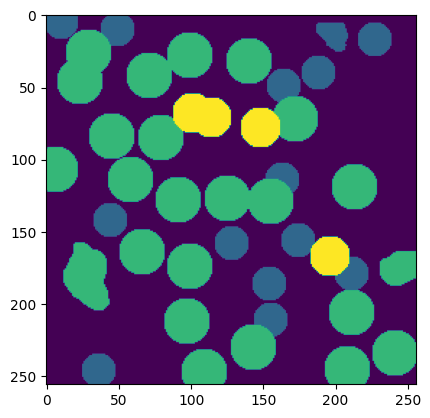

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1219.0 bbox 256
fixed shape for a cell
(72, 2, 95, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 182.2ms
Speed: 6.4ms preprocess, 182.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 47, 146, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 81, 61, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 186.7ms
Speed: 7.9ms preprocess, 186.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 55, 39, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 181.6ms
Speed: 6.9ms preprocess, 181.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(9, 11, 33, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 33, 184, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 186.2ms
Speed: 6.7ms preprocess, 186.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 47, 114, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 180.8ms
Speed: 6.1ms preprocess, 180.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  32222.0 bbox 576
fixed shape for a cell
(100, 132, 131, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 187.9ms
Speed: 6.9ms preprocess, 187.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(36, 35, 73, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  32222.0 bbox 576
fixed shape for a cell
(27, 116, 58, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(216, 75, 256, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 185.8ms
Speed: 6.1ms preprocess, 185.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 98, 119, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 185.9ms
Speed: 10.6ms preprocess, 185.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 94, 153, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 181.1ms
Speed: 6.1ms preprocess, 181.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(159, 163, 180, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 7, 139, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 181.6ms
Speed: 8.0ms preprocess, 181.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 103, 80, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 185.5ms
Speed: 7.8ms preprocess, 185.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  32222.0 bbox 400
fixed shape for a cell
(71, 143, 98, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3077.png: 1024x1024 16 objects, 182.8ms
Speed: 8.0ms preprocess, 182.8ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(118, 159, 143, 185)
FINAL MASK!!!


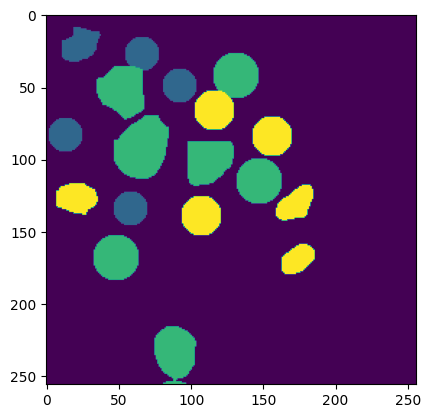

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 36, 93, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 181.7ms
Speed: 6.5ms preprocess, 181.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 101, 28, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.0ms
Speed: 6.7ms preprocess, 184.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1213.0 bbox 256
fixed shape for a cell
(114, 112, 137, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 185.1ms
Speed: 6.3ms preprocess, 185.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(129, 13, 152, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  931.0 bbox 256
fixed shape for a cell
(39, 159, 62, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 185.8ms
Speed: 7.1ms preprocess, 185.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  931.0 bbox 256
fixed shape for a cell
(23, 148, 46, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 48, 66, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 180.7ms
Speed: 6.2ms preprocess, 180.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 57, 45, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 0, 181, 17)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 183.6ms
Speed: 6.1ms preprocess, 183.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 80, 42, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.9ms
Speed: 6.5ms preprocess, 184.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 141, 129, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(16, 192, 65, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 32, 218, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 43, 144, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 180.6ms
Speed: 11.5ms preprocess, 180.6ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(181, 87, 232, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1648.0 bbox 400
fixed shape for a cell
(169, 70, 196, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 188.1ms
Speed: 6.3ms preprocess, 188.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 74, 165, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 124, 198, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.3ms
Speed: 6.1ms preprocess, 184.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 110, 70, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 182.3ms
Speed: 8.9ms preprocess, 182.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 139, 80, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 186.5ms
Speed: 7.1ms preprocess, 186.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 69, 102, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 189.0ms
Speed: 6.3ms preprocess, 189.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 229, 38, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 182.2ms
Speed: 6.1ms preprocess, 182.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 0, 127, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.2ms
Speed: 7.1ms preprocess, 184.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 148, 153, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3150.png: 1024x1024 14 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(82, 196, 109, 223)
FINAL MASK!!!


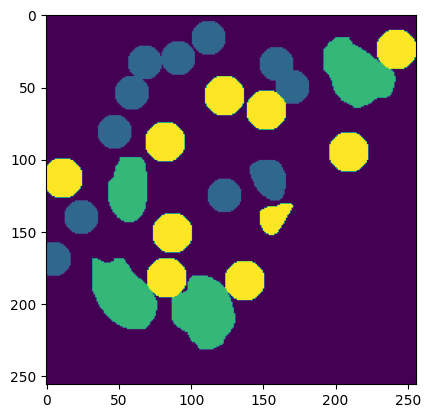

/content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 182.0ms
Speed: 6.7ms preprocess, 182.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(40, 230, 70, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  899.0 bbox 256
fixed shape for a cell
(30, 18, 53, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1103.0 bbox 256
fixed shape for a cell
(97, 65, 120, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 181.2ms
Speed: 7.6ms preprocess, 181.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1103.0 bbox 256
fixed shape for a cell
(164, 10, 187, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 186.2ms
Speed: 6.7ms preprocess, 186.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  813.0 bbox 256
fixed shape for a cell
(116, 15, 139, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 187.9ms
Speed: 15.3ms preprocess, 187.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  966.0 bbox 256
fixed shape for a cell
(167, 132, 190, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 191.1ms
Speed: 13.2ms preprocess, 191.1ms inference, 23.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1103.0 bbox 256
fixed shape for a cell
(4, 85, 27, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 180.4ms
Speed: 11.3ms preprocess, 180.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1103.0 bbox 256
fixed shape for a cell
(139, 182, 162, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 180.7ms
Speed: 6.2ms preprocess, 180.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1103.0 bbox 256
fixed shape for a cell
(9, 142, 32, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 183.7ms
Speed: 6.1ms preprocess, 183.7ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 37, 100, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 180.5ms
Speed: 7.2ms preprocess, 180.5ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 150, 82, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 184.0ms
Speed: 7.5ms preprocess, 184.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 44, 212, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 189.8ms
Speed: 6.3ms preprocess, 189.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(203, 85, 246, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 137, 122, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 183.5ms
Speed: 6.9ms preprocess, 183.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 400
fixed shape for a cell
(58, 93, 85, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 80, 161, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3050.png: 1024x1024 11 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(93, 186, 120, 213)
FINAL MASK!!!


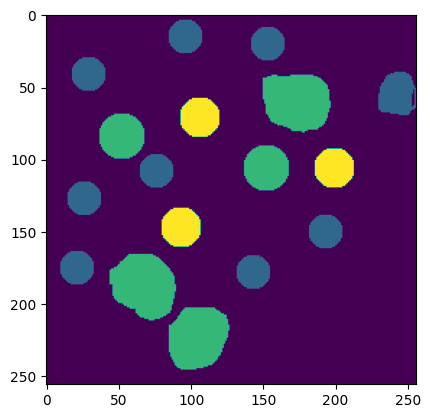

/content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 0, 166, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 184.8ms
Speed: 7.2ms preprocess, 184.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  982.0 bbox 256
fixed shape for a cell
(163, 34, 186, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  982.0 bbox 256
fixed shape for a cell
(141, 65, 164, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  982.0 bbox 256
fixed shape for a cell
(102, 25, 125, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 183.1ms
Speed: 6.1ms preprocess, 183.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1550.0 bbox 256
fixed shape for a cell
(64, 152, 87, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 185.5ms
Speed: 6.8ms preprocess, 185.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  982.0 bbox 256
fixed shape for a cell
(23, 174, 46, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 186.4ms
Speed: 7.1ms preprocess, 186.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1066.0 bbox 256
fixed shape for a cell
(163, 135, 186, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 181.2ms
Speed: 6.2ms preprocess, 181.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  982.0 bbox 256
fixed shape for a cell
(91, 0, 114, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 186.8ms
Speed: 6.9ms preprocess, 186.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 129, 23, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 182.2ms
Speed: 6.2ms preprocess, 182.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  982.0 bbox 256
fixed shape for a cell
(198, 139, 221, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 207, 223, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 185.2ms
Speed: 7.0ms preprocess, 185.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 209, 123, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 186.5ms
Speed: 5.9ms preprocess, 186.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 67, 64, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 183.6ms
Speed: 6.1ms preprocess, 183.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(124, 181, 151, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 183.9ms
Speed: 6.6ms preprocess, 183.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(213, 90, 238, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 187.3ms
Speed: 7.4ms preprocess, 187.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 114, 50, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 182.3ms
Speed: 6.7ms preprocess, 182.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 69, 198, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 188.7ms
Speed: 6.0ms preprocess, 188.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 104, 88, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 186.0ms
Speed: 6.9ms preprocess, 186.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 23, 91, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 107, 133, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3058.png: 1024x1024 9 objects, 182.7ms
Speed: 10.0ms preprocess, 182.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(159, 213, 189, 239)
FINAL MASK!!!


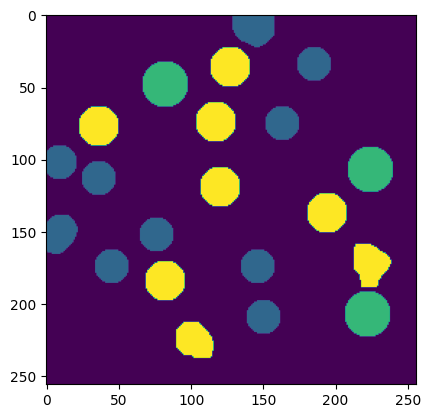

/content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 180.5ms
Speed: 6.3ms preprocess, 180.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  903.0 bbox 256
fixed shape for a cell
(55, 1, 78, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 183.7ms
Speed: 6.1ms preprocess, 183.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 62, 256, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  903.0 bbox 256
fixed shape for a cell
(128, 0, 151, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  903.0 bbox 256
fixed shape for a cell
(72, 16, 95, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 181.5ms
Speed: 7.0ms preprocess, 181.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1047.0 bbox 256
fixed shape for a cell
(89, 115, 112, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 184.4ms
Speed: 7.9ms preprocess, 184.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  903.0 bbox 256
fixed shape for a cell
(25, 92, 48, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 182.6ms
Speed: 7.2ms preprocess, 182.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 124, 190, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 182.2ms
Speed: 6.2ms preprocess, 182.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 76, 231, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 182.8ms
Speed: 6.1ms preprocess, 182.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 0, 198, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 189.1ms
Speed: 6.3ms preprocess, 189.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 168, 165, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 181.2ms
Speed: 6.4ms preprocess, 181.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 39, 143, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(9, 38, 58, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 188.5ms
Speed: 6.1ms preprocess, 188.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 112, 232, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(184, 24, 215, 55)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(156, 59, 191, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(59, 65, 106, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 182.6ms
Speed: 7.1ms preprocess, 182.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 126, 55, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 185.1ms
Speed: 8.4ms preprocess, 185.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 167, 47, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 92, 153, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(122, 138, 149, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 190, 68, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-0002__idx-3453.png: 1024x1024 13 objects, 181.7ms
Speed: 6.3ms preprocess, 181.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(73, 188, 100, 215)
FINAL MASK!!!


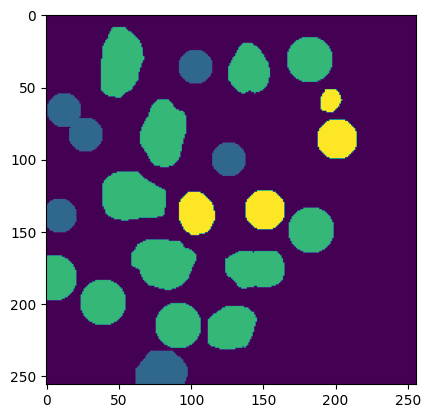

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(222, 31, 245, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(225, 84, 248, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 95, 224, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 139, 199, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 189.4ms
Speed: 6.1ms preprocess, 189.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 164, 195, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1113.0 bbox 256
fixed shape for a cell
(91, 128, 114, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1113.0 bbox 256
fixed shape for a cell
(109, 132, 132, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 186.6ms
Speed: 6.1ms preprocess, 186.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 29, 175, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 41, 203, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.3ms
Speed: 6.7ms preprocess, 183.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(209, 6, 232, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.0ms
Speed: 9.9ms preprocess, 185.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(82, 93, 110, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.2ms
Speed: 6.5ms preprocess, 183.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 167, 121, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 182.4ms
Speed: 6.0ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 170, 172, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 184.2ms
Speed: 8.6ms preprocess, 184.2ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 210, 190, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 184.2ms
Speed: 7.8ms preprocess, 184.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 58, 166, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.2ms
Speed: 6.1ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 60, 133, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 187.2ms
Speed: 6.1ms preprocess, 187.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 190, 220, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 203, 158, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(216, 56, 247, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.2ms
Speed: 9.8ms preprocess, 185.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 108, 254, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 186.0ms
Speed: 7.2ms preprocess, 186.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(186, 74, 217, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.5ms
Speed: 6.1ms preprocess, 183.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 104, 199, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 86, 174, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.8ms
Speed: 6.1ms preprocess, 183.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(197, 147, 228, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(67, 86, 91, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 108, 145, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 3, 152, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 5, 181, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 187.0ms
Speed: 6.1ms preprocess, 187.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 172, 86, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3008.png: 1024x1024 13 objects, 183.4ms
Speed: 6.1ms preprocess, 183.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(231, 151, 256, 178)
FINAL MASK!!!


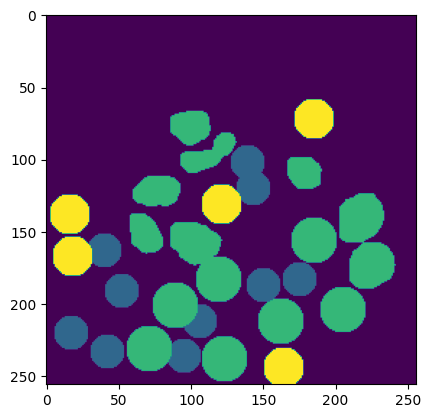

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 181.5ms
Speed: 6.2ms preprocess, 181.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 145, 114, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 2, 28, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 182.5ms
Speed: 6.5ms preprocess, 182.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 75, 70, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 182.9ms
Speed: 6.7ms preprocess, 182.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 38, 154, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 189.6ms
Speed: 5.2ms preprocess, 189.6ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 218, 42, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 186.3ms
Speed: 6.7ms preprocess, 186.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 41, 27, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 182.7ms
Speed: 6.2ms preprocess, 182.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 34, 78, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 185.3ms
Speed: 6.0ms preprocess, 185.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 0, 77, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 181.9ms
Speed: 6.1ms preprocess, 181.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 3, 118, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 186.5ms
Speed: 6.1ms preprocess, 186.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 59, 135, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(68, 105, 91, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 92, 31, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 187.2ms
Speed: 5.9ms preprocess, 187.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 0, 233, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 180.8ms
Speed: 6.1ms preprocess, 180.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 150, 96, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 0, 233, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 155, 59, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 181.4ms
Speed: 10.6ms preprocess, 181.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 166, 189, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 187.9ms
Speed: 6.0ms preprocess, 187.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(171, 121, 204, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 187.2ms
Speed: 7.4ms preprocess, 187.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 93, 199, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 109, 136, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 186.3ms
Speed: 7.0ms preprocess, 186.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 61, 175, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 185.4ms
Speed: 6.0ms preprocess, 185.4ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 144, 157, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 185.3ms
Speed: 5.9ms preprocess, 185.3ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 188, 62, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3019.png: 1024x1024 13 objects, 187.0ms
Speed: 7.1ms preprocess, 187.0ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(82, 73, 109, 100)
FINAL MASK!!!


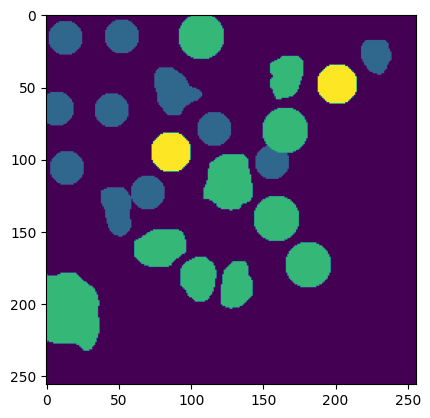

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 180.7ms
Speed: 6.5ms preprocess, 180.7ms inference, 9.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 81, 85, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 184.6ms
Speed: 6.4ms preprocess, 184.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 0, 108, 14)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 182.7ms
Speed: 6.1ms preprocess, 182.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 81, 85, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 219, 140, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 184.0ms
Speed: 7.0ms preprocess, 184.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 88, 37, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 189.2ms
Speed: 6.1ms preprocess, 189.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 0, 108, 14)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 186.7ms
Speed: 6.9ms preprocess, 186.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 56, 140, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 183.1ms
Speed: 6.7ms preprocess, 183.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(96, 18, 120, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 182.7ms
Speed: 6.1ms preprocess, 182.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 27, 97, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 94, 110, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 186.7ms
Speed: 6.6ms preprocess, 186.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 68, 111, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 12, 97, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 115, 92, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 184.2ms
Speed: 4.7ms preprocess, 184.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(65, 151, 88, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 186.6ms
Speed: 6.7ms preprocess, 186.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 181, 104, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 173, 132, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 185.6ms
Speed: 6.7ms preprocess, 185.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 214, 106, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 183.7ms
Speed: 6.1ms preprocess, 183.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 131, 142, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 183.3ms
Speed: 6.9ms preprocess, 183.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  920.0 bbox 256
fixed shape for a cell
(99, 122, 122, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 157, 138, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 37, 59, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 117, 26, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 185.9ms
Speed: 6.7ms preprocess, 185.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 0, 29, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 125, 45, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 2, 73, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 188.6ms
Speed: 7.0ms preprocess, 188.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 168, 58, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 184.9ms
Speed: 8.3ms preprocess, 184.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 207, 46, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 37, 59, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0001__idx-3039.png: 1024x1024 25 objects, 187.6ms
Speed: 12.7ms preprocess, 187.6ms inference, 9.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(47, 141, 74, 168)
FINAL MASK!!!


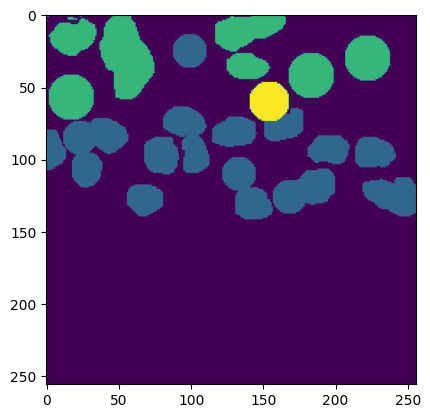

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 186.7ms
Speed: 9.8ms preprocess, 186.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 227, 118, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 186.2ms
Speed: 6.5ms preprocess, 186.2ms inference, 8.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 107, 170, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 184.5ms
Speed: 6.8ms preprocess, 184.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 108, 38, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 184.0ms
Speed: 6.5ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 196, 55, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 15, 164, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.4ms
Speed: 6.6ms preprocess, 185.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 182, 121, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.5ms
Speed: 8.3ms preprocess, 185.5ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(76, 207, 103, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.9ms
Speed: 7.1ms preprocess, 185.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 57, 179, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 82, 194, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(154, 126, 187, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 152, 68, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(34, 17, 65, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 187.0ms
Speed: 6.5ms preprocess, 187.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(30, 119, 61, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.3ms
Speed: 6.6ms preprocess, 185.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 119, 143, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 69, 142, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 88, 96, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 188.7ms
Speed: 6.2ms preprocess, 188.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 218, 162, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 180.9ms
Speed: 6.6ms preprocess, 180.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(30, 53, 64, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 168, 205, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 23, 108, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 182.6ms
Speed: 6.7ms preprocess, 182.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 148, 126, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 190.1ms
Speed: 6.0ms preprocess, 190.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 117, 100, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3008.png: 1024x1024 15 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(195, 118, 215, 139)
FINAL MASK!!!


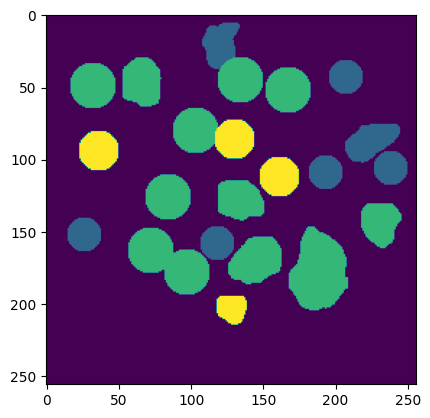

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 115, 234, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 0, 151, 20)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.4ms
Speed: 6.1ms preprocess, 182.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 141, 229, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 211, 212, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.7ms
Speed: 6.2ms preprocess, 182.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 181, 38, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 184.1ms
Speed: 6.4ms preprocess, 184.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 131, 61, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 186.0ms
Speed: 6.6ms preprocess, 186.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 228, 114, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(82, 187, 108, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 180.1ms
Speed: 10.4ms preprocess, 180.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 39, 204, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 181.2ms
Speed: 6.1ms preprocess, 181.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(100, 202, 120, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 174, 193, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 185.4ms
Speed: 6.8ms preprocess, 185.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 110, 71, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 187.7ms
Speed: 6.8ms preprocess, 187.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 115, 34, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 26, 144, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 184.6ms
Speed: 7.4ms preprocess, 184.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 46, 130, 69)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 0, 194, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 184.8ms
Speed: 8.8ms preprocess, 184.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 0, 212, 17)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 213, 162, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 187.1ms
Speed: 6.5ms preprocess, 187.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(215, 22, 238, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 185.9ms
Speed: 6.1ms preprocess, 185.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(212, 211, 243, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 186.9ms
Speed: 7.1ms preprocess, 186.9ms inference, 8.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 70, 169, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(226, 85, 256, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 188.3ms
Speed: 6.4ms preprocess, 188.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(226, 85, 256, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 85, 201, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 184.7ms
Speed: 6.5ms preprocess, 184.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 178, 245, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 184.9ms
Speed: 6.9ms preprocess, 184.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 158, 173, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 184.9ms
Speed: 9.4ms preprocess, 184.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 192, 62, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 188.1ms
Speed: 6.6ms preprocess, 188.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 153, 97, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 190.2ms
Speed: 6.2ms preprocess, 190.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 132, 141, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 187.0ms
Speed: 7.0ms preprocess, 187.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 101, 145, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 182.0ms
Speed: 6.6ms preprocess, 182.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 4, 123, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 183.9ms
Speed: 6.5ms preprocess, 183.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 168, 142, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 185.2ms
Speed: 6.1ms preprocess, 185.2ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 68, 138, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(143, 124, 170, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 134, 187, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3009.png: 1024x1024 11 objects, 180.6ms
Speed: 9.1ms preprocess, 180.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(234, 136, 256, 165)
FINAL MASK!!!


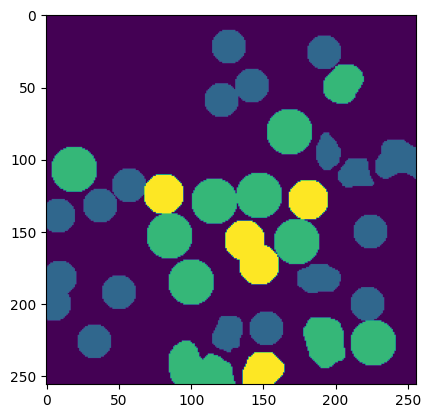

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 188.0ms
Speed: 6.9ms preprocess, 188.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 138, 79, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 181.1ms
Speed: 6.2ms preprocess, 181.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 217, 143, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 182.1ms
Speed: 6.1ms preprocess, 182.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 197, 153, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 186.1ms
Speed: 6.8ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 81, 122, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 101, 90, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 138, 195, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 188.0ms
Speed: 6.9ms preprocess, 188.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  793.0 bbox 256
fixed shape for a cell
(167, 109, 190, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 181.4ms
Speed: 6.7ms preprocess, 181.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  793.0 bbox 256
fixed shape for a cell
(177, 83, 200, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 187.1ms
Speed: 7.1ms preprocess, 187.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1973.0 bbox 256
fixed shape for a cell
(22, 142, 45, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 181.0ms
Speed: 9.2ms preprocess, 181.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1973.0 bbox 256
fixed shape for a cell
(28, 162, 51, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 184.5ms
Speed: 8.4ms preprocess, 184.5ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  821.0 bbox 256
fixed shape for a cell
(77, 44, 100, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 186.3ms
Speed: 5.9ms preprocess, 186.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 234, 164, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 183.6ms
Speed: 8.1ms preprocess, 183.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 34, 138, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 183.1ms
Speed: 6.0ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 102, 50, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 185.5ms
Speed: 9.5ms preprocess, 185.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 29, 71, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 184.8ms
Speed: 6.0ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(117, 161, 148, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 188.4ms
Speed: 6.2ms preprocess, 188.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 134, 145, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 186.0ms
Speed: 8.3ms preprocess, 186.0ms inference, 9.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 13, 154, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 181.2ms
Speed: 10.0ms preprocess, 181.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 101, 158, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 183.9ms
Speed: 6.3ms preprocess, 183.9ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 199, 109, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1973.0 bbox 400
fixed shape for a cell
(25, 125, 52, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 182.4ms
Speed: 6.1ms preprocess, 182.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  7216.0 bbox 400
fixed shape for a cell
(10, 88, 37, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 149, 110, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 183.0ms
Speed: 6.8ms preprocess, 183.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1966.0 bbox 400
fixed shape for a cell
(8, 221, 35, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3020.png: 1024x1024 14 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1610.0 bbox 400
fixed shape for a cell
(52, 214, 79, 241)
FINAL MASK!!!


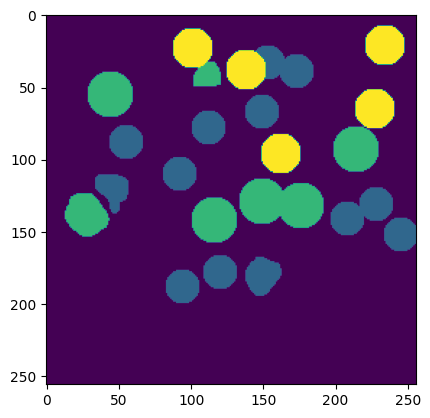

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 14, 45, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 21, 135, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 182.5ms
Speed: 6.6ms preprocess, 182.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 60, 188, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 185.1ms
Speed: 6.1ms preprocess, 185.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 95, 208, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 191.6ms
Speed: 6.5ms preprocess, 191.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 206, 55, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(169, 139, 192, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 183.1ms
Speed: 7.0ms preprocess, 183.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 136, 69, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 91, 113, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 185.5ms
Speed: 9.0ms preprocess, 185.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 60, 18, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 181.6ms
Speed: 6.2ms preprocess, 181.6ms inference, 2.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(76, 203, 99, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 42, 46, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.8ms
Speed: 6.1ms preprocess, 186.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(23, 78, 49, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 90, 81, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 185.3ms
Speed: 6.1ms preprocess, 185.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 70, 113, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 76, 157, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 183.7ms
Speed: 6.4ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 143, 23, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 187.2ms
Speed: 6.1ms preprocess, 187.2ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 149, 39, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.1ms
Speed: 6.1ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(20, 0, 43, 15)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 185.8ms
Speed: 6.1ms preprocess, 185.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(101, 0, 124, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.0ms
Speed: 9.5ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 175, 90, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 184.6ms
Speed: 6.9ms preprocess, 184.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 171, 167, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 113, 170, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 184.9ms
Speed: 9.8ms preprocess, 184.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 145, 124, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 188.0ms
Speed: 6.4ms preprocess, 188.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 168, 208, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 188.9ms
Speed: 6.4ms preprocess, 188.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 184, 142, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 188.1ms
Speed: 6.0ms preprocess, 188.1ms inference, 7.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 7, 101, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.4ms
Speed: 5.9ms preprocess, 186.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 174, 37, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.0ms
Speed: 5.9ms preprocess, 186.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(203, 130, 238, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(205, 76, 236, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3022.png: 1024x1024 6 objects, 184.4ms
Speed: 6.0ms preprocess, 184.4ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(66, 120, 93, 147)
FINAL MASK!!!


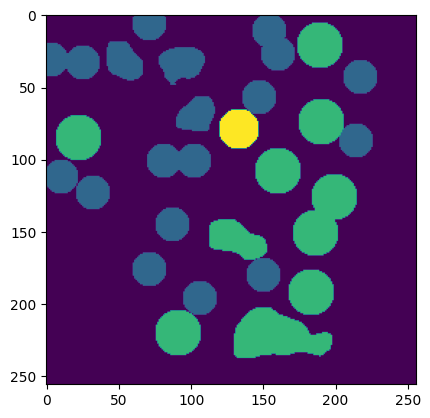

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 34, 111, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 239, 113, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 236, 30, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 186.0ms
Speed: 5.7ms preprocess, 186.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 238, 55, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 212, 73, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 182.7ms
Speed: 6.2ms preprocess, 182.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 26, 158, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 186.5ms
Speed: 6.1ms preprocess, 186.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 71, 121, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 67, 17, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 28, 72, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 96, 130, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 185.9ms
Speed: 6.8ms preprocess, 185.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 188, 125, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 8, 102, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 187.0ms
Speed: 6.8ms preprocess, 187.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 120, 70, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 188.3ms
Speed: 6.8ms preprocess, 188.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 97, 44, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 182.1ms
Speed: 6.5ms preprocess, 182.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 189, 60, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 137, 90, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 122, 181, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 0, 36, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 183.7ms
Speed: 6.1ms preprocess, 183.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(207, 106, 232, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 188.5ms
Speed: 6.2ms preprocess, 188.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 187, 96, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 188.4ms
Speed: 6.3ms preprocess, 188.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 77, 208, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 182.3ms
Speed: 7.0ms preprocess, 182.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 67, 96, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 157, 38, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 189.8ms
Speed: 6.2ms preprocess, 189.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 106, 116, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 188.0ms
Speed: 8.8ms preprocess, 188.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 158, 162, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 185.4ms
Speed: 10.1ms preprocess, 185.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(94, 147, 116, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 136, 146, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3024.png: 1024x1024 11 objects, 188.1ms
Speed: 5.9ms preprocess, 188.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(121, 66, 148, 93)
FINAL MASK!!!


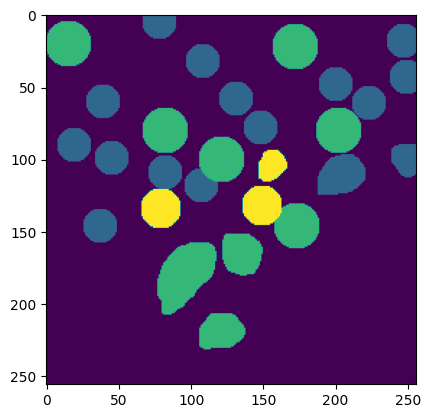

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 180.4ms
Speed: 9.5ms preprocess, 180.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 107, 183, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 179.6ms
Speed: 9.2ms preprocess, 179.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 35, 118, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 182.2ms
Speed: 6.1ms preprocess, 182.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 206, 124, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 186.4ms
Speed: 5.9ms preprocess, 186.4ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 81, 142, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 182.2ms
Speed: 6.4ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 47, 151, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(166, 54, 197, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 31, 191, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 183.5ms
Speed: 10.2ms preprocess, 183.5ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(144, 170, 175, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 187.7ms
Speed: 6.2ms preprocess, 187.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 59, 241, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 39, 82, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 100, 93, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 185.2ms
Speed: 6.7ms preprocess, 185.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1509.0 bbox 400
fixed shape for a cell
(117, 140, 144, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(114, 174, 137, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 187.5ms
Speed: 6.6ms preprocess, 187.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1509.0 bbox 400
fixed shape for a cell
(123, 116, 150, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 103, 105, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3048.png: 1024x1024 7 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(183, 96, 210, 123)
FINAL MASK!!!


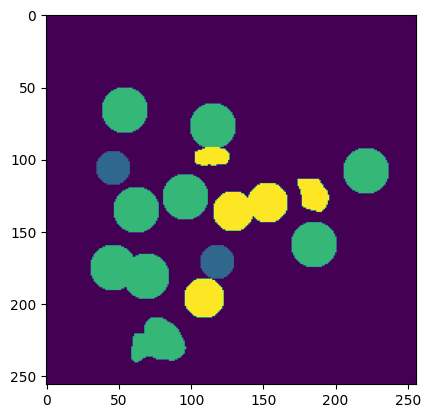

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 27, 42, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 71, 30, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 110, 24, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 183.5ms
Speed: 6.1ms preprocess, 183.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 142, 60, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 191.4ms
Speed: 5.4ms preprocess, 191.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 75, 113, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 0, 95, 18)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.6ms
Speed: 6.2ms preprocess, 186.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 96, 186, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 181.2ms
Speed: 6.5ms preprocess, 181.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 157, 89, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.8ms
Speed: 7.4ms preprocess, 186.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 76, 49, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 206, 213, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 1, 71, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 214, 68, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 99, 93, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.3ms
Speed: 6.5ms preprocess, 186.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 18, 135, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(161, 228, 190, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 182.9ms
Speed: 10.0ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(191, 174, 222, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 181.8ms
Speed: 6.7ms preprocess, 181.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 0, 27, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 102, 129, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 184.3ms
Speed: 6.0ms preprocess, 184.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 42, 162, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 182.5ms
Speed: 8.8ms preprocess, 182.5ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 176, 172, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.5ms
Speed: 8.2ms preprocess, 186.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 162, 151, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(132, 135, 163, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 181.5ms
Speed: 8.2ms preprocess, 181.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 153, 122, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 187.2ms
Speed: 8.9ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 180, 74, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 36, 72, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 41, 111, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 62, 167, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 216, 250, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 188.8ms
Speed: 6.5ms preprocess, 188.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 160, 200, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 200, 150, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 185.2ms
Speed: 6.6ms preprocess, 185.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 198, 115, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3066.png: 1024x1024 7 objects, 186.9ms
Speed: 6.5ms preprocess, 186.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(5, 152, 32, 179)
FINAL MASK!!!


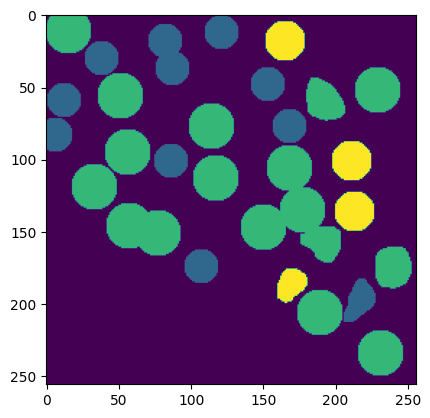

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 182.1ms
Speed: 6.1ms preprocess, 182.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 33, 123, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 187.0ms
Speed: 6.8ms preprocess, 187.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 68, 205, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 184.1ms
Speed: 6.7ms preprocess, 184.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(141, 227, 164, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 223, 127, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 183, 169, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(53, 40, 76, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 186.7ms
Speed: 7.1ms preprocess, 186.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(60, 91, 83, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 180.4ms
Speed: 6.4ms preprocess, 180.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(85, 174, 108, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 79, 121, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 185.5ms
Speed: 7.1ms preprocess, 185.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(81, 58, 104, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(165, 130, 188, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 0, 56, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 189.2ms
Speed: 6.3ms preprocess, 189.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 34, 40, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(9, 68, 32, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 179.7ms
Speed: 9.2ms preprocess, 179.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(15, 131, 38, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 186.1ms
Speed: 6.7ms preprocess, 186.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(50, 193, 71, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 181.6ms
Speed: 6.6ms preprocess, 181.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(0, 0, 22, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 187.4ms
Speed: 7.1ms preprocess, 187.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(35, 66, 58, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 183.4ms
Speed: 7.1ms preprocess, 183.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(78, 211, 101, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 186.1ms
Speed: 5.7ms preprocess, 186.1ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 243, 63, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 181.8ms
Speed: 7.6ms preprocess, 181.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  778.0 bbox 256
fixed shape for a cell
(143, 39, 166, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 101, 150, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 180.4ms
Speed: 9.4ms preprocess, 180.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 172, 140, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 182.8ms
Speed: 6.1ms preprocess, 182.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 207, 158, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 182.9ms
Speed: 6.2ms preprocess, 182.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(162, 76, 191, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 135, 89, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 184.2ms
Speed: 8.2ms preprocess, 184.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 105, 225, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 182.2ms
Speed: 8.5ms preprocess, 182.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 168, 226, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 187.3ms
Speed: 6.7ms preprocess, 187.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 158, 161, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 182.3ms
Speed: 6.6ms preprocess, 182.3ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(63, 0, 90, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(36, 216, 63, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0004__idx-3120.png: 1024x1024 23 objects, 185.2ms
Speed: 6.6ms preprocess, 185.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(5, 179, 32, 206)
FINAL MASK!!!


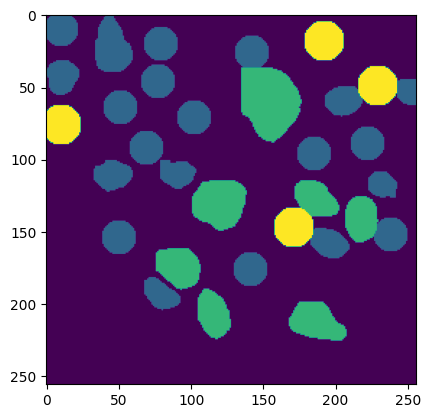

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 186.6ms
Speed: 6.6ms preprocess, 186.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 161, 183, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 121, 96, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 181.5ms
Speed: 6.9ms preprocess, 181.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 124, 137, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(125, 52, 165, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(125, 52, 165, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 186.4ms
Speed: 7.3ms preprocess, 186.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 51, 27, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 187.2ms
Speed: 7.4ms preprocess, 187.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 142, 61, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 22, 193, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 181, 223, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 48, 247, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 183.3ms
Speed: 6.1ms preprocess, 183.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(233, 27, 256, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 184.9ms
Speed: 9.6ms preprocess, 184.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 99, 58, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 186.2ms
Speed: 6.1ms preprocess, 186.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 34, 229, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 181.7ms
Speed: 6.1ms preprocess, 181.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 216, 127, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 195, 165, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 180, 138, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 180.1ms
Speed: 6.6ms preprocess, 180.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  922.0 bbox 256
fixed shape for a cell
(136, 18, 159, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 189.1ms
Speed: 6.3ms preprocess, 189.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 54, 62, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 29, 72, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 117, 39, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 183.6ms
Speed: 6.7ms preprocess, 183.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 161, 40, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 182.4ms
Speed: 10.1ms preprocess, 182.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(206, 12, 234, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 166, 100, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 184.8ms
Speed: 6.1ms preprocess, 184.8ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 216, 104, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 182.0ms
Speed: 6.0ms preprocess, 182.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 183, 85, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(74, 18, 107, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 182.8ms
Speed: 6.1ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 127, 207, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 185.9ms
Speed: 6.1ms preprocess, 185.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 81, 176, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 180.1ms
Speed: 6.2ms preprocess, 180.1ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(203, 95, 234, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 181.5ms
Speed: 6.0ms preprocess, 181.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 105, 178, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 186.9ms
Speed: 8.6ms preprocess, 186.9ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 78, 104, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 186.3ms
Speed: 8.3ms preprocess, 186.3ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 147, 150, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3002.png: 1024x1024 7 objects, 185.6ms
Speed: 7.1ms preprocess, 185.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(218, 128, 249, 159)
FINAL MASK!!!


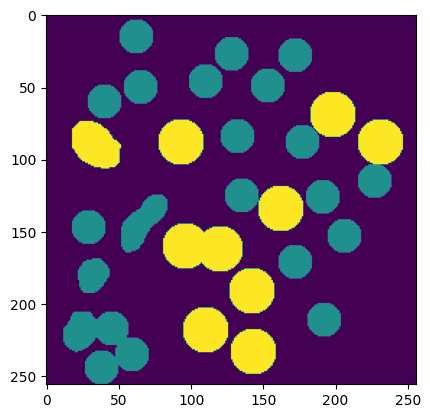

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 183.5ms
Speed: 6.7ms preprocess, 183.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 44, 229, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 187.1ms
Speed: 7.3ms preprocess, 187.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 0, 161, 14)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 189.1ms
Speed: 6.2ms preprocess, 189.1ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(183, 131, 206, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 188.0ms
Speed: 6.3ms preprocess, 188.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 200, 149, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 107, 174, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 25, 246, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 187.1ms
Speed: 6.5ms preprocess, 187.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 62, 241, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(191, 31, 214, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 188.0ms
Speed: 6.1ms preprocess, 188.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 11, 97, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 189.0ms
Speed: 6.2ms preprocess, 189.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 48, 76, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 183.0ms
Speed: 6.0ms preprocess, 183.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 133, 162, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 186.7ms
Speed: 6.1ms preprocess, 186.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(175, 166, 206, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 184.5ms
Speed: 6.1ms preprocess, 184.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 61, 149, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 186.2ms
Speed: 6.1ms preprocess, 186.2ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 101, 74, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 54, 101, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 181.4ms
Speed: 6.1ms preprocess, 181.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 101, 144, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(197, 0, 228, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 108, 105, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 186.0ms
Speed: 6.7ms preprocess, 186.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 13, 154, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 181.1ms
Speed: 6.8ms preprocess, 181.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 167, 140, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 183.7ms
Speed: 6.6ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(143, 39, 174, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 104, 238, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 4, 47, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 181.2ms
Speed: 7.6ms preprocess, 181.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 162, 178, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3004.png: 1024x1024 4 objects, 186.0ms
Speed: 6.7ms preprocess, 186.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(175, 85, 206, 116)
FINAL MASK!!!


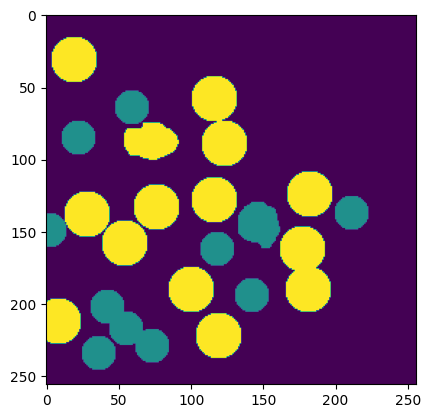

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 182.7ms
Speed: 6.1ms preprocess, 182.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 0, 114, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 181.3ms
Speed: 6.4ms preprocess, 181.3ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 159, 23, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 185.5ms
Speed: 9.0ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 85, 191, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 186.7ms
Speed: 6.0ms preprocess, 186.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(146, 100, 169, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 186.2ms
Speed: 8.2ms preprocess, 186.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 17, 139, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.4ms
Speed: 10.1ms preprocess, 184.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 48, 132, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(101, 213, 124, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.3ms
Speed: 6.1ms preprocess, 184.3ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 76, 116, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 63, 63, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 181.8ms
Speed: 6.7ms preprocess, 181.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 181, 117, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.2ms
Speed: 9.4ms preprocess, 184.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 98, 39, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 0, 46, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.3ms
Speed: 6.2ms preprocess, 184.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 168, 77, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 186.3ms
Speed: 6.8ms preprocess, 186.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 213, 78, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 183.1ms
Speed: 8.6ms preprocess, 183.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 193, 139, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 151, 212, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 187.4ms
Speed: 8.2ms preprocess, 187.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 55, 224, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 202, 167, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 182.7ms
Speed: 6.6ms preprocess, 182.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 142, 39, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 181.3ms
Speed: 10.2ms preprocess, 181.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 19, 29, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 187.1ms
Speed: 6.1ms preprocess, 187.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 101, 130, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 90, 112, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 183.3ms
Speed: 6.0ms preprocess, 183.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 102, 81, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 2.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(226, 52, 251, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(37, 185, 62, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 25, 172, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.3ms
Speed: 6.0ms preprocess, 184.3ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 56, 186, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 181.6ms
Speed: 6.1ms preprocess, 181.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 231, 152, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(195, 223, 224, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 181.3ms
Speed: 6.9ms preprocess, 181.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 134, 168, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 185.2ms
Speed: 5.8ms preprocess, 185.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 144, 92, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 182.6ms
Speed: 6.1ms preprocess, 182.6ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 151, 120, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 89, 143, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 185.5ms
Speed: 7.2ms preprocess, 185.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 0, 244, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 165, 169, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 186.5ms
Speed: 6.6ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 46, 100, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 184.4ms
Speed: 7.9ms preprocess, 184.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 14, 78, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3006.png: 1024x1024 6 objects, 185.5ms
Speed: 6.2ms preprocess, 185.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(219, 103, 250, 134)
FINAL MASK!!!


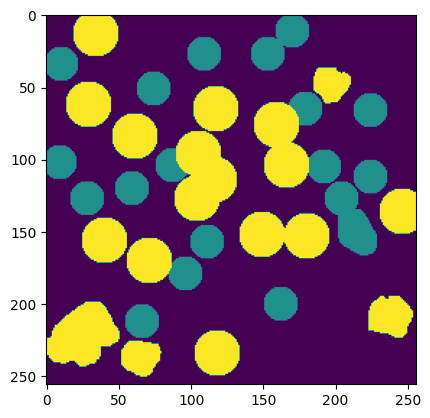

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 142, 170, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 185.5ms
Speed: 6.9ms preprocess, 185.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 123, 118, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 191, 137, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 169, 146, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(14, 174, 37, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 213, 110, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 232, 164, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 181.0ms
Speed: 11.1ms preprocess, 181.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 63, 212, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 170, 61, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 0, 110, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1781.0 bbox 576
fixed shape for a cell
(21, 29, 52, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 74, 165, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 188.5ms
Speed: 5.8ms preprocess, 188.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 74, 165, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1781.0 bbox 576
fixed shape for a cell
(46, 53, 77, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 53, 32, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.6ms
Speed: 6.5ms preprocess, 184.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 102, 48, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 186.3ms
Speed: 6.6ms preprocess, 186.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 143, 55, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 186.3ms
Speed: 6.1ms preprocess, 186.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 119, 63, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 41, 191, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 186.6ms
Speed: 6.1ms preprocess, 186.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 132, 92, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 160, 108, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 187.7ms
Speed: 6.6ms preprocess, 187.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 115, 135, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.7ms
Speed: 6.1ms preprocess, 184.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 221, 75, 252)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 35, 116, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3008.png: 1024x1024 11 objects, 182.7ms
Speed: 6.1ms preprocess, 182.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(54, 14, 81, 41)
FINAL MASK!!!


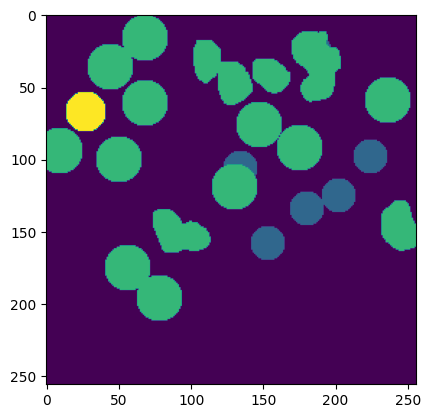

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 113, 28, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 183.2ms
Speed: 6.1ms preprocess, 183.2ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 191, 144, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 182.3ms
Speed: 6.8ms preprocess, 182.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 148, 203, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 185.0ms
Speed: 8.2ms preprocess, 185.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(184, 125, 207, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(166, 111, 189, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 182.4ms
Speed: 6.0ms preprocess, 182.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 73, 212, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(221, 74, 244, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 184.5ms
Speed: 9.5ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 50, 256, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 48, 218, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 185.6ms
Speed: 7.0ms preprocess, 185.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 0, 93, 20)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 173, 103, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 94, 157, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 182.1ms
Speed: 8.3ms preprocess, 182.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 80, 22, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 24, 175, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 183.2ms
Speed: 6.1ms preprocess, 183.2ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 187, 191, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 186.9ms
Speed: 6.3ms preprocess, 186.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 0, 44, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 185.6ms
Speed: 6.2ms preprocess, 185.6ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 36, 47, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 184.1ms
Speed: 6.9ms preprocess, 184.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(175, 207, 198, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(61, 15, 92, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 185.7ms
Speed: 6.1ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 12, 242, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 164, 37, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 211, 31, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 204, 81, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 213, 111, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 181.8ms
Speed: 6.4ms preprocess, 181.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 57, 124, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 188.7ms
Speed: 6.7ms preprocess, 188.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 154, 171, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 123, 110, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 182.9ms
Speed: 6.2ms preprocess, 182.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 133, 142, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 82, 62, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 186.1ms
Speed: 6.1ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 53, 97, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 182.5ms
Speed: 7.1ms preprocess, 182.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 84, 111, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 120, 88, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 187.9ms
Speed: 6.1ms preprocess, 187.9ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 13, 129, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 184.3ms
Speed: 6.2ms preprocess, 184.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 166, 138, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 186.9ms
Speed: 6.9ms preprocess, 186.9ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(208, 114, 235, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 181.8ms
Speed: 6.4ms preprocess, 181.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 144, 62, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 54, 165, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3014.png: 1024x1024 2 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(108, 116, 135, 143)
FINAL MASK!!!


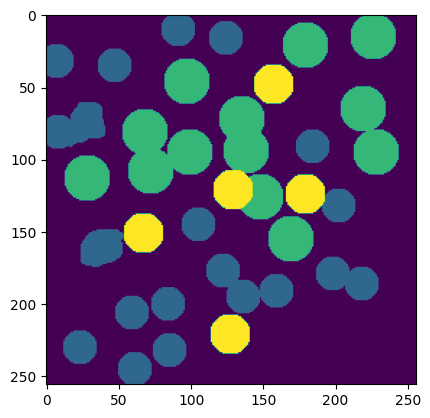

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 186.5ms
Speed: 6.0ms preprocess, 186.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 22, 88, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 183.7ms
Speed: 6.4ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 1, 97, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 182.7ms
Speed: 6.2ms preprocess, 182.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 204, 49, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 183.9ms
Speed: 6.1ms preprocess, 183.9ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 184, 112, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 187.8ms
Speed: 6.4ms preprocess, 187.8ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 125, 33, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 185, 159, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 186.3ms
Speed: 8.1ms preprocess, 186.3ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 53, 58, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 88, 28, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 134, 64, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 182.4ms
Speed: 8.6ms preprocess, 182.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 74, 144, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(122, 107, 145, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 187.9ms
Speed: 6.0ms preprocess, 187.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 88, 176, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 187.1ms
Speed: 6.8ms preprocess, 187.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 29, 175, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 186.8ms
Speed: 6.0ms preprocess, 186.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 39, 137, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 74, 109, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 187.8ms
Speed: 6.4ms preprocess, 187.8ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 55, 168, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 205, 86, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 185.2ms
Speed: 8.8ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 139, 182, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 187.3ms
Speed: 7.3ms preprocess, 187.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(185, 99, 210, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 185.7ms
Speed: 6.1ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 116, 89, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 172, 183, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 186.4ms
Speed: 6.9ms preprocess, 186.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 179, 88, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3018.png: 1024x1024 6 objects, 183.7ms
Speed: 6.9ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(110, 160, 137, 187)
FINAL MASK!!!


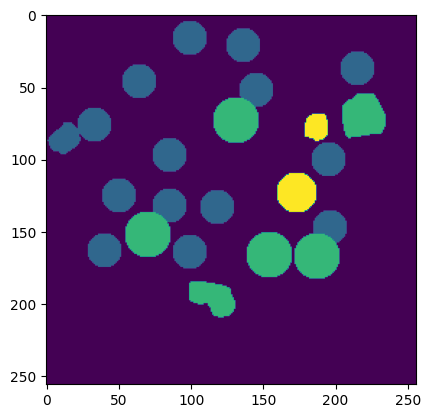

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 188.4ms
Speed: 6.4ms preprocess, 188.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 93, 178, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 182.0ms
Speed: 6.1ms preprocess, 182.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 190, 71, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(144, 76, 167, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 186.2ms
Speed: 6.1ms preprocess, 186.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(122, 51, 145, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.3ms
Speed: 7.1ms preprocess, 183.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 78, 118, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 190, 188, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.2ms
Speed: 6.1ms preprocess, 183.2ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 158, 37, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 75, 20, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 187.6ms
Speed: 6.2ms preprocess, 187.6ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 118, 78, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.8ms
Speed: 6.5ms preprocess, 183.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 154, 127, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 186.6ms
Speed: 6.7ms preprocess, 186.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 2, 30, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 22, 178, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 186.5ms
Speed: 6.7ms preprocess, 186.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(28, 134, 51, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 136, 23, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 134, 198, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 0, 77, 28)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.1ms
Speed: 6.1ms preprocess, 183.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 39, 172, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 185.5ms
Speed: 9.4ms preprocess, 185.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(68, 183, 99, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 188.6ms
Speed: 6.1ms preprocess, 188.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 58, 73, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.4ms
Speed: 5.9ms preprocess, 183.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 25, 40, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 182.0ms
Speed: 6.5ms preprocess, 182.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 98, 46, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 188.0ms
Speed: 9.0ms preprocess, 188.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 188, 158, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 206, 42, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 187.9ms
Speed: 6.0ms preprocess, 187.9ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(97, 232, 128, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 174, 212, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 186.2ms
Speed: 6.5ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 57, 49, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 183.2ms
Speed: 9.2ms preprocess, 183.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 27, 69, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3020.png: 1024x1024 6 objects, 186.7ms
Speed: 9.3ms preprocess, 186.7ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(110, 128, 137, 155)
FINAL MASK!!!


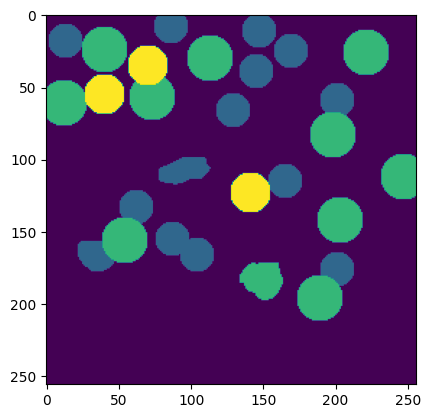

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 182.5ms
Speed: 7.9ms preprocess, 182.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 37, 102, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 186.6ms
Speed: 7.0ms preprocess, 186.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 105, 41, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 186.4ms
Speed: 6.4ms preprocess, 186.4ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 227, 185, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 108, 105, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 182.3ms
Speed: 7.5ms preprocess, 182.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 68, 61, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 24, 175, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 187.5ms
Speed: 6.3ms preprocess, 187.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 168, 52, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 182.2ms
Speed: 6.2ms preprocess, 182.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 199, 194, 222)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 79, 161, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 145, 148, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(182, 161, 205, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 183.5ms
Speed: 6.3ms preprocess, 183.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 166, 168, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 196, 36, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 184.2ms
Speed: 5.8ms preprocess, 184.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 72, 78, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 53, 168, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 184.0ms
Speed: 5.9ms preprocess, 184.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 175, 75, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 181.9ms
Speed: 6.4ms preprocess, 181.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 230, 74, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 123, 201, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 183.7ms
Speed: 7.3ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 203, 141, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 187.4ms
Speed: 6.1ms preprocess, 187.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 163, 102, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 182.0ms
Speed: 6.3ms preprocess, 182.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 60, 126, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 186.7ms
Speed: 6.1ms preprocess, 186.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(175, 54, 206, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 190.0ms
Speed: 6.0ms preprocess, 190.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 204, 162, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 128, 73, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3022.png: 1024x1024 6 objects, 182.7ms
Speed: 8.1ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(70, 211, 88, 225)
FINAL MASK!!!


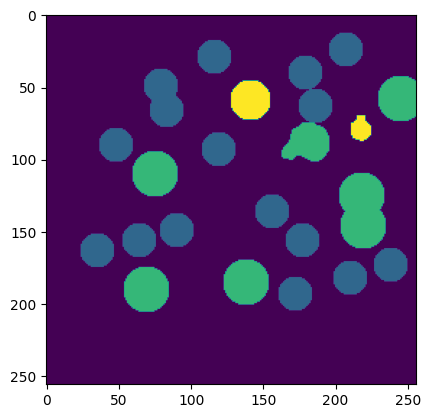

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 183.6ms
Speed: 6.9ms preprocess, 183.6ms inference, 8.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(84, 76, 107, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 186.6ms
Speed: 6.3ms preprocess, 186.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 123, 129, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 182.9ms
Speed: 5.8ms preprocess, 182.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 60, 17, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 180.2ms
Speed: 10.3ms preprocess, 180.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(2, 8, 25, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 181.5ms
Speed: 6.1ms preprocess, 181.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 0, 97, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 183.5ms
Speed: 6.7ms preprocess, 183.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 155, 122, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 186.8ms
Speed: 7.3ms preprocess, 186.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(167, 38, 190, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 186.3ms
Speed: 5.9ms preprocess, 186.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(144, 52, 167, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 25, 138, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 182.9ms
Speed: 6.0ms preprocess, 182.9ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 168, 67, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 116, 67, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 182.1ms
Speed: 10.7ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 31, 49, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 185.9ms
Speed: 7.4ms preprocess, 185.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 39, 88, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 186.8ms
Speed: 6.7ms preprocess, 186.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(116, 80, 133, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 187.2ms
Speed: 6.1ms preprocess, 187.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 47, 127, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 185.3ms
Speed: 6.5ms preprocess, 185.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(203, 155, 234, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 184.3ms
Speed: 6.3ms preprocess, 184.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 133, 21, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 187.9ms
Speed: 6.2ms preprocess, 187.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 86, 24, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 144, 54, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 135, 85, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 188.3ms
Speed: 7.1ms preprocess, 188.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 201, 45, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 152, 193, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(171, 72, 201, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 184.3ms
Speed: 6.2ms preprocess, 184.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(71, 168, 102, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 185.3ms
Speed: 6.6ms preprocess, 185.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 71, 69, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 94, 112, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 133, 165, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 186.1ms
Speed: 6.7ms preprocess, 186.1ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(190, 40, 221, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3026.png: 1024x1024 7 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(132, 75, 166, 123)
FINAL MASK!!!


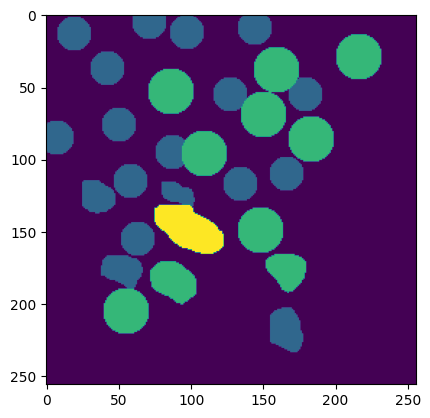

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 183.7ms
Speed: 6.5ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 78, 27, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 186.1ms
Speed: 6.0ms preprocess, 186.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 119, 58, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 183.7ms
Speed: 6.7ms preprocess, 183.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 9, 79, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 155, 191, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 184.1ms
Speed: 8.1ms preprocess, 184.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 126, 178, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 87, 144, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 186.9ms
Speed: 8.1ms preprocess, 186.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 137, 136, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 182.8ms
Speed: 10.2ms preprocess, 182.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(132, 150, 155, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 186.4ms
Speed: 6.1ms preprocess, 186.4ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 199, 224, 222)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 188.2ms
Speed: 5.9ms preprocess, 188.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(210, 161, 233, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 187.5ms
Speed: 8.6ms preprocess, 187.5ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 150, 69, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 89, 186, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 186.4ms
Speed: 8.8ms preprocess, 186.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 36, 162, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 188.1ms
Speed: 6.2ms preprocess, 188.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 70, 64, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 222, 59, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 180.5ms
Speed: 9.8ms preprocess, 180.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 101, 118, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 184.5ms
Speed: 9.0ms preprocess, 184.5ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 56, 95, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 185.4ms
Speed: 7.7ms preprocess, 185.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 173, 198, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 183.7ms
Speed: 12.8ms preprocess, 183.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 193, 161, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 169, 59, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 111, 212, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 187.8ms
Speed: 6.4ms preprocess, 187.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(96, 161, 123, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 186.3ms
Speed: 7.8ms preprocess, 186.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 9, 124, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3028.png: 1024x1024 10 objects, 184.2ms
Speed: 6.5ms preprocess, 184.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(99, 9, 124, 44)
FINAL MASK!!!


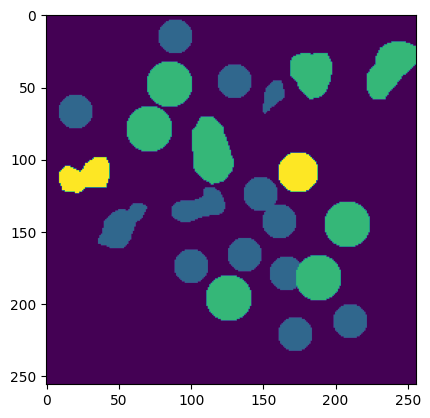

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.7ms
Speed: 6.8ms preprocess, 185.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 82, 62, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(3, 209, 23, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 166, 21, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 239, 17, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 186.8ms
Speed: 6.6ms preprocess, 186.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 150, 47, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 187.2ms
Speed: 6.4ms preprocess, 187.2ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 220, 101, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.5ms
Speed: 8.4ms preprocess, 185.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 116, 108, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(214, 171, 237, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 186.5ms
Speed: 8.2ms preprocess, 186.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 122, 176, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 186.7ms
Speed: 6.7ms preprocess, 186.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(103, 234, 126, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 182.3ms
Speed: 6.5ms preprocess, 182.3ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 86, 234, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.5ms
Speed: 6.8ms preprocess, 185.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(220, 126, 243, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 168, 156, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 181.4ms
Speed: 6.4ms preprocess, 181.4ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 156, 179, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 184.7ms
Speed: 6.1ms preprocess, 184.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 54, 104, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 187.6ms
Speed: 6.4ms preprocess, 187.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(98, 156, 121, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.6ms
Speed: 13.2ms preprocess, 185.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 89, 136, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.2ms
Speed: 6.6ms preprocess, 183.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(9, 173, 60, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 186.9ms
Speed: 6.8ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(26, 207, 62, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.7ms
Speed: 8.1ms preprocess, 185.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 104, 80, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 189.0ms
Speed: 6.0ms preprocess, 189.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(101, 192, 132, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.5ms
Speed: 6.4ms preprocess, 183.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 122, 201, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 181.0ms
Speed: 8.2ms preprocess, 181.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 216, 163, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.5ms
Speed: 6.9ms preprocess, 183.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 120, 226, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 183.1ms
Speed: 8.4ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(211, 212, 238, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 188.2ms
Speed: 8.3ms preprocess, 188.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 109, 160, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.6ms
Speed: 6.0ms preprocess, 185.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 75, 203, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.0ms
Speed: 6.0ms preprocess, 185.0ms inference, 8.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(22, 108, 39, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 8.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 144, 89, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3032.png: 1024x1024 17 objects, 185.0ms
Speed: 6.7ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(177, 200, 209, 214)
FINAL MASK!!!


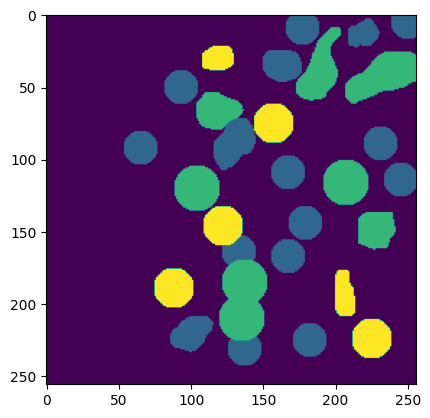

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 185.7ms
Speed: 6.1ms preprocess, 185.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(54, 39, 77, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(90, 74, 113, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 188.9ms
Speed: 5.7ms preprocess, 188.9ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 169, 63, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.1ms
Speed: 6.1ms preprocess, 183.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(99, 146, 122, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 186.5ms
Speed: 6.0ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(14, 13, 37, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 188.0ms
Speed: 6.4ms preprocess, 188.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(114, 57, 137, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(81, 11, 104, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 182.7ms
Speed: 6.0ms preprocess, 182.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(32, 0, 55, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(181, 81, 204, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(0, 69, 20, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 187.7ms
Speed: 6.2ms preprocess, 187.7ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(16, 54, 39, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 188.0ms
Speed: 6.3ms preprocess, 188.0ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1122.0 bbox 256
fixed shape for a cell
(14, 165, 37, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(189, 54, 212, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 186.5ms
Speed: 6.0ms preprocess, 186.5ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(32, 219, 55, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 181.6ms
Speed: 6.2ms preprocess, 181.6ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(6, 216, 29, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 187.0ms
Speed: 6.7ms preprocess, 187.0ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(96, 115, 119, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 185.8ms
Speed: 10.9ms preprocess, 185.8ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(129, 92, 152, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 186.8ms
Speed: 7.0ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(53, 87, 76, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(119, 132, 142, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 3.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 11, 141, 42)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 187.7ms
Speed: 6.3ms preprocess, 187.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 49, 173, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 135, 87, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(7, 167, 51, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 186.4ms
Speed: 6.8ms preprocess, 186.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 212, 90, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 82, 205, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 185.5ms
Speed: 6.0ms preprocess, 185.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(150, 125, 180, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 184.6ms
Speed: 6.1ms preprocess, 184.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 152, 176, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.9ms
Speed: 6.0ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 141, 228, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 173, 108, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 183.3ms
Speed: 6.1ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 110, 216, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 181.5ms
Speed: 6.8ms preprocess, 181.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 171, 157, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3036.png: 1024x1024 8 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(5, 123, 32, 150)
FINAL MASK!!!


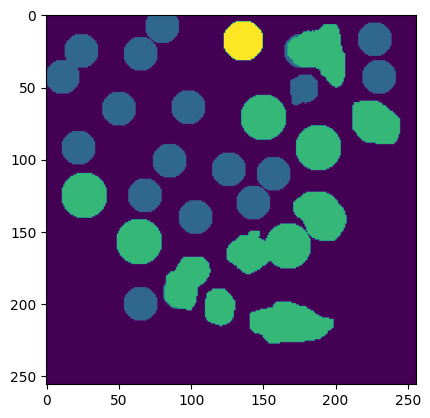

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 97, 90, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 186.7ms
Speed: 8.6ms preprocess, 186.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(65, 133, 105, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 181.3ms
Speed: 6.2ms preprocess, 181.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 119, 71, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 185.0ms
Speed: 9.2ms preprocess, 185.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 186, 148, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.1ms
Speed: 6.5ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 217, 61, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(15, 176, 40, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 182.7ms
Speed: 7.4ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 143, 52, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 185.1ms
Speed: 5.6ms preprocess, 185.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 88, 34, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 187.9ms
Speed: 8.2ms preprocess, 187.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 49, 54, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 27, 63, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 181.8ms
Speed: 6.4ms preprocess, 181.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 0, 44, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.3ms
Speed: 6.5ms preprocess, 184.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 62, 168, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 188.9ms
Speed: 6.3ms preprocess, 188.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 103, 173, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 185.5ms
Speed: 6.7ms preprocess, 185.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 127, 185, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 183.0ms
Speed: 8.2ms preprocess, 183.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 23, 17, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 26, 200, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 185.3ms
Speed: 6.1ms preprocess, 185.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 0, 106, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 7, 128, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 186.2ms
Speed: 6.0ms preprocess, 186.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 2, 190, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(103, 167, 126, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 159, 99, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 192, 74, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.7ms
Speed: 6.4ms preprocess, 184.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(202, 42, 233, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 137, 25, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 144, 140, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 181.4ms
Speed: 7.0ms preprocess, 181.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(161, 154, 192, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 183.9ms
Speed: 6.5ms preprocess, 183.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 35, 146, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 184, 189, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 186.1ms
Speed: 9.6ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 86, 255, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 163, 237, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.2ms
Speed: 7.2ms preprocess, 184.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 106, 53, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(208, 135, 235, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 180.5ms
Speed: 8.4ms preprocess, 180.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(184, 91, 211, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 189.5ms
Speed: 6.5ms preprocess, 189.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(102, 98, 129, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3040.png: 1024x1024 10 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(66, 58, 93, 85)
FINAL MASK!!!


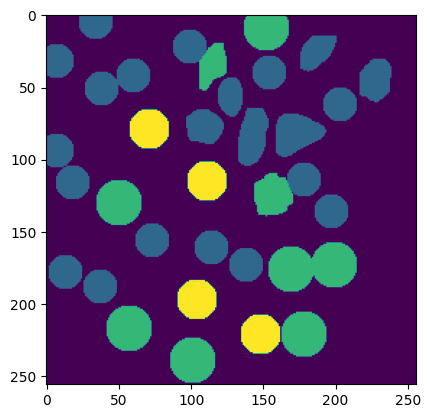

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 184.9ms
Speed: 6.5ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 6, 181, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 182.8ms
Speed: 6.1ms preprocess, 182.8ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 201, 95, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 186.2ms
Speed: 7.0ms preprocess, 186.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2443.0 bbox 256
fixed shape for a cell
(199, 80, 222, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 181.0ms
Speed: 9.2ms preprocess, 181.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 41, 19, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 184.7ms
Speed: 6.8ms preprocess, 184.7ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 29, 97, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 183.2ms
Speed: 7.0ms preprocess, 183.2ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 94, 143, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 180.8ms
Speed: 8.2ms preprocess, 180.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 140, 160, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 181.8ms
Speed: 9.0ms preprocess, 181.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(195, 126, 220, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 186.5ms
Speed: 9.0ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 0, 148, 18)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 19, 160, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(136, 49, 157, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 143, 242, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 110, 151, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 184.3ms
Speed: 6.2ms preprocess, 184.3ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(114, 69, 138, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 184.3ms
Speed: 6.3ms preprocess, 184.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 90, 78, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 44, 256, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 183.8ms
Speed: 6.8ms preprocess, 183.8ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(81, 101, 112, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 181.8ms
Speed: 6.4ms preprocess, 181.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 170, 198, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 181.9ms
Speed: 6.3ms preprocess, 181.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(208, 9, 239, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 36, 52, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(171, 33, 213, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 53, 100, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 185.1ms
Speed: 6.3ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 113, 191, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 186.9ms
Speed: 6.3ms preprocess, 186.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(221, 99, 252, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2443.0 bbox 576
fixed shape for a cell
(162, 72, 193, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 184.8ms
Speed: 6.6ms preprocess, 184.8ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 173, 57, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 69, 48, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 185.8ms
Speed: 6.6ms preprocess, 185.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 124, 79, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(103, 193, 134, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3047.png: 1024x1024 12 objects, 183.9ms
Speed: 7.4ms preprocess, 183.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(95, 155, 122, 182)
FINAL MASK!!!


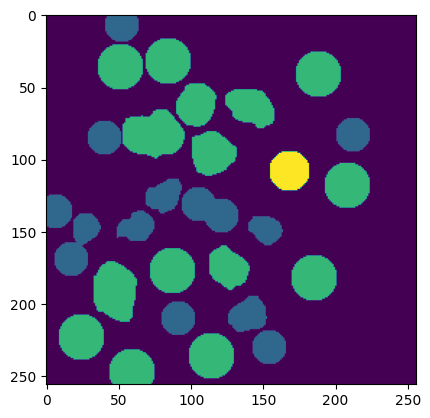

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(128, 20, 151, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.3ms
Speed: 8.0ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(4, 34, 27, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.7ms
Speed: 6.1ms preprocess, 185.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(24, 9, 47, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 188.3ms
Speed: 6.4ms preprocess, 188.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(43, 0, 65, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 187.3ms
Speed: 6.7ms preprocess, 187.3ms inference, 12.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(68, 2, 93, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 179.8ms
Speed: 8.3ms preprocess, 179.8ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(116, 153, 139, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 181.3ms
Speed: 9.5ms preprocess, 181.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(169, 25, 192, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 186.6ms
Speed: 6.0ms preprocess, 186.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(183, 76, 206, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 186.3ms
Speed: 8.5ms preprocess, 186.3ms inference, 8.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(195, 184, 218, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 184.3ms
Speed: 7.5ms preprocess, 184.3ms inference, 10.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(159, 230, 189, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 180.7ms
Speed: 7.1ms preprocess, 180.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(223, 2, 246, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 181.6ms
Speed: 6.6ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(68, 215, 91, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 183.7ms
Speed: 7.5ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(90, 213, 113, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 184.8ms
Speed: 8.6ms preprocess, 184.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(116, 57, 139, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(197, 25, 220, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.2ms
Speed: 6.1ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(22, 203, 43, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 183.6ms
Speed: 6.5ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(74, 160, 97, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(102, 20, 125, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 184.7ms
Speed: 8.1ms preprocess, 184.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(39, 161, 62, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 183.3ms
Speed: 6.6ms preprocess, 183.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(230, 230, 253, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 183.2ms
Speed: 6.7ms preprocess, 183.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(100, 0, 123, 17)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 182.6ms
Speed: 9.9ms preprocess, 182.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(95, 112, 118, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 186.7ms
Speed: 7.3ms preprocess, 186.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(0, 71, 18, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(35, 52, 58, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 182.2ms
Speed: 6.2ms preprocess, 182.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 227, 62, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 187.0ms
Speed: 7.3ms preprocess, 187.0ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(226, 183, 256, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 186.3ms
Speed: 6.6ms preprocess, 186.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 48, 187, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 200, 175, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 180.7ms
Speed: 8.7ms preprocess, 180.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(144, 69, 175, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 117, 181, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.5ms
Speed: 6.5ms preprocess, 185.5ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(178, 0, 213, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 168, 124, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(36, 84, 67, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.0ms
Speed: 8.7ms preprocess, 185.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(146, 157, 182, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 182.4ms
Speed: 6.9ms preprocess, 182.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(194, 228, 230, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 183.9ms
Speed: 6.3ms preprocess, 183.9ms inference, 8.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 209, 138, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(63, 118, 90, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.0ms
Speed: 6.6ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(227, 131, 254, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 183.9ms
Speed: 5.9ms preprocess, 183.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 51, 246, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 185.7ms
Speed: 6.8ms preprocess, 185.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 149, 220, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 187.7ms
Speed: 6.3ms preprocess, 187.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 119, 205, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 186.5ms
Speed: 8.3ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 122, 54, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 181.8ms
Speed: 6.1ms preprocess, 181.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 46, 108, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3050.png: 1024x1024 11 objects, 186.0ms
Speed: 10.2ms preprocess, 186.0ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(117, 103, 144, 130)
FINAL MASK!!!


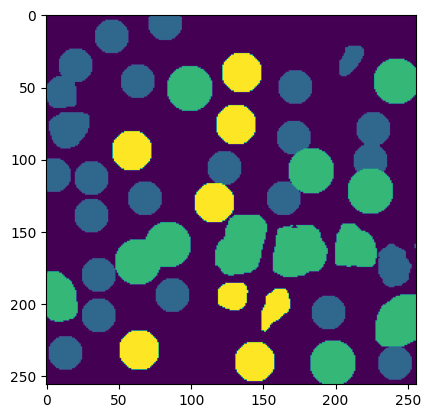

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 69, 188, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 181.0ms
Speed: 9.0ms preprocess, 181.0ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 207, 150, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 159, 187, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 180.9ms
Speed: 7.7ms preprocess, 180.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(216, 144, 239, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 159, 221, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(202, 36, 225, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 183.4ms
Speed: 7.4ms preprocess, 183.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 66, 230, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.9ms
Speed: 6.2ms preprocess, 182.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 0, 173, 17)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.3ms
Speed: 6.9ms preprocess, 185.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 39, 157, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 59, 165, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.8ms
Speed: 7.6ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(102, 10, 137, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 136, 155, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 184.6ms
Speed: 6.6ms preprocess, 184.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 138, 87, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 183.4ms
Speed: 7.2ms preprocess, 183.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(77, 74, 99, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 183.7ms
Speed: 9.1ms preprocess, 183.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 39, 103, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 41, 117, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.1ms
Speed: 7.3ms preprocess, 185.1ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 3, 42, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.3ms
Speed: 6.5ms preprocess, 182.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 184, 163, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(94, 130, 115, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.4ms
Speed: 9.1ms preprocess, 185.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(25, 43, 48, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 0, 111, 17)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 155, 62, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 186.8ms
Speed: 6.6ms preprocess, 186.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 61, 74, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 187.9ms
Speed: 8.6ms preprocess, 187.9ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 1, 75, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 107, 250, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 91, 141, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 183.4ms
Speed: 9.8ms preprocess, 183.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(182, 124, 213, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 185.8ms
Speed: 9.2ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 168, 105, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 186.3ms
Speed: 8.3ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 105, 45, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3056.png: 1024x1024 10 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(179, 7, 210, 38)
FINAL MASK!!!


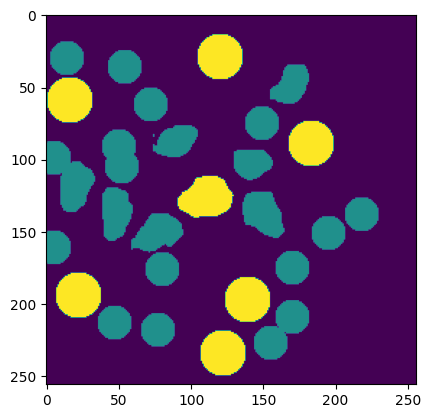

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 184.6ms
Speed: 7.6ms preprocess, 184.6ms inference, 7.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 132, 61, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 130, 117, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 147, 101, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 183.8ms
Speed: 6.6ms preprocess, 183.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(76, 120, 99, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 186.6ms
Speed: 6.2ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(101, 96, 124, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 186.1ms
Speed: 8.2ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 110, 80, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 80, 85, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.3ms
Speed: 7.4ms preprocess, 185.3ms inference, 8.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 0, 171, 15)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.5ms
Speed: 8.5ms preprocess, 185.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 93, 173, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 184.7ms
Speed: 8.2ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 140, 81, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 187.7ms
Speed: 6.7ms preprocess, 187.7ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 88, 150, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 188.1ms
Speed: 6.3ms preprocess, 188.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 58, 165, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(163, 20, 185, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.3ms
Speed: 6.5ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(169, 64, 194, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 17, 148, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 180.1ms
Speed: 6.7ms preprocess, 180.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 87, 63, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 183.8ms
Speed: 6.1ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 0, 105, 18)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 189.3ms
Speed: 7.9ms preprocess, 189.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 43, 95, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 186.9ms
Speed: 6.1ms preprocess, 186.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 128, 180, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 184.5ms
Speed: 6.4ms preprocess, 184.5ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 153, 170, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 11, 129, 42)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 186.5ms
Speed: 7.0ms preprocess, 186.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(36, 49, 67, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 188.7ms
Speed: 5.8ms preprocess, 188.7ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 37, 124, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 159, 124, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 132, 143, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 72, 141, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 39, 143, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 123, 217, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.0ms
Speed: 6.0ms preprocess, 185.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 68, 109, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 108, 182, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3062.png: 1024x1024 16 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(108, 0, 135, 25)
FINAL MASK!!!


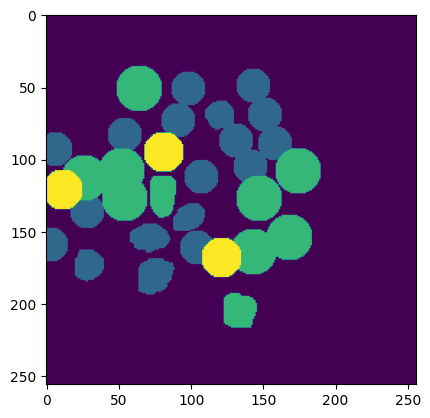

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 50, 92, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 187.1ms
Speed: 10.4ms preprocess, 187.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 174, 27, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 128, 63, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 187.8ms
Speed: 7.3ms preprocess, 187.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(194, 175, 217, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.0ms
Speed: 6.0ms preprocess, 183.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 118, 33, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.0ms
Speed: 8.1ms preprocess, 184.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 89, 50, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 181.6ms
Speed: 6.9ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 63, 59, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.5ms
Speed: 6.5ms preprocess, 185.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 24, 154, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.3ms
Speed: 7.4ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 20, 98, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 188.9ms
Speed: 6.1ms preprocess, 188.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 76, 93, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 39, 123, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(193, 83, 216, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 186, 17, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 186.6ms
Speed: 10.6ms preprocess, 186.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 17, 60, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 188.1ms
Speed: 6.9ms preprocess, 188.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 154, 164, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.2ms
Speed: 6.0ms preprocess, 184.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 149, 142, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.6ms
Speed: 8.6ms preprocess, 184.6ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 139, 122, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 29, 42, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.4ms
Speed: 6.5ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 0, 142, 20)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 48, 73, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.1ms
Speed: 6.6ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 0, 82, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 186.7ms
Speed: 6.4ms preprocess, 186.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 93, 135, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.2ms
Speed: 6.6ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 99, 183, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.3ms
Speed: 6.6ms preprocess, 183.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(203, 147, 226, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 188, 166, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.4ms
Speed: 7.0ms preprocess, 184.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 207, 70, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.1ms
Speed: 6.8ms preprocess, 185.1ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(188, 207, 219, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 0, 111, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 186.7ms
Speed: 6.2ms preprocess, 186.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 56, 35, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 207, 105, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.6ms
Speed: 8.4ms preprocess, 185.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 42, 151, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.3ms
Speed: 10.2ms preprocess, 185.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(150, 222, 186, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 175, 82, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 188.8ms
Speed: 6.4ms preprocess, 188.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 190, 142, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(124, 116, 155, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.8ms
Speed: 6.6ms preprocess, 183.8ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 79, 172, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 184.0ms
Speed: 6.5ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(162, 136, 189, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 185.9ms
Speed: 8.0ms preprocess, 185.9ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 114, 237, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 211, 35, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 186.6ms
Speed: 6.3ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 143, 28, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 183.0ms
Speed: 10.3ms preprocess, 183.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 6, 187, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3066.png: 1024x1024 9 objects, 188.0ms
Speed: 6.8ms preprocess, 188.0ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(186, 50, 213, 77)
FINAL MASK!!!


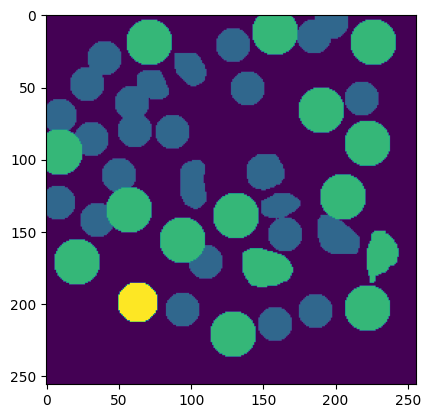

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 182.5ms
Speed: 7.9ms preprocess, 182.5ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 104, 70, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 185.0ms
Speed: 6.1ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(220, 175, 243, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 183.9ms
Speed: 6.8ms preprocess, 183.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(163, 114, 184, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 183.4ms
Speed: 7.3ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(132, 8, 160, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 183.1ms
Speed: 8.4ms preprocess, 183.1ms inference, 8.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 63, 255, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 167, 93, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 186.1ms
Speed: 6.5ms preprocess, 186.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 235, 58, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.1ms
Speed: 10.3ms preprocess, 184.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 100, 215, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 188.6ms
Speed: 6.7ms preprocess, 188.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 91, 92, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 186.0ms
Speed: 9.3ms preprocess, 186.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 78, 203, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 183.7ms
Speed: 6.5ms preprocess, 183.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 0, 93, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 182.8ms
Speed: 6.6ms preprocess, 182.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 10, 52, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 181.3ms
Speed: 8.9ms preprocess, 181.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 149, 119, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 189, 91, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 120, 45, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 183.7ms
Speed: 6.4ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 100, 122, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 185.6ms
Speed: 6.8ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 92, 141, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 39, 158, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 181.5ms
Speed: 6.5ms preprocess, 181.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 191, 221, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(10, 30, 39, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 189.2ms
Speed: 6.4ms preprocess, 189.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(197, 46, 228, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 88, 31, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 51, 71, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(16, 168, 48, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 186.6ms
Speed: 6.6ms preprocess, 186.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 198, 42, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 3.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 128, 254, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 182.7ms
Speed: 7.0ms preprocess, 182.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(197, 73, 228, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 152, 202, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 188.6ms
Speed: 6.4ms preprocess, 188.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 30, 74, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 184.6ms
Speed: 6.1ms preprocess, 184.6ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 42, 115, 69)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3068.png: 1024x1024 26 objects, 183.9ms
Speed: 7.4ms preprocess, 183.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(130, 69, 143, 85)
FINAL MASK!!!


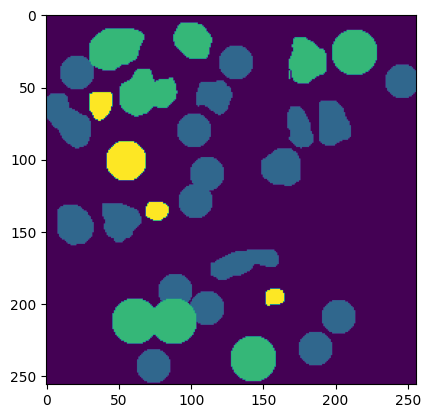

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 183.3ms
Speed: 6.7ms preprocess, 183.3ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 84, 181, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 21, 21, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 212, 80, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 156, 96, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 105, 165, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 188.7ms
Speed: 6.2ms preprocess, 188.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 143, 181, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  968.0 bbox 256
fixed shape for a cell
(33, 113, 56, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 186.4ms
Speed: 7.8ms preprocess, 186.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(84, 102, 107, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 137, 26, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(102, 54, 125, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 183.4ms
Speed: 9.0ms preprocess, 183.4ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 112, 19, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 55, 105, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 16, 146, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 185.3ms
Speed: 8.6ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 151, 57, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 184.7ms
Speed: 9.3ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 177, 100, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(96, 121, 130, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 205, 149, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 156, 156, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1866.0 bbox 576
fixed shape for a cell
(17, 51, 48, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 184.8ms
Speed: 6.7ms preprocess, 184.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1866.0 bbox 576
fixed shape for a cell
(33, 31, 64, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 188.0ms
Speed: 6.4ms preprocess, 188.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 6, 89, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3070.png: 1024x1024 8 objects, 183.8ms
Speed: 8.7ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(118, 66, 145, 93)
FINAL MASK!!!


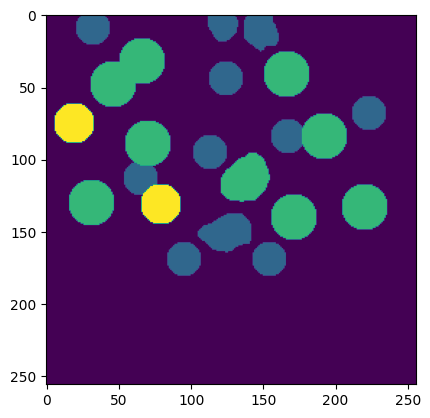

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 211, 176, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 186.9ms
Speed: 10.0ms preprocess, 186.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 55, 148, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.5ms
Speed: 6.4ms preprocess, 181.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 146, 30, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.6ms
Speed: 6.7ms preprocess, 181.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 103, 137, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.7ms
Speed: 6.8ms preprocess, 181.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 213, 111, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 188.2ms
Speed: 6.1ms preprocess, 188.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 172, 130, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 183.7ms
Speed: 8.4ms preprocess, 183.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 121, 161, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 186.5ms
Speed: 6.1ms preprocess, 186.5ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 180, 158, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 120, 63, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.3ms
Speed: 9.2ms preprocess, 182.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 32, 92, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 184.0ms
Speed: 11.8ms preprocess, 184.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 55, 114, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 92, 98, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.4ms
Speed: 6.9ms preprocess, 182.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 183, 103, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 185.3ms
Speed: 6.7ms preprocess, 185.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(233, 112, 256, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(193, 116, 216, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.1ms
Speed: 6.6ms preprocess, 182.1ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 88, 203, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.4ms
Speed: 6.5ms preprocess, 181.4ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 2, 101, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 185.8ms
Speed: 10.6ms preprocess, 185.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1312.0 bbox 256
fixed shape for a cell
(229, 178, 252, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 183.0ms
Speed: 6.1ms preprocess, 183.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 204, 71, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.1ms
Speed: 7.3ms preprocess, 181.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 74, 178, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 32, 166, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 184.6ms
Speed: 6.6ms preprocess, 184.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 102, 178, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 186.8ms
Speed: 6.0ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 0, 64, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 183.0ms
Speed: 6.0ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 8, 137, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 186.9ms
Speed: 6.5ms preprocess, 186.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 124, 144, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 185.1ms
Speed: 6.8ms preprocess, 185.1ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 74, 134, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 8.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 204, 249, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.4ms
Speed: 6.8ms preprocess, 181.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 224, 229, 255)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.0ms
Speed: 6.5ms preprocess, 182.0ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 162, 81, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 184.7ms
Speed: 6.1ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(8, 179, 39, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 76, 42, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 52, 70, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 181.2ms
Speed: 7.7ms preprocess, 181.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 0, 26, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(227, 147, 256, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 187.3ms
Speed: 6.4ms preprocess, 187.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(175, 162, 202, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3080.png: 1024x1024 7 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(163, 47, 190, 74)
FINAL MASK!!!


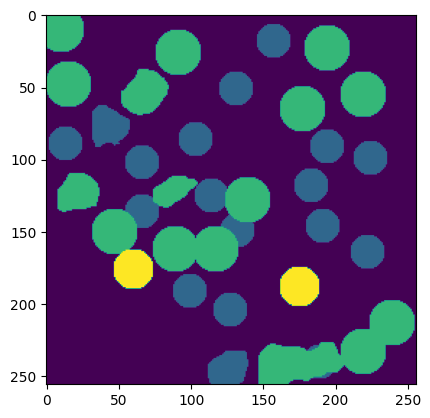

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 181.6ms
Speed: 6.5ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(179, 206, 202, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 184.8ms
Speed: 10.9ms preprocess, 184.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 84, 87, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 186.0ms
Speed: 7.3ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 111, 88, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 181.5ms
Speed: 6.5ms preprocess, 181.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 101, 117, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 187.2ms
Speed: 6.6ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 80, 113, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 55, 130, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 186.1ms
Speed: 6.6ms preprocess, 186.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 139, 195, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 185.5ms
Speed: 6.6ms preprocess, 185.5ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(166, 225, 189, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 157, 116, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(199, 40, 222, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 80, 144, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 182.8ms
Speed: 9.0ms preprocess, 182.8ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 63, 246, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(217, 146, 240, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 184.1ms
Speed: 6.1ms preprocess, 184.1ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 61, 204, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 121, 144, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 87, 254, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 184.9ms
Speed: 7.9ms preprocess, 184.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 52, 179, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(234, 192, 256, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 185.3ms
Speed: 6.5ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 100, 183, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 181.7ms
Speed: 6.1ms preprocess, 181.7ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 150, 166, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 184.2ms
Speed: 9.3ms preprocess, 184.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 171, 232, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 187.4ms
Speed: 6.6ms preprocess, 187.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 9, 179, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3090.png: 1024x1024 5 objects, 183.1ms
Speed: 9.1ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(204, 99, 235, 130)
FINAL MASK!!!


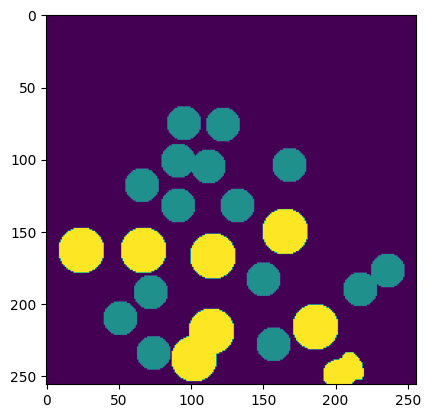

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 185.2ms
Speed: 11.5ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 0, 78, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 83, 75, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 184.7ms
Speed: 9.3ms preprocess, 184.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 208, 17, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 186.1ms
Speed: 7.3ms preprocess, 186.1ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(197, 37, 220, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 184.7ms
Speed: 10.0ms preprocess, 184.7ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 0, 148, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 182.8ms
Speed: 9.5ms preprocess, 182.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 120, 188, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 128, 161, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 88, 194, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 181.4ms
Speed: 6.3ms preprocess, 181.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 0, 110, 17)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 180.3ms
Speed: 10.9ms preprocess, 180.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 85, 146, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 188.4ms
Speed: 6.1ms preprocess, 188.4ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 34, 113, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 79, 19, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 197, 98, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 183.6ms
Speed: 6.9ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  3290.0 bbox 576
fixed shape for a cell
(201, 132, 232, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 180.3ms
Speed: 10.4ms preprocess, 180.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 218, 92, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 211, 48, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 186.2ms
Speed: 8.2ms preprocess, 186.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 17, 195, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 183.5ms
Speed: 6.3ms preprocess, 183.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(108, 226, 139, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 97, 55, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 184.1ms
Speed: 8.0ms preprocess, 184.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 144, 79, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 123, 103, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 182.6ms
Speed: 6.6ms preprocess, 182.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 170, 173, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 186.9ms
Speed: 6.7ms preprocess, 186.9ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(30, 25, 61, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 189.4ms
Speed: 6.4ms preprocess, 189.4ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 31, 158, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 185.3ms
Speed: 6.5ms preprocess, 185.3ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 58, 184, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 149, 196, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 165, 140, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 184.6ms
Speed: 6.6ms preprocess, 184.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 196, 180, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 182.0ms
Speed: 6.3ms preprocess, 182.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 170, 35, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 187.5ms
Speed: 6.5ms preprocess, 187.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 51, 42, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  3290.0 bbox 576
fixed shape for a cell
(216, 108, 247, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3092.png: 1024x1024 13 objects, 184.7ms
Speed: 9.5ms preprocess, 184.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(69, 109, 96, 136)
FINAL MASK!!!


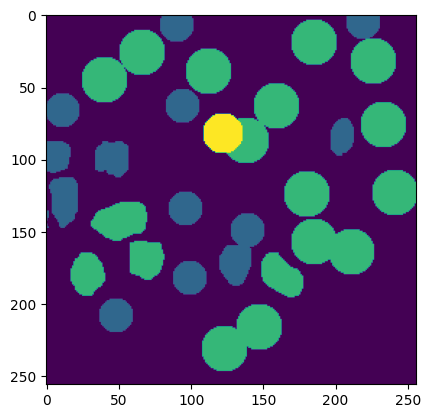

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.9ms
Speed: 8.0ms preprocess, 185.9ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 51, 49, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.8ms
Speed: 8.1ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 89, 60, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.0ms
Speed: 8.6ms preprocess, 185.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 182, 160, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.9ms
Speed: 8.0ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(102, 171, 125, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 184.8ms
Speed: 10.2ms preprocess, 184.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 205, 114, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 220, 163, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.8ms
Speed: 7.5ms preprocess, 186.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 230, 132, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 184.1ms
Speed: 6.5ms preprocess, 184.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 123, 168, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 182.2ms
Speed: 8.1ms preprocess, 182.2ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 215, 70, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 181.9ms
Speed: 8.9ms preprocess, 181.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(183, 134, 206, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 99, 133, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 128, 142, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 178, 48, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 182.0ms
Speed: 6.3ms preprocess, 182.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 163, 63, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 142, 49, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 147, 30, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.8ms
Speed: 6.0ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(22, 200, 47, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 187.3ms
Speed: 6.6ms preprocess, 187.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 150, 190, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 187.5ms
Speed: 6.2ms preprocess, 187.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 26, 80, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 177, 14, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 0, 139, 16)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 93, 88, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  824.0 bbox 256
fixed shape for a cell
(174, 57, 197, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 184.8ms
Speed: 8.0ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(176, 213, 199, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 60, 115, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(211, 151, 232, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 188.2ms
Speed: 6.2ms preprocess, 188.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(217, 99, 240, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.9ms
Speed: 6.3ms preprocess, 186.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(229, 141, 248, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 182.6ms
Speed: 6.8ms preprocess, 182.6ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(220, 54, 244, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(239, 24, 256, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 30, 229, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 3.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(96, 16, 119, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.7ms
Speed: 6.8ms preprocess, 185.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(229, 73, 254, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.3ms
Speed: 7.8ms preprocess, 185.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 78, 189, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 182.0ms
Speed: 6.5ms preprocess, 182.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 58, 141, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 183.8ms
Speed: 9.2ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(206, 207, 243, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 181.9ms
Speed: 6.3ms preprocess, 181.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 183, 81, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 189.6ms
Speed: 6.1ms preprocess, 189.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 168, 105, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.4ms
Speed: 8.0ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 27, 161, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 123, 31, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 181.6ms
Speed: 6.6ms preprocess, 181.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(136, 93, 161, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3102.png: 1024x1024 24 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(56, 125, 87, 156)
FINAL MASK!!!


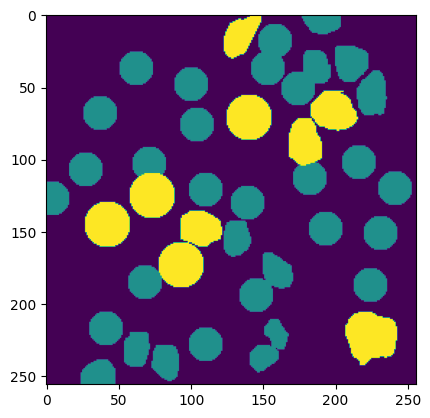

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 13, 60, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 20, 151, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 182.1ms
Speed: 7.3ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 16, 195, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 139, 229, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 228, 195, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 220, 165, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 207, 183, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 187.2ms
Speed: 6.1ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 185, 186, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 94, 158, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 230, 121, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 212, 108, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 186, 41, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 190, 87, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 9.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 0, 162, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 185.0ms
Speed: 8.0ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 78, 58, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(68, 17, 91, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 181.9ms
Speed: 6.5ms preprocess, 181.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 43, 74, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 71, 85, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 188.4ms
Speed: 6.2ms preprocess, 188.4ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 157, 153, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 202, 148, 222)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 157, 153, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 180.9ms
Speed: 12.9ms preprocess, 180.9ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  870.0 bbox 256
fixed shape for a cell
(100, 175, 123, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 187.2ms
Speed: 8.8ms preprocess, 187.2ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 138, 108, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 189.8ms
Speed: 6.2ms preprocess, 189.8ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(102, 20, 125, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 186.1ms
Speed: 6.8ms preprocess, 186.1ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 131, 136, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 195, 226, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 185.3ms
Speed: 6.6ms preprocess, 185.3ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(220, 165, 251, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 184.1ms
Speed: 9.0ms preprocess, 184.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(222, 104, 253, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(186, 112, 217, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 188.1ms
Speed: 6.1ms preprocess, 188.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 78, 199, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 185.8ms
Speed: 12.0ms preprocess, 185.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(188, 46, 219, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 187.3ms
Speed: 6.9ms preprocess, 187.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(169, 155, 200, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 186.8ms
Speed: 8.5ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 118, 193, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 47, 168, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 187.2ms
Speed: 6.0ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(95, 87, 132, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3104.png: 1024x1024 15 objects, 186.8ms
Speed: 9.9ms preprocess, 186.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(58, 155, 92, 183)
FINAL MASK!!!


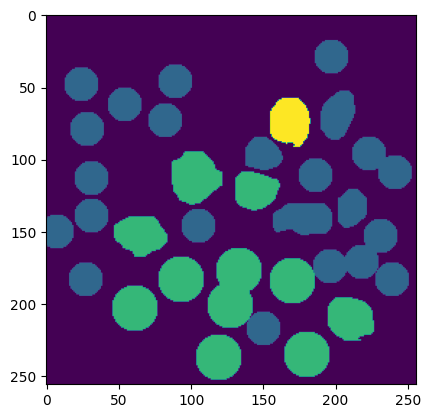

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(227, 102, 246, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 180.9ms
Speed: 9.1ms preprocess, 180.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 199, 33, 222)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(212, 74, 234, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 186.1ms
Speed: 5.7ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(202, 96, 225, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 183.6ms
Speed: 6.6ms preprocess, 183.6ms inference, 7.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(212, 43, 235, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 185.0ms
Speed: 8.4ms preprocess, 185.0ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 53, 255, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(210, 6, 233, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 180.8ms
Speed: 6.4ms preprocess, 180.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(220, 129, 243, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 184.8ms
Speed: 9.2ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  890.0 bbox 256
fixed shape for a cell
(166, 61, 189, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 183.1ms
Speed: 6.5ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 166, 177, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 208, 137, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 209, 84, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 185.8ms
Speed: 6.6ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 225, 85, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 186.2ms
Speed: 6.6ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 162, 52, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 184.8ms
Speed: 11.1ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 171, 24, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 183.3ms
Speed: 8.7ms preprocess, 183.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 81, 150, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 183.9ms
Speed: 6.3ms preprocess, 183.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 145, 221, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 58, 17, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 148, 142, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 184.7ms
Speed: 6.9ms preprocess, 184.7ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 125, 123, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 182.6ms
Speed: 6.8ms preprocess, 182.6ms inference, 3.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 112, 95, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 186.5ms
Speed: 7.1ms preprocess, 186.5ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(60, 143, 83, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 78, 104, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 186.7ms
Speed: 6.2ms preprocess, 186.7ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 114, 71, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 106, 43, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 187.3ms
Speed: 7.0ms preprocess, 187.3ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 122, 187, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 185.2ms
Speed: 8.5ms preprocess, 185.2ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 0, 110, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 184.2ms
Speed: 8.6ms preprocess, 184.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 13, 72, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 185.2ms
Speed: 8.7ms preprocess, 185.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 45, 35, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 185.2ms
Speed: 6.1ms preprocess, 185.2ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(74, 172, 105, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 182.9ms
Speed: 7.4ms preprocess, 182.9ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 221, 47, 252)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 181.3ms
Speed: 6.7ms preprocess, 181.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 50, 135, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 98, 208, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 190.5ms
Speed: 6.6ms preprocess, 190.5ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(63, 34, 94, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 9.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 0, 187, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 188.6ms
Speed: 10.5ms preprocess, 188.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(178, 17, 208, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 187.2ms
Speed: 6.7ms preprocess, 187.2ms inference, 7.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 89, 137, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 50, 69, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3106.png: 1024x1024 7 objects, 184.8ms
Speed: 7.7ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(96, 19, 123, 46)
FINAL MASK!!!


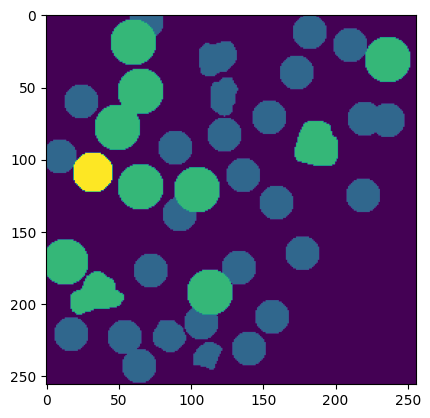

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 186.3ms
Speed: 7.3ms preprocess, 186.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 171, 62, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 182.8ms
Speed: 8.3ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 84, 168, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(74, 238, 100, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 215, 82, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 184.0ms
Speed: 6.6ms preprocess, 184.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 234, 65, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 196, 63, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 185.6ms
Speed: 6.7ms preprocess, 185.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 110, 146, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 184.9ms
Speed: 6.6ms preprocess, 184.9ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(64, 129, 89, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 187.2ms
Speed: 7.1ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 230, 138, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 141, 60, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 4, 42, 27)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 0, 97, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 184.5ms
Speed: 6.4ms preprocess, 184.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 8, 80, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 152, 115, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 104, 71, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 129, 33, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 183.4ms
Speed: 6.5ms preprocess, 183.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 39, 96, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 181.8ms
Speed: 7.4ms preprocess, 181.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 72, 189, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 186.2ms
Speed: 6.7ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 176, 37, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 187.3ms
Speed: 6.1ms preprocess, 187.3ms inference, 3.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 166, 206, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 3.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 126, 143, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 221, 27, 252)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 198, 180, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 116, 217, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 39, 49, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(84, 99, 115, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 186.8ms
Speed: 7.0ms preprocess, 186.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 181, 142, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 185.2ms
Speed: 7.0ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 77, 119, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 182, 100, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0005__idx-3114.png: 1024x1024 14 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(93, 211, 113, 233)
FINAL MASK!!!


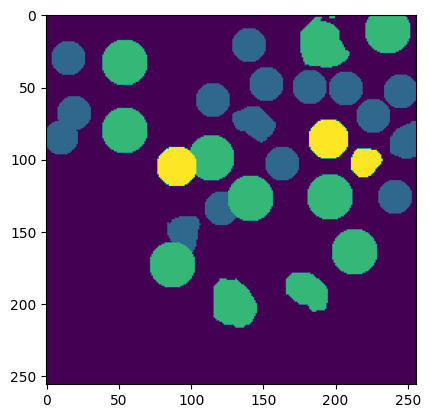

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 168, 53, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.6ms
Speed: 8.2ms preprocess, 184.6ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(227, 33, 250, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 187.4ms
Speed: 10.0ms preprocess, 187.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 58, 241, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.5ms
Speed: 7.1ms preprocess, 184.5ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 214, 62, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.2ms
Speed: 6.6ms preprocess, 184.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 131, 203, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 107, 218, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 0, 106, 20)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 188.7ms
Speed: 6.6ms preprocess, 188.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 14, 137, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 187.0ms
Speed: 6.9ms preprocess, 187.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 14, 193, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 186.2ms
Speed: 6.4ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(103, 147, 126, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 187.5ms
Speed: 6.3ms preprocess, 187.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 141, 146, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 150, 172, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 169, 78, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 104, 141, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 186.5ms
Speed: 6.6ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 25, 29, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.6ms
Speed: 8.2ms preprocess, 184.6ms inference, 3.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(161, 35, 184, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 124, 54, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 101, 112, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 183.2ms
Speed: 6.7ms preprocess, 183.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 52, 114, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 22, 89, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 188.1ms
Speed: 6.1ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1242.0 bbox 256
fixed shape for a cell
(114, 67, 137, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 188.1ms
Speed: 6.4ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 0, 71, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 186.8ms
Speed: 7.0ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(25, 0, 48, 15)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 65, 82, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(214, 132, 245, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 180, 186, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 70, 195, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 221, 23, 252)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 181.1ms
Speed: 8.3ms preprocess, 181.1ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 206, 218, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 183.7ms
Speed: 9.3ms preprocess, 183.7ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 15, 231, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 180.7ms
Speed: 8.2ms preprocess, 180.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 162, 216, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 188.1ms
Speed: 7.7ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(11, 79, 55, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 186.9ms
Speed: 7.0ms preprocess, 186.9ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(82, 181, 110, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3002.png: 1024x1024 11 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 8.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(71, 161, 98, 188)
FINAL MASK!!!


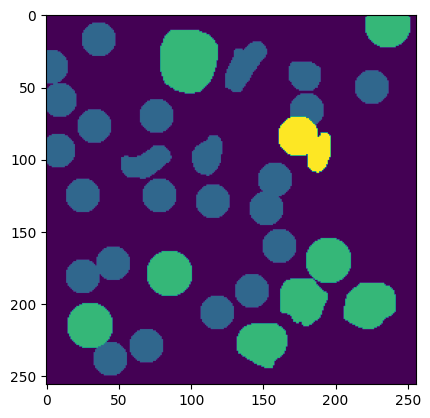

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1381.0 bbox 256
fixed shape for a cell
(178, 186, 201, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 8.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 65, 19, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 187.3ms
Speed: 7.9ms preprocess, 187.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  4924.0 bbox 256
fixed shape for a cell
(11, 147, 34, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 183.6ms
Speed: 18.0ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  983.0 bbox 256
fixed shape for a cell
(45, 180, 68, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 185.2ms
Speed: 10.0ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  871.0 bbox 256
fixed shape for a cell
(65, 207, 88, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  871.0 bbox 256
fixed shape for a cell
(77, 192, 100, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 184.6ms
Speed: 6.9ms preprocess, 184.6ms inference, 8.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 218, 138, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 184.5ms
Speed: 6.4ms preprocess, 184.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 9, 208, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 0, 150, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 187.6ms
Speed: 7.7ms preprocess, 187.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 5, 106, 28)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 182.6ms
Speed: 6.5ms preprocess, 182.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2063.0 bbox 256
fixed shape for a cell
(34, 42, 57, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  971.0 bbox 256
fixed shape for a cell
(79, 73, 102, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 183.7ms
Speed: 6.1ms preprocess, 183.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 195, 159, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 182.9ms
Speed: 7.8ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 103, 137, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 187.0ms
Speed: 11.2ms preprocess, 187.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 141, 165, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 102, 170, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 183.3ms
Speed: 8.4ms preprocess, 183.3ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 99, 203, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  852.0 bbox 256
fixed shape for a cell
(224, 17, 247, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 186.3ms
Speed: 6.6ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 238, 171, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 187.3ms
Speed: 6.9ms preprocess, 187.3ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(188, 132, 219, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(228, 151, 256, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 196, 28, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 186.7ms
Speed: 6.7ms preprocess, 186.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  4924.0 bbox 576
fixed shape for a cell
(41, 123, 72, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(83, 162, 114, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 190.2ms
Speed: 6.4ms preprocess, 190.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(225, 194, 256, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(209, 101, 251, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 187.4ms
Speed: 6.4ms preprocess, 187.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 55, 227, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  4924.0 bbox 576
fixed shape for a cell
(37, 89, 68, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3003.png: 1024x1024 18 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(119, 25, 151, 59)
FINAL MASK!!!


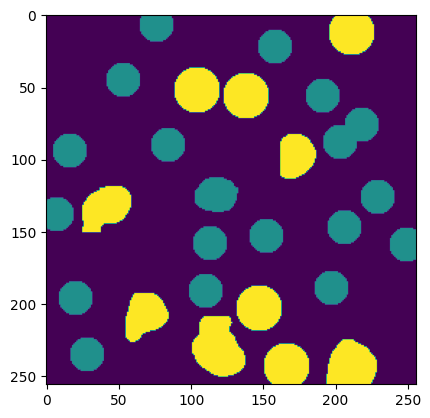

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  813.0 bbox 256
fixed shape for a cell
(5, 227, 28, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 187.0ms
Speed: 6.2ms preprocess, 187.0ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(92, 95, 115, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 9.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 40, 142, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 184.4ms
Speed: 8.8ms preprocess, 184.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1326.0 bbox 256
fixed shape for a cell
(89, 45, 112, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 187.1ms
Speed: 6.1ms preprocess, 187.1ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1241.0 bbox 256
fixed shape for a cell
(101, 13, 124, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 187.4ms
Speed: 7.9ms preprocess, 187.4ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 23, 23, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 187, 69, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1157.0 bbox 256
fixed shape for a cell
(63, 181, 86, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 99, 92, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 186.2ms
Speed: 7.7ms preprocess, 186.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1157.0 bbox 256
fixed shape for a cell
(65, 150, 88, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(2, 157, 25, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(2, 68, 25, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 183.7ms
Speed: 8.7ms preprocess, 183.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(14, 113, 35, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 78, 46, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(45, 67, 68, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 182.6ms
Speed: 7.8ms preprocess, 182.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 59, 195, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 136, 16, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 9.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 152, 116, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 185.3ms
Speed: 9.3ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 226, 196, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 186.4ms
Speed: 6.6ms preprocess, 186.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 182, 208, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 143, 193, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 182.8ms
Speed: 7.3ms preprocess, 182.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 198, 123, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 125, 75, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 186.2ms
Speed: 6.9ms preprocess, 186.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(194, 134, 225, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 184.2ms
Speed: 9.4ms preprocess, 184.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(132, 99, 159, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 86, 208, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 182.4ms
Speed: 7.6ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 30, 168, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3016.png: 1024x1024 18 objects, 183.8ms
Speed: 7.9ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(71, 215, 86, 231)
FINAL MASK!!!


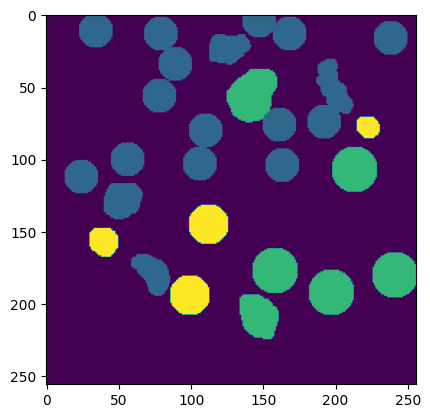

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 154, 212, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.3ms
Speed: 9.6ms preprocess, 184.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 58, 174, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 183.1ms
Speed: 6.1ms preprocess, 183.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(34, 193, 57, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.3ms
Speed: 6.3ms preprocess, 184.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 218, 27, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 181.1ms
Speed: 6.6ms preprocess, 181.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 170, 122, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 182.0ms
Speed: 7.0ms preprocess, 182.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(236, 0, 256, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 183.0ms
Speed: 7.6ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(201, 0, 225, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 185.9ms
Speed: 8.1ms preprocess, 185.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 9, 15, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(118, 132, 141, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 183.9ms
Speed: 11.5ms preprocess, 183.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(136, 86, 159, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 186.2ms
Speed: 8.1ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 131, 36, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.4ms
Speed: 10.8ms preprocess, 184.4ms inference, 9.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 67, 200, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 182.8ms
Speed: 6.1ms preprocess, 182.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 239, 136, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.6ms
Speed: 9.3ms preprocess, 184.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(239, 159, 256, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 182.2ms
Speed: 6.1ms preprocess, 182.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(222, 111, 245, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.7ms
Speed: 11.4ms preprocess, 184.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(105, 0, 128, 17)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 187.9ms
Speed: 7.2ms preprocess, 187.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(192, 210, 223, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 228, 254, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 183.5ms
Speed: 6.0ms preprocess, 183.5ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 83, 25, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.8ms
Speed: 8.1ms preprocess, 184.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(159, 213, 190, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.1ms
Speed: 10.5ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(105, 193, 155, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(3, 185, 34, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(217, 64, 242, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 182.3ms
Speed: 9.5ms preprocess, 182.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(201, 33, 238, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 0, 164, 28)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 185.6ms
Speed: 7.4ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 12, 111, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 186.1ms
Speed: 6.5ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 162, 182, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(30, 68, 61, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 186.6ms
Speed: 6.0ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 40, 163, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 7, 84, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.5ms
Speed: 8.8ms preprocess, 184.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 62, 111, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 209, 90, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.1ms
Speed: 6.7ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(182, 107, 213, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 184.9ms
Speed: 9.2ms preprocess, 184.9ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(20, 30, 47, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 181.7ms
Speed: 8.4ms preprocess, 181.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(242, 188, 256, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 183.0ms
Speed: 10.7ms preprocess, 183.0ms inference, 10.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 166, 82, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3106.png: 1024x1024 15 objects, 185.4ms
Speed: 6.7ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(98, 100, 124, 117)
FINAL MASK!!!


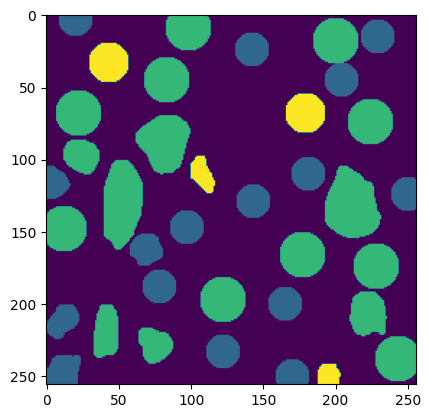

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 184.6ms
Speed: 6.4ms preprocess, 184.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 35, 106, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(169, 156, 192, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 184.6ms
Speed: 7.2ms preprocess, 184.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 80, 174, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 9, 139, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.7ms
Speed: 6.7ms preprocess, 185.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 69, 104, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.2ms
Speed: 7.0ms preprocess, 185.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 75, 21, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.8ms
Speed: 7.6ms preprocess, 185.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 209, 40, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 183.1ms
Speed: 8.1ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 176, 62, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 187.3ms
Speed: 6.0ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 211, 100, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.0ms
Speed: 6.0ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 224, 199, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.0ms
Speed: 9.3ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 226, 161, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.9ms
Speed: 6.1ms preprocess, 185.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  951.0 bbox 256
fixed shape for a cell
(134, 176, 157, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 181.5ms
Speed: 8.0ms preprocess, 181.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(221, 78, 244, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 180.4ms
Speed: 7.1ms preprocess, 180.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  898.0 bbox 256
fixed shape for a cell
(121, 134, 144, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.8ms
Speed: 7.5ms preprocess, 185.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 49, 253, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 188.0ms
Speed: 6.6ms preprocess, 188.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 208, 66, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.5ms
Speed: 7.4ms preprocess, 185.5ms inference, 8.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(205, 165, 228, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.1ms
Speed: 7.6ms preprocess, 185.1ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(215, 204, 238, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 110, 134, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(117, 214, 140, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 188.5ms
Speed: 6.2ms preprocess, 188.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 24, 56, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 181.7ms
Speed: 6.4ms preprocess, 181.7ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 142, 111, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 180.7ms
Speed: 6.4ms preprocess, 180.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 168, 155, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 208, 29, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(119, 67, 148, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 183.7ms
Speed: 8.9ms preprocess, 183.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(36, 56, 67, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 180.8ms
Speed: 8.6ms preprocess, 180.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 135, 36, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 186.7ms
Speed: 6.7ms preprocess, 186.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(161, 235, 192, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 185.0ms
Speed: 8.5ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 185, 96, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 108, 107, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3148.png: 1024x1024 10 objects, 181.0ms
Speed: 8.8ms preprocess, 181.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(153, 113, 180, 140)
FINAL MASK!!!


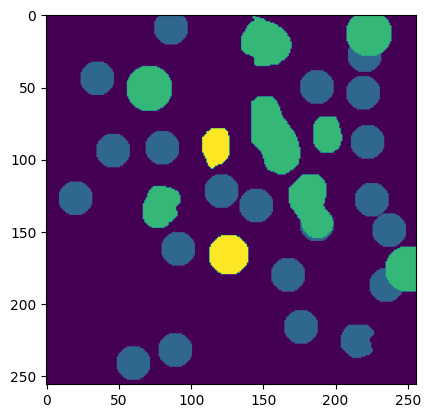

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 183.3ms
Speed: 7.5ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 18, 71, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 182.3ms
Speed: 6.5ms preprocess, 182.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 89, 149, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 182.7ms
Speed: 6.5ms preprocess, 182.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 190, 176, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 182.3ms
Speed: 6.5ms preprocess, 182.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 166, 111, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 190.9ms
Speed: 6.0ms preprocess, 190.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 216, 29, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 181.6ms
Speed: 11.3ms preprocess, 181.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1212.0 bbox 256
fixed shape for a cell
(2, 169, 25, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.2ms
Speed: 7.6ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 65, 39, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 187.0ms
Speed: 9.0ms preprocess, 187.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(41, 46, 67, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 6, 98, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 181.6ms
Speed: 6.3ms preprocess, 181.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 60, 255, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 180.5ms
Speed: 8.7ms preprocess, 180.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 195, 230, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 186.7ms
Speed: 8.5ms preprocess, 186.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 214, 230, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.2ms
Speed: 12.1ms preprocess, 185.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 230, 130, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 188.4ms
Speed: 7.1ms preprocess, 188.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1760.0 bbox 256
fixed shape for a cell
(136, 31, 159, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 184.6ms
Speed: 6.0ms preprocess, 184.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(196, 95, 219, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 183.2ms
Speed: 9.2ms preprocess, 183.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 71, 156, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 180.5ms
Speed: 10.1ms preprocess, 180.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 80, 192, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 187.4ms
Speed: 6.1ms preprocess, 187.4ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 159, 256, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 197, 97, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(210, 146, 241, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 184.0ms
Speed: 10.2ms preprocess, 184.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(134, 159, 183, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 183.6ms
Speed: 6.4ms preprocess, 183.6ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 113, 62, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 183.7ms
Speed: 6.8ms preprocess, 183.7ms inference, 10.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 134, 182, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1760.0 bbox 576
fixed shape for a cell
(158, 26, 189, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.9ms
Speed: 6.7ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 152, 89, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 21, 125, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 181.5ms
Speed: 6.3ms preprocess, 181.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 44, 98, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 230, 171, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 188.6ms
Speed: 6.5ms preprocess, 188.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(197, 19, 237, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 135, 23, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 187.0ms
Speed: 10.3ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(103, 202, 125, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 141, 132, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 183.5ms
Speed: 8.2ms preprocess, 183.5ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(217, 80, 244, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 81, 77, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 81, 125, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 0, 65, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3160.png: 1024x1024 14 objects, 186.2ms
Speed: 7.8ms preprocess, 186.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(7, 0, 34, 27)
FINAL MASK!!!


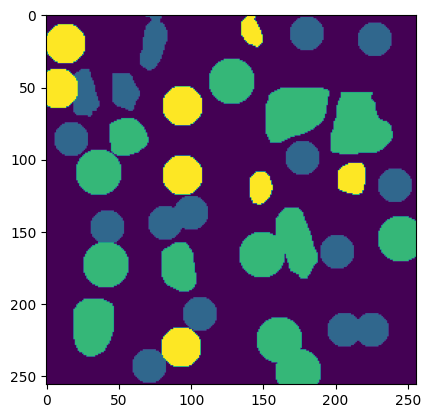

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 191, 230, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 57, 163, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 182.4ms
Speed: 5.9ms preprocess, 182.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1022.0 bbox 256
fixed shape for a cell
(56, 2, 79, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 19, 21, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 188.7ms
Speed: 6.2ms preprocess, 188.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(182, 207, 205, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 230, 90, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 193, 21, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 188.6ms
Speed: 6.2ms preprocess, 188.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(100, 109, 129, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.4ms
Speed: 9.6ms preprocess, 185.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 127, 70, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 184.7ms
Speed: 10.1ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(22, 100, 53, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 186.9ms
Speed: 8.0ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  924.0 bbox 256
fixed shape for a cell
(67, 87, 90, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 9, 162, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 93, 194, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.9ms
Speed: 6.5ms preprocess, 185.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 97, 165, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 187.4ms
Speed: 10.1ms preprocess, 187.4ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 135, 30, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 52, 75, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 184.3ms
Speed: 6.2ms preprocess, 184.3ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(43, 20, 65, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 183.2ms
Speed: 6.5ms preprocess, 183.2ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(170, 39, 201, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 182.6ms
Speed: 8.0ms preprocess, 182.6ms inference, 8.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 74, 141, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 184.1ms
Speed: 6.6ms preprocess, 184.1ms inference, 11.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(193, 118, 224, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.6ms
Speed: 7.8ms preprocess, 185.6ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 213, 157, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 176, 184, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 180.6ms
Speed: 8.4ms preprocess, 180.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 128, 147, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 194, 107, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.7ms
Speed: 7.1ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 136, 193, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 27, 132, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 157, 105, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 182.6ms
Speed: 6.9ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 171, 143, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 149, 93, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0006__idx-3179.png: 1024x1024 18 objects, 186.4ms
Speed: 7.9ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(77, 52, 92, 76)
FINAL MASK!!!


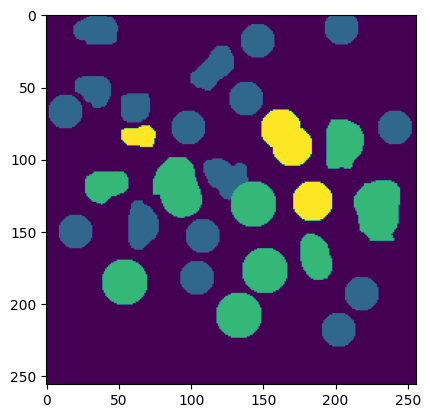

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 185.1ms
Speed: 6.3ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 98, 19, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 185.9ms
Speed: 8.5ms preprocess, 185.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1131.0 bbox 256
fixed shape for a cell
(94, 41, 117, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 30, 38, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1086.0 bbox 256
fixed shape for a cell
(55, 3, 78, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 181.8ms
Speed: 9.7ms preprocess, 181.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 0, 114, 16)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 127, 33, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 180.6ms
Speed: 6.2ms preprocess, 180.6ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 86, 207, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 190, 132, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 185.2ms
Speed: 8.4ms preprocess, 185.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1208.0 bbox 256
fixed shape for a cell
(112, 217, 135, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 185.6ms
Speed: 7.8ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 171, 178, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 184.4ms
Speed: 6.5ms preprocess, 184.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 132, 177, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 181.3ms
Speed: 7.1ms preprocess, 181.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 167, 137, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 182.8ms
Speed: 6.9ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 153, 122, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 188.3ms
Speed: 6.2ms preprocess, 188.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 68, 98, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 187.7ms
Speed: 10.3ms preprocess, 187.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 44, 76, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 126, 72, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 186.7ms
Speed: 6.3ms preprocess, 186.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1305.0 bbox 256
fixed shape for a cell
(25, 89, 48, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 183.2ms
Speed: 6.0ms preprocess, 183.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  958.0 bbox 256
fixed shape for a cell
(231, 3, 254, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 190.7ms
Speed: 10.8ms preprocess, 190.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1038.0 bbox 256
fixed shape for a cell
(215, 42, 238, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 185.6ms
Speed: 10.4ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 228, 191, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 186.4ms
Speed: 6.1ms preprocess, 186.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(194, 205, 217, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 205, 246, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 183.6ms
Speed: 13.3ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 0, 218, 42)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 187.3ms
Speed: 6.1ms preprocess, 187.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 0, 28, 27)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 184.7ms
Speed: 6.4ms preprocess, 184.7ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 197, 176, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 181.5ms
Speed: 7.3ms preprocess, 181.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 215, 73, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 149, 216, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 182.9ms
Speed: 13.1ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 80, 172, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 180.9ms
Speed: 6.9ms preprocess, 180.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 104, 217, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 183.1ms
Speed: 8.0ms preprocess, 183.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(192, 54, 212, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 94, 120, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3016.png: 1024x1024 24 objects, 187.0ms
Speed: 8.4ms preprocess, 187.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(192, 54, 212, 80)
FINAL MASK!!!


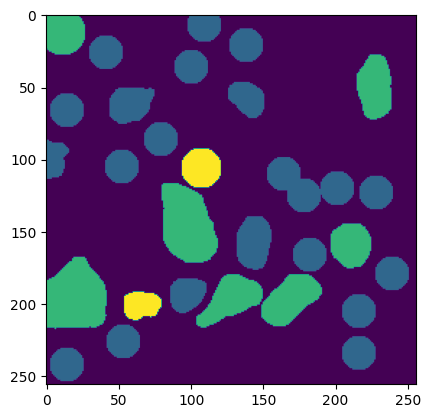

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 39, 215, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 185.4ms
Speed: 7.4ms preprocess, 185.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 50, 52, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 185.6ms
Speed: 7.2ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 197, 77, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 181.5ms
Speed: 6.2ms preprocess, 181.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1111.0 bbox 256
fixed shape for a cell
(223, 131, 246, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(196, 168, 219, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 2, 106, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 184.5ms
Speed: 6.6ms preprocess, 184.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(227, 79, 250, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 206, 100, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 182.9ms
Speed: 6.2ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(173, 80, 196, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 184.7ms
Speed: 8.7ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(117, 11, 140, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 185.2ms
Speed: 7.2ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(74, 67, 97, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 186.5ms
Speed: 8.8ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 207, 59, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 182.7ms
Speed: 6.5ms preprocess, 182.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(76, 173, 123, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 183.7ms
Speed: 6.9ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(6, 106, 49, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 131, 175, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 215, 202, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(213, 213, 244, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 187.1ms
Speed: 6.8ms preprocess, 187.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 17, 182, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 187.5ms
Speed: 6.8ms preprocess, 187.5ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(84, 108, 115, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 183.9ms
Speed: 10.3ms preprocess, 183.9ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(81, 148, 106, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 187.5ms
Speed: 6.3ms preprocess, 187.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 213, 165, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3263.png: 1024x1024 7 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(106, 60, 133, 87)
FINAL MASK!!!


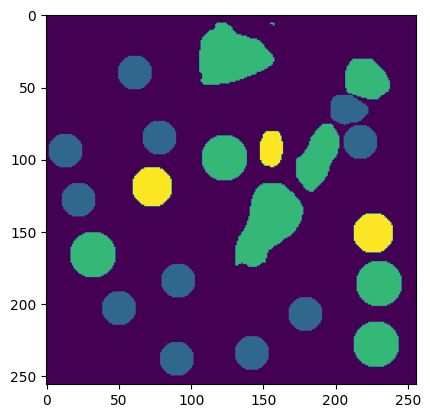

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 185.2ms
Speed: 6.6ms preprocess, 185.2ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(71, 0, 94, 19)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  826.0 bbox 256
fixed shape for a cell
(149, 38, 172, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(163, 80, 186, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 186.4ms
Speed: 6.4ms preprocess, 186.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(136, 167, 159, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 182.8ms
Speed: 7.6ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(113, 207, 136, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 217, 26, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 184.0ms
Speed: 6.7ms preprocess, 184.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1362.0 bbox 256
fixed shape for a cell
(213, 91, 236, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 181.8ms
Speed: 6.4ms preprocess, 181.8ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 0, 66, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 182.3ms
Speed: 5.9ms preprocess, 182.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(198, 17, 221, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 185.3ms
Speed: 7.1ms preprocess, 185.3ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(100, 80, 123, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(19, 81, 42, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(78, 45, 101, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1189.0 bbox 256
fixed shape for a cell
(38, 103, 61, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 183.1ms
Speed: 6.6ms preprocess, 183.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(76, 210, 107, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 187.5ms
Speed: 6.8ms preprocess, 187.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 148, 81, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 127, 122, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 187.8ms
Speed: 6.2ms preprocess, 187.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 29, 66, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 187.7ms
Speed: 6.3ms preprocess, 187.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(91, 0, 118, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 183.7ms
Speed: 8.1ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 155, 41, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 185.4ms
Speed: 6.7ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 18, 22, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3294.png: 1024x1024 10 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(35, 179, 62, 206)
FINAL MASK!!!


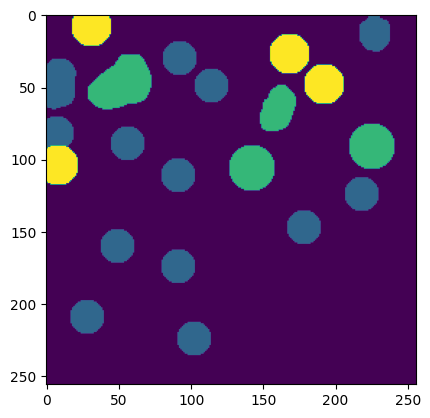

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(165, 140, 188, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(233, 27, 256, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(170, 188, 193, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(211, 0, 234, 16)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 182.2ms
Speed: 7.7ms preprocess, 182.2ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(138, 99, 161, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 187.8ms
Speed: 7.1ms preprocess, 187.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(220, 124, 243, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 186.7ms
Speed: 6.6ms preprocess, 186.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(217, 172, 240, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 184.7ms
Speed: 5.4ms preprocess, 184.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 202, 87, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 183.5ms
Speed: 6.3ms preprocess, 183.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(181, 22, 204, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(40, 236, 68, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(0, 100, 22, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 180.3ms
Speed: 8.5ms preprocess, 180.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(24, 72, 47, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 181.9ms
Speed: 11.0ms preprocess, 181.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(5, 57, 28, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 181.5ms
Speed: 11.0ms preprocess, 181.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 6, 17, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 0, 58, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(95, 0, 118, 16)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 182.1ms
Speed: 10.1ms preprocess, 182.1ms inference, 9.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1557.0 bbox 256
fixed shape for a cell
(203, 69, 226, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 184.2ms
Speed: 7.4ms preprocess, 184.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1005.0 bbox 256
fixed shape for a cell
(66, 150, 89, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 189.5ms
Speed: 6.1ms preprocess, 189.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(235, 96, 256, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 184.6ms
Speed: 10.3ms preprocess, 184.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 123, 109, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 189.7ms
Speed: 6.1ms preprocess, 189.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 23, 105, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 182.7ms
Speed: 7.5ms preprocess, 182.7ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(119, 139, 150, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 187.1ms
Speed: 6.6ms preprocess, 187.1ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 210, 35, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 165, 46, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 230, 119, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 183.6ms
Speed: 6.7ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 106, 71, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 184.7ms
Speed: 6.5ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1936.0 bbox 576
fixed shape for a cell
(171, 223, 202, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 25, 154, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 187.0ms
Speed: 6.1ms preprocess, 187.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 205, 250, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 196, 127, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3303.png: 1024x1024 10 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(197, 133, 224, 160)
FINAL MASK!!!


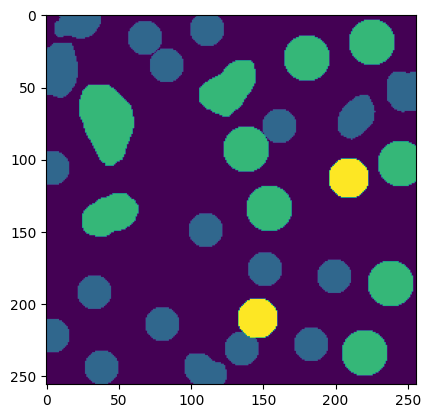

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 183.7ms
Speed: 6.5ms preprocess, 183.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 256
fixed shape for a cell
(75, 118, 98, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 186.7ms
Speed: 6.3ms preprocess, 186.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 256
fixed shape for a cell
(193, 152, 216, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  852.0 bbox 256
fixed shape for a cell
(170, 221, 193, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 187.3ms
Speed: 6.7ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1355.0 bbox 256
fixed shape for a cell
(216, 62, 239, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 181.9ms
Speed: 9.6ms preprocess, 181.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1355.0 bbox 256
fixed shape for a cell
(198, 36, 221, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 256
fixed shape for a cell
(173, 98, 196, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 187.5ms
Speed: 6.4ms preprocess, 187.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(125, 165, 167, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 185.6ms
Speed: 6.4ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 256
fixed shape for a cell
(120, 218, 143, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 187.7ms
Speed: 6.4ms preprocess, 187.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 256
fixed shape for a cell
(75, 229, 98, 252)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 181.2ms
Speed: 6.5ms preprocess, 181.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 256
fixed shape for a cell
(46, 206, 69, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1355.0 bbox 256
fixed shape for a cell
(109, 18, 132, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(7, 53, 33, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 187.9ms
Speed: 7.8ms preprocess, 187.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 256
fixed shape for a cell
(6, 204, 29, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 188.4ms
Speed: 8.3ms preprocess, 188.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1160.0 bbox 256
fixed shape for a cell
(25, 164, 48, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 187.0ms
Speed: 6.2ms preprocess, 187.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1355.0 bbox 256
fixed shape for a cell
(18, 136, 41, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1355.0 bbox 256
fixed shape for a cell
(19, 30, 42, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1355.0 bbox 256
fixed shape for a cell
(40, 11, 63, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 185.4ms
Speed: 8.0ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(69, 3, 92, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 186.7ms
Speed: 8.2ms preprocess, 186.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1030.0 bbox 256
fixed shape for a cell
(75, 51, 98, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 184.2ms
Speed: 6.5ms preprocess, 184.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1355.0 bbox 256
fixed shape for a cell
(148, 47, 171, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 184.3ms
Speed: 6.5ms preprocess, 184.3ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1147.0 bbox 256
fixed shape for a cell
(160, 184, 183, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 181.6ms
Speed: 7.2ms preprocess, 181.6ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(3, 87, 35, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 181.4ms
Speed: 6.3ms preprocess, 181.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  38812.0 bbox 576
fixed shape for a cell
(70, 176, 101, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 185.3ms
Speed: 7.5ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 182, 236, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 185.7ms
Speed: 9.2ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 229, 256, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 127, 198, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3340.png: 1024x1024 17 objects, 181.7ms
Speed: 8.3ms preprocess, 181.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1525.0 bbox 400
fixed shape for a cell
(47, 75, 74, 102)
FINAL MASK!!!


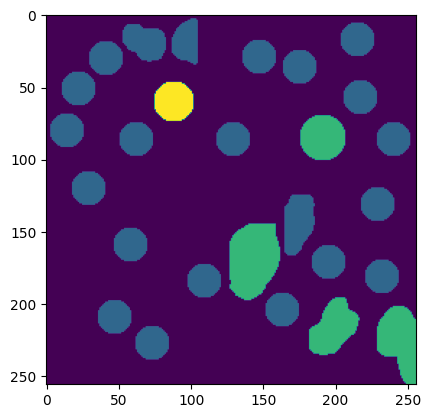

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 109, 124, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 181.7ms
Speed: 8.7ms preprocess, 181.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1010.0 bbox 256
fixed shape for a cell
(64, 77, 87, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(178, 26, 216, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 75, 256, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 185.9ms
Speed: 6.5ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(204, 75, 227, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 182.0ms
Speed: 6.4ms preprocess, 182.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1370.0 bbox 256
fixed shape for a cell
(232, 129, 255, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 188.1ms
Speed: 6.5ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1370.0 bbox 256
fixed shape for a cell
(210, 146, 233, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(193, 110, 216, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 184.4ms
Speed: 7.5ms preprocess, 184.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 127, 212, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 188.4ms
Speed: 6.7ms preprocess, 188.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  926.0 bbox 256
fixed shape for a cell
(141, 122, 164, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 186.3ms
Speed: 7.8ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(126, 0, 149, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 172, 248, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(86, 35, 118, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 182.7ms
Speed: 7.3ms preprocess, 182.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 176, 189, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 187.1ms
Speed: 9.2ms preprocess, 187.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 53, 20, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 184.3ms
Speed: 9.0ms preprocess, 184.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 190, 166, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 186.1ms
Speed: 8.1ms preprocess, 186.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(106, 161, 147, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 171, 84, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 183.2ms
Speed: 8.2ms preprocess, 183.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(103, 69, 140, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 33, 182, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 188.5ms
Speed: 6.3ms preprocess, 188.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(34, 142, 65, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 188.7ms
Speed: 5.6ms preprocess, 188.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 160, 31, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(156, 208, 190, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 186.1ms
Speed: 6.6ms preprocess, 186.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 98, 196, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(122, 227, 153, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 9.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(217, 19, 253, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 181.8ms
Speed: 6.7ms preprocess, 181.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(30, 30, 61, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 206, 43, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 185.1ms
Speed: 6.1ms preprocess, 185.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 205, 98, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 186.3ms
Speed: 8.1ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(10, 123, 41, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 183.0ms
Speed: 6.8ms preprocess, 183.0ms inference, 8.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 110, 68, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 9.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 8, 104, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 47, 208, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0007__idx-3371.png: 1024x1024 19 objects, 181.9ms
Speed: 8.2ms preprocess, 181.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(36, 228, 63, 255)
FINAL MASK!!!


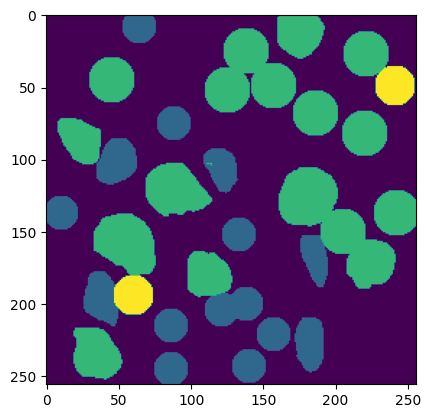

/content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 190, 120, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 182.1ms
Speed: 6.7ms preprocess, 182.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 77, 15, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 182.6ms
Speed: 6.1ms preprocess, 182.6ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(132, 110, 159, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 184.4ms
Speed: 6.7ms preprocess, 184.4ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 149, 36, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 9.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(58, 230, 81, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 186.4ms
Speed: 10.1ms preprocess, 186.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  829.0 bbox 256
fixed shape for a cell
(13, 11, 36, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 186.2ms
Speed: 6.1ms preprocess, 186.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  810.0 bbox 256
fixed shape for a cell
(95, 24, 118, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 185.8ms
Speed: 8.6ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1364.0 bbox 256
fixed shape for a cell
(1, 115, 24, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 156, 184, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 46, 196, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(127, 43, 159, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 186.7ms
Speed: 6.2ms preprocess, 186.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 195, 173, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 122, 101, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 182.1ms
Speed: 6.1ms preprocess, 182.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(213, 131, 250, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 184.1ms
Speed: 6.4ms preprocess, 184.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 74, 167, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 102, 55, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(205, 63, 237, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 180.8ms
Speed: 9.1ms preprocess, 180.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(13, 189, 46, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 186.4ms
Speed: 6.8ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 10, 82, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 186.9ms
Speed: 6.8ms preprocess, 186.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(102, 160, 126, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 187.0ms
Speed: 6.9ms preprocess, 187.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(207, 23, 224, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 163, 75, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 181.7ms
Speed: 7.1ms preprocess, 181.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 68, 101, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 188.1ms
Speed: 6.4ms preprocess, 188.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(135, 110, 152, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 47, 71, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(17, 56, 44, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 93, 217, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-7__ROI-0008__idx-3163.png: 1024x1024 35 objects, 182.2ms
Speed: 6.5ms preprocess, 182.2ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(64, 83, 92, 107)
FINAL MASK!!!


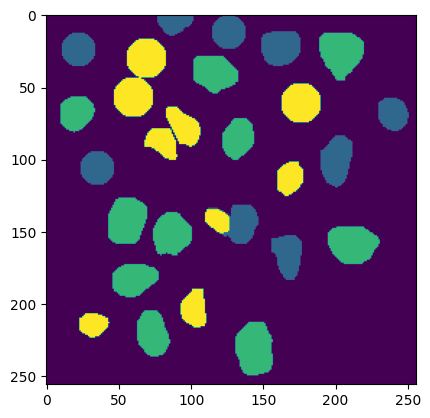

/content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(129, 87, 152, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 185.7ms
Speed: 8.2ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(98, 88, 121, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 51, 164, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 182.4ms
Speed: 10.2ms preprocess, 182.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(187, 50, 210, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 188.6ms
Speed: 6.2ms preprocess, 188.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(214, 93, 237, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 112, 96, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 185.2ms
Speed: 7.2ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 148, 112, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 183.1ms
Speed: 5.9ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 59, 138, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 185.0ms
Speed: 6.7ms preprocess, 185.0ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 183, 208, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 185.6ms
Speed: 6.8ms preprocess, 185.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(197, 217, 220, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 184.3ms
Speed: 8.3ms preprocess, 184.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 108, 193, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 189.2ms
Speed: 7.4ms preprocess, 189.2ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 166, 164, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(205, 128, 232, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-1__idx-3015.png: 1024x1024 1 object, 183.3ms
Speed: 6.1ms preprocess, 183.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(169, 74, 196, 101)
FINAL MASK!!!


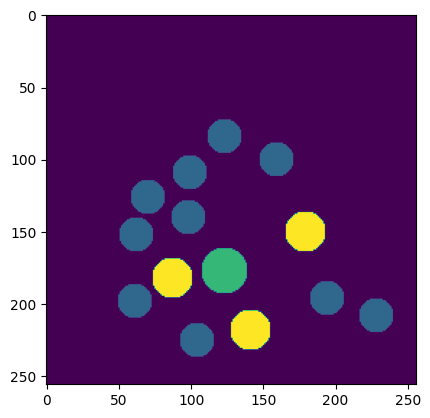

/content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 184.0ms
Speed: 5.6ms preprocess, 184.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 20, 124, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 183.3ms
Speed: 6.1ms preprocess, 183.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 67, 38, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 188.3ms
Speed: 6.2ms preprocess, 188.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 45, 46, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 6, 66, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 161, 44, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 217, 69, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 188.6ms
Speed: 6.4ms preprocess, 188.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 186, 60, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(50, 57, 74, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 182.0ms
Speed: 6.1ms preprocess, 182.0ms inference, 8.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 22, 90, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 183.3ms
Speed: 6.6ms preprocess, 183.3ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 129, 46, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 167, 87, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 182.8ms
Speed: 6.7ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  877.0 bbox 256
fixed shape for a cell
(143, 124, 166, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 157, 165, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 188.8ms
Speed: 6.5ms preprocess, 188.8ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 186, 135, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 189.2ms
Speed: 6.1ms preprocess, 189.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(98, 144, 128, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 185.1ms
Speed: 6.1ms preprocess, 185.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 81, 143, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 185.8ms
Speed: 6.7ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 106, 63, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 185.0ms
Speed: 6.8ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(101, 89, 128, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 60, 116, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 134, 87, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(9, 14, 34, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-3__idx-3002.png: 1024x1024 18 objects, 181.6ms
Speed: 6.3ms preprocess, 181.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1219.0 bbox 400
fixed shape for a cell
(82, 204, 109, 231)
FINAL MASK!!!


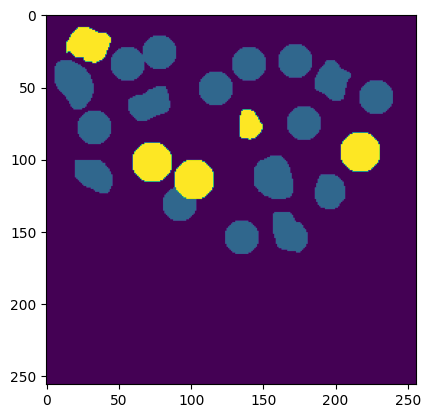

/content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 185.5ms
Speed: 6.6ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  945.0 bbox 256
fixed shape for a cell
(36, 96, 59, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  945.0 bbox 256
fixed shape for a cell
(48, 123, 71, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 181.7ms
Speed: 6.0ms preprocess, 181.7ms inference, 9.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  945.0 bbox 256
fixed shape for a cell
(63, 148, 86, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 183.7ms
Speed: 8.3ms preprocess, 183.7ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  945.0 bbox 256
fixed shape for a cell
(40, 148, 63, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 182.0ms
Speed: 8.8ms preprocess, 182.0ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(17, 65, 46, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 185.7ms
Speed: 12.8ms preprocess, 185.7ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  945.0 bbox 256
fixed shape for a cell
(78, 74, 101, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 184.2ms
Speed: 6.5ms preprocess, 184.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 136, 198, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 187.0ms
Speed: 6.1ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(146, 176, 169, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 171, 196, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 181.8ms
Speed: 6.2ms preprocess, 181.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 194, 170, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 183.5ms
Speed: 9.0ms preprocess, 183.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 130, 29, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 186.9ms
Speed: 6.8ms preprocess, 186.9ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  945.0 bbox 256
fixed shape for a cell
(94, 165, 117, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 185.8ms
Speed: 6.5ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1130.0 bbox 256
fixed shape for a cell
(8, 209, 31, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 184.8ms
Speed: 6.7ms preprocess, 184.8ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 213, 64, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 181.4ms
Speed: 6.3ms preprocess, 181.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 176, 88, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(197, 63, 217, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 187.8ms
Speed: 7.9ms preprocess, 187.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(177, 94, 209, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 186.2ms
Speed: 6.6ms preprocess, 186.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 26, 183, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 188.6ms
Speed: 6.2ms preprocess, 188.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 49, 171, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 105, 164, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 187.1ms
Speed: 7.4ms preprocess, 187.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 133, 127, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 184.4ms
Speed: 8.4ms preprocess, 184.4ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(128, 210, 144, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 183.2ms
Speed: 8.8ms preprocess, 183.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  945.0 bbox 256
fixed shape for a cell
(121, 160, 144, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 183.8ms
Speed: 8.6ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(84, 90, 115, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 187.6ms
Speed: 6.7ms preprocess, 187.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 201, 106, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 186.2ms
Speed: 6.6ms preprocess, 186.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 224, 169, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 212, 181, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3011.png: 1024x1024 32 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1223.0 bbox 400
fixed shape for a cell
(95, 213, 122, 240)
FINAL MASK!!!


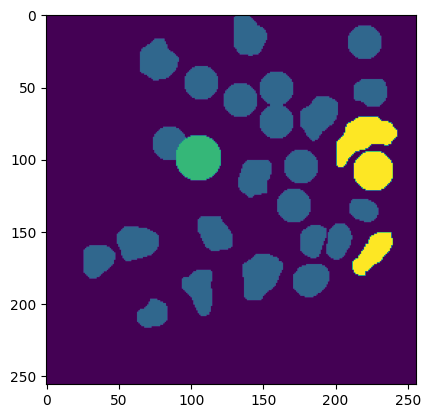

/content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 51, 16, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 187.2ms
Speed: 7.2ms preprocess, 187.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(106, 225, 135, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(114, 187, 134, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 184.7ms
Speed: 9.1ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 156, 135, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 150, 96, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(99, 152, 122, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 183.8ms
Speed: 7.1ms preprocess, 183.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 172, 38, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(26, 219, 50, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 182.9ms
Speed: 7.5ms preprocess, 182.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 175, 86, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 185.9ms
Speed: 7.0ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 8, 191, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 186.0ms
Speed: 6.6ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(192, 42, 218, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(188, 71, 211, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 187.9ms
Speed: 10.2ms preprocess, 187.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 49, 185, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 187.4ms
Speed: 7.1ms preprocess, 187.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 110, 230, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 182.2ms
Speed: 9.4ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(185, 170, 214, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 183.2ms
Speed: 6.7ms preprocess, 183.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(225, 45, 248, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 184.8ms
Speed: 6.1ms preprocess, 184.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 98, 171, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 185.9ms
Speed: 6.9ms preprocess, 185.9ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 66, 52, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 186.5ms
Speed: 8.1ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 74, 77, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(69, 51, 92, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 184.3ms
Speed: 10.8ms preprocess, 184.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 23, 66, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 184.5ms
Speed: 6.9ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(69, 6, 105, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 185.7ms
Speed: 9.6ms preprocess, 185.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  843.0 bbox 256
fixed shape for a cell
(135, 28, 158, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 184.4ms
Speed: 6.7ms preprocess, 184.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 143, 203, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(205, 148, 230, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 186.1ms
Speed: 6.3ms preprocess, 186.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(226, 169, 256, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 187.5ms
Speed: 6.3ms preprocess, 187.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 79, 127, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 186.7ms
Speed: 8.9ms preprocess, 186.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 13, 32, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 182.9ms
Speed: 6.9ms preprocess, 182.9ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 182, 148, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 186.2ms
Speed: 6.7ms preprocess, 186.2ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 175, 86, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 129, 96, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 104, 64, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-4__idx-3015.png: 1024x1024 24 objects, 185.4ms
Speed: 8.8ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(136, 161, 163, 188)
FINAL MASK!!!


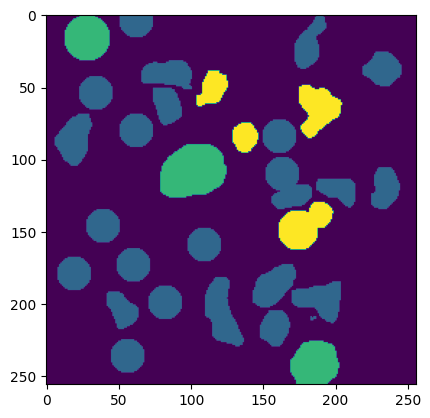

/content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(184, 99, 207, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 187.3ms
Speed: 6.0ms preprocess, 187.3ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 193, 141, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 184.3ms
Speed: 6.6ms preprocess, 184.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 192, 108, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 185.1ms
Speed: 9.1ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 99, 154, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(8, 171, 31, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 182.6ms
Speed: 6.8ms preprocess, 182.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(50, 223, 74, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 184.1ms
Speed: 6.5ms preprocess, 184.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 112, 241, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 188.7ms
Speed: 6.0ms preprocess, 188.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1095.0 bbox 256
fixed shape for a cell
(102, 227, 125, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 185.8ms
Speed: 6.6ms preprocess, 185.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(236, 151, 256, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 157, 203, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 185.0ms
Speed: 6.6ms preprocess, 185.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 166, 161, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(89, 152, 111, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 111, 86, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 72, 115, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 185.8ms
Speed: 9.0ms preprocess, 185.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(211, 35, 234, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 184.9ms
Speed: 7.0ms preprocess, 184.9ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(194, 66, 217, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 182.3ms
Speed: 6.6ms preprocess, 182.3ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 143, 234, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 186.2ms
Speed: 10.5ms preprocess, 186.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 207, 44, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 183.9ms
Speed: 6.3ms preprocess, 183.9ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 128, 166, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(180, 185, 207, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(98, 125, 118, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 186.5ms
Speed: 7.1ms preprocess, 186.5ms inference, 13.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 174, 97, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 183.9ms
Speed: 10.3ms preprocess, 183.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 50, 102, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 184.3ms
Speed: 6.8ms preprocess, 184.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 28, 177, 55)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 61, 59, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3004.png: 1024x1024 22 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(55, 78, 82, 105)
FINAL MASK!!!


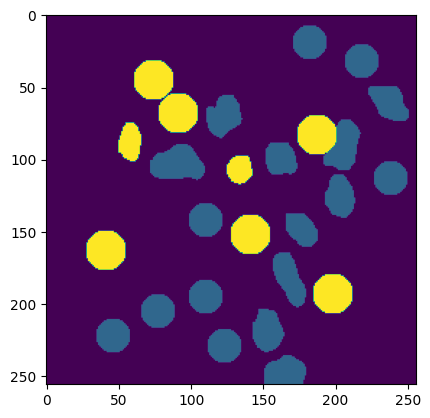

/content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(186, 0, 209, 18)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 72, 146, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 188.5ms
Speed: 6.1ms preprocess, 188.5ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 99, 199, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 119, 175, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 106, 142, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 67, 110, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(97, 18, 119, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 38, 232, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 186.2ms
Speed: 7.3ms preprocess, 186.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 18, 220, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 181.4ms
Speed: 6.6ms preprocess, 181.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 38, 148, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 187.4ms
Speed: 6.8ms preprocess, 187.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 111, 250, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 189.3ms
Speed: 6.5ms preprocess, 189.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(150, 174, 183, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 183.6ms
Speed: 9.1ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(108, 186, 136, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 184.7ms
Speed: 7.8ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 151, 123, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 184.9ms
Speed: 5.8ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 116, 106, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 188.2ms
Speed: 6.5ms preprocess, 188.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 85, 75, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 182.2ms
Speed: 6.7ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 58, 185, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 185.1ms
Speed: 6.8ms preprocess, 185.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 2, 165, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 186.5ms
Speed: 8.3ms preprocess, 186.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 73, 219, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3012.png: 1024x1024 24 objects, 187.8ms
Speed: 6.6ms preprocess, 187.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1551.0 bbox 400
fixed shape for a cell
(178, 147, 205, 174)
FINAL MASK!!!


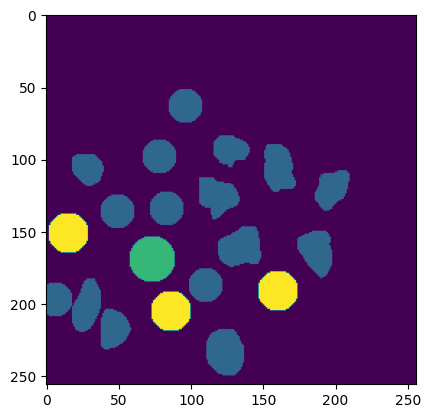

/content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 61, 137, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(208, 46, 231, 69)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 185.2ms
Speed: 6.5ms preprocess, 185.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(184, 42, 207, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 183.0ms
Speed: 6.7ms preprocess, 183.0ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(124, 160, 147, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 183.0ms
Speed: 7.5ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 188, 87, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 182.5ms
Speed: 7.7ms preprocess, 182.5ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  815.0 bbox 256
fixed shape for a cell
(62, 157, 85, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 185.6ms
Speed: 11.7ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1194.0 bbox 256
fixed shape for a cell
(73, 105, 96, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(24, 62, 58, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 1, 105, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 181.6ms
Speed: 6.9ms preprocess, 181.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 20, 253, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 10, 218, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 3, 149, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  815.0 bbox 256
fixed shape for a cell
(85, 160, 108, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 187.9ms
Speed: 6.5ms preprocess, 187.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(141, 43, 172, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 186.7ms
Speed: 8.0ms preprocess, 186.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  782.0 bbox 256
fixed shape for a cell
(98, 84, 121, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(113, 147, 136, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 185.7ms
Speed: 8.6ms preprocess, 185.7ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  984.0 bbox 256
fixed shape for a cell
(166, 141, 189, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(134, 176, 171, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 187.5ms
Speed: 6.3ms preprocess, 187.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(156, 10, 183, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 185.8ms
Speed: 9.1ms preprocess, 185.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(221, 148, 246, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 188.1ms
Speed: 6.7ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(177, 175, 202, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 184.7ms
Speed: 9.8ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(223, 94, 256, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(234, 124, 256, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 90, 178, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 184.9ms
Speed: 6.5ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 83, 226, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 184.7ms
Speed: 9.9ms preprocess, 184.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 110, 207, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 181.2ms
Speed: 11.7ms preprocess, 181.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 66, 194, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 185.2ms
Speed: 8.3ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 25, 131, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 183.8ms
Speed: 9.4ms preprocess, 183.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 63, 94, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3020.png: 1024x1024 29 objects, 187.2ms
Speed: 6.4ms preprocess, 187.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(211, 177, 238, 204)
FINAL MASK!!!


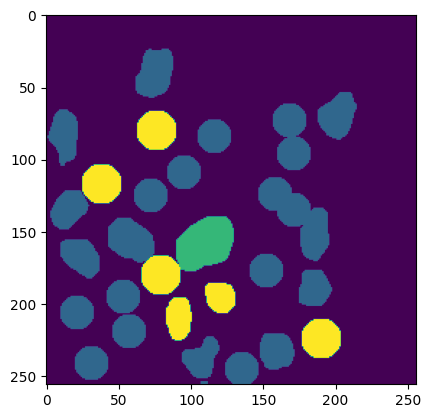

/content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 182.2ms
Speed: 6.6ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 198, 46, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 186.2ms
Speed: 9.2ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 93, 163, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 182.3ms
Speed: 6.5ms preprocess, 182.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 165, 129, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 187.2ms
Speed: 8.8ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(146, 112, 169, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 185.6ms
Speed: 6.1ms preprocess, 185.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  891.0 bbox 256
fixed shape for a cell
(57, 218, 80, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 182.1ms
Speed: 8.8ms preprocess, 182.1ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 116, 207, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 72, 22, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 76, 210, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 186.1ms
Speed: 6.5ms preprocess, 186.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 160, 61, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 183.0ms
Speed: 7.1ms preprocess, 183.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 79, 178, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 8.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 175, 95, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 187.4ms
Speed: 6.1ms preprocess, 187.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 126, 128, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 186.3ms
Speed: 7.3ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(101, 105, 124, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 188.4ms
Speed: 6.9ms preprocess, 188.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 83, 93, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 56, 115, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 187.3ms
Speed: 6.6ms preprocess, 187.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  979.0 bbox 256
fixed shape for a cell
(83, 29, 106, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 183.4ms
Speed: 6.1ms preprocess, 183.4ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  979.0 bbox 256
fixed shape for a cell
(74, 10, 97, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 191.7ms
Speed: 7.9ms preprocess, 191.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 20, 189, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 181.0ms
Speed: 9.6ms preprocess, 181.0ms inference, 9.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 0, 158, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 182.1ms
Speed: 7.8ms preprocess, 182.1ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 139, 92, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 185.2ms
Speed: 10.8ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 52, 176, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 31, 46, 62)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 181.4ms
Speed: 6.1ms preprocess, 181.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(114, 34, 132, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 186.4ms
Speed: 7.6ms preprocess, 186.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 119, 88, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 125, 25, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 184.1ms
Speed: 8.7ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 28, 81, 55)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 181.1ms
Speed: 6.4ms preprocess, 181.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(32, 90, 59, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 183.4ms
Speed: 6.0ms preprocess, 183.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 101, 74, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-4__ROI-5__idx-3023.png: 1024x1024 26 objects, 185.4ms
Speed: 8.2ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(108, 0, 135, 22)
FINAL MASK!!!


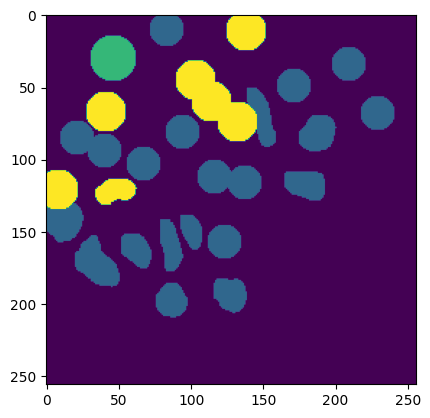

/content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 182.1ms
Speed: 6.7ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(26, 150, 46, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 186.8ms
Speed: 10.2ms preprocess, 186.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(191, 139, 212, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 158, 186, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 187.1ms
Speed: 5.9ms preprocess, 187.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  864.0 bbox 256
fixed shape for a cell
(164, 182, 187, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 185.7ms
Speed: 8.2ms preprocess, 185.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 225, 179, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1714.0 bbox 256
fixed shape for a cell
(212, 207, 235, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 185.2ms
Speed: 6.8ms preprocess, 185.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(174, 120, 197, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(155, 138, 182, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  857.0 bbox 256
fixed shape for a cell
(205, 99, 228, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 182.8ms
Speed: 6.9ms preprocess, 182.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(228, 97, 242, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 182.0ms
Speed: 6.2ms preprocess, 182.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(222, 125, 250, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(198, 230, 221, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 188.2ms
Speed: 6.4ms preprocess, 188.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 131, 154, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 187.9ms
Speed: 6.2ms preprocess, 187.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 112, 171, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 182.8ms
Speed: 15.9ms preprocess, 182.8ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 123, 223, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 150, 93, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(223, 132, 240, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 182.6ms
Speed: 8.4ms preprocess, 182.6ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 133, 80, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(243, 153, 256, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 185.0ms
Speed: 6.7ms preprocess, 185.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 174, 94, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 136, 34, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1408.0 bbox 256
fixed shape for a cell
(5, 157, 28, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 183.8ms
Speed: 6.5ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 180, 19, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 188.0ms
Speed: 6.0ms preprocess, 188.0ms inference, 12.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(15, 216, 44, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 221, 64, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 184.3ms
Speed: 7.2ms preprocess, 184.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 164, 72, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 184.7ms
Speed: 6.8ms preprocess, 184.7ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 160, 157, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 184.1ms
Speed: 7.1ms preprocess, 184.1ms inference, 9.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 164, 72, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 189.9ms
Speed: 6.0ms preprocess, 189.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 114, 81, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 187.3ms
Speed: 6.6ms preprocess, 187.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 195, 114, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 188.3ms
Speed: 7.1ms preprocess, 188.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 221, 94, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 185.1ms
Speed: 6.7ms preprocess, 185.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(126, 213, 149, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 187.2ms
Speed: 6.8ms preprocess, 187.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 229, 137, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  917.0 bbox 256
fixed shape for a cell
(125, 175, 148, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 187.1ms
Speed: 7.6ms preprocess, 187.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 110, 60, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(208, 166, 250, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 184.3ms
Speed: 6.6ms preprocess, 184.3ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 129, 120, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 157, 131, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 181.1ms
Speed: 10.7ms preprocess, 181.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 103, 132, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(24, 185, 42, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-1__idx-3003.png: 1024x1024 42 objects, 186.2ms
Speed: 6.4ms preprocess, 186.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(93, 212, 120, 239)
FINAL MASK!!!


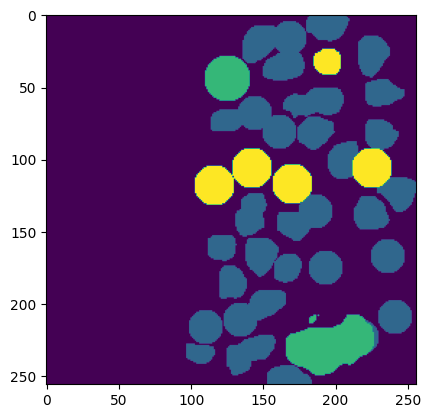

/content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 188.5ms
Speed: 6.6ms preprocess, 188.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(138, 31, 158, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 182.7ms
Speed: 9.0ms preprocess, 182.7ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 96, 56, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 126, 56, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 181.3ms
Speed: 6.4ms preprocess, 181.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 142, 56, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 181.0ms
Speed: 7.2ms preprocess, 181.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 114, 89, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 186.6ms
Speed: 6.2ms preprocess, 186.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 106, 111, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 86, 79, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 65, 106, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 181.4ms
Speed: 8.5ms preprocess, 181.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(114, 20, 137, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 186.9ms
Speed: 6.5ms preprocess, 186.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 8, 215, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.5ms
Speed: 9.2ms preprocess, 185.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(163, 15, 189, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 183.9ms
Speed: 7.4ms preprocess, 183.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 112, 169, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.8ms
Speed: 6.7ms preprocess, 184.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(110, 52, 137, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  862.0 bbox 256
fixed shape for a cell
(112, 92, 135, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(114, 120, 139, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 183.2ms
Speed: 6.9ms preprocess, 183.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 156, 144, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.0ms
Speed: 7.0ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 188, 147, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 186.2ms
Speed: 6.4ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(214, 194, 237, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.5ms
Speed: 7.0ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 211, 52, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 232, 64, 255)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.8ms
Speed: 8.7ms preprocess, 185.8ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  997.0 bbox 256
fixed shape for a cell
(66, 228, 89, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 216, 253, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.6ms
Speed: 8.3ms preprocess, 185.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(193, 80, 223, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 56, 196, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(119, 219, 154, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1632.0 bbox 256
fixed shape for a cell
(139, 72, 162, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.7ms
Speed: 6.4ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(195, 109, 222, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(229, 92, 256, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 186.7ms
Speed: 11.8ms preprocess, 186.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(245, 65, 256, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.2ms
Speed: 9.8ms preprocess, 184.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 217, 218, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.4ms
Speed: 6.5ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 148, 236, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(238, 169, 256, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(174, 103, 195, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 189, 111, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 46, 240, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 183.3ms
Speed: 10.5ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(162, 143, 193, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 227, 193, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 187.6ms
Speed: 6.5ms preprocess, 187.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(45, 168, 76, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 184.0ms
Speed: 5.9ms preprocess, 184.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 147, 108, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 185.6ms
Speed: 11.4ms preprocess, 185.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(231, 124, 250, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 201, 179, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 188.9ms
Speed: 7.5ms preprocess, 188.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 171, 164, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 181.9ms
Speed: 8.4ms preprocess, 181.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 163, 31, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3004.png: 1024x1024 42 objects, 183.6ms
Speed: 10.5ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(157, 90, 184, 117)
FINAL MASK!!!


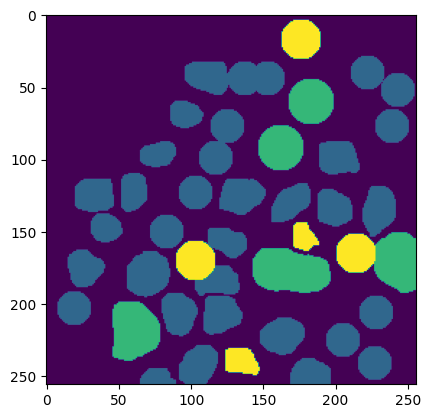

/content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 188.1ms
Speed: 8.9ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(21, 216, 40, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 185.4ms
Speed: 9.0ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  816.0 bbox 256
fixed shape for a cell
(114, 237, 137, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(96, 194, 119, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 181.4ms
Speed: 7.7ms preprocess, 181.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(172, 188, 204, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 182.9ms
Speed: 6.1ms preprocess, 182.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(159, 229, 187, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 150, 214, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 185.7ms
Speed: 6.1ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(204, 134, 227, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(217, 144, 240, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 225, 104, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 183.3ms
Speed: 6.5ms preprocess, 183.3ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(232, 175, 255, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(247, 121, 256, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(216, 95, 239, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  984.0 bbox 256
fixed shape for a cell
(208, 67, 231, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 181.0ms
Speed: 7.8ms preprocess, 181.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 89, 194, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 10.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(148, 117, 171, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.9ms
Speed: 9.9ms preprocess, 184.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 73, 188, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 182.7ms
Speed: 7.0ms preprocess, 182.7ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(139, 90, 162, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 181.6ms
Speed: 9.5ms preprocess, 181.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(217, 169, 240, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(62, 0, 85, 12)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(91, 93, 114, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.8ms
Speed: 10.0ms preprocess, 184.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(21, 188, 50, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 180.8ms
Speed: 7.8ms preprocess, 180.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(102, 22, 126, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 179.6ms
Speed: 10.4ms preprocess, 179.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 1, 143, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 185.6ms
Speed: 6.2ms preprocess, 185.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(140, 41, 163, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.1ms
Speed: 6.0ms preprocess, 184.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(108, 59, 132, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(59, 209, 82, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(65, 112, 88, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 181.3ms
Speed: 10.1ms preprocess, 181.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 98, 66, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 78, 97, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(3, 29, 26, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(72, 147, 95, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.2ms
Speed: 6.9ms preprocess, 184.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(122, 129, 145, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 186.2ms
Speed: 9.4ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(111, 166, 134, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.8ms
Speed: 6.6ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(58, 173, 81, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 185.3ms
Speed: 9.0ms preprocess, 185.3ms inference, 8.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 94, 32, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 184.1ms
Speed: 9.1ms preprocess, 184.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 160, 170, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 187.6ms
Speed: 8.4ms preprocess, 187.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 196, 162, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 185.2ms
Speed: 10.7ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(222, 207, 253, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 186.0ms
Speed: 6.5ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(23, 133, 54, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 54, 44, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3007.png: 1024x1024 25 objects, 181.8ms
Speed: 6.0ms preprocess, 181.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(59, 28, 101, 75)
FINAL MASK!!!


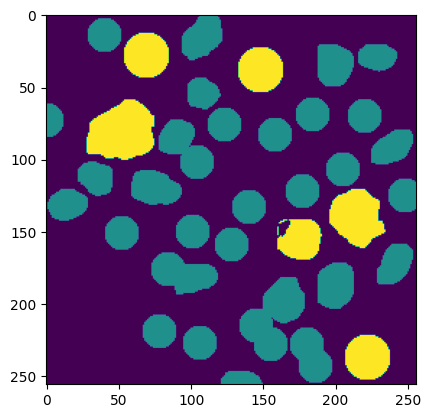

/content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  802.0 bbox 256
fixed shape for a cell
(162, 152, 185, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 226, 174, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(179, 209, 202, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 184.3ms
Speed: 6.8ms preprocess, 184.3ms inference, 8.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 178, 204, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 185.0ms
Speed: 13.7ms preprocess, 185.0ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 132, 223, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(158, 43, 181, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 183.0ms
Speed: 8.4ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 117, 194, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 80, 154, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 186.4ms
Speed: 6.9ms preprocess, 186.4ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 227, 104, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 185.3ms
Speed: 12.6ms preprocess, 185.3ms inference, 11.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 177, 17, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.2ms
Speed: 10.4ms preprocess, 182.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 168, 36, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 186.1ms
Speed: 6.6ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  794.0 bbox 256
fixed shape for a cell
(27, 201, 50, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 181.5ms
Speed: 5.6ms preprocess, 181.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 193, 128, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.9ms
Speed: 6.2ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 216, 144, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(150, 190, 176, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 30, 111, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 187.6ms
Speed: 6.1ms preprocess, 187.6ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 76, 32, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 150, 132, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 186.9ms
Speed: 7.0ms preprocess, 186.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(86, 164, 107, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(62, 119, 90, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 142, 50, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 107, 61, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 10.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 86, 123, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(9, 28, 34, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(35, 0, 57, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 184.5ms
Speed: 6.8ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(23, 52, 49, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(131, 160, 153, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 184.7ms
Speed: 6.5ms preprocess, 184.7ms inference, 9.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(30, 69, 55, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 187.5ms
Speed: 8.4ms preprocess, 187.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 25, 85, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 182.8ms
Speed: 9.1ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 47, 85, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 181.7ms
Speed: 6.4ms preprocess, 181.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(66, 79, 88, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 58, 113, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 88, 194, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 115, 30, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 186.7ms
Speed: 6.3ms preprocess, 186.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 122, 158, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-2__idx-3008.png: 1024x1024 34 objects, 187.2ms
Speed: 6.0ms preprocess, 187.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(91, 129, 108, 151)
FINAL MASK!!!


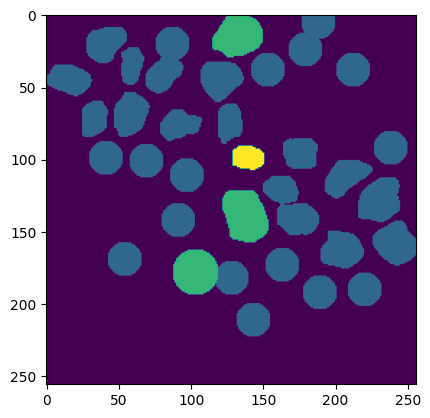

/content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 184.1ms
Speed: 6.4ms preprocess, 184.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(153, 99, 176, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(68, 65, 107, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 187.8ms
Speed: 6.2ms preprocess, 187.8ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(34, 55, 57, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 185.3ms
Speed: 8.6ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(42, 26, 65, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 183.1ms
Speed: 6.4ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  924.0 bbox 256
fixed shape for a cell
(77, 42, 100, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  924.0 bbox 256
fixed shape for a cell
(84, 21, 107, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(105, 37, 131, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  884.0 bbox 256
fixed shape for a cell
(149, 76, 172, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 185.7ms
Speed: 8.9ms preprocess, 185.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 88, 151, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 185.1ms
Speed: 6.5ms preprocess, 185.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 194, 188, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  979.0 bbox 256
fixed shape for a cell
(125, 127, 148, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  979.0 bbox 256
fixed shape for a cell
(142, 129, 165, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 181.6ms
Speed: 6.2ms preprocess, 181.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(161, 161, 184, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 158, 160, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 188.1ms
Speed: 6.2ms preprocess, 188.1ms inference, 4.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(117, 165, 142, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 181, 104, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 134, 104, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 156, 70, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 184.2ms
Speed: 6.8ms preprocess, 184.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 120, 57, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(40, 98, 61, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 183.0ms
Speed: 7.6ms preprocess, 183.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 101, 84, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1196.0 bbox 256
fixed shape for a cell
(82, 102, 105, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 189.0ms
Speed: 6.1ms preprocess, 189.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 222, 168, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 189.0ms
Speed: 6.2ms preprocess, 189.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 185, 30, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(60, 205, 98, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 183.1ms
Speed: 6.5ms preprocess, 183.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 129, 28, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 209, 49, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3005.png: 1024x1024 30 objects, 188.7ms
Speed: 6.2ms preprocess, 188.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(102, 216, 129, 243)
FINAL MASK!!!


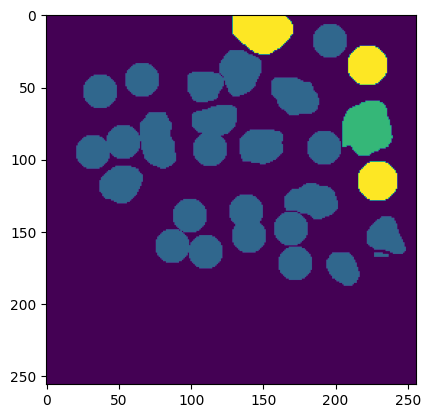

/content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 187.2ms
Speed: 6.4ms preprocess, 187.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(234, 151, 254, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 181.9ms
Speed: 8.2ms preprocess, 181.9ms inference, 8.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 63, 19, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(227, 49, 250, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 123, 224, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.2ms
Speed: 6.8ms preprocess, 184.2ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 107, 139, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 183.7ms
Speed: 8.0ms preprocess, 183.7ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 180, 101, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.0ms
Speed: 8.8ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 153, 69, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.1ms
Speed: 8.2ms preprocess, 185.1ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(226, 120, 246, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.9ms
Speed: 6.1ms preprocess, 184.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 170, 44, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 186.0ms
Speed: 6.1ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 201, 74, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 183.8ms
Speed: 8.1ms preprocess, 183.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(86, 203, 109, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.0ms
Speed: 7.4ms preprocess, 185.0ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 222, 98, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 188.4ms
Speed: 6.9ms preprocess, 188.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(183, 89, 206, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 183.9ms
Speed: 6.4ms preprocess, 183.9ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(11, 228, 35, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.5ms
Speed: 6.3ms preprocess, 185.5ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(127, 211, 151, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 181.4ms
Speed: 6.4ms preprocess, 181.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 153, 29, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 181.4ms
Speed: 6.4ms preprocess, 181.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 10, 24, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.3ms
Speed: 6.9ms preprocess, 184.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 0, 67, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.9ms
Speed: 5.9ms preprocess, 184.9ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(111, 9, 134, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 27, 52, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(40, 81, 62, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 88, 41, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(27, 126, 48, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 109, 88, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.1ms
Speed: 6.8ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 115, 24, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 42, 111, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 189.4ms
Speed: 6.2ms preprocess, 189.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 16, 112, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 187.2ms
Speed: 9.6ms preprocess, 187.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 41, 139, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 73, 144, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 188.0ms
Speed: 6.0ms preprocess, 188.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 0, 162, 27)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.1ms
Speed: 8.5ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(232, 87, 256, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 13, 187, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 182.2ms
Speed: 6.5ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(180, 42, 209, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.3ms
Speed: 6.5ms preprocess, 184.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 57, 171, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 189.8ms
Speed: 5.9ms preprocess, 189.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(132, 190, 161, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 218, 223, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 185.5ms
Speed: 9.3ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 33, 86, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(41, 224, 65, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 144, 160, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(188, 11, 219, 42)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.2ms
Speed: 6.5ms preprocess, 184.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(81, 144, 112, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 96, 181, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 181.5ms
Speed: 7.8ms preprocess, 181.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 46, 40, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-3__idx-3008.png: 1024x1024 24 objects, 184.2ms
Speed: 6.7ms preprocess, 184.2ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(183, 176, 212, 200)
FINAL MASK!!!


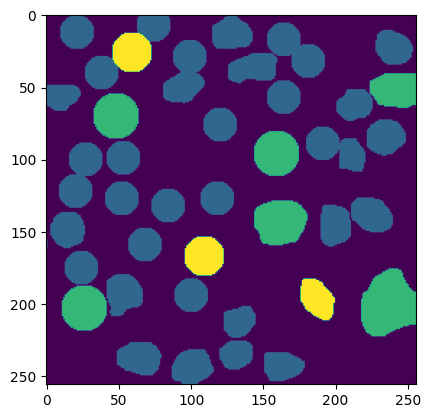

/content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 116, 37, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 187.0ms
Speed: 7.7ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 196, 81, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 124, 138, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 187.6ms
Speed: 9.2ms preprocess, 187.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(97, 187, 120, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 188.3ms
Speed: 6.4ms preprocess, 188.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 168, 98, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 216, 60, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 181.1ms
Speed: 6.1ms preprocess, 181.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 130, 111, 153)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 187.8ms
Speed: 6.5ms preprocess, 187.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 156, 118, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(44, 53, 66, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 185.7ms
Speed: 8.7ms preprocess, 185.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 172, 27, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 180.4ms
Speed: 11.9ms preprocess, 180.4ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(15, 184, 38, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 147, 32, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 186.6ms
Speed: 6.3ms preprocess, 186.6ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(26, 152, 58, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 184.8ms
Speed: 7.3ms preprocess, 184.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 126, 56, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 55, 88, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 183.3ms
Speed: 6.5ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 169, 151, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 186.6ms
Speed: 6.4ms preprocess, 186.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 78, 56, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(18, 24, 43, 69)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 84, 117, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3000.png: 1024x1024 15 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(52, 102, 79, 129)
FINAL MASK!!!


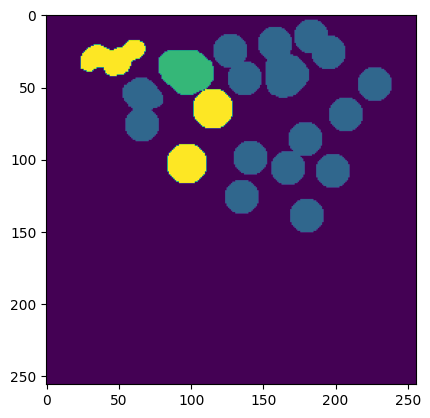

/content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(34, 44, 57, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 185.0ms
Speed: 9.5ms preprocess, 185.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 194, 144, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 184.1ms
Speed: 6.3ms preprocess, 184.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(138, 168, 161, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 185.5ms
Speed: 8.3ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 150, 187, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 122, 197, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(101, 0, 132, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 36, 78, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(24, 103, 49, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 77, 76, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(63, 122, 86, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 186.6ms
Speed: 7.1ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(83, 97, 112, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 186.4ms
Speed: 8.7ms preprocess, 186.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 68, 135, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 187.4ms
Speed: 7.5ms preprocess, 187.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(129, 144, 152, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 181.8ms
Speed: 7.4ms preprocess, 181.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(144, 113, 167, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 182.9ms
Speed: 9.4ms preprocess, 182.9ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 8, 41, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 26, 143, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 186.8ms
Speed: 8.9ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 161, 75, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 191, 64, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 184.3ms
Speed: 6.3ms preprocess, 184.3ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 149, 113, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 186.0ms
Speed: 9.6ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 99, 144, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 46, 170, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(76, 21, 107, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 184.3ms
Speed: 6.3ms preprocess, 184.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(99, 122, 120, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-4__idx-3001.png: 1024x1024 13 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(17, 72, 44, 99)
FINAL MASK!!!


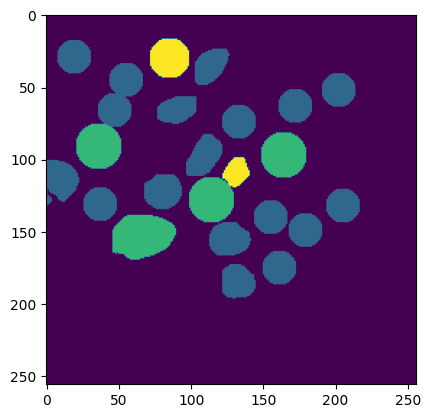

/content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 179.8ms
Speed: 6.3ms preprocess, 179.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 202, 172, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 181.7ms
Speed: 7.4ms preprocess, 181.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 41, 182, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 181.6ms
Speed: 6.2ms preprocess, 181.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 93, 114, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 136, 87, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 187.0ms
Speed: 6.4ms preprocess, 187.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 160, 102, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.3ms
Speed: 9.1ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 184, 105, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 176, 78, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 203, 79, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 186.5ms
Speed: 6.3ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 168, 50, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 188.6ms
Speed: 6.3ms preprocess, 188.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 56, 152, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 211, 45, 234)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 186.2ms
Speed: 7.7ms preprocess, 186.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(143, 138, 166, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 187.4ms
Speed: 6.6ms preprocess, 187.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 238, 80, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 187.2ms
Speed: 6.4ms preprocess, 187.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 217, 154, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 188.3ms
Speed: 6.1ms preprocess, 188.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 233, 143, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 186.9ms
Speed: 6.2ms preprocess, 186.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 181, 133, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.2ms
Speed: 8.4ms preprocess, 183.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 114, 74, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 182.2ms
Speed: 6.4ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 147, 47, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 182.2ms
Speed: 6.4ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(13, 118, 36, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.5ms
Speed: 7.4ms preprocess, 183.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 173, 157, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 185.7ms
Speed: 8.2ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 137, 21, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 74, 191, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.4ms
Speed: 9.1ms preprocess, 184.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(230, 73, 253, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.4ms
Speed: 9.5ms preprocess, 184.4ms inference, 8.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 202, 127, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 230, 118, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 153, 132, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 189.4ms
Speed: 6.6ms preprocess, 189.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 135, 118, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(122, 99, 145, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 185.1ms
Speed: 8.1ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 109, 172, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 186.7ms
Speed: 6.2ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(184, 118, 203, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(179, 148, 202, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.3ms
Speed: 8.5ms preprocess, 183.3ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 155, 224, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 181.6ms
Speed: 6.2ms preprocess, 181.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 52, 208, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.5ms
Speed: 6.7ms preprocess, 183.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(159, 166, 182, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 185.9ms
Speed: 6.8ms preprocess, 185.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 224, 218, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 187.1ms
Speed: 6.1ms preprocess, 187.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(164, 233, 187, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.5ms
Speed: 10.5ms preprocess, 184.5ms inference, 9.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 196, 247, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.7ms
Speed: 10.5ms preprocess, 184.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 225, 241, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 183.5ms
Speed: 5.8ms preprocess, 183.5ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(226, 160, 249, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.5ms
Speed: 9.0ms preprocess, 184.5ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(232, 134, 255, 157)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 185.5ms
Speed: 8.5ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(206, 95, 229, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(239, 99, 256, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 185.6ms
Speed: 6.4ms preprocess, 185.6ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(196, 195, 219, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 186.6ms
Speed: 6.4ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(25, 234, 56, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3001.png: 1024x1024 8 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(84, 67, 111, 94)
FINAL MASK!!!


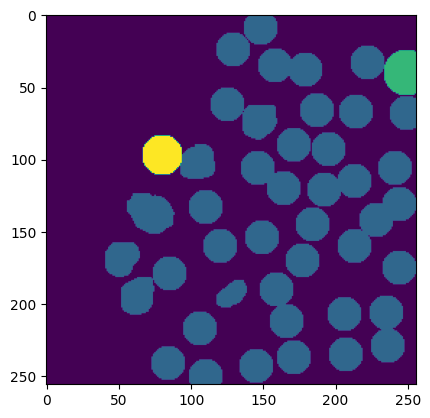

/content/drive/MyDrive/NIO/images/23-1-5__ROI-7__idx-3003.png


No object detected.
nic nie wykryto!
fixed shape for a cell
(152, 109, 175, 132)


No object detected.
nic nie wykryto!
fixed shape for a cell
(22, 108, 45, 131)


No object detected.
nic nie wykryto!
fixed shape for a cell
(106, 130, 129, 153)


No object detected.
nic nie wykryto!
fixed shape for a cell
(130, 119, 153, 142)


No object detected.
nic nie wykryto!
fixed shape for a cell
(4, 134, 27, 157)


No object detected.
nic nie wykryto!
fixed shape for a cell
(125, 152, 148, 175)


No object detected.
nic nie wykryto!
fixed shape for a cell
(53, 184, 76, 207)


No object detected.
nic nie wykryto!
fixed shape for a cell
(90, 7, 113, 30)


No object detected.
nic nie wykryto!
fixed shape for a cell
(78, 94, 101, 117)


No object detected.
nic nie wykryto!
fixed shape for a cell
(6, 56, 29, 79)


No object detected.
nic nie wykryto!
fixed shape for a cell
(14, 14, 37, 37)


No object detected.
nic nie wykryto!
fixed shape for a cell
(69, 34, 92, 57)


No object detected.
nic nie wykryto!
fixed shape for a cell
(47, 42, 70, 65)


No object detected.
nic nie wykryto!
fixed shape for a cell
(34, 0, 57, 22)


No object detected.
nic nie wykryto!
fixed shape for a cell
(59, 0, 82, 23)


No object detected.
nic nie wykryto!
fixed shape for a cell
(138, 40, 161, 63)


No object detected.
nic nie wykryto!
fixed shape for a cell
(33, 71, 56, 94)


No object detected.
nic nie wykryto!
fixed shape for a cell
(28, 144, 51, 167)


No object detected.
nic nie wykryto!
fixed shape for a cell
(79, 56, 110, 87)


No object detected.
nic nie wykryto!
fixed shape for a cell
(112, 43, 143, 74)


No object detected.
nic nie wykryto!
fixed shape for a cell
(97, 10, 128, 41)


No object detected.
nic nie wykryto!
fixed shape for a cell
(77, 119, 104, 146)


No object detected.
nic nie wykryto!
fixed shape for a cell
(54, 114, 81, 141)


No object detected.
nic nie wykryto!
fixed shape for a cell
(69, 137, 96, 164)
No object detected.
nic nie wykryto!
fixed shape for a cell
(46, 99, 73, 126)
FINAL MASK!!!


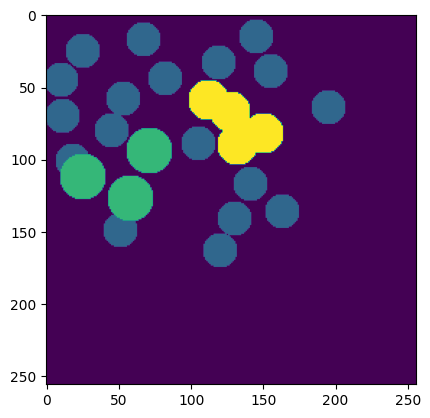

/content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 187.6ms
Speed: 6.3ms preprocess, 187.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 56, 42, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 185.1ms
Speed: 6.1ms preprocess, 185.1ms inference, 8.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 51, 137, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 187.5ms
Speed: 6.8ms preprocess, 187.5ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 121, 112, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 183.6ms
Speed: 6.4ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(45, 93, 68, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 183.2ms
Speed: 6.6ms preprocess, 183.2ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 67, 73, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 187.7ms
Speed: 9.5ms preprocess, 187.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 128, 151, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 186.4ms
Speed: 6.5ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 103, 154, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 83, 35, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 184.8ms
Speed: 6.1ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 69, 16, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 185.7ms
Speed: 7.1ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 99, 18, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 49, 102, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 185.1ms
Speed: 6.1ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 137, 24, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(108, 158, 131, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 188.3ms
Speed: 6.4ms preprocess, 188.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(124, 217, 147, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 186.2ms
Speed: 6.4ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(117, 189, 140, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 184.9ms
Speed: 6.0ms preprocess, 184.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 33, 30, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 149, 163, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 180.8ms
Speed: 9.3ms preprocess, 180.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(21, 120, 44, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 185.2ms
Speed: 7.1ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(71, 175, 94, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 184.8ms
Speed: 6.8ms preprocess, 184.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 202, 74, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 181.7ms
Speed: 6.5ms preprocess, 181.7ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 217, 60, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 111, 80, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 186.9ms
Speed: 6.5ms preprocess, 186.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(29, 240, 52, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(11, 192, 42, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(84, 72, 115, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 183.6ms
Speed: 7.4ms preprocess, 183.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 213, 118, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 181.9ms
Speed: 7.2ms preprocess, 181.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 160, 34, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3003.png: 1024x1024 1 object, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(43, 153, 70, 180)
FINAL MASK!!!


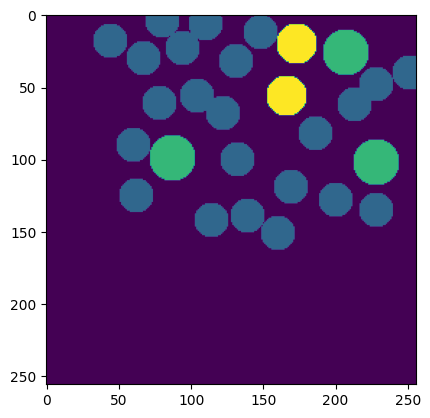

/content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 169, 93, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 181.3ms
Speed: 7.1ms preprocess, 181.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(134, 36, 157, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 183.5ms
Speed: 6.6ms preprocess, 183.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(132, 69, 155, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 187.0ms
Speed: 6.1ms preprocess, 187.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 132, 30, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 186.0ms
Speed: 6.1ms preprocess, 186.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 0, 70, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 185.2ms
Speed: 9.5ms preprocess, 185.2ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(75, 8, 98, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 182.7ms
Speed: 7.1ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(97, 27, 120, 50)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 186.5ms
Speed: 10.5ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 36, 101, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 182.6ms
Speed: 7.2ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 102, 64, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 187.7ms
Speed: 6.2ms preprocess, 187.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 75, 84, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 184.8ms
Speed: 9.3ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 33, 75, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 185.4ms
Speed: 8.3ms preprocess, 185.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(5, 65, 28, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 185.8ms
Speed: 8.2ms preprocess, 185.8ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(131, 147, 154, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 186.3ms
Speed: 6.5ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(19, 174, 42, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 184.7ms
Speed: 6.6ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 40, 24, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 181.2ms
Speed: 10.2ms preprocess, 181.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(28, 30, 51, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 189, 137, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 181.6ms
Speed: 6.4ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 169, 148, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 161, 129, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 184.4ms
Speed: 8.3ms preprocess, 184.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 91, 45, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 182.2ms
Speed: 6.6ms preprocess, 182.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 105, 99, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 138, 115, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 186.1ms
Speed: 7.7ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 59, 122, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 182.5ms
Speed: 6.6ms preprocess, 182.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 145, 60, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 80, 132, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 183.5ms
Speed: 6.6ms preprocess, 183.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(124, 117, 151, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3007.png: 1024x1024 1 object, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(77, 187, 104, 214)
FINAL MASK!!!


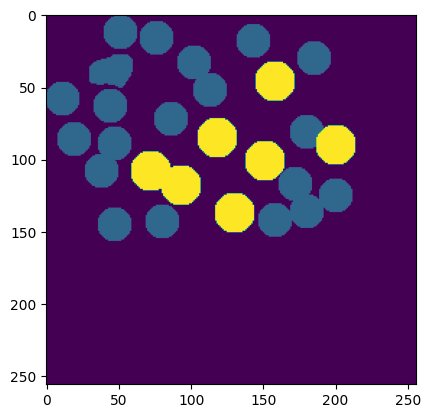

/content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 186.8ms
Speed: 6.3ms preprocess, 186.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 183, 49, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 184.5ms
Speed: 8.7ms preprocess, 184.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(33, 166, 56, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 155, 45, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(68, 183, 91, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 182.6ms
Speed: 6.7ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 144, 81, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 187.6ms
Speed: 6.5ms preprocess, 187.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(39, 135, 62, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 122, 79, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 181, 106, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 181.1ms
Speed: 7.8ms preprocess, 181.1ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 217, 112, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 184.0ms
Speed: 6.6ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 222, 101, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 187.9ms
Speed: 8.2ms preprocess, 187.9ms inference, 8.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 230, 72, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 188.9ms
Speed: 6.4ms preprocess, 188.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(16, 240, 39, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 187.3ms
Speed: 6.1ms preprocess, 187.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 213, 19, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 183, 23, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-5__ROI-8__idx-3015.png: 1024x1024 1 object, 182.8ms
Speed: 8.7ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(16, 201, 47, 232)
FINAL MASK!!!


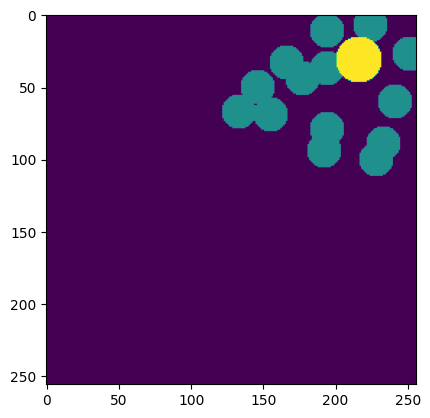

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 183.2ms
Speed: 7.4ms preprocess, 183.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(43, 99, 66, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(100, 176, 123, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(108, 103, 131, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.8ms
Speed: 6.1ms preprocess, 186.8ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(225, 79, 248, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 180.8ms
Speed: 7.6ms preprocess, 180.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(216, 118, 239, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 181.6ms
Speed: 8.7ms preprocess, 181.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(147, 155, 179, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 185.5ms
Speed: 8.1ms preprocess, 185.5ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(154, 128, 180, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.7ms
Speed: 6.4ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 147, 85, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.0ms
Speed: 8.7ms preprocess, 186.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(90, 135, 113, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(185, 92, 208, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(58, 170, 81, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.8ms
Speed: 6.6ms preprocess, 186.8ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(37, 179, 60, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 117, 20, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(10, 98, 33, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(32, 74, 55, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.8ms
Speed: 7.6ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 0, 27, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.6ms
Speed: 6.2ms preprocess, 186.6ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 50, 30, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 184.3ms
Speed: 5.8ms preprocess, 184.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(75, 14, 98, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 183.2ms
Speed: 6.1ms preprocess, 183.2ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1176.0 bbox 256
fixed shape for a cell
(131, 61, 154, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 183.0ms
Speed: 7.0ms preprocess, 183.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1176.0 bbox 256
fixed shape for a cell
(116, 51, 139, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.3ms
Speed: 6.5ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1008.0 bbox 256
fixed shape for a cell
(32, 132, 55, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 0, 187, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 55, 89, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3001.png: 1024x1024 14 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(40, 0, 67, 26)
FINAL MASK!!!


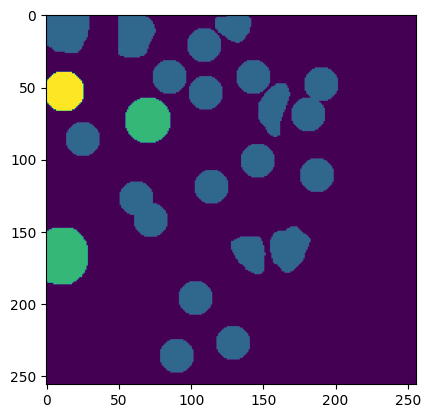

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 184.6ms
Speed: 7.2ms preprocess, 184.6ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1261.0 bbox 256
fixed shape for a cell
(33, 111, 56, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 90, 28, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 185.4ms
Speed: 7.4ms preprocess, 185.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  842.0 bbox 256
fixed shape for a cell
(27, 60, 50, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 183.7ms
Speed: 6.9ms preprocess, 183.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(84, 77, 107, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 182.4ms
Speed: 7.2ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  842.0 bbox 256
fixed shape for a cell
(74, 156, 97, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 186.9ms
Speed: 6.6ms preprocess, 186.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  842.0 bbox 256
fixed shape for a cell
(152, 112, 175, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 188.4ms
Speed: 6.5ms preprocess, 188.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  842.0 bbox 256
fixed shape for a cell
(125, 71, 148, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 184.5ms
Speed: 8.3ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1120.0 bbox 256
fixed shape for a cell
(126, 19, 149, 42)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 187.0ms
Speed: 8.2ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  842.0 bbox 256
fixed shape for a cell
(14, 158, 37, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 186.3ms
Speed: 7.3ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2120.0 bbox 576
fixed shape for a cell
(205, 123, 236, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 183.7ms
Speed: 7.7ms preprocess, 183.7ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(85, 207, 129, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 181.6ms
Speed: 9.4ms preprocess, 181.6ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 158, 148, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 186.0ms
Speed: 9.7ms preprocess, 186.0ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(152, 178, 176, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 183.6ms
Speed: 8.4ms preprocess, 183.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 90, 154, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 182.7ms
Speed: 7.2ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(60, 30, 87, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3002.png: 1024x1024 10 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(213, 191, 240, 218)
FINAL MASK!!!


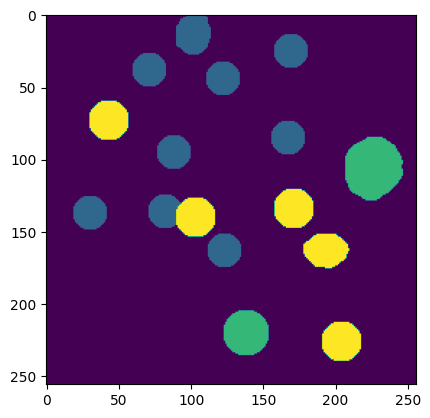

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 179.7ms
Speed: 9.3ms preprocess, 179.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  964.0 bbox 256
fixed shape for a cell
(33, 25, 56, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 182.0ms
Speed: 9.2ms preprocess, 182.0ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1002.0 bbox 256
fixed shape for a cell
(79, 67, 102, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 184.7ms
Speed: 9.8ms preprocess, 184.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  795.0 bbox 256
fixed shape for a cell
(114, 30, 137, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 182.4ms
Speed: 6.4ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1002.0 bbox 256
fixed shape for a cell
(123, 159, 146, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 185.8ms
Speed: 6.5ms preprocess, 185.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1002.0 bbox 256
fixed shape for a cell
(120, 205, 143, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1106.0 bbox 256
fixed shape for a cell
(172, 129, 195, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 185.6ms
Speed: 6.5ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1002.0 bbox 256
fixed shape for a cell
(21, 63, 44, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 183.9ms
Speed: 6.3ms preprocess, 183.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 215, 89, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 185.4ms
Speed: 6.7ms preprocess, 185.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 156, 83, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 180.8ms
Speed: 6.9ms preprocess, 180.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2244.0 bbox 576
fixed shape for a cell
(65, 103, 96, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 71, 176, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 184.5ms
Speed: 6.6ms preprocess, 184.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2244.0 bbox 400
fixed shape for a cell
(115, 108, 142, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3003.png: 1024x1024 8 objects, 186.0ms
Speed: 5.8ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(15, 102, 42, 129)
FINAL MASK!!!


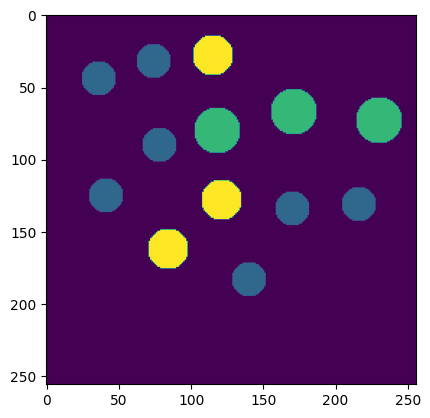

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 185.9ms
Speed: 6.1ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 16, 78, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 187.6ms
Speed: 6.2ms preprocess, 187.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 31, 243, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 88, 171, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 185.0ms
Speed: 10.0ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(143, 115, 166, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 127, 141, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 128, 194, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 182.1ms
Speed: 8.6ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 62, 223, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 186.6ms
Speed: 7.0ms preprocess, 186.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(88, 38, 117, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 187.0ms
Speed: 7.5ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  848.0 bbox 256
fixed shape for a cell
(79, 1, 102, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 58, 256, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(88, 159, 111, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(117, 157, 140, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 180.5ms
Speed: 6.4ms preprocess, 180.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 149, 171, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 185.8ms
Speed: 8.4ms preprocess, 185.8ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(220, 150, 249, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 184.9ms
Speed: 9.6ms preprocess, 184.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 23, 199, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 185.6ms
Speed: 8.4ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(102, 72, 143, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 110, 78, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 91, 212, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3004.png: 1024x1024 9 objects, 184.4ms
Speed: 7.7ms preprocess, 184.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(22, 58, 49, 85)
FINAL MASK!!!


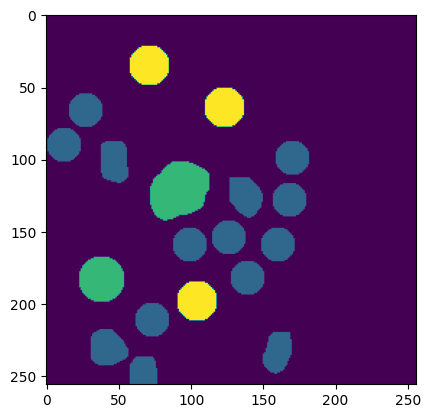

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 186.6ms
Speed: 6.2ms preprocess, 186.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(101, 170, 124, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 183.2ms
Speed: 6.1ms preprocess, 183.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(231, 225, 254, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 182.5ms
Speed: 10.3ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(223, 181, 246, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 184.2ms
Speed: 7.5ms preprocess, 184.2ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(181, 225, 204, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(21, 215, 44, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 182.7ms
Speed: 9.2ms preprocess, 182.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(36, 224, 59, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 187.4ms
Speed: 7.3ms preprocess, 187.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(77, 204, 100, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 183.7ms
Speed: 7.3ms preprocess, 183.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(135, 166, 158, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 181.0ms
Speed: 8.0ms preprocess, 181.0ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(213, 115, 236, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(166, 69, 189, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(156, 112, 179, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(112, 85, 135, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 181.6ms
Speed: 6.3ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(93, 123, 116, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(110, 138, 133, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  818.0 bbox 256
fixed shape for a cell
(174, 150, 197, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 181.9ms
Speed: 9.3ms preprocess, 181.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(30, 143, 61, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 185.7ms
Speed: 7.9ms preprocess, 185.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 107, 91, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 185.8ms
Speed: 8.9ms preprocess, 185.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(133, 230, 160, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 185.9ms
Speed: 8.1ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 51, 212, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 187.7ms
Speed: 6.7ms preprocess, 187.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 12, 179, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3006.png: 1024x1024 1 object, 183.4ms
Speed: 11.3ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(177, 96, 204, 123)
FINAL MASK!!!


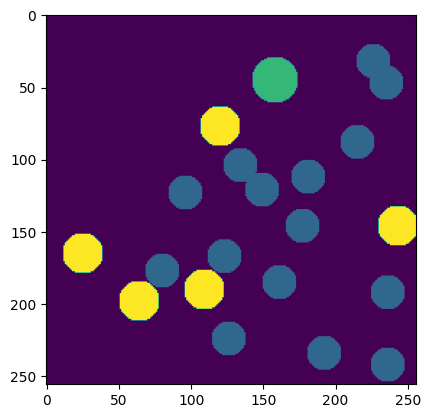

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 40, 53, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1159.0 bbox 256
fixed shape for a cell
(0, 181, 14, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1159.0 bbox 256
fixed shape for a cell
(0, 112, 17, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 186.9ms
Speed: 6.4ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  957.0 bbox 256
fixed shape for a cell
(103, 73, 126, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 187.4ms
Speed: 6.9ms preprocess, 187.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(90, 98, 116, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 187.9ms
Speed: 7.7ms preprocess, 187.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1159.0 bbox 256
fixed shape for a cell
(121, 42, 144, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 183.6ms
Speed: 6.6ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1159.0 bbox 256
fixed shape for a cell
(10, 7, 33, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 182.8ms
Speed: 6.7ms preprocess, 182.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1159.0 bbox 256
fixed shape for a cell
(224, 17, 247, 40)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 182.4ms
Speed: 7.2ms preprocess, 182.4ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1159.0 bbox 256
fixed shape for a cell
(175, 41, 198, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 180.5ms
Speed: 15.6ms preprocess, 180.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1159.0 bbox 256
fixed shape for a cell
(61, 188, 84, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 186.1ms
Speed: 6.5ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(26, 90, 57, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 187.9ms
Speed: 6.0ms preprocess, 187.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(211, 196, 242, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 184.0ms
Speed: 8.2ms preprocess, 184.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(65, 29, 107, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 182.7ms
Speed: 8.2ms preprocess, 182.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 101, 163, 139)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 182.1ms
Speed: 6.5ms preprocess, 182.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 161, 64, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 181.8ms
Speed: 7.2ms preprocess, 181.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(62, 128, 89, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 181.3ms
Speed: 6.8ms preprocess, 181.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(104, 150, 131, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(3, 61, 30, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 183.9ms
Speed: 7.9ms preprocess, 183.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 152, 75, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3007.png: 1024x1024 7 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 10.9ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(146, 68, 173, 95)
FINAL MASK!!!


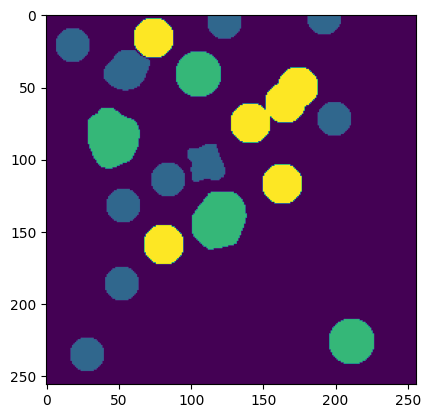

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 180.1ms
Speed: 7.9ms preprocess, 180.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(187, 143, 210, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(191, 173, 211, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 186, 143, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  942.0 bbox 256
fixed shape for a cell
(124, 62, 147, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 181.3ms
Speed: 6.5ms preprocess, 181.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 33, 96, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 110, 101, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(103, 112, 130, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 183.7ms
Speed: 8.5ms preprocess, 183.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 109, 164, 132)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 180.9ms
Speed: 9.7ms preprocess, 180.9ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 140, 159, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 184.3ms
Speed: 6.5ms preprocess, 184.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  825.0 bbox 256
fixed shape for a cell
(115, 233, 138, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 184.9ms
Speed: 7.7ms preprocess, 184.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 170, 245, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 186.5ms
Speed: 6.2ms preprocess, 186.5ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(46, 63, 77, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(213, 204, 236, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(56, 176, 88, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 185.0ms
Speed: 6.1ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 137, 47, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 181.9ms
Speed: 6.2ms preprocess, 181.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(148, 34, 179, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 186.8ms
Speed: 7.4ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 70, 203, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 182.1ms
Speed: 8.1ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(145, 207, 181, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(170, 165, 191, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 151, 117, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 217, 80, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(116, 212, 142, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 180.8ms
Speed: 8.1ms preprocess, 180.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(79, 65, 106, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(34, 103, 61, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3011.png: 1024x1024 23 objects, 189.7ms
Speed: 6.2ms preprocess, 189.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(199, 103, 226, 130)
FINAL MASK!!!


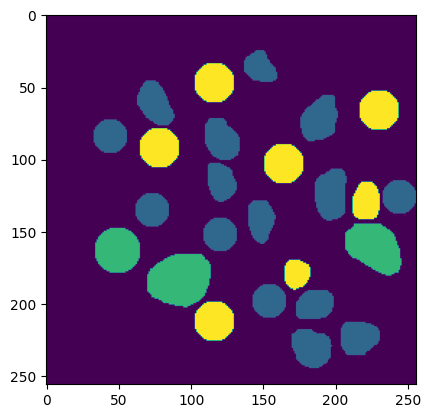

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(149, 33, 172, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 183.2ms
Speed: 8.4ms preprocess, 183.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1845.0 bbox 256
fixed shape for a cell
(71, 30, 94, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 188.6ms
Speed: 6.4ms preprocess, 188.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1845.0 bbox 256
fixed shape for a cell
(94, 20, 117, 43)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 185.8ms
Speed: 8.2ms preprocess, 185.8ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1309.0 bbox 256
fixed shape for a cell
(190, 9, 213, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 183.6ms
Speed: 6.7ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(1, 33, 34, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 181.9ms
Speed: 6.1ms preprocess, 181.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 67, 183, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 68, 56, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(61, 131, 84, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 186.8ms
Speed: 6.5ms preprocess, 186.8ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1845.0 bbox 256
fixed shape for a cell
(48, 32, 71, 55)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 184.6ms
Speed: 7.7ms preprocess, 184.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 75, 24, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 186.6ms
Speed: 9.4ms preprocess, 186.6ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(217, 178, 240, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 181.9ms
Speed: 11.4ms preprocess, 181.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(128, 141, 151, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(160, 173, 183, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 186.5ms
Speed: 9.7ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 212, 108, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 184.6ms
Speed: 6.6ms preprocess, 184.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(92, 194, 120, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(11, 117, 34, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 181.3ms
Speed: 6.4ms preprocess, 181.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(16, 222, 39, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(233, 228, 256, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 181.6ms
Speed: 7.9ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1118.0 bbox 256
fixed shape for a cell
(73, 56, 96, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 215, 195, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 149, 49, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 188.2ms
Speed: 7.6ms preprocess, 188.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(198, 120, 241, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(201, 234, 228, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 183.6ms
Speed: 6.1ms preprocess, 183.6ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 122, 112, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(210, 158, 233, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 180.9ms
Speed: 6.3ms preprocess, 180.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 122, 194, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3015.png: 1024x1024 12 objects, 187.5ms
Speed: 6.3ms preprocess, 187.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(72, 158, 99, 185)
FINAL MASK!!!


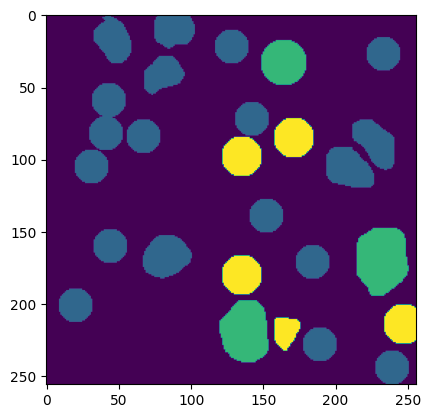

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 184.7ms
Speed: 6.2ms preprocess, 184.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(11, 149, 39, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 185.8ms
Speed: 8.6ms preprocess, 185.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(137, 227, 163, 255)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 184.5ms
Speed: 6.6ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(107, 189, 130, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 183.9ms
Speed: 11.0ms preprocess, 183.9ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(7, 119, 30, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(38, 176, 61, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(57, 170, 80, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 180.6ms
Speed: 6.2ms preprocess, 180.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(50, 140, 73, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 182.5ms
Speed: 6.7ms preprocess, 182.5ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(158, 156, 187, 185)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 184.1ms
Speed: 9.3ms preprocess, 184.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 140, 105, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 183.8ms
Speed: 9.4ms preprocess, 183.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(135, 0, 158, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 181.8ms
Speed: 7.2ms preprocess, 181.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(158, 53, 181, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 184.2ms
Speed: 6.8ms preprocess, 184.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(94, 102, 117, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 182.3ms
Speed: 8.9ms preprocess, 182.3ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 79, 153, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 183.9ms
Speed: 11.2ms preprocess, 183.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(191, 213, 214, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 186.3ms
Speed: 8.2ms preprocess, 186.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(149, 204, 172, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 187.4ms
Speed: 6.2ms preprocess, 187.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(40, 40, 63, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 187.3ms
Speed: 8.2ms preprocess, 187.3ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  937.0 bbox 256
fixed shape for a cell
(176, 191, 199, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 184.6ms
Speed: 6.0ms preprocess, 184.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(97, 41, 128, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 182.2ms
Speed: 8.2ms preprocess, 182.2ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(215, 164, 246, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 187.8ms
Speed: 6.5ms preprocess, 187.8ms inference, 7.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 149, 144, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 187.7ms
Speed: 6.3ms preprocess, 187.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(96, 166, 111, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 182.4ms
Speed: 7.1ms preprocess, 182.4ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 79, 109, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 183.5ms
Speed: 6.5ms preprocess, 183.5ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 79, 78, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 180.0ms
Speed: 7.4ms preprocess, 180.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(152, 133, 179, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3018.png: 1024x1024 7 objects, 184.0ms
Speed: 6.1ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(71, 197, 98, 224)
FINAL MASK!!!


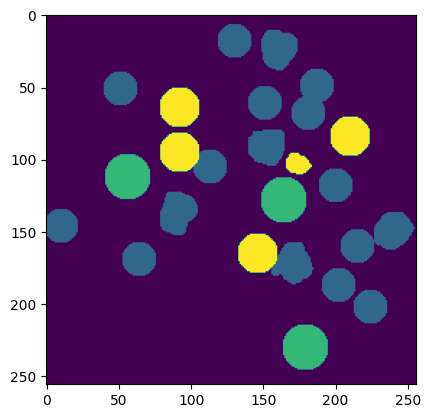

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 186.3ms
Speed: 6.2ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(24, 203, 47, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(204, 0, 227, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 182.1ms
Speed: 6.1ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 6, 173, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 185.0ms
Speed: 8.5ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 49, 163, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 186.6ms
Speed: 8.7ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 44, 185, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 184.1ms
Speed: 9.7ms preprocess, 184.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(53, 0, 76, 20)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 181.5ms
Speed: 6.7ms preprocess, 181.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(12, 0, 47, 16)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(3, 214, 26, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 186.8ms
Speed: 6.6ms preprocess, 186.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(49, 17, 58, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(240, 26, 256, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 129, 35, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 183.1ms
Speed: 6.5ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 99, 90, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 186.7ms
Speed: 7.0ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(38, 117, 61, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 188.0ms
Speed: 6.6ms preprocess, 188.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 161, 81, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 184.4ms
Speed: 9.5ms preprocess, 184.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 187, 109, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 185.1ms
Speed: 7.6ms preprocess, 185.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 227, 150, 250)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 224, 185, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 181.9ms
Speed: 6.5ms preprocess, 181.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(216, 202, 239, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 162, 218, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 189.6ms
Speed: 6.3ms preprocess, 189.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 75, 73, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 186.5ms
Speed: 6.1ms preprocess, 186.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 13, 144, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 184.3ms
Speed: 6.1ms preprocess, 184.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(141, 163, 172, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 44, 41, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(165, 136, 192, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 188.1ms
Speed: 8.6ms preprocess, 188.1ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 60, 110, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 189.3ms
Speed: 8.1ms preprocess, 189.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 91, 167, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 182.0ms
Speed: 6.7ms preprocess, 182.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 182, 79, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3019.png: 1024x1024 4 objects, 186.4ms
Speed: 9.1ms preprocess, 186.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(79, 133, 106, 160)
FINAL MASK!!!


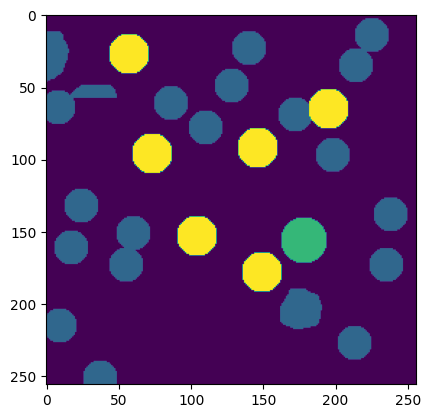

/content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 186.9ms
Speed: 6.5ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 64, 79, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 182.1ms
Speed: 7.0ms preprocess, 182.1ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 59, 54, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(18, 14, 41, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 185.0ms
Speed: 9.7ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(124, 170, 147, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 185.2ms
Speed: 6.3ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 105, 96, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 186.4ms
Speed: 10.0ms preprocess, 186.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 94, 43, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 186.5ms
Speed: 6.7ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 185, 72, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 185.8ms
Speed: 6.1ms preprocess, 185.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 146, 31, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 181.2ms
Speed: 6.5ms preprocess, 181.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 143, 113, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(121, 118, 148, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 187.8ms
Speed: 5.7ms preprocess, 187.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 179, 110, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 186.0ms
Speed: 6.5ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 19, 86, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-1__idx-3021.png: 1024x1024 4 objects, 187.7ms
Speed: 7.5ms preprocess, 187.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(0, 41, 21, 68)
FINAL MASK!!!


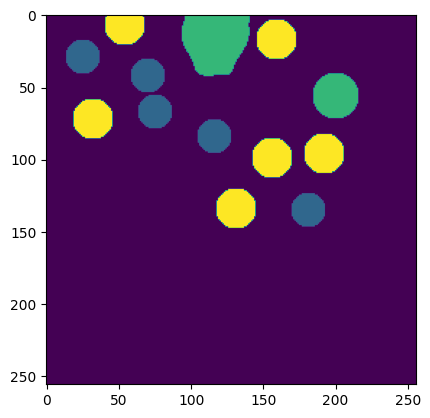

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 184.8ms
Speed: 6.4ms preprocess, 184.8ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  977.0 bbox 256
fixed shape for a cell
(140, 102, 163, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 185.8ms
Speed: 7.0ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(20, 241, 55, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 186.4ms
Speed: 6.7ms preprocess, 186.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(155, 217, 178, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(191, 205, 214, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 0, 165, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 181.1ms
Speed: 6.3ms preprocess, 181.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 0, 146, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 184.0ms
Speed: 6.4ms preprocess, 184.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1110.0 bbox 256
fixed shape for a cell
(122, 56, 145, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(122, 123, 155, 155)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 186.6ms
Speed: 6.6ms preprocess, 186.6ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1175.0 bbox 256
fixed shape for a cell
(106, 229, 129, 252)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 184.8ms
Speed: 10.5ms preprocess, 184.8ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(45, 0, 68, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 186.8ms
Speed: 9.0ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(7, 77, 30, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 181.3ms
Speed: 6.2ms preprocess, 181.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(21, 45, 44, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 88, 62, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(64, 40, 87, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 212, 98, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 188.9ms
Speed: 6.2ms preprocess, 188.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(175, 67, 222, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 187.2ms
Speed: 7.8ms preprocess, 187.2ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 153, 149, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 184.5ms
Speed: 6.5ms preprocess, 184.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 123, 86, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 181.1ms
Speed: 6.1ms preprocess, 181.1ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(14, 176, 55, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 184.5ms
Speed: 11.3ms preprocess, 184.5ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(73, 172, 100, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 183.8ms
Speed: 8.0ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 93, 107, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 183.3ms
Speed: 6.1ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(4, 107, 31, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3000.png: 1024x1024 14 objects, 184.0ms
Speed: 6.0ms preprocess, 184.0ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(83, 15, 110, 42)
FINAL MASK!!!


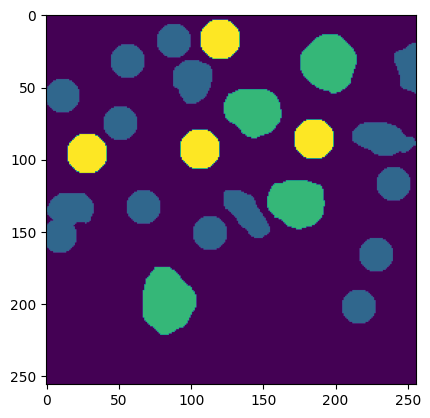

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 179.9ms
Speed: 9.4ms preprocess, 179.9ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(124, 66, 147, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 180.2ms
Speed: 11.1ms preprocess, 180.2ms inference, 7.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(165, 231, 188, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(219, 231, 242, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 181.3ms
Speed: 6.8ms preprocess, 181.3ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(81, 216, 104, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 183.0ms
Speed: 6.5ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1090.0 bbox 256
fixed shape for a cell
(54, 218, 77, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 227, 43, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(51, 100, 74, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(45, 63, 68, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 186.5ms
Speed: 7.6ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(66, 84, 89, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  977.0 bbox 256
fixed shape for a cell
(148, 77, 171, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 182.5ms
Speed: 6.6ms preprocess, 182.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1479.0 bbox 256
fixed shape for a cell
(184, 108, 207, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(158, 142, 181, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(191, 177, 214, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 183.8ms
Speed: 7.2ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(233, 161, 256, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 181.6ms
Speed: 8.0ms preprocess, 181.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1787.0 bbox 576
fixed shape for a cell
(98, 113, 129, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 181.7ms
Speed: 7.1ms preprocess, 181.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 146, 83, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(120, 172, 162, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3001.png: 1024x1024 8 objects, 186.2ms
Speed: 6.0ms preprocess, 186.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(11, 92, 38, 119)
FINAL MASK!!!


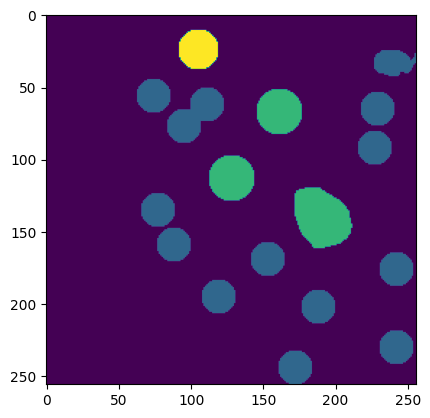

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(17, 95, 45, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 184.5ms
Speed: 8.1ms preprocess, 184.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(171, 185, 194, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(1, 70, 24, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 185.0ms
Speed: 6.5ms preprocess, 185.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(15, 48, 38, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 187.6ms
Speed: 7.9ms preprocess, 187.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(47, 43, 70, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  942.0 bbox 256
fixed shape for a cell
(79, 60, 102, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 187.7ms
Speed: 6.9ms preprocess, 187.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(169, 135, 192, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 190.5ms
Speed: 6.3ms preprocess, 190.5ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(92, 123, 115, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 181.1ms
Speed: 6.7ms preprocess, 181.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  844.0 bbox 256
fixed shape for a cell
(44, 129, 67, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 181.8ms
Speed: 6.7ms preprocess, 181.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(4, 158, 27, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 181.6ms
Speed: 6.4ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(41, 169, 64, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 184.3ms
Speed: 6.1ms preprocess, 184.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(31, 203, 54, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(87, 164, 110, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 181.0ms
Speed: 8.6ms preprocess, 181.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1105.0 bbox 256
fixed shape for a cell
(125, 213, 148, 236)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 183.4ms
Speed: 18.8ms preprocess, 183.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  827.0 bbox 256
fixed shape for a cell
(39, 73, 62, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 91, 147, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3002.png: 1024x1024 8 objects, 183.2ms
Speed: 6.3ms preprocess, 183.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(68, 197, 99, 228)
FINAL MASK!!!


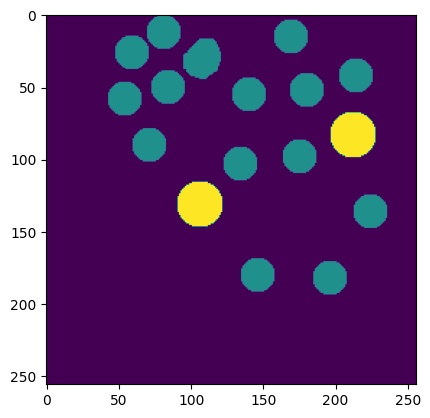

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1758.0 bbox 256
fixed shape for a cell
(139, 110, 162, 133)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 184.1ms
Speed: 6.1ms preprocess, 184.1ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(54, 18, 77, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 185.6ms
Speed: 6.4ms preprocess, 185.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(78, 28, 101, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 186.7ms
Speed: 8.9ms preprocess, 186.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(125, 195, 148, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 187.9ms
Speed: 6.2ms preprocess, 187.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(171, 48, 194, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(132, 66, 155, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 186.8ms
Speed: 5.9ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  901.0 bbox 256
fixed shape for a cell
(198, 143, 221, 166)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 182.8ms
Speed: 8.6ms preprocess, 182.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(227, 187, 250, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 181.8ms
Speed: 6.2ms preprocess, 181.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  962.0 bbox 256
fixed shape for a cell
(191, 212, 214, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 184.6ms
Speed: 6.3ms preprocess, 184.6ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(91, 184, 114, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 186.4ms
Speed: 6.7ms preprocess, 186.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  814.0 bbox 256
fixed shape for a cell
(32, 45, 55, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 185.4ms
Speed: 8.7ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  839.0 bbox 256
fixed shape for a cell
(79, 80, 102, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 185.8ms
Speed: 6.5ms preprocess, 185.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1037.0 bbox 256
fixed shape for a cell
(119, 30, 142, 53)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1062.0 bbox 256
fixed shape for a cell
(158, 182, 181, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 181.2ms
Speed: 6.4ms preprocess, 181.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(33, 196, 71, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 184.3ms
Speed: 6.4ms preprocess, 184.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 0, 55, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 188.9ms
Speed: 7.9ms preprocess, 188.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1806.0 bbox 576
fixed shape for a cell
(199, 76, 230, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 187.1ms
Speed: 6.2ms preprocess, 187.1ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(25, 138, 62, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1758.0 bbox 576
fixed shape for a cell
(108, 136, 139, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(130, 233, 157, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 181.2ms
Speed: 6.3ms preprocess, 181.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(63, 113, 90, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3005.png: 1024x1024 12 objects, 188.3ms
Speed: 7.1ms preprocess, 188.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(20, 94, 47, 121)
FINAL MASK!!!


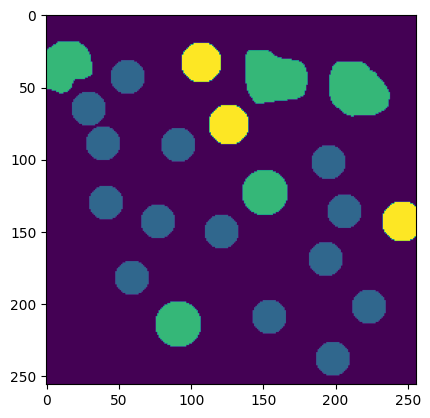

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(121, 9, 144, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 184.8ms
Speed: 8.3ms preprocess, 184.8ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(143, 139, 166, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 183.0ms
Speed: 6.3ms preprocess, 183.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(179, 135, 202, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 187.1ms
Speed: 8.2ms preprocess, 187.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(94, 170, 117, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(163, 0, 186, 18)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 185.3ms
Speed: 9.4ms preprocess, 185.3ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(181, 22, 204, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 181.7ms
Speed: 6.5ms preprocess, 181.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(107, 140, 130, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 185.9ms
Speed: 6.6ms preprocess, 185.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(115, 54, 138, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 182.9ms
Speed: 6.5ms preprocess, 182.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 88, 73, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 182.7ms
Speed: 6.6ms preprocess, 182.7ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(135, 86, 158, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 183.7ms
Speed: 9.5ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(201, 54, 224, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 181.5ms
Speed: 9.2ms preprocess, 181.5ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(83, 70, 114, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 183.8ms
Speed: 6.4ms preprocess, 183.8ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(41, 162, 74, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 188.4ms
Speed: 6.5ms preprocess, 188.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 83, 208, 114)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 25, 99, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 186.2ms
Speed: 7.9ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(78, 121, 105, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 133, 84, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3006.png: 1024x1024 6 objects, 189.9ms
Speed: 6.5ms preprocess, 189.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(29, 124, 56, 151)
FINAL MASK!!!


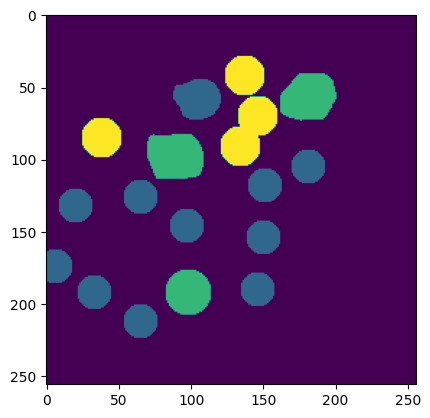

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(204, 137, 227, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(1, 60, 24, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(54, 95, 77, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 183.7ms
Speed: 7.1ms preprocess, 183.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(80, 206, 103, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 186.1ms
Speed: 6.6ms preprocess, 186.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(125, 206, 148, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 186.9ms
Speed: 6.5ms preprocess, 186.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(159, 189, 182, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 186.5ms
Speed: 6.7ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(92, 80, 115, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 187.4ms
Speed: 6.5ms preprocess, 187.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(149, 167, 172, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 186.5ms
Speed: 6.5ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(93, 13, 116, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 185.7ms
Speed: 6.2ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(170, 44, 193, 67)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1114.0 bbox 256
fixed shape for a cell
(158, 80, 181, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(77, 125, 100, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 185.0ms
Speed: 6.4ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  823.0 bbox 256
fixed shape for a cell
(166, 112, 189, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 186.3ms
Speed: 7.8ms preprocess, 186.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(39, 148, 72, 184)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 184.9ms
Speed: 6.7ms preprocess, 184.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 151, 137, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 48, 144, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 185.5ms
Speed: 8.4ms preprocess, 185.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(134, 0, 177, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3007.png: 1024x1024 6 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(61, 54, 85, 81)
FINAL MASK!!!


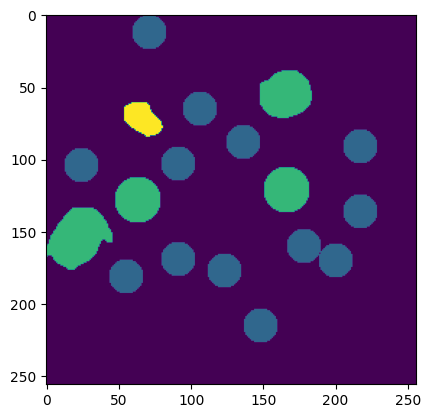

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 185.1ms
Speed: 6.3ms preprocess, 185.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(133, 93, 156, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 183.0ms
Speed: 6.7ms preprocess, 183.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(39, 203, 62, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 185.7ms
Speed: 7.1ms preprocess, 185.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(130, 206, 153, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 185.3ms
Speed: 6.3ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(149, 184, 172, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 184.9ms
Speed: 6.4ms preprocess, 184.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1091.0 bbox 256
fixed shape for a cell
(173, 137, 196, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 187.0ms
Speed: 9.0ms preprocess, 187.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(168, 86, 191, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(131, 63, 154, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 185.9ms
Speed: 6.2ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(150, 38, 173, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 179.9ms
Speed: 8.1ms preprocess, 179.9ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(199, 175, 221, 208)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 10.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(129, 125, 152, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 187.0ms
Speed: 6.6ms preprocess, 187.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(8, 123, 31, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 188.9ms
Speed: 6.3ms preprocess, 188.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(60, 84, 83, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 184.4ms
Speed: 6.0ms preprocess, 184.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  896.0 bbox 256
fixed shape for a cell
(32, 154, 55, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 185.9ms
Speed: 9.9ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(77, 173, 108, 204)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 186.8ms
Speed: 8.2ms preprocess, 186.8ms inference, 8.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 217, 119, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 183.8ms
Speed: 7.4ms preprocess, 183.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 114, 120, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3008.png: 1024x1024 6 objects, 185.4ms
Speed: 10.0ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(21, 65, 48, 92)
FINAL MASK!!!


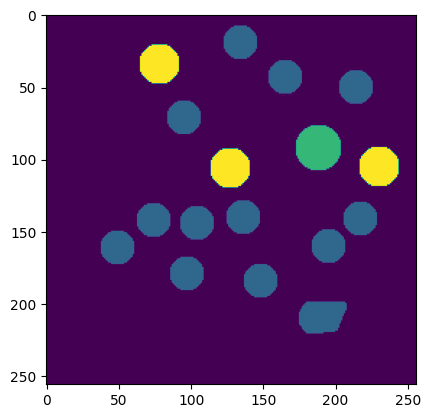

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1019.0 bbox 256
fixed shape for a cell
(72, 52, 95, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1019.0 bbox 256
fixed shape for a cell
(206, 170, 229, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1273.0 bbox 256
fixed shape for a cell
(216, 112, 239, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 181.5ms
Speed: 6.4ms preprocess, 181.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1070.0 bbox 256
fixed shape for a cell
(174, 118, 197, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 185.8ms
Speed: 6.5ms preprocess, 185.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1344.0 bbox 256
fixed shape for a cell
(146, 165, 169, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  855.0 bbox 256
fixed shape for a cell
(77, 139, 100, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 184.5ms
Speed: 6.8ms preprocess, 184.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  910.0 bbox 256
fixed shape for a cell
(29, 149, 52, 172)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 185.1ms
Speed: 6.2ms preprocess, 185.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(16, 100, 47, 131)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 185.2ms
Speed: 6.2ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(146, 79, 175, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 182.0ms
Speed: 6.4ms preprocess, 182.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  923.0 bbox 256
fixed shape for a cell
(116, 62, 139, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1072.0 bbox 256
fixed shape for a cell
(149, 14, 172, 37)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(91, 68, 111, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 180.9ms
Speed: 15.2ms preprocess, 180.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 203, 166, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 186.3ms
Speed: 6.4ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 32, 50, 75)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 186.7ms
Speed: 6.5ms preprocess, 186.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 196, 96, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 186.2ms
Speed: 7.5ms preprocess, 186.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 93, 78, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 51, 194, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3009.png: 1024x1024 14 objects, 187.4ms
Speed: 9.2ms preprocess, 187.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(107, 118, 134, 145)
FINAL MASK!!!


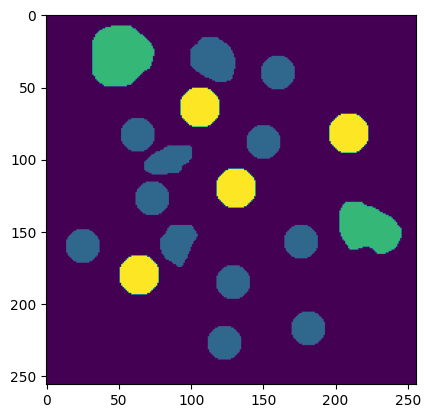

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(126, 147, 149, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 183.0ms
Speed: 7.1ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(23, 204, 46, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(44, 160, 67, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 186.2ms
Speed: 7.0ms preprocess, 186.2ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(238, 21, 256, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 181.0ms
Speed: 12.1ms preprocess, 181.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(166, 29, 189, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 185.2ms
Speed: 6.8ms preprocess, 185.2ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(129, 176, 152, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 186.1ms
Speed: 8.9ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(136, 48, 159, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(134, 79, 157, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 187.1ms
Speed: 8.7ms preprocess, 187.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(18, 66, 41, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 180.8ms
Speed: 11.6ms preprocess, 180.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(69, 195, 92, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 184.9ms
Speed: 11.7ms preprocess, 184.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(92, 176, 115, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 185.0ms
Speed: 9.8ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(95, 128, 118, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 186.4ms
Speed: 6.0ms preprocess, 186.4ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(85, 93, 108, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 184.5ms
Speed: 6.1ms preprocess, 184.5ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(86, 57, 109, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 185.4ms
Speed: 8.9ms preprocess, 185.4ms inference, 8.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(138, 2, 161, 25)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 182.4ms
Speed: 7.1ms preprocess, 182.4ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(196, 8, 219, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 186.1ms
Speed: 6.7ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(186, 59, 209, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(234, 85, 256, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(9, 224, 32, 247)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 183.3ms
Speed: 8.8ms preprocess, 183.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 256
fixed shape for a cell
(6, 146, 29, 169)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 185.8ms
Speed: 9.5ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(184, 123, 229, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3010.png: 1024x1024 1 object, 183.2ms
Speed: 6.6ms preprocess, 183.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1204.0 bbox 400
fixed shape for a cell
(211, 187, 238, 214)
FINAL MASK!!!


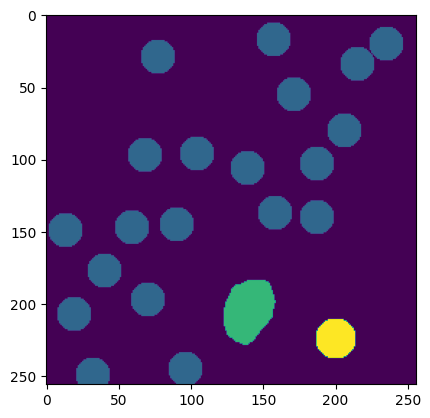

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 186.7ms
Speed: 6.4ms preprocess, 186.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(147, 73, 170, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 183.8ms
Speed: 8.3ms preprocess, 183.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(93, 236, 116, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 187.7ms
Speed: 6.1ms preprocess, 187.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(174, 51, 197, 74)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(174, 122, 197, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(141, 164, 164, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 183.8ms
Speed: 6.5ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(120, 154, 143, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 184.3ms
Speed: 6.1ms preprocess, 184.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(117, 128, 140, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 183.2ms
Speed: 6.6ms preprocess, 183.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(129, 92, 152, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 184.1ms
Speed: 6.2ms preprocess, 184.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(64, 0, 87, 15)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 181.4ms
Speed: 6.3ms preprocess, 181.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(11, 200, 34, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 186.1ms
Speed: 8.6ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(45, 212, 68, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 187.1ms
Speed: 6.1ms preprocess, 187.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(89, 183, 112, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 183.4ms
Speed: 6.2ms preprocess, 183.4ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 56, 111, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(73, 96, 97, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 185.1ms
Speed: 5.6ms preprocess, 185.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 256
fixed shape for a cell
(143, 122, 166, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 182.6ms
Speed: 10.8ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(41, 146, 84, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 222, 200, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 186.4ms
Speed: 6.3ms preprocess, 186.4ms inference, 7.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 197, 150, 244)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 185.3ms
Speed: 8.7ms preprocess, 185.3ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 33, 74, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(9, 0, 40, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 182.7ms
Speed: 6.8ms preprocess, 182.7ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 18, 126, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 181.8ms
Speed: 9.0ms preprocess, 181.8ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 400
fixed shape for a cell
(0, 152, 24, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 188.0ms
Speed: 12.4ms preprocess, 188.0ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 400
fixed shape for a cell
(62, 72, 89, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 400
fixed shape for a cell
(197, 186, 224, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 400
fixed shape for a cell
(205, 121, 232, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 400
fixed shape for a cell
(30, 73, 57, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3011.png: 1024x1024 5 objects, 186.0ms
Speed: 6.2ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1220.0 bbox 400
fixed shape for a cell
(32, 109, 59, 136)
FINAL MASK!!!


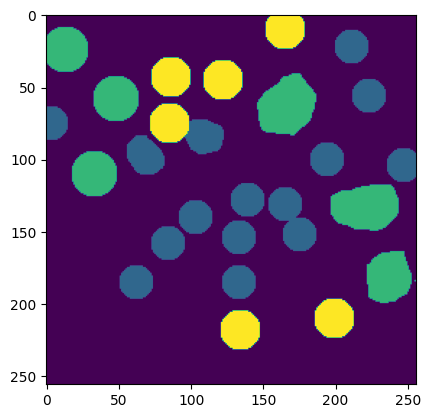

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 182.3ms
Speed: 10.2ms preprocess, 182.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  820.0 bbox 256
fixed shape for a cell
(143, 232, 166, 255)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 182.6ms
Speed: 7.6ms preprocess, 182.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  820.0 bbox 256
fixed shape for a cell
(113, 214, 136, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 183.2ms
Speed: 7.4ms preprocess, 183.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  820.0 bbox 256
fixed shape for a cell
(124, 188, 147, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 183.7ms
Speed: 6.1ms preprocess, 183.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  820.0 bbox 256
fixed shape for a cell
(125, 31, 148, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 181.8ms
Speed: 6.2ms preprocess, 181.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2041.0 bbox 256
fixed shape for a cell
(84, 29, 107, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 184.5ms
Speed: 6.6ms preprocess, 184.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2041.0 bbox 256
fixed shape for a cell
(56, 42, 79, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(87, 138, 115, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  820.0 bbox 256
fixed shape for a cell
(13, 78, 36, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 185.5ms
Speed: 6.7ms preprocess, 185.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  820.0 bbox 256
fixed shape for a cell
(103, 95, 126, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 188.2ms
Speed: 6.2ms preprocess, 188.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 137, 53, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(55, 91, 91, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 181.0ms
Speed: 6.7ms preprocess, 181.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 174, 178, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 187.5ms
Speed: 7.7ms preprocess, 187.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 105, 210, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 185.2ms
Speed: 8.5ms preprocess, 185.2ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(171, 202, 208, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 185.4ms
Speed: 7.1ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(201, 225, 242, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 181.3ms
Speed: 6.0ms preprocess, 181.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 63, 177, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 182.1ms
Speed: 7.8ms preprocess, 182.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 232, 126, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 187.3ms
Speed: 6.5ms preprocess, 187.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 173, 93, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 188.6ms
Speed: 6.7ms preprocess, 188.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 221, 84, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 185.4ms
Speed: 7.3ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 185, 39, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3012.png: 1024x1024 9 objects, 181.7ms
Speed: 6.7ms preprocess, 181.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(128, 135, 155, 162)
FINAL MASK!!!


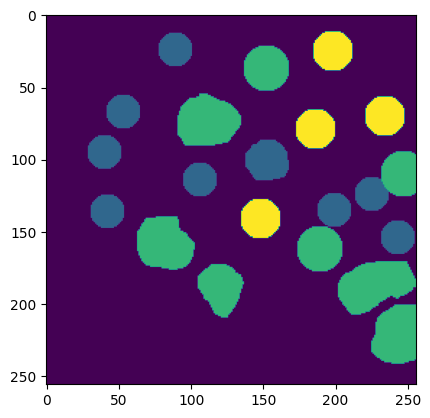

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 181.5ms
Speed: 8.1ms preprocess, 181.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(207, 178, 230, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(185, 223, 208, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 186.7ms
Speed: 6.8ms preprocess, 186.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(101, 57, 124, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 184.4ms
Speed: 6.9ms preprocess, 184.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(99, 6, 122, 29)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(203, 156, 226, 179)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 187.2ms
Speed: 9.3ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(129, 46, 167, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 190.3ms
Speed: 6.5ms preprocess, 190.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(64, 29, 87, 52)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 184.4ms
Speed: 7.1ms preprocess, 184.4ms inference, 9.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(40, 24, 63, 47)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 184.3ms
Speed: 10.3ms preprocess, 184.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(59, 101, 82, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 184.3ms
Speed: 7.3ms preprocess, 184.3ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(44, 128, 67, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 182.2ms
Speed: 7.3ms preprocess, 182.2ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(158, 159, 181, 182)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 183.9ms
Speed: 7.0ms preprocess, 183.9ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(36, 223, 59, 246)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 186.3ms
Speed: 7.0ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(9, 206, 32, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1158.0 bbox 256
fixed shape for a cell
(66, 154, 89, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 184.9ms
Speed: 9.1ms preprocess, 184.9ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 97, 194, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 186.4ms
Speed: 6.4ms preprocess, 186.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 72, 21, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 187.2ms
Speed: 6.5ms preprocess, 187.2ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 56, 254, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 185.0ms
Speed: 6.8ms preprocess, 185.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(69, 182, 100, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 182.5ms
Speed: 8.1ms preprocess, 182.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(177, 1, 208, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 186.0ms
Speed: 6.8ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(121, 194, 159, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 186.7ms
Speed: 6.6ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(207, 115, 249, 161)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 184.9ms
Speed: 7.7ms preprocess, 184.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(14, 51, 45, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 187.2ms
Speed: 6.3ms preprocess, 187.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 72, 109, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 188.9ms
Speed: 6.2ms preprocess, 188.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(6, 154, 33, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 185.9ms
Speed: 6.1ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(115, 99, 142, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(159, 204, 186, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3014.png: 1024x1024 4 objects, 185.3ms
Speed: 6.2ms preprocess, 185.3ms inference, 10.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(111, 127, 138, 154)
FINAL MASK!!!


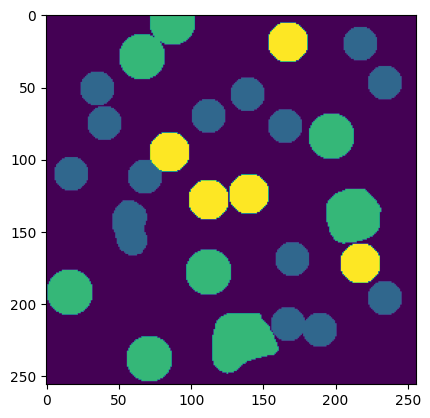

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(201, 106, 224, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(139, 125, 162, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 181.6ms
Speed: 6.6ms preprocess, 181.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(0, 68, 17, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 181.5ms
Speed: 6.2ms preprocess, 181.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(135, 35, 158, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 184.1ms
Speed: 7.1ms preprocess, 184.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(98, 76, 121, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 189.5ms
Speed: 7.5ms preprocess, 189.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(126, 87, 149, 110)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 186.5ms
Speed: 6.6ms preprocess, 186.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(173, 128, 196, 151)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 186.3ms
Speed: 6.5ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(205, 164, 228, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 185.6ms
Speed: 6.2ms preprocess, 185.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(73, 72, 96, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(86, 220, 109, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(73, 171, 96, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(126, 168, 149, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 184.6ms
Speed: 6.7ms preprocess, 184.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(89, 125, 112, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 181.5ms
Speed: 7.9ms preprocess, 181.5ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  972.0 bbox 256
fixed shape for a cell
(156, 189, 179, 212)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 180.8ms
Speed: 6.2ms preprocess, 180.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(108, 4, 139, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(45, 84, 76, 115)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 111, 58, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 187.3ms
Speed: 6.1ms preprocess, 187.3ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(34, 24, 75, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 184.2ms
Speed: 9.7ms preprocess, 184.2ms inference, 8.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(110, 221, 137, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 187.7ms
Speed: 9.1ms preprocess, 187.7ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(153, 223, 176, 243)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 186.7ms
Speed: 6.4ms preprocess, 186.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 71, 194, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3019.png: 1024x1024 4 objects, 186.0ms
Speed: 6.0ms preprocess, 186.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(78, 36, 105, 63)
FINAL MASK!!!


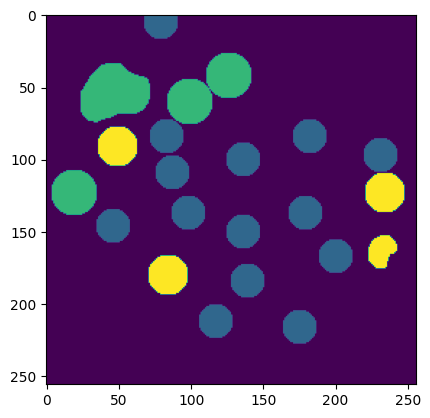

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 183.6ms
Speed: 6.3ms preprocess, 183.6ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(70, 135, 93, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 185.1ms
Speed: 6.1ms preprocess, 185.1ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(42, 131, 65, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 184.7ms
Speed: 8.9ms preprocess, 184.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(32, 177, 55, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 184.6ms
Speed: 9.6ms preprocess, 184.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(134, 164, 157, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 189.7ms
Speed: 6.2ms preprocess, 189.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(172, 175, 195, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 182.1ms
Speed: 10.6ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(116, 38, 139, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 184.5ms
Speed: 6.8ms preprocess, 184.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1025.0 bbox 256
fixed shape for a cell
(211, 214, 234, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 189.1ms
Speed: 7.6ms preprocess, 189.1ms inference, 9.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(38, 231, 61, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(151, 10, 174, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 187.1ms
Speed: 9.5ms preprocess, 187.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  788.0 bbox 256
fixed shape for a cell
(0, 50, 15, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 187.2ms
Speed: 8.6ms preprocess, 187.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 98, 27, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 187.9ms
Speed: 6.7ms preprocess, 187.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(35, 75, 66, 106)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(92, 78, 123, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 183.8ms
Speed: 6.2ms preprocess, 183.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(185, 64, 212, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 185.1ms
Speed: 6.5ms preprocess, 185.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(160, 110, 187, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 187.8ms
Speed: 9.6ms preprocess, 187.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(136, 67, 163, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 187.8ms
Speed: 6.1ms preprocess, 187.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 214, 107, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 188.4ms
Speed: 6.2ms preprocess, 188.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(146, 202, 181, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 185.3ms
Speed: 8.7ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 120, 141, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 187.0ms
Speed: 7.6ms preprocess, 187.0ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(95, 4, 122, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 184.8ms
Speed: 12.6ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 184, 92, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3023.png: 1024x1024 4 objects, 181.3ms
Speed: 6.2ms preprocess, 181.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(97, 149, 124, 176)
FINAL MASK!!!


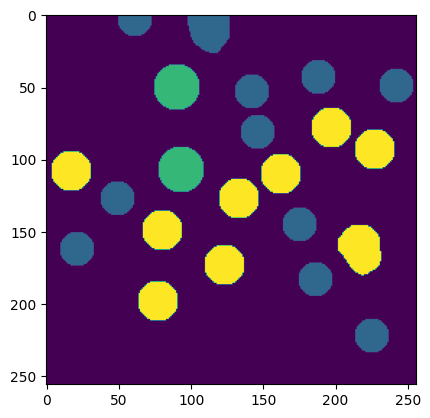

/content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 182.7ms
Speed: 6.5ms preprocess, 182.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(58, 234, 81, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 183.0ms
Speed: 9.5ms preprocess, 183.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  829.0 bbox 256
fixed shape for a cell
(5, 219, 28, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 184.0ms
Speed: 6.6ms preprocess, 184.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(106, 225, 129, 248)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 184.2ms
Speed: 9.4ms preprocess, 184.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 176, 143, 205)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 187.8ms
Speed: 6.5ms preprocess, 187.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 82, 179, 111)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 43, 74, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 186.7ms
Speed: 6.6ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(90, 61, 113, 84)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 182.5ms
Speed: 6.1ms preprocess, 182.5ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 15, 123, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 184.1ms
Speed: 6.1ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(146, 54, 169, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 181.7ms
Speed: 12.2ms preprocess, 181.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(12, 56, 35, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 183.8ms
Speed: 9.3ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(30, 149, 61, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 185.0ms
Speed: 5.9ms preprocess, 185.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(194, 58, 225, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 113, 26, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 183.6ms
Speed: 8.3ms preprocess, 183.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(36, 0, 67, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 107, 249, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 182.9ms
Speed: 8.8ms preprocess, 182.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 153, 182, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 184.9ms
Speed: 9.3ms preprocess, 184.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(135, 31, 162, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 181.9ms
Speed: 11.6ms preprocess, 181.9ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(107, 109, 134, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 185.0ms
Speed: 6.3ms preprocess, 185.0ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 91, 88, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 185.4ms
Speed: 6.3ms preprocess, 185.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 133, 92, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 187.5ms
Speed: 6.2ms preprocess, 187.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 193, 91, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 188.8ms
Speed: 6.5ms preprocess, 188.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(159, 222, 186, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 184.9ms
Speed: 6.5ms preprocess, 184.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(34, 90, 61, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(219, 199, 246, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-2__idx-3024.png: 1024x1024 5 objects, 184.9ms
Speed: 6.3ms preprocess, 184.9ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(181, 122, 208, 149)
FINAL MASK!!!


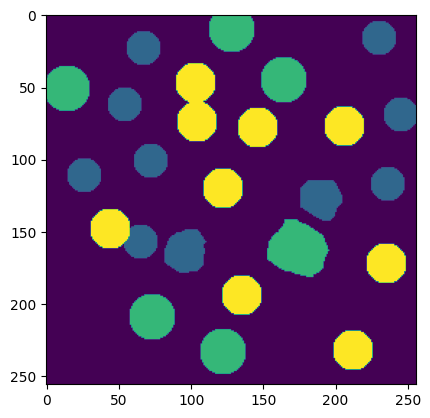

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 185.4ms
Speed: 6.2ms preprocess, 185.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(76, 38, 99, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(37, 196, 60, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 184.1ms
Speed: 6.6ms preprocess, 184.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(0, 188, 17, 211)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 187.7ms
Speed: 6.6ms preprocess, 187.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(22, 145, 45, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(51, 111, 74, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 184.6ms
Speed: 6.4ms preprocess, 184.6ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  952.0 bbox 256
fixed shape for a cell
(128, 56, 151, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 187.3ms
Speed: 6.3ms preprocess, 187.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1763.0 bbox 256
fixed shape for a cell
(195, 118, 218, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 184.5ms
Speed: 6.5ms preprocess, 184.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(148, 166, 176, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 185.5ms
Speed: 6.0ms preprocess, 185.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  919.0 bbox 256
fixed shape for a cell
(80, 80, 103, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1019.0 bbox 256
fixed shape for a cell
(190, 191, 213, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 183.6ms
Speed: 6.7ms preprocess, 183.6ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(146, 86, 177, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 182.7ms
Speed: 7.6ms preprocess, 182.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1763.0 bbox 576
fixed shape for a cell
(219, 107, 250, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(74, 187, 116, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 186.9ms
Speed: 6.0ms preprocess, 186.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 40, 249, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 187.3ms
Speed: 8.5ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(108, 109, 149, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 186.6ms
Speed: 6.2ms preprocess, 186.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 212, 172, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(166, 39, 197, 70)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 182.4ms
Speed: 7.4ms preprocess, 182.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 144, 116, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 156, 88, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3001.png: 1024x1024 9 objects, 189.6ms
Speed: 6.7ms preprocess, 189.6ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(119, 170, 146, 197)
FINAL MASK!!!


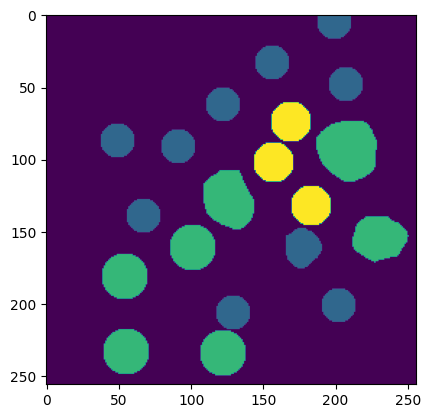

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 182.7ms
Speed: 7.0ms preprocess, 182.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  830.0 bbox 256
fixed shape for a cell
(231, 157, 254, 180)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 182.1ms
Speed: 7.9ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1128.0 bbox 256
fixed shape for a cell
(137, 195, 160, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 184.8ms
Speed: 6.1ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1128.0 bbox 256
fixed shape for a cell
(118, 152, 141, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 185.6ms
Speed: 6.6ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  791.0 bbox 256
fixed shape for a cell
(79, 216, 102, 239)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 195, 77, 222)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 185.4ms
Speed: 6.8ms preprocess, 185.4ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1128.0 bbox 256
fixed shape for a cell
(35, 153, 58, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 184.7ms
Speed: 6.4ms preprocess, 184.7ms inference, 9.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1219.0 bbox 256
fixed shape for a cell
(89, 117, 112, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 187.1ms
Speed: 6.7ms preprocess, 187.1ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  863.0 bbox 256
fixed shape for a cell
(166, 135, 189, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  844.0 bbox 256
fixed shape for a cell
(196, 115, 219, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 185.2ms
Speed: 6.5ms preprocess, 185.2ms inference, 10.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(21, 37, 51, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 183.2ms
Speed: 6.4ms preprocess, 183.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1128.0 bbox 256
fixed shape for a cell
(129, 104, 152, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 184.6ms
Speed: 6.0ms preprocess, 184.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1092.0 bbox 256
fixed shape for a cell
(103, 25, 126, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(72, 166, 121, 207)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 185.9ms
Speed: 8.8ms preprocess, 185.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(108, 63, 133, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 187.8ms
Speed: 6.7ms preprocess, 187.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 58, 92, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(23, 125, 41, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 189.1ms
Speed: 6.2ms preprocess, 189.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(108, 48, 155, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 187.7ms
Speed: 6.4ms preprocess, 187.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 16, 191, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(52, 22, 79, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3003.png: 1024x1024 27 objects, 184.6ms
Speed: 6.6ms preprocess, 184.6ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(30, 82, 62, 116)
FINAL MASK!!!


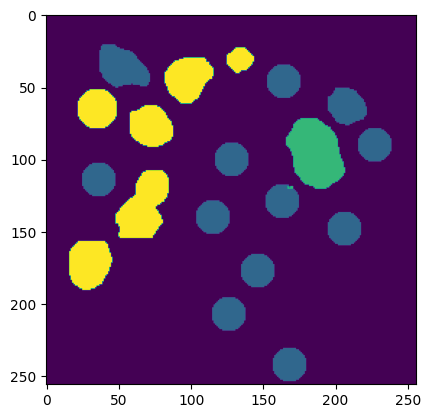

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 186.7ms
Speed: 6.1ms preprocess, 186.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 256
fixed shape for a cell
(36, 218, 59, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 256
fixed shape for a cell
(148, 152, 171, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 184.4ms
Speed: 8.6ms preprocess, 184.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  918.0 bbox 256
fixed shape for a cell
(55, 140, 78, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 185.2ms
Speed: 6.7ms preprocess, 185.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 113, 97, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 180.8ms
Speed: 6.3ms preprocess, 180.8ms inference, 8.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 256
fixed shape for a cell
(207, 144, 230, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 185.5ms
Speed: 7.1ms preprocess, 185.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 256
fixed shape for a cell
(181, 139, 204, 162)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 181.1ms
Speed: 6.3ms preprocess, 181.1ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  955.0 bbox 256
fixed shape for a cell
(173, 46, 196, 69)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 182.4ms
Speed: 7.3ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  946.0 bbox 256
fixed shape for a cell
(184, 3, 207, 26)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 256
fixed shape for a cell
(105, 154, 128, 177)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 186.6ms
Speed: 6.3ms preprocess, 186.6ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1230.0 bbox 256
fixed shape for a cell
(140, 207, 163, 230)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 185.1ms
Speed: 8.7ms preprocess, 185.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 256
fixed shape for a cell
(159, 78, 182, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 181.9ms
Speed: 7.0ms preprocess, 181.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(70, 66, 112, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 185.6ms
Speed: 6.3ms preprocess, 185.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(118, 37, 155, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 182.2ms
Speed: 8.9ms preprocess, 182.2ms inference, 8.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(220, 75, 256, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 183.9ms
Speed: 7.5ms preprocess, 183.9ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 400
fixed shape for a cell
(179, 172, 206, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 183.0ms
Speed: 6.1ms preprocess, 183.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 400
fixed shape for a cell
(64, 174, 91, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 183.7ms
Speed: 6.3ms preprocess, 183.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 400
fixed shape for a cell
(33, 90, 60, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3005.png: 1024x1024 9 objects, 182.4ms
Speed: 6.3ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1342.0 bbox 400
fixed shape for a cell
(61, 24, 88, 51)
4
FINAL MASK!!!


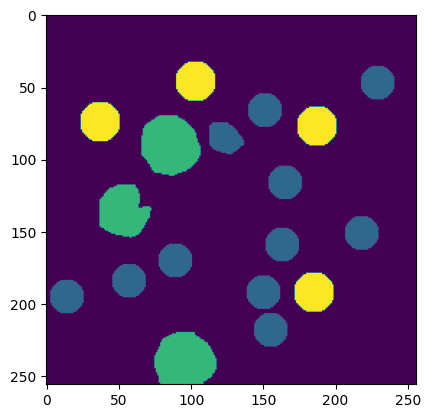

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 181.8ms
Speed: 6.3ms preprocess, 181.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 152, 136, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 185.2ms
Speed: 6.0ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 33, 194, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 184.6ms
Speed: 10.7ms preprocess, 184.6ms inference, 8.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 174, 60, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 189.3ms
Speed: 6.6ms preprocess, 189.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(171, 74, 194, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 185.3ms
Speed: 6.1ms preprocess, 185.3ms inference, 5.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(44, 94, 67, 117)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(41, 71, 64, 94)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 187.2ms
Speed: 6.2ms preprocess, 187.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(59, 46, 82, 69)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 184.8ms
Speed: 6.3ms preprocess, 184.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(149, 98, 172, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 182.1ms
Speed: 6.4ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 114, 150, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(176, 107, 211, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 186.5ms
Speed: 6.0ms preprocess, 186.5ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(51, 129, 82, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 183.3ms
Speed: 6.6ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(109, 91, 136, 118)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 185.2ms
Speed: 7.1ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(89, 186, 106, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 181.8ms
Speed: 6.5ms preprocess, 181.8ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 72, 121, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 184.4ms
Speed: 6.3ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(23, 31, 43, 51)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 13.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(94, 12, 121, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 184.5ms
Speed: 6.6ms preprocess, 184.5ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 169, 177, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3010.png: 1024x1024 6 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(100, 113, 127, 140)
4
FINAL MASK!!!


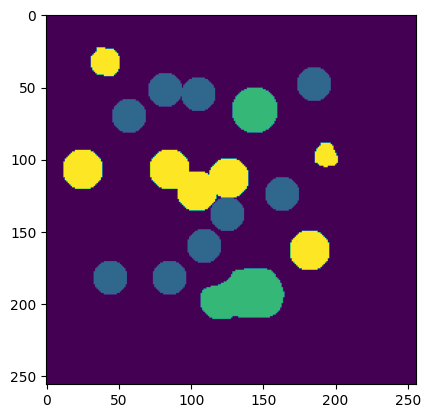

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 183.3ms
Speed: 6.5ms preprocess, 183.3ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(204, 39, 234, 69)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 184.8ms
Speed: 10.0ms preprocess, 184.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  905.0 bbox 256
fixed shape for a cell
(172, 62, 195, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 184.4ms
Speed: 6.4ms preprocess, 184.4ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  979.0 bbox 256
fixed shape for a cell
(197, 8, 220, 31)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 186.0ms
Speed: 6.6ms preprocess, 186.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  957.0 bbox 256
fixed shape for a cell
(155, 13, 178, 36)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 182.9ms
Speed: 6.4ms preprocess, 182.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  925.0 bbox 256
fixed shape for a cell
(103, 59, 126, 82)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1037.0 bbox 256
fixed shape for a cell
(98, 113, 121, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 185.2ms
Speed: 8.6ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  998.0 bbox 256
fixed shape for a cell
(123, 172, 146, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 183.2ms
Speed: 6.2ms preprocess, 183.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(140, 121, 162, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  905.0 bbox 256
fixed shape for a cell
(114, 0, 137, 22)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 183.6ms
Speed: 6.7ms preprocess, 183.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  905.0 bbox 256
fixed shape for a cell
(54, 34, 77, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 183.5ms
Speed: 6.2ms preprocess, 183.5ms inference, 7.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  905.0 bbox 256
fixed shape for a cell
(13, 21, 36, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 183.5ms
Speed: 7.0ms preprocess, 183.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(185, 99, 224, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 182.8ms
Speed: 9.3ms preprocess, 182.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(40, 74, 67, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 185.3ms
Speed: 9.1ms preprocess, 185.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(60, 115, 87, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 184.9ms
Speed: 8.1ms preprocess, 184.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(168, 195, 195, 222)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3011.png: 1024x1024 9 objects, 183.9ms
Speed: 6.2ms preprocess, 183.9ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(133, 205, 160, 232)
FINAL MASK!!!


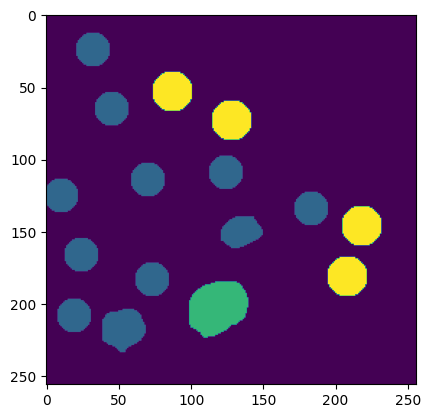

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 182.6ms
Speed: 6.2ms preprocess, 182.6ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 86, 60, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 186.7ms
Speed: 8.2ms preprocess, 186.7ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 180, 103, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 184.1ms
Speed: 6.4ms preprocess, 184.1ms inference, 7.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(55, 170, 78, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 186.0ms
Speed: 8.1ms preprocess, 186.0ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  898.0 bbox 256
fixed shape for a cell
(12, 194, 35, 217)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 184.4ms
Speed: 9.4ms preprocess, 184.4ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 94, 19, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1538.0 bbox 256
fixed shape for a cell
(164, 84, 187, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 183.3ms
Speed: 6.2ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 55, 79, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 181.0ms
Speed: 6.1ms preprocess, 181.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1538.0 bbox 256
fixed shape for a cell
(141, 96, 164, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 182.9ms
Speed: 6.8ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(169, 58, 192, 81)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 186.9ms
Speed: 5.9ms preprocess, 186.9ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 23, 156, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 185.3ms
Speed: 6.1ms preprocess, 185.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(164, 12, 191, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 185.4ms
Speed: 8.2ms preprocess, 185.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 0, 115, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 184.6ms
Speed: 6.2ms preprocess, 184.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 137, 45, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 185.8ms
Speed: 10.4ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(85, 81, 116, 112)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(31, 11, 62, 42)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 184.2ms
Speed: 8.4ms preprocess, 184.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 127, 113, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3012.png: 1024x1024 12 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(144, 189, 166, 216)
FINAL MASK!!!


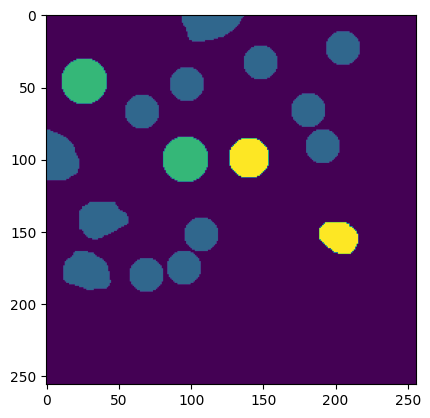

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 182.2ms
Speed: 6.3ms preprocess, 182.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  999.0 bbox 256
fixed shape for a cell
(30, 153, 53, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 181.8ms
Speed: 6.6ms preprocess, 181.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  999.0 bbox 256
fixed shape for a cell
(69, 144, 92, 167)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 183.5ms
Speed: 9.2ms preprocess, 183.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  999.0 bbox 256
fixed shape for a cell
(70, 186, 93, 209)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  999.0 bbox 256
fixed shape for a cell
(140, 120, 163, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 184.8ms
Speed: 6.7ms preprocess, 184.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  999.0 bbox 256
fixed shape for a cell
(127, 53, 150, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 186.4ms
Speed: 6.1ms preprocess, 186.4ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1233.0 bbox 256
fixed shape for a cell
(193, 22, 216, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 182.4ms
Speed: 7.0ms preprocess, 182.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  999.0 bbox 256
fixed shape for a cell
(43, 222, 66, 245)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 183.7ms
Speed: 9.2ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1844.0 bbox 576
fixed shape for a cell
(78, 91, 109, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 182.3ms
Speed: 6.3ms preprocess, 182.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(166, 68, 211, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3018.png: 1024x1024 5 objects, 183.7ms
Speed: 8.8ms preprocess, 183.7ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(112, 165, 139, 192)
FINAL MASK!!!


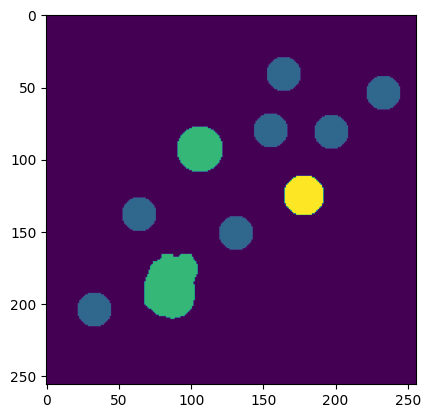

/content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 184.2ms
Speed: 6.1ms preprocess, 184.2ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  955.0 bbox 256
fixed shape for a cell
(155, 170, 178, 193)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 183.2ms
Speed: 6.0ms preprocess, 183.2ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1596.0 bbox 256
fixed shape for a cell
(226, 112, 249, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 187.5ms
Speed: 6.9ms preprocess, 187.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1596.0 bbox 256
fixed shape for a cell
(189, 100, 212, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 185.2ms
Speed: 7.5ms preprocess, 185.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  792.0 bbox 256
fixed shape for a cell
(202, 73, 225, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 186.5ms
Speed: 9.8ms preprocess, 186.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1136.0 bbox 256
fixed shape for a cell
(98, 11, 121, 34)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 187.1ms
Speed: 6.5ms preprocess, 187.1ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1601.0 bbox 256
fixed shape for a cell
(50, 113, 73, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 184.7ms
Speed: 6.4ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  783.0 bbox 256
fixed shape for a cell
(136, 228, 159, 251)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 182.3ms
Speed: 6.2ms preprocess, 182.3ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(237, 53, 256, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 186.2ms
Speed: 6.2ms preprocess, 186.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  851.0 bbox 256
fixed shape for a cell
(217, 21, 240, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 187.0ms
Speed: 6.2ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(52, 151, 98, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 184.6ms
Speed: 9.9ms preprocess, 184.6ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1601.0 bbox 256
fixed shape for a cell
(83, 135, 106, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 185.9ms
Speed: 6.3ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 97, 116, 128)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 186.7ms
Speed: 6.8ms preprocess, 186.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(50, 193, 73, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 188.1ms
Speed: 6.4ms preprocess, 188.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(29, 78, 59, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 183.4ms
Speed: 9.2ms preprocess, 183.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1170.0 bbox 256
fixed shape for a cell
(64, 48, 87, 71)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 182.1ms
Speed: 6.2ms preprocess, 182.1ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  846.0 bbox 256
fixed shape for a cell
(138, 125, 161, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 183.6ms
Speed: 7.4ms preprocess, 183.6ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 196, 124, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 182.6ms
Speed: 6.5ms preprocess, 182.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 143, 223, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 189.3ms
Speed: 8.0ms preprocess, 189.3ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1339.0 bbox 400
fixed shape for a cell
(138, 96, 165, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-3__idx-3019.png: 1024x1024 17 objects, 186.8ms
Speed: 6.3ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


mask generated by bbox
(169, 46, 190, 69)
4
FINAL MASK!!!


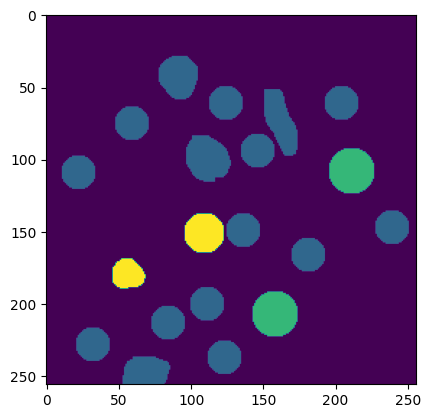

/content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 181.1ms
Speed: 6.1ms preprocess, 181.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 34, 195, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 185.7ms
Speed: 8.8ms preprocess, 185.7ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(218, 10, 241, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 183.4ms
Speed: 6.4ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(190, 9, 213, 32)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 185.9ms
Speed: 7.9ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(208, 163, 229, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 182.9ms
Speed: 8.2ms preprocess, 182.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 210, 84, 233)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 182.4ms
Speed: 6.2ms preprocess, 182.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(87, 205, 110, 228)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 184.2ms
Speed: 8.1ms preprocess, 184.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(64, 183, 87, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 186.1ms
Speed: 6.7ms preprocess, 186.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(28, 125, 51, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 186.1ms
Speed: 6.6ms preprocess, 186.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(120, 0, 143, 16)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 183.2ms
Speed: 8.2ms preprocess, 183.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(165, 132, 185, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 187.1ms
Speed: 6.4ms preprocess, 187.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 152, 179, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 185.6ms
Speed: 6.2ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(67, 108, 88, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 188.3ms
Speed: 6.5ms preprocess, 188.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(130, 167, 155, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 187.5ms
Speed: 8.2ms preprocess, 187.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(200, 37, 223, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 187.0ms
Speed: 9.4ms preprocess, 187.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(70, 30, 97, 57)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 187.7ms
Speed: 6.0ms preprocess, 187.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2096.0 bbox 400
fixed shape for a cell
(107, 113, 134, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 189.5ms
Speed: 6.3ms preprocess, 189.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(43, 77, 70, 104)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 185.7ms
Speed: 5.9ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(167, 86, 194, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 184.2ms
Speed: 10.1ms preprocess, 184.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(204, 96, 231, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 187.7ms
Speed: 9.1ms preprocess, 187.7ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 36, 154, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3001.png: 1024x1024 8 objects, 186.4ms
Speed: 6.5ms preprocess, 186.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(174, 228, 201, 255)
FINAL MASK!!!


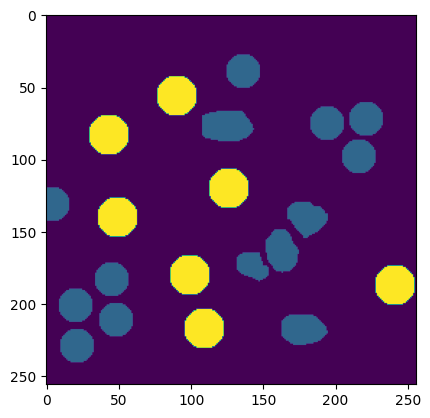

/content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 184.5ms
Speed: 6.3ms preprocess, 184.5ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  808.0 bbox 256
fixed shape for a cell
(32, 166, 55, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 183.5ms
Speed: 7.7ms preprocess, 183.5ms inference, 7.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(209, 136, 232, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 182.5ms
Speed: 6.3ms preprocess, 182.5ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(139, 100, 162, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 185.9ms
Speed: 6.8ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(160, 119, 180, 143)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 183.7ms
Speed: 6.2ms preprocess, 183.7ms inference, 5.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(146, 145, 169, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 187.9ms
Speed: 6.3ms preprocess, 187.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(105, 206, 128, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 187.9ms
Speed: 6.7ms preprocess, 187.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(47, 193, 62, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 183.7ms
Speed: 7.2ms preprocess, 183.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(10, 72, 32, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 187.6ms
Speed: 6.2ms preprocess, 187.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(22, 114, 45, 137)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 185.8ms
Speed: 6.1ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(37, 90, 60, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(194, 84, 217, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 136, 66, 159)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 188.0ms
Speed: 6.7ms preprocess, 188.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(68, 126, 104, 149)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 186.6ms
Speed: 6.4ms preprocess, 186.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(72, 63, 95, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 187.8ms
Speed: 7.6ms preprocess, 187.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(112, 67, 137, 95)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 184.4ms
Speed: 6.2ms preprocess, 184.4ms inference, 5.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 97, 138, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 187.3ms
Speed: 6.7ms preprocess, 187.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(124, 126, 151, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 187.4ms
Speed: 6.4ms preprocess, 187.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(56, 103, 79, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 188.1ms
Speed: 7.0ms preprocess, 188.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(186, 162, 235, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 183.9ms
Speed: 7.3ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(67, 171, 98, 202)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 184.2ms
Speed: 6.3ms preprocess, 184.2ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(132, 197, 159, 224)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 183.4ms
Speed: 6.9ms preprocess, 183.4ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(155, 74, 182, 101)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 184.2ms
Speed: 6.2ms preprocess, 184.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(171, 213, 187, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 188.2ms
Speed: 6.3ms preprocess, 188.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 226, 251, 253)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3004.png: 1024x1024 15 objects, 189.0ms
Speed: 6.3ms preprocess, 189.0ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(110, 148, 137, 175)
FINAL MASK!!!


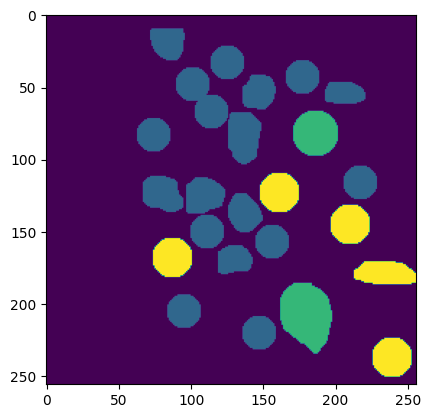

/content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 183.6ms
Speed: 6.4ms preprocess, 183.6ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(109, 195, 132, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 183.8ms
Speed: 7.1ms preprocess, 183.8ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2166.0 bbox 256
fixed shape for a cell
(207, 99, 230, 122)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(21, 191, 44, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  928.0 bbox 256
fixed shape for a cell
(215, 208, 238, 231)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 184.2ms
Speed: 6.4ms preprocess, 184.2ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(183, 170, 204, 197)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 184.0ms
Speed: 9.0ms preprocess, 184.0ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(111, 204, 134, 227)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 184.0ms
Speed: 6.2ms preprocess, 184.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(99, 173, 122, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 189.9ms
Speed: 6.3ms preprocess, 189.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(150, 155, 173, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 183.0ms
Speed: 6.2ms preprocess, 183.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(224, 30, 256, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 182.7ms
Speed: 6.2ms preprocess, 182.7ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  887.0 bbox 256
fixed shape for a cell
(117, 155, 140, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 184.8ms
Speed: 7.8ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(75, 72, 109, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 182.3ms
Speed: 7.0ms preprocess, 182.3ms inference, 5.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(45, 103, 68, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 185.5ms
Speed: 6.4ms preprocess, 185.5ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(19, 126, 45, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 186.3ms
Speed: 10.2ms preprocess, 186.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(110, 0, 133, 18)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 183.3ms
Speed: 9.0ms preprocess, 183.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(36, 18, 59, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  969.0 bbox 256
fixed shape for a cell
(18, 158, 41, 181)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 185.3ms
Speed: 6.6ms preprocess, 185.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(71, 101, 110, 124)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(236, 7, 256, 28)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 181.9ms
Speed: 6.4ms preprocess, 181.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 0, 31, 38)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 189.0ms
Speed: 6.3ms preprocess, 189.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2166.0 bbox 576
fixed shape for a cell
(184, 115, 215, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 185.4ms
Speed: 6.5ms preprocess, 185.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(225, 62, 252, 89)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 183.5ms
Speed: 7.0ms preprocess, 183.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(229, 129, 256, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 182.3ms
Speed: 6.4ms preprocess, 182.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(237, 172, 256, 199)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 185.6ms
Speed: 7.3ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(54, 171, 81, 198)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 187.8ms
Speed: 6.5ms preprocess, 187.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(65, 33, 92, 60)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(192, 12, 219, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 181.3ms
Speed: 6.6ms preprocess, 181.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(143, 70, 170, 97)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(125, 113, 152, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 183.8ms
Speed: 6.3ms preprocess, 183.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1661.0 bbox 400
fixed shape for a cell
(166, 213, 193, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 187.5ms
Speed: 6.8ms preprocess, 187.5ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(154, 19, 181, 46)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3005.png: 1024x1024 13 objects, 187.8ms
Speed: 8.4ms preprocess, 187.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(216, 166, 243, 193)
FINAL MASK!!!


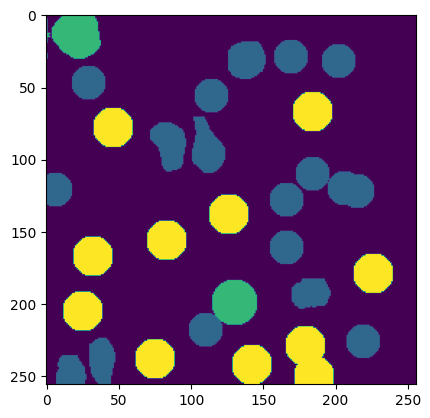

/content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 188.0ms
Speed: 6.2ms preprocess, 188.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(32, 217, 57, 241)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 184.8ms
Speed: 6.7ms preprocess, 184.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(195, 119, 218, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 187.5ms
Speed: 6.1ms preprocess, 187.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(163, 56, 186, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 186.9ms
Speed: 7.9ms preprocess, 186.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(128, 18, 151, 41)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 186.0ms
Speed: 9.1ms preprocess, 186.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(127, 36, 150, 59)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 185.8ms
Speed: 6.2ms preprocess, 185.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 0, 37, 27)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 186.9ms
Speed: 7.5ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  824.0 bbox 256
fixed shape for a cell
(52, 38, 75, 61)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 186.6ms
Speed: 6.5ms preprocess, 186.6ms inference, 7.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(168, 138, 196, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 184.4ms
Speed: 8.4ms preprocess, 184.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(79, 57, 101, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 187.8ms
Speed: 6.3ms preprocess, 187.8ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 145, 38, 174)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 186.6ms
Speed: 8.4ms preprocess, 186.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(196, 202, 228, 229)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 184.9ms
Speed: 6.2ms preprocess, 184.9ms inference, 8.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 186, 204, 215)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 181.7ms
Speed: 6.2ms preprocess, 181.7ms inference, 7.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(116, 154, 141, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 183.1ms
Speed: 6.7ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(149, 168, 178, 203)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 183.7ms
Speed: 6.4ms preprocess, 183.7ms inference, 7.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(114, 210, 137, 233)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 184.7ms
Speed: 9.5ms preprocess, 184.7ms inference, 7.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(49, 90, 72, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 182.0ms
Speed: 9.1ms preprocess, 182.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(205, 152, 228, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 182.7ms
Speed: 6.4ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1864.0 bbox 400
fixed shape for a cell
(88, 123, 115, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 185.7ms
Speed: 10.8ms preprocess, 185.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(147, 120, 174, 147)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3006.png: 1024x1024 14 objects, 183.4ms
Speed: 9.5ms preprocess, 183.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(155, 234, 182, 256)
4
FINAL MASK!!!


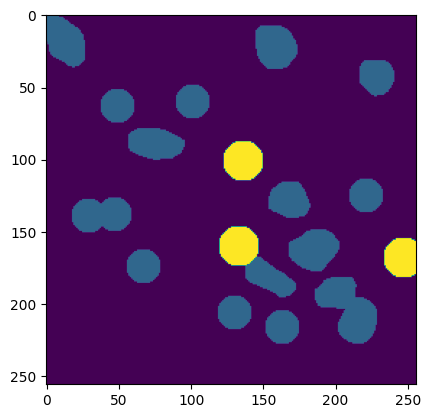

/content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 188.6ms
Speed: 6.3ms preprocess, 188.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(54, 62, 79, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 184.9ms
Speed: 8.5ms preprocess, 184.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  988.0 bbox 256
fixed shape for a cell
(162, 50, 185, 73)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 186.8ms
Speed: 6.6ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(123, 83, 150, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 185.1ms
Speed: 6.1ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  970.0 bbox 256
fixed shape for a cell
(130, 168, 153, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 183.8ms
Speed: 8.7ms preprocess, 183.8ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  988.0 bbox 256
fixed shape for a cell
(229, 35, 252, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  988.0 bbox 256
fixed shape for a cell
(44, 217, 67, 240)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 187.5ms
Speed: 5.6ms preprocess, 187.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  897.0 bbox 256
fixed shape for a cell
(55, 166, 78, 189)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 158, 28, 183)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 188.0ms
Speed: 9.4ms preprocess, 188.0ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(115, 58, 141, 79)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(157, 86, 196, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 185.7ms
Speed: 6.1ms preprocess, 185.7ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(82, 82, 109, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 185.7ms
Speed: 6.3ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(173, 135, 193, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 181.2ms
Speed: 6.2ms preprocess, 181.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(76, 193, 103, 220)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 182.7ms
Speed: 6.9ms preprocess, 182.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(93, 137, 120, 164)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 181.9ms
Speed: 6.1ms preprocess, 181.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(48, 111, 75, 138)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 185.3ms
Speed: 6.4ms preprocess, 185.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(66, 18, 93, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(207, 143, 234, 170)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-4__idx-3009.png: 1024x1024 11 objects, 186.9ms
Speed: 7.2ms preprocess, 186.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(171, 219, 198, 246)
FINAL MASK!!!


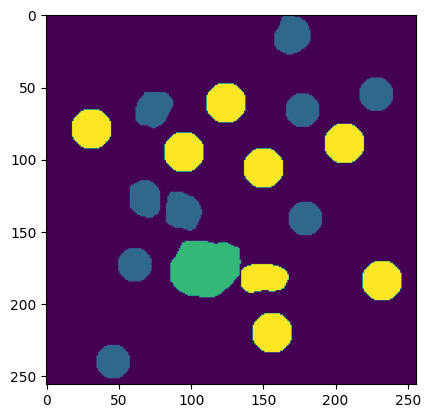

/content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 256
fixed shape for a cell
(51, 55, 74, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 180.9ms
Speed: 6.3ms preprocess, 180.9ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1081.0 bbox 256
fixed shape for a cell
(124, 21, 147, 44)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 182.8ms
Speed: 6.4ms preprocess, 182.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1592.0 bbox 256
fixed shape for a cell
(138, 85, 161, 108)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 181.2ms
Speed: 6.1ms preprocess, 181.2ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 256
fixed shape for a cell
(194, 60, 217, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 181.4ms
Speed: 6.2ms preprocess, 181.4ms inference, 11.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1141.0 bbox 256
fixed shape for a cell
(175, 7, 198, 30)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 185.9ms
Speed: 6.4ms preprocess, 185.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 256
fixed shape for a cell
(85, 96, 108, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 184.3ms
Speed: 8.1ms preprocess, 184.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 256
fixed shape for a cell
(48, 119, 71, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 186.9ms
Speed: 6.3ms preprocess, 186.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 256
fixed shape for a cell
(65, 153, 88, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 185.0ms
Speed: 10.3ms preprocess, 185.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 256
fixed shape for a cell
(41, 168, 64, 191)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 185.7ms
Speed: 6.0ms preprocess, 185.7ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(84, 39, 108, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 186.4ms
Speed: 7.4ms preprocess, 186.4ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 400
fixed shape for a cell
(145, 127, 172, 154)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3001.png: 1024x1024 9 objects, 182.1ms
Speed: 9.2ms preprocess, 182.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)


obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1291.0 bbox 400
fixed shape for a cell
(107, 133, 134, 160)
FINAL MASK!!!


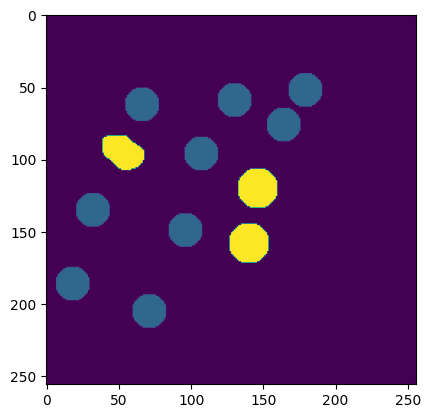

/content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 180.3ms
Speed: 7.0ms preprocess, 180.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(116, 62, 139, 85)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 184.1ms
Speed: 10.0ms preprocess, 184.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(172, 145, 195, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 184.3ms
Speed: 6.6ms preprocess, 184.3ms inference, 5.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(144, 125, 167, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 183.5ms
Speed: 6.4ms preprocess, 183.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(142, 169, 165, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 183.3ms
Speed: 6.9ms preprocess, 183.3ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(31, 116, 58, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 180.6ms
Speed: 6.3ms preprocess, 180.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1335.0 bbox 256
fixed shape for a cell
(69, 122, 92, 145)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 182.5ms
Speed: 6.4ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 198, 103, 221)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 180.8ms
Speed: 6.2ms preprocess, 180.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(211, 86, 234, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 186.8ms
Speed: 6.2ms preprocess, 186.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(102, 112, 125, 135)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 182.8ms
Speed: 6.2ms preprocess, 182.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(124, 226, 147, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 182.3ms
Speed: 7.3ms preprocess, 182.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(190, 211, 228, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 185.2ms
Speed: 6.4ms preprocess, 185.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(228, 61, 256, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 182.7ms
Speed: 6.2ms preprocess, 182.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(137, 22, 164, 49)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 186.0ms
Speed: 7.7ms preprocess, 186.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 73, 183, 100)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 183.1ms
Speed: 8.1ms preprocess, 183.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(182, 114, 209, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(211, 167, 238, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(181, 6, 208, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3002.png: 1024x1024 7 objects, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(171, 57, 198, 84)
FINAL MASK!!!


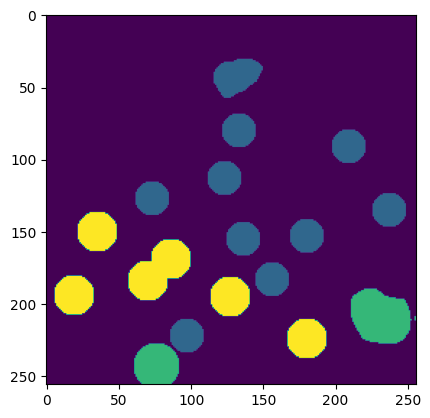

/content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 186.3ms
Speed: 6.3ms preprocess, 186.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  790.0 bbox 256
fixed shape for a cell
(48, 102, 71, 125)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 182.5ms
Speed: 6.2ms preprocess, 182.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(142, 64, 169, 96)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 180.3ms
Speed: 6.7ms preprocess, 180.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(78, 13, 105, 39)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 182.2ms
Speed: 8.2ms preprocess, 182.2ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(46, 135, 69, 158)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 184.5ms
Speed: 6.2ms preprocess, 184.5ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1006.0 bbox 256
fixed shape for a cell
(34, 55, 57, 78)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 185.0ms
Speed: 7.7ms preprocess, 185.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(8, 87, 32, 116)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 189.1ms
Speed: 6.2ms preprocess, 189.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(27, 163, 50, 186)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 183.9ms
Speed: 9.1ms preprocess, 183.9ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(202, 0, 233, 33)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 185.7ms
Speed: 6.4ms preprocess, 185.7ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 153, 14, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 187.7ms
Speed: 7.5ms preprocess, 187.7ms inference, 6.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(229, 148, 249, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 185.8ms
Speed: 6.3ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(224, 193, 247, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 186.1ms
Speed: 6.4ms preprocess, 186.1ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(57, 204, 93, 225)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 185.7ms
Speed: 8.2ms preprocess, 185.7ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(111, 167, 144, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 185.1ms
Speed: 6.4ms preprocess, 185.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(182, 142, 209, 175)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 187.9ms
Speed: 6.1ms preprocess, 187.9ms inference, 6.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1006.0 bbox 256
fixed shape for a cell
(20, 69, 43, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 182.8ms
Speed: 6.3ms preprocess, 182.8ms inference, 8.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(150, 173, 173, 196)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 182.6ms
Speed: 6.3ms preprocess, 182.6ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(63, 44, 100, 80)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 182.3ms
Speed: 6.1ms preprocess, 182.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(105, 206, 148, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 186.4ms
Speed: 6.7ms preprocess, 186.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 23, 157, 66)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 187.0ms
Speed: 6.3ms preprocess, 187.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(109, 88, 149, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 184.8ms
Speed: 6.2ms preprocess, 184.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(183, 41, 210, 68)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 182.3ms
Speed: 5.9ms preprocess, 182.3ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(212, 59, 239, 86)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(7, 205, 34, 232)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 189.1ms
Speed: 6.2ms preprocess, 189.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 138, 110, 165)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 183.1ms
Speed: 6.7ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(195, 111, 208, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3005.png: 1024x1024 18 objects, 181.6ms
Speed: 6.8ms preprocess, 181.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(168, 209, 195, 236)
FINAL MASK!!!


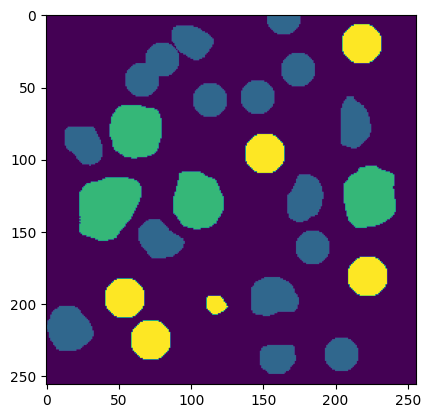

/content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 181.4ms
Speed: 6.6ms preprocess, 181.4ms inference, 8.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1142.0 bbox 256
fixed shape for a cell
(64, 153, 87, 176)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 182.7ms
Speed: 6.3ms preprocess, 182.7ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(0, 107, 22, 130)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 181.5ms
Speed: 6.3ms preprocess, 181.5ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(53, 207, 85, 238)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 185.7ms
Speed: 7.0ms preprocess, 185.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(133, 162, 153, 194)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 183.1ms
Speed: 6.2ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 80, 146, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 185.0ms
Speed: 6.2ms preprocess, 185.0ms inference, 11.0ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(112, 190, 135, 213)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 183.3ms
Speed: 8.6ms preprocess, 183.3ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(139, 223, 168, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 182.6ms
Speed: 8.7ms preprocess, 182.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(20, 68, 43, 91)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 186.7ms
Speed: 6.4ms preprocess, 186.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(228, 121, 255, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 185.8ms
Speed: 6.4ms preprocess, 185.8ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(61, 33, 84, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 183.3ms
Speed: 6.5ms preprocess, 183.3ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  794.0 bbox 256
fixed shape for a cell
(117, 0, 140, 21)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 187.6ms
Speed: 6.7ms preprocess, 187.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 25, 212, 48)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 182.9ms
Speed: 7.3ms preprocess, 182.9ms inference, 7.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(42, 111, 76, 140)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(189, 78, 220, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 184.0ms
Speed: 13.6ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(89, 92, 116, 119)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 189.1ms
Speed: 6.1ms preprocess, 189.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(47, 71, 74, 98)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 188.8ms
Speed: 6.4ms preprocess, 188.8ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(151, 100, 178, 127)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 187.1ms
Speed: 6.6ms preprocess, 187.1ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(156, 27, 183, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 187.4ms
Speed: 8.8ms preprocess, 187.4ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(100, 115, 127, 142)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 188.2ms
Speed: 6.7ms preprocess, 188.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(143, 197, 156, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-5__idx-3006.png: 1024x1024 9 objects, 187.0ms
Speed: 8.6ms preprocess, 187.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(143, 138, 170, 165)
FINAL MASK!!!


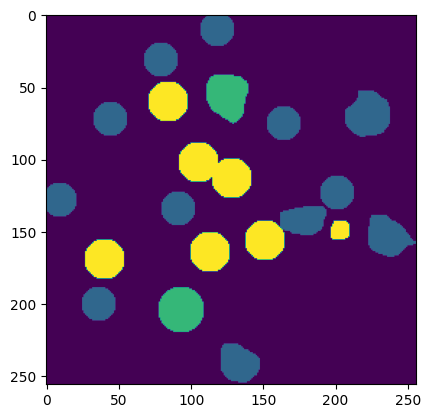

/content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 181.8ms
Speed: 6.4ms preprocess, 181.8ms inference, 6.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(217, 219, 240, 242)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 182.5ms
Speed: 6.6ms preprocess, 182.5ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(154, 212, 177, 235)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 182.2ms
Speed: 6.1ms preprocess, 182.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(128, 12, 151, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 182.2ms
Speed: 13.8ms preprocess, 182.2ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(153, 133, 176, 156)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 183.3ms
Speed: 6.4ms preprocess, 183.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(176, 33, 199, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 183.0ms
Speed: 6.4ms preprocess, 183.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  893.0 bbox 256
fixed shape for a cell
(78, 70, 101, 93)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 186.0ms
Speed: 6.4ms preprocess, 186.0ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(96, 42, 119, 65)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 184.3ms
Speed: 6.0ms preprocess, 184.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(113, 122, 142, 150)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 184.7ms
Speed: 6.3ms preprocess, 184.7ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(19, 145, 42, 168)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 186.1ms
Speed: 6.2ms preprocess, 186.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(69, 203, 92, 226)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 183.6ms
Speed: 6.4ms preprocess, 183.6ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(136, 165, 159, 188)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 189.0ms
Speed: 6.5ms preprocess, 189.0ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1553.0 bbox 256
fixed shape for a cell
(132, 84, 155, 107)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 186.0ms
Speed: 6.3ms preprocess, 186.0ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1553.0 bbox 256
fixed shape for a cell
(153, 65, 176, 88)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 184.2ms
Speed: 8.3ms preprocess, 184.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(192, 118, 215, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 187.9ms
Speed: 6.4ms preprocess, 187.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(184, 237, 207, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 185.9ms
Speed: 7.2ms preprocess, 185.9ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  904.0 bbox 256
fixed shape for a cell
(92, 155, 115, 178)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 182.1ms
Speed: 6.3ms preprocess, 182.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(223, 36, 250, 63)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 183.1ms
Speed: 6.3ms preprocess, 183.1ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(191, 183, 218, 210)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 187.7ms
Speed: 6.9ms preprocess, 187.7ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(113, 230, 140, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3002.png: 1024x1024 6 objects, 187.7ms
Speed: 6.6ms preprocess, 187.7ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(117, 187, 144, 214)
4
4
4
4
FINAL MASK!!!


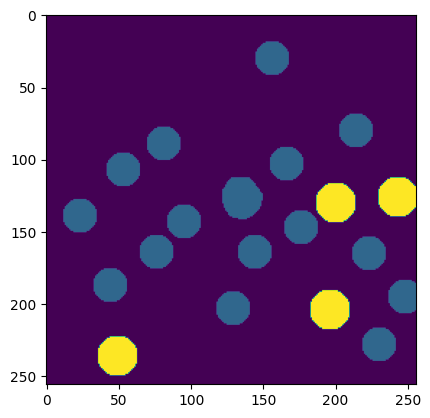

/content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 182.8ms
Speed: 6.5ms preprocess, 182.8ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  826.0 bbox 256
fixed shape for a cell
(109, 191, 132, 214)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 188.5ms
Speed: 6.9ms preprocess, 188.5ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  815.0 bbox 256
fixed shape for a cell
(38, 183, 61, 206)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 183.4ms
Speed: 6.3ms preprocess, 183.4ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  826.0 bbox 256
fixed shape for a cell
(40, 90, 63, 113)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 183.8ms
Speed: 8.8ms preprocess, 183.8ms inference, 6.8ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  826.0 bbox 256
fixed shape for a cell
(129, 69, 152, 92)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 187.0ms
Speed: 9.8ms preprocess, 187.0ms inference, 4.1ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  826.0 bbox 256
fixed shape for a cell
(192, 169, 215, 192)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 187.3ms
Speed: 6.2ms preprocess, 187.3ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1236.0 bbox 256
fixed shape for a cell
(193, 226, 216, 249)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 187.4ms
Speed: 6.3ms preprocess, 187.4ms inference, 9.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  826.0 bbox 256
fixed shape for a cell
(14, 79, 37, 102)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 185.1ms
Speed: 5.9ms preprocess, 185.1ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  941.0 bbox 256
fixed shape for a cell
(7, 121, 30, 144)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 182.9ms
Speed: 6.3ms preprocess, 182.9ms inference, 5.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  826.0 bbox 256
fixed shape for a cell
(126, 1, 149, 24)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 185.9ms
Speed: 9.2ms preprocess, 185.9ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(151, 100, 201, 141)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 186.8ms
Speed: 8.4ms preprocess, 186.8ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(176, 29, 203, 56)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 187.0ms
Speed: 6.0ms preprocess, 187.0ms inference, 6.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(123, 210, 150, 237)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 182.0ms
Speed: 11.2ms preprocess, 182.0ms inference, 6.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(105, 241, 126, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 187.0ms
Speed: 7.2ms preprocess, 187.0ms inference, 8.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(140, 49, 167, 76)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 184.4ms
Speed: 6.1ms preprocess, 184.4ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(83, 94, 110, 121)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-6__idx-3003.png: 1024x1024 8 objects, 185.1ms
Speed: 6.5ms preprocess, 185.1ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(3, 171, 30, 198)
FINAL MASK!!!


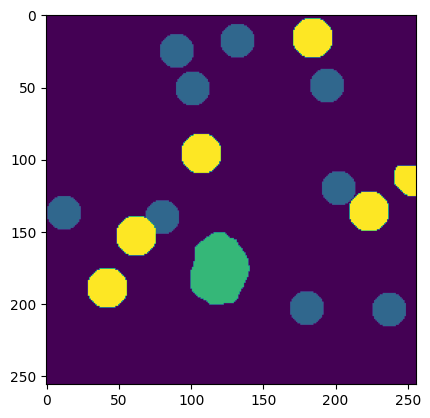

/content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 186.9ms
Speed: 6.2ms preprocess, 186.9ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  965.0 bbox 256
fixed shape for a cell
(190, 193, 213, 216)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 189.4ms
Speed: 6.6ms preprocess, 189.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(218, 19, 245, 54)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 185.4ms
Speed: 6.4ms preprocess, 185.4ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2264.0 bbox 256
fixed shape for a cell
(215, 64, 238, 87)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 186.4ms
Speed: 6.2ms preprocess, 186.4ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(134, 76, 159, 103)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 186.6ms
Speed: 8.3ms preprocess, 186.6ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  988.0 bbox 256
fixed shape for a cell
(233, 137, 256, 160)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 186.5ms
Speed: 6.4ms preprocess, 186.5ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  898.0 bbox 256
fixed shape for a cell
(105, 177, 128, 200)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 185.2ms
Speed: 9.8ms preprocess, 185.2ms inference, 4.8ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(45, 226, 78, 256)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 184.8ms
Speed: 12.8ms preprocess, 184.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2264.0 bbox 256
fixed shape for a cell
(214, 97, 237, 120)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 183.6ms
Speed: 6.2ms preprocess, 183.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(48, 174, 83, 201)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 185.6ms
Speed: 6.2ms preprocess, 185.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  808.0 bbox 256
fixed shape for a cell
(100, 140, 123, 163)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 188.9ms
Speed: 6.8ms preprocess, 188.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  898.0 bbox 256
fixed shape for a cell
(135, 106, 158, 129)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 187.3ms
Speed: 8.6ms preprocess, 187.3ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1014.0 bbox 256
fixed shape for a cell
(129, 32, 152, 55)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 186.8ms
Speed: 6.4ms preprocess, 186.8ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(38, 41, 64, 72)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 183.5ms
Speed: 6.4ms preprocess, 183.5ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 146, 215, 173)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 184.0ms
Speed: 6.3ms preprocess, 184.0ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 179, 36, 223)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 183.9ms
Speed: 6.9ms preprocess, 183.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  2264.0 bbox 576
fixed shape for a cell
(175, 59, 206, 90)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 188.8ms
Speed: 7.1ms preprocess, 188.8ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(188, 0, 222, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 187.6ms
Speed: 6.1ms preprocess, 187.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(0, 130, 49, 171)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 186.9ms
Speed: 6.2ms preprocess, 186.9ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(103, 96, 130, 123)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 188.6ms
Speed: 6.1ms preprocess, 188.6ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(86, 31, 113, 58)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 185.6ms
Speed: 6.8ms preprocess, 185.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(162, 119, 189, 146)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 182.0ms
Speed: 6.1ms preprocess, 182.0ms inference, 5.1ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(145, 192, 172, 219)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 183.1ms
Speed: 7.2ms preprocess, 183.1ms inference, 5.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  7936.0 bbox 400
fixed shape for a cell
(103, 227, 130, 254)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3001.png: 1024x1024 16 objects, 183.5ms
Speed: 7.9ms preprocess, 183.5ms inference, 5.2ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(47, 92, 74, 119)
FINAL MASK!!!


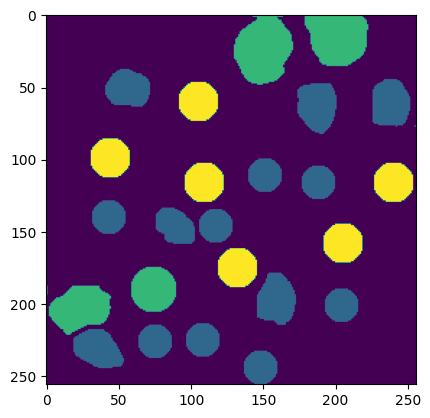

/content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png



image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 183.3ms
Speed: 6.3ms preprocess, 183.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1338.0 bbox 256
fixed shape for a cell
(160, 54, 183, 77)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 186.4ms
Speed: 8.5ms preprocess, 186.4ms inference, 6.4ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  993.0 bbox 256
fixed shape for a cell
(128, 0, 151, 23)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 183.1ms
Speed: 10.0ms preprocess, 183.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  993.0 bbox 256
fixed shape for a cell
(28, 167, 51, 190)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 182.2ms
Speed: 8.4ms preprocess, 182.2ms inference, 4.9ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  891.0 bbox 256
fixed shape for a cell
(48, 76, 71, 99)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 183.3ms
Speed: 7.4ms preprocess, 183.3ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  1136.0 bbox 256
fixed shape for a cell
(74, 164, 97, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 183.0ms
Speed: 6.8ms preprocess, 183.0ms inference, 4.2ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(105, 194, 148, 218)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 183.8ms
Speed: 11.8ms preprocess, 183.8ms inference, 9.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(51, 108, 74, 134)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 187.6ms
Speed: 7.4ms preprocess, 187.6ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  829.0 bbox 256
fixed shape for a cell
(185, 164, 208, 187)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 184.0ms
Speed: 10.8ms preprocess, 184.0ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  929.0 bbox 256
fixed shape for a cell
(191, 86, 214, 109)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 183.5ms
Speed: 8.4ms preprocess, 183.5ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  993.0 bbox 256
fixed shape for a cell
(143, 113, 166, 136)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 184.3ms
Speed: 6.8ms preprocess, 184.3ms inference, 10.5ms postprocess per image at shape (1, 3, 1024, 1024)



obszar na wyznaczonej masce jest zbyt duzy by byc komorka :  993.0 bbox 256
fixed shape for a cell
(171, 199, 194, 222)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 184.8ms
Speed: 6.5ms preprocess, 184.8ms inference, 5.8ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(1, 52, 32, 83)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 185.1ms
Speed: 7.1ms preprocess, 185.1ms inference, 6.0ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(93, 67, 127, 105)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 187.2ms
Speed: 6.6ms preprocess, 187.2ms inference, 4.5ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(3, 8, 30, 35)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 187.1ms
Speed: 6.3ms preprocess, 187.1ms inference, 4.3ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(80, 109, 106, 126)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 182.6ms
Speed: 6.4ms preprocess, 182.6ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(80, 37, 107, 64)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 180.2ms
Speed: 8.4ms preprocess, 180.2ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(57, 18, 84, 45)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 184.7ms
Speed: 5.3ms preprocess, 184.7ms inference, 6.7ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(107, 131, 127, 152)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 189.7ms
Speed: 6.3ms preprocess, 189.7ms inference, 7.1ms postprocess per image at shape (1, 3, 1024, 1024)



mask generated by bbox
(179, 118, 204, 148)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 183.8ms
Speed: 8.5ms preprocess, 183.8ms inference, 4.4ms postprocess per image at shape (1, 3, 1024, 1024)



fixed shape for a cell
(102, 168, 129, 195)


image 1/1 /content/drive/MyDrive/NIO/images/23-1-6__ROI-7__idx-3002.png: 1024x1024 15 objects, 186.2ms
Speed: 6.3ms preprocess, 186.2ms inference, 4.7ms postprocess per image at shape (1, 3, 1024, 1024)


fixed shape for a cell
(126, 34, 153, 61)
FINAL MASK!!!


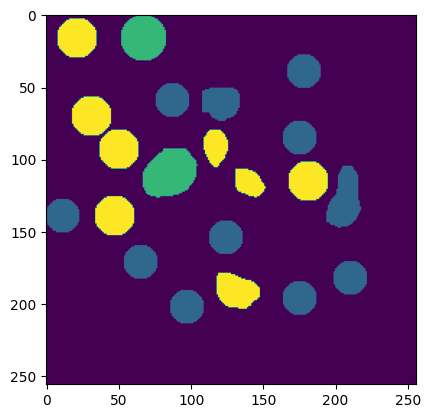

Create category section
Create images and annotations sections for test
/content/drive/MyDrive/NIO/SAM_AL_1903_test.json
Coco annotations are saved
!!!!!!!!!!! DONE !!!!!!!!!!!!!!


In [ ]:
result_image_path = "/content/drive/MyDrive/NIO/results_SAM_AL_1903/" # cross val "/content/drive/MyDrive/NIO/data_no_overlap_2208/5/results_SAM_test/"

path_to_save_res= "/content/drive/MyDrive/NIO/" # cross val "/content/drive/MyDrive/NIO/data_no_overlap_2208/"

dataset = 'test'
coco_file_name = 'SAM_AL_1903' # cross val 'coco_2308_cv_5'
bbox_file_name ="bbox_annotations_data_AL_1903" # cross val "bbox_annotations_data_no_overlap_2308_cv_5"
csv_file= "/content/drive/MyDrive/NIO/annotations.csv" # cross val "/content/drive/MyDrive/NIO/data_no_overlap_2208/annotations_data_no_overlap_2208_cv_5_test.csv"

# read svs
# !! zmienic tu!
df, roi_list = read_points_form_csv_Adam(csv_file)

#df, roi_list = read_points_form_csv(csv_file)

total_id=0
annotations = []
all_bboxes = []

coco_images = []
annotation_id=0
for roi_idd in range (0, len(roi_list)):

  total_id+=1

  points = df[df["roi"]==roi_list[roi_idd]][["px","py","type"]] # read point annotations
  #points.sort_values( by="type", ascending=False,inplace=True ) # sort by cell type (3-other,2,1)
  points[['px', 'py', 'type']] = points[['px', 'py', 'type']].apply(pd.to_numeric)
  points['type'] = pd.Categorical(points['type'], [4, 3, 1, 2])# sort by cell type (4-nie kom, 3-other,1,2)
  points = points.astype({"px": int,"py":int, "type":int})
  points.sort_values("type",inplace=True )
  points = np.array(points) # convert to array

  # dla kazdego ROI/obrazka
  roi_basic_name = roi_list[roi_idd]
  IMAGE_PATH =  f"/content/drive/MyDrive/NIO/images/{roi_basic_name}" # cross val: f"/content/drive/MyDrive/NIO/data_no_overlap_2208/5/test/{roi_basic_name}"
  result_path_mask = result_image_path + roi_basic_name[:-4]+ '_mask.png'

  # read image
  print(IMAGE_PATH)
  image = cv2.imread(IMAGE_PATH)
  image=image[:,:,::-1]# bgr--> rgb
  patch_size=np.shape(image)

  final_mask=np.zeros([patch_size[0],patch_size[1]])


  #coco for image
  coco_image = create_image_annotation(roi_basic_name,int(patch_size[0]),int(patch_size[1]), total_id)
  coco_images.append(coco_image)

  for point in points:
    # check if point in range patch_size[0],patch_size[1], if distance >5pixels- move to the border, else skip that point

    if point[2] not in range(1,4): # jesli klasa obiektu inna niz 1,2,3
      print(point[2])
      continue

    if (point[1]>=patch_size[1] and point[1] <=patch_size[1]+5):
      print('change point value: from : to', point[1], patch_size[1])

      point[1]=patch_size[1]-1

    elif point[1] >patch_size[1]+5:
      print('point out of the patch size', point[1])
      continue # point out of the patch size

    if (point[0]>=patch_size[0] and point[0] <=patch_size[0]+5):
      print('change point value: from : to', point[0], patch_size[0])
      point[0]=patch_size[0]-1

    elif point[0] >patch_size[0]+5:
      print('point out of the patch size', point[0])
      continue # point out of the patch size

    # mask = detect_by_point(IMAGE_PATH, point) # generowanie maski za pomoca punktu

    mask = detect_by_bbox(IMAGE_PATH, point)# generowanie maski za pomoca bbox

    point_value=mask[0,int(point[1]),int(point[0])]

    if  point_value > 0: # jesli wygenerowana maska zawiera wskazany punkt (adnotacje)
      mask_type=1
      print("mask generated by bbox")
      #show_res(IMAGE_PATH,mask,point )

    else:# kom nie zostala wysegmentowana, segmentacja za pomoca fixed circle
        mask_type=2
        mask = detect_by_fixed_circle(image, point,patch_size)
        print('fixed shape for a cell')


    my_mask=mask[0,:,:]

    # add to bbox
    my_bbox = mask_to_bbox(mask)
    minr, minc, maxr, maxc = my_bbox
    all_bboxes.append([roi_basic_name,total_id,minr, minc, maxr, maxc,int(point[2]), mask_type]) # roi_basic_name, total_id, bbox coords (min_row, min_col, max_row, max_col), class, mask_type(1- sam, 2-fixed)

    # TO SHOW BBOX

    #show_bbox(image,my_bbox )

    # add to coco
    polygons, segmentations = create_sub_mask_annotation(my_mask)
    segmentation = [np.array(polygons[0].exterior.coords).ravel().tolist()]
    annotation = create_annotation_format(polygons[0], segmentation, total_id, int(point[2]), annotation_id)
    annotations.append(annotation)
    annotation_id += 1

    # add to final mask
    final_mask[my_mask > 0] = point[2] # rozne wartosci w zaleznosci od klasy


  # show final mask
  print('FINAL MASK!!!')
  plt.imshow(final_mask)
  plt.show()
  plt.imsave(result_path_mask, final_mask)

# save coco annotations
#save_coco_annotations(coco_images,annotations,dataset,coco_file_name)
coco_format = get_coco_json_format( )

# Create category section
category_ids={"Centrocyt":1,"Centroblast":2, "Inne":3  }
coco_format["categories"] = create_category_annotation(category_ids)

print('Create category section')

# Create images and annotations sections for test
coco_format["images"]=coco_images
coco_format["annotations"]=annotations
print('Create images and annotations sections for test')

json_file=path_to_save_res+coco_file_name+'_'+dataset+'.json'
print(json_file)
with open(json_file,"w") as outfile:
  json.dump(coco_format, outfile)

print('Coco annotations are saved')


# save bboxes as csv
header = ['roi_basic_name', 'total_id','min_row', 'min_col', 'max_row', 'max_col', 'type', 'mask_type']
csv_file= path_to_save_res+bbox_file_name+'_'+dataset+'.csv'

with open(csv_file, 'w', encoding='UTF8', newline='') as f:
  writer = csv.writer(f)

  # write the header
  writer.writerow(header)

  # write multiple rows
  writer.writerows(all_bboxes)

print('!!!!!!!!!!! DONE !!!!!!!!!!!!!!')

**DONE:**

In [ ]:
  radius=[8,12,10]# kom sa roznych rozmiarow
  mask2 = np.zeros([1,256,256])
  radius_value = radius[int(point[2])-1] # wybierz rozmiar promienia dla typu komorki
  default_box = {'x': point[0]-radius_value, 'y': point[1]-radius_value, 'width': radius_value*2, 'height': radius_value*2, 'label': ''}
  box = default_box# widget.bboxes[0] if widget.bboxes else default_box
  box = [
      box['x'],
      box['y'],
      box['x'] + box['width'],
      box['y'] + box['height']
  ]

  results = fast_sam(
      source=IMAGE_PATH,
      device=DEVICE,
      retina_masks=True,
      imgsz=1024,
      conf=0.3,
      iou=0.5)

NameError: name 'np' is not defined

In [ ]:
mask=[]

In [ ]:
len(mask)

0